# Certificate in Data Science | Milestone 2 |  
- Hypothesis Simulation 

> University of Washington  
> October 2019  
> N. HICKS

# Instructions

Milestone 2 focuses on Unit 2 of the course.  
You will apply what you have learned about statistical analysis and hypothesis testing ***to the data and the problem you have selected***.

> For Milestone 2 you should:  
> - Explore the dataset supported by charts and summary statistics.
> - Identify a likely distribution for several of the feature.
> - Compute basic summary statistics by both classical, bootstrap, and Bayesian methods.
> - Compute confidence intervals for the above summary statistics by classical, bootstrap, and Bayesian methods.
> - Leverage confidence intervals in performing hypothesis tests to determine if the differences in pairs and multiple populations are significant.


Note:  
Please clearly outline the results with markdown text. Be sure your discussion includes narrative for your figures and tables so it is clear to the reader the importance of each bit of evidence.

# Retrieve and Clean the Dataset

## Import Libraries

In [1]:
# Load necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import warnings
import sys
import qgrid
from sklearn import preprocessing
from statistics import mean
import scipy
import scipy.stats as ss
import statsmodels.stats.weightstats as ws
from statsmodels.stats.multicomp import pairwise_tukeyhsd

## Functions for Scripting

In [2]:
# establish a new calculated feature: the Log of Auto Price, per this assignment requirement 1
def logFeature(df, feature):
    for item in feature:
        logList = np.log(df[item])
        locPrice = df.columns.get_loc(item)
        name = 'log_' + item
        df.insert(loc=locPrice+1, column=name, value=logList)
    return df


# retrieve the prescribed dataset
def fetch_data(file):
    try:
        # import the file to a dataframe
        _df = pd.read_csv(file)
        print('REMOTE FILE USED')
    except:
        # Local Copy -- Link would not permit access
        file = 'C://Users//NateDogg//Desktop//_notebooks//kc_house_data.csv'
        print('LOCAL FILE USED; REMOTE SERVER NOT REACHABLE\n--> [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed (_ssl.c:590)')
        # import the file to a dataframe
        _df = pd.read_csv(file)
        
    # establish data types of the specified features
    _df = set_Features(_df)
    
    # Derive log scales of the specified features: 'price'
    _df = logFeature(_df, ['price'])
    
    return _df


# supress warnings
def supressWarnings():
    if not sys.warnoptions:
        warnings.simplefilter("ignore")


# return a qGrid dataframe based on specified columns/features
def get_qGrid(df, features):
#     temp_df = pd.DataFrame(df[features[0]])
#     features.remove(features[0])
    temp_df = pd.DataFrame()
    for feature in features:
        temp_df = pd.concat([temp_df, df[feature]], axis=1)
    qGrid = qgrid.show_grid(temp_df)
    return qGrid


# Establish data types for the specified features
def set_Features(df):
    # change the data type from 'float' to 'int', for improving data visualization
    df['price'] = df['price'].astype('int64')
    # change the data typpe from 'object' to 'date/time'
    df['date'] = pd.to_datetime(df['date'])
    return df

## Import & Describe DataFrame  
> - Locate and import the source data to a dataframe.

In [3]:
%matplotlib inline
figArea = (18, 10)   # width, height of the resulting plots
sns.set()

In [4]:
# Negate the UserWarnings notifications
supressWarnings()

# Cleaned up Dataset location
filename = 'https://library.startlearninglabs.uw.edu//DATASCI410//Datasets//kc_house_data.csv'
housing_df = fetch_data(filename)

LOCAL FILE USED; REMOTE SERVER NOT REACHABLE
--> [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed (_ssl.c:590)


## Missing Values & Data Types  
> - Dataset is established with no text values nor NaN values.
> - Data types are handled during file import.
> - Dataset feature 'log_price' is established.

In [5]:
colNames = housing_df.columns
housing_qGrid = get_qGrid(housing_df, colNames)
housing_qGrid

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

In [6]:
# provide information of the dataset features
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 22 columns):
id               21613 non-null int64
date             21613 non-null datetime64[ns]
price            21613 non-null int64
log_price        21613 non-null float64
bedrooms         21613 non-null int64
bathrooms        21613 non-null float64
sqft_living      21613 non-null int64
sqft_lot         21613 non-null int64
floors           21613 non-null float64
waterfront       21613 non-null int64
view             21613 non-null int64
condition        21613 non-null int64
grade            21613 non-null int64
sqft_above       21613 non-null int64
sqft_basement    21613 non-null int64
yr_built         21613 non-null int64
yr_renovated     21613 non-null int64
zipcode          21613 non-null int64
lat              21613 non-null float64
long             21613 non-null float64
sqft_living15    21613 non-null int64
sqft_lot15       21613 non-null int64
dtypes: datetime64[ns](1), float64(5

In [7]:
# establish classical statistics for the dataset
housing_df.describe()

,id,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,13.047817,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,...,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.526685,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,...,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,11.225243,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,...,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,12.682152,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,...,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,13.017003,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,...,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,13.377006,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,...,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,15.856731,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,...,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


# Review of Prior Works  
> - Establish a review of prior works accomplished  
>   (REF: Milestone 1 - Data Visualization Complementary Views)

## Functions for Scripting

In [8]:
# show distribution characteristics of the dataset
# Method uses plt.boxplot()
def make_BoxPlot(df, features, figArea, flag):
    fig = plt.figure(figsize=figArea)  # Define plot area
    ax = fig.gca()  # Define axis
    
    # set the boxplot marker specification
    markerType = dict(marker='s', markeredgecolor='black',
                      markerfacecolor='g', markersize=6)

    df.loc[:, features].boxplot(flierprops=markerType, ax=ax)
    ax.set_ylabel('Frequency\n', fontsize=16)
    if flag == 0:
        ax.set_xlabel('\nHome Features', fontsize=16)
        ax.set_title('Box Plots of Standard Home Features\n', fontsize=16)
    elif flag == 1:
        ax.set_xlabel('\nNormalized Home Features', fontsize=16)
        ax.set_title('Box Plots of Normalized Home Features\n', fontsize=16)

    plt.xticks(rotation=45)
    plt.show()


# Normalize a specified feature column
# returns an np.array
def get_normFeature(pdSeries):
    x_array = np.array(pdSeries)
    normalized_X = preprocessing.normalize([x_array])
    return normalized_X


# return a pair plot correlation matrix
def get_PairPlot(df, labels):
    fig = plt.figure(figsize=figArea) # Define plot area
#     ax = fig.gca() # Define axis
    _df = pd.DataFrame()
    
    # select the specified number of datapoints from the primary dataframe
    for x in range(500):
        _df = _df.append(df.loc[x, labels])
    sns.pairplot(_df, hue="view", palette="coolwarm", diag_kind="kde",
                 height=2, aspect=1).map_upper(sns.kdeplot, cmap="Blues")
    plt.suptitle('Correlation Matrix of Various Normalized Home Features', fontsize=16)

    plt.show()

## Visualizations  
> - Normalize the dataset features.  
> - For the longitude feature, establish absolute values to force positive normalized magnitudes.
> - Return a boxplot of the normalized features to compare.

### Box Plots

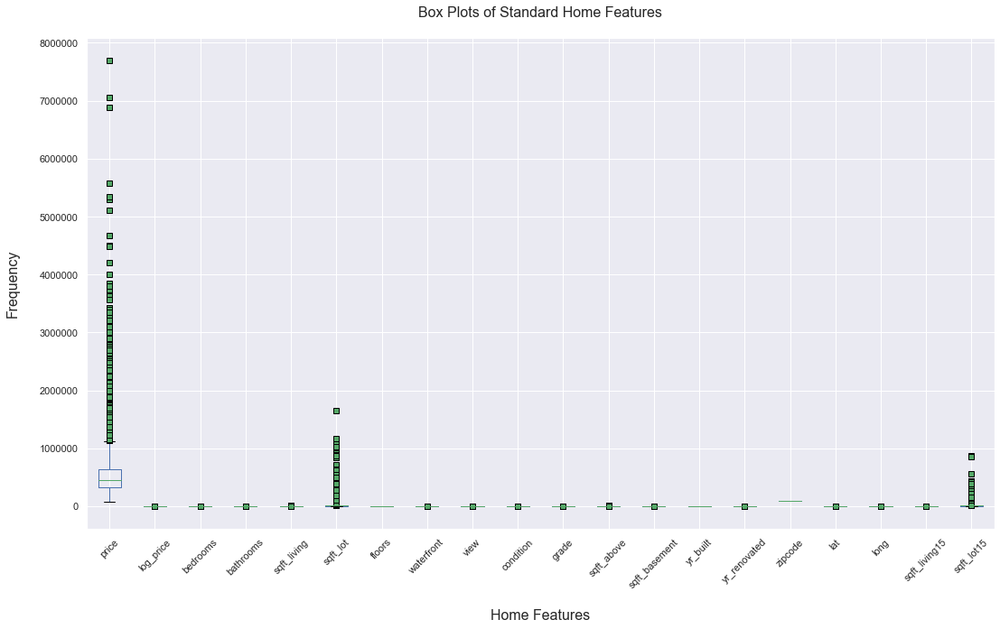

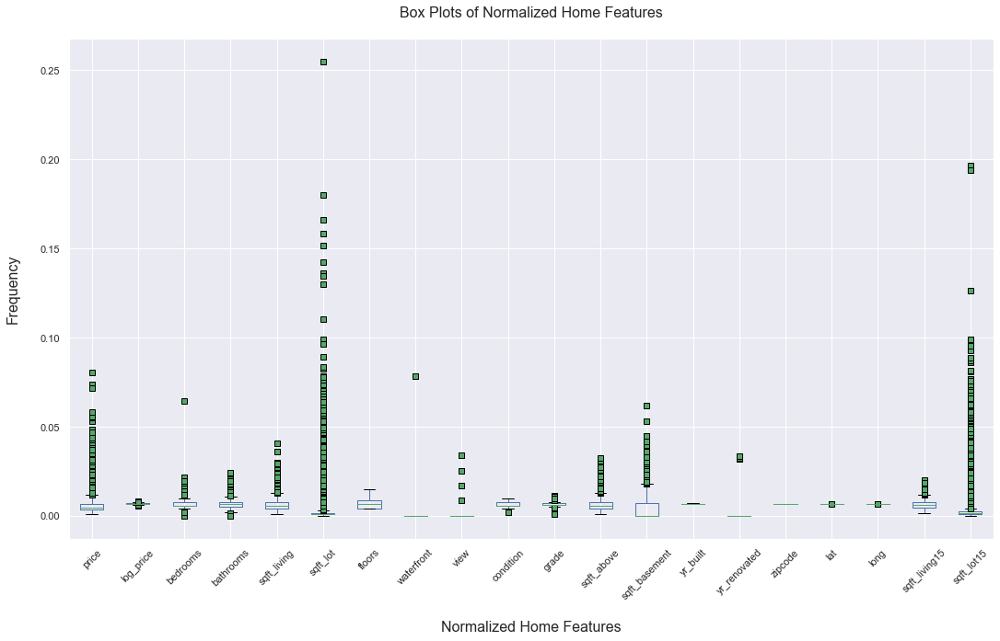

In [9]:
features_A = ["price", 'log_price', "bedrooms", "bathrooms", "sqft_living", "sqft_lot", "floors", "waterfront", "view",
              "condition", "grade", "sqft_above", "sqft_basement", "yr_built", "yr_renovated", 'zipcode',
              "lat", "long", "sqft_living15", "sqft_lot15"]

# show distribution characteristics of the dataset
# prior to normalizing the plotted features
make_BoxPlot(housing_df, features_A, figArea, 0)

# normalize the specified features within the dataframe
# establish a second dataframe for normalized values
housingNorm_df = housing_df.copy(deep=True)
for feature in features_A:
    housingNorm_df[feature] = get_normFeature(housingNorm_df[feature])[0]
housingNorm_df['long'] = np.abs(housingNorm_df['long'])

# show distribution characteristics of the dataset
# after  normalizing the plotted features
make_BoxPlot(housingNorm_df, features_A, figArea, 1)

In [10]:
# verify the normalized dataframe results
colNames = housingNorm_df.columns
housingNorm_qGrid = get_qGrid(housingNorm_df, colNames)
housingNorm_qGrid

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

> - Observe that several of the housing features are without (significant) upper-outliers:  
>        - waterfront  
>        - yr_built
>        - yr_renovated
>        - zipcode
>        - lat
>        - long
> - This observation suggests that the expected model selection for this assignment may not be as reliable for these features.

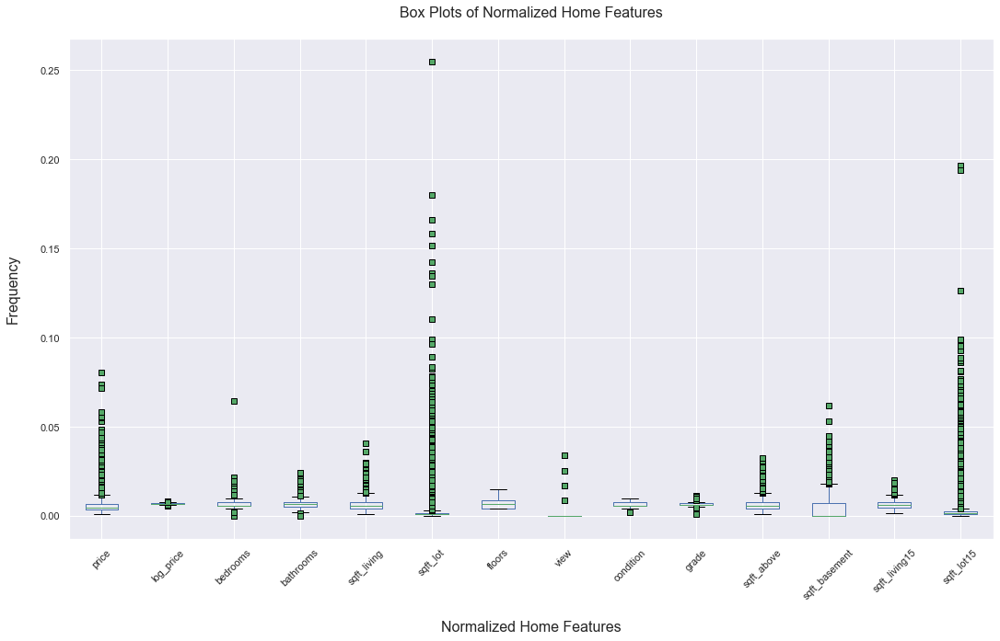

In [11]:
# neglect the previously stated exceptions for the next box plot
features_B = ['price', 'log_price', "bedrooms", "bathrooms", "sqft_living", "sqft_lot", "floors", "view",
              "condition", "grade", "sqft_above", "sqft_basement", "sqft_living15", "sqft_lot15"]

# show distribution characteristics of the dataset
# after  normalizing the plotted features
make_BoxPlot(housingNorm_df, features_B, figArea, 1)

> From the prior works accomplished upon the Housing dataset presented once again here, per assignment Milestone 01, various other categories of this datasets features are derived that support this continued effort:  
>     - Housing Score  
>     - Home Condition  
>     - Number of Bedrooms  
>     - Square Footage  
>     - Number of Bathrooms  
>     - Number of Floors  
>     - Zip Code  
> Such box plots all reflect positive magnitudes within the datasets features, all with a distribution of outliers in the same positive manner.

### Pair Plot (Correlations)

<Figure size 1296x720 with 0 Axes>

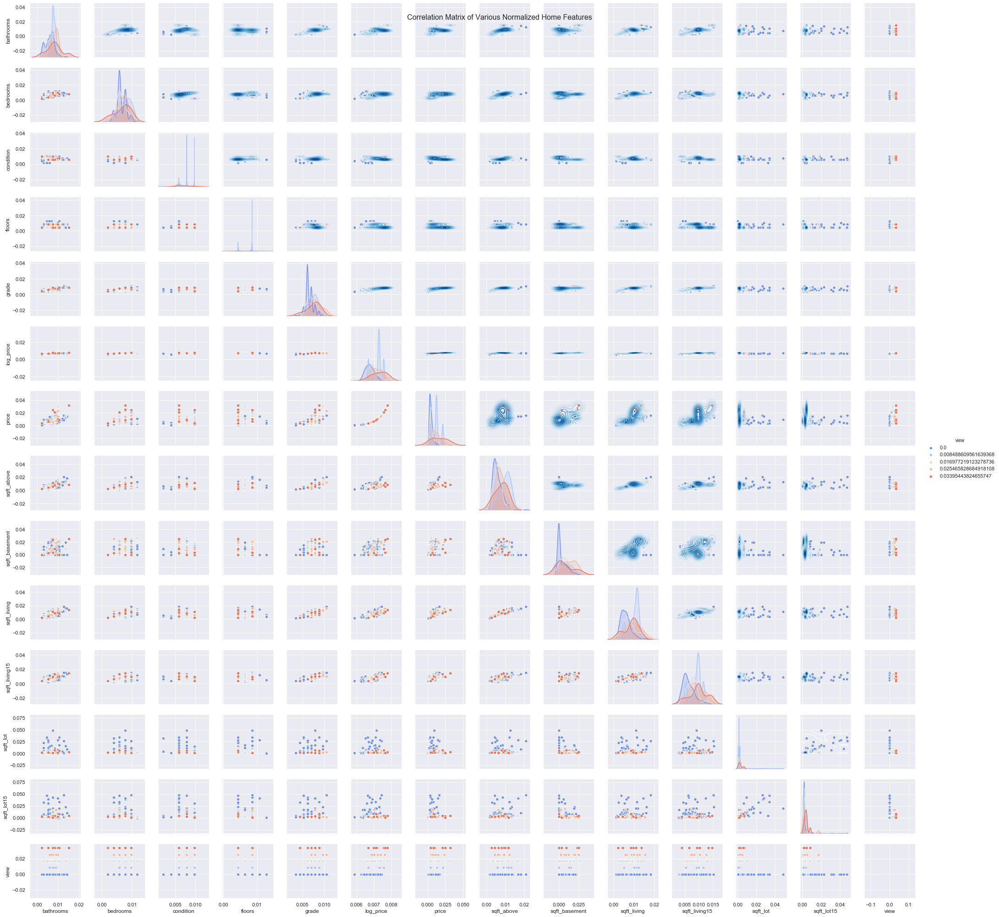

In [12]:
# Gain initial visualization insight to the correlations within the dataset
get_PairPlot(housingNorm_df, features_B)

> - Equally, from the prior Milestone 1 assignment, several Facet Plots were established to further show the breakdown of various feature categories.  

# Current Works

## Functions for Scripting

In [13]:
# return a histogram plot of the specified format
def hist_plot(vec, bins):
    plt.hist(vec, bins = bins)
    plt.axvline(mean(vec), color = 'red')
    plt.ylabel('Frequency')
    plt.xlabel('Value')


# plot a comparison of 2 histogram populations
def plot_pop(a, b, flag, cols=['pop_A', 'pop_B'], nbins = 50):
    minx = min([min(a), min(b)])
    maxx = max([max(a), max(b)])
    stepx = (maxx - minx)/(nbins + 1)
    bins = [minx + i * stepx for i in range(nbins + 1)]
    # change the figure dimensions
    plt.figure(figsize=figArea)
    plt.subplot(2, 1, 1) # The first plot
    plt.xlim(minx, maxx/3)
    hist_plot(a, bins)
    if flag == 0:
        plt.title('Histograms of Standard Housing Features: ' + cols[0] + ' and ' + cols[1], fontsize='14')
    elif flag == 1:
        plt.title('Histograms of Normalized Housing Features: ' + cols[0] + ' and ' + cols[1], fontsize='14')
    plt.subplot(2, 1, 2) # The next plot
    plt.xlim(minx, maxx/3)
    hist_plot(b, bins)
    
    plt.show()
    
    
# establish a heatmap plot as a correlation matrix
def get_Heatmap(df):
    corr = housingNorm_df.corr()
    plt.figure(figsize=figArea)
    ax = sns.heatmap(
        corr, 
        vmin=-1, vmax=1, center=0,
        cmap='coolwarm',
        square=True
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=75,
        horizontalalignment='right'
    )
    ax.set_title('Heatmap of Housing Feature Correlations\n', fontsize='14')

## Histogram Plots

### Feature: price vs. log-price
> Show if the population of 'price' is statistically significant to 'log_price'.  
> - The latter (normalized) histogram results show that the means of each  population are very near each other, although, this does not yet determine if the null hypothesis can be rejected or not.  
> - In section 'Hypothesis Testing: 'Price' va. 'Log Price'' of this documen, below, the t-Test shows the null hypothesis is rejected, and thus the 'log_price' feature is useful for use during this analysis.

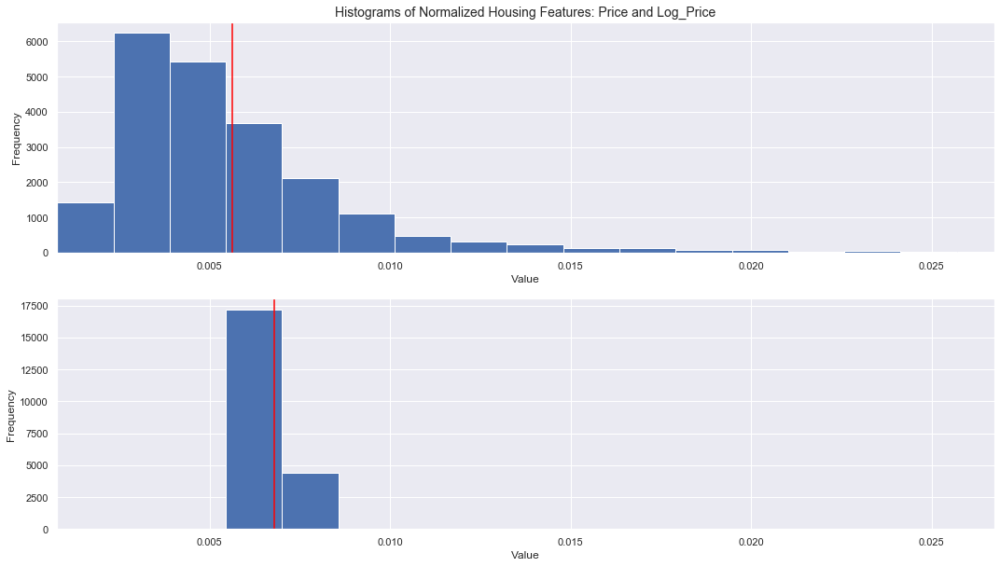

In [14]:
# show the population of the PRICE and LOG_PRICE features, along with mean population value
pop_A = housingNorm_df['price']
pop_B = housingNorm_df['log_price']

# plot histograms using normalized data
plot_pop(pop_A, pop_B, 1, cols=['Price', 'Log_Price'])

### Feature: price vs. *
> Show the various remaining aspects of the housing dataset features.

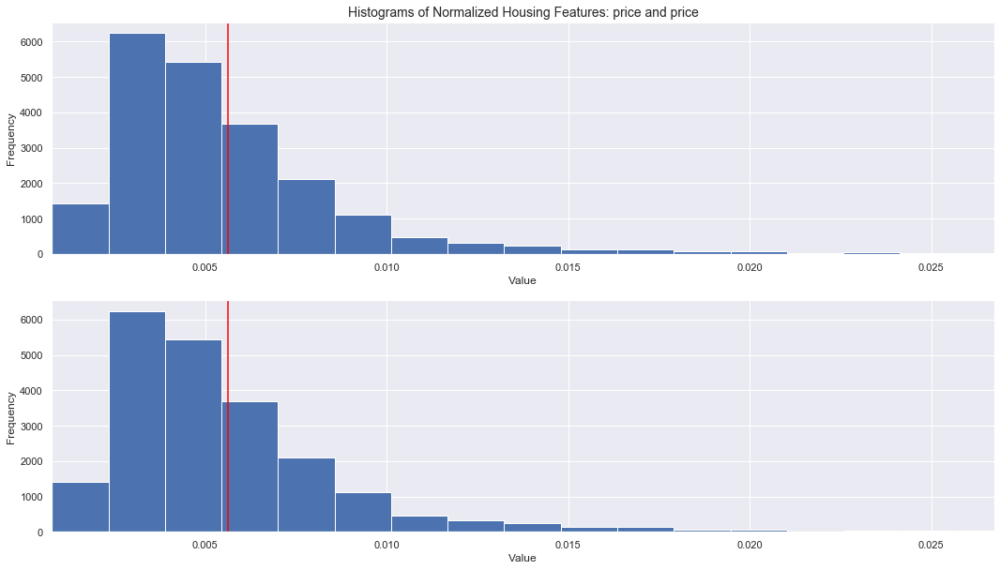

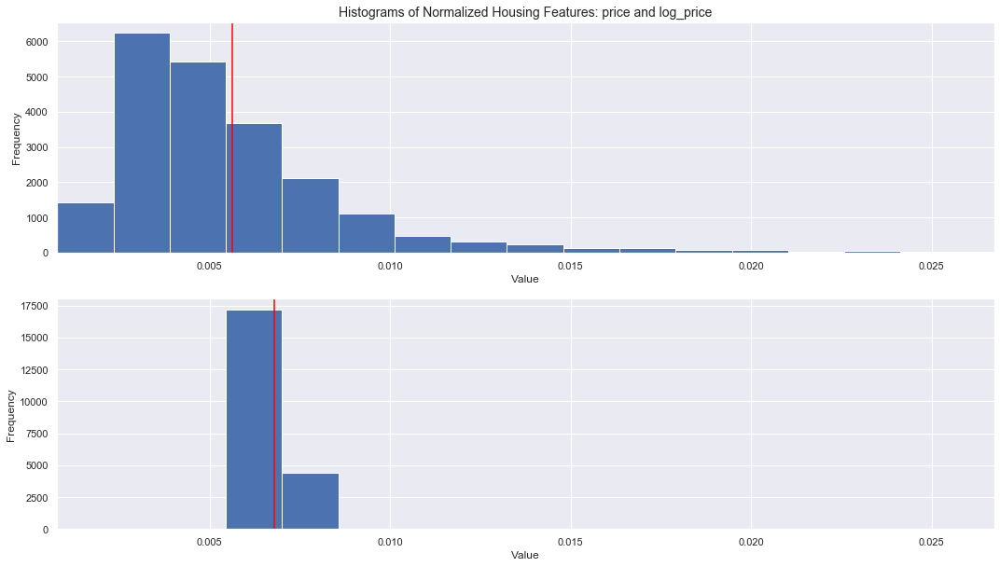

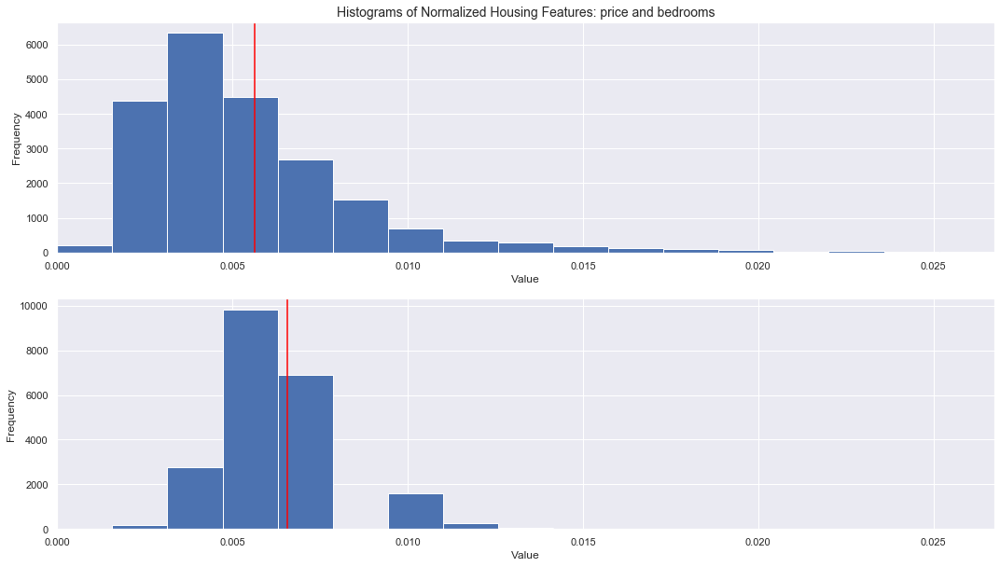

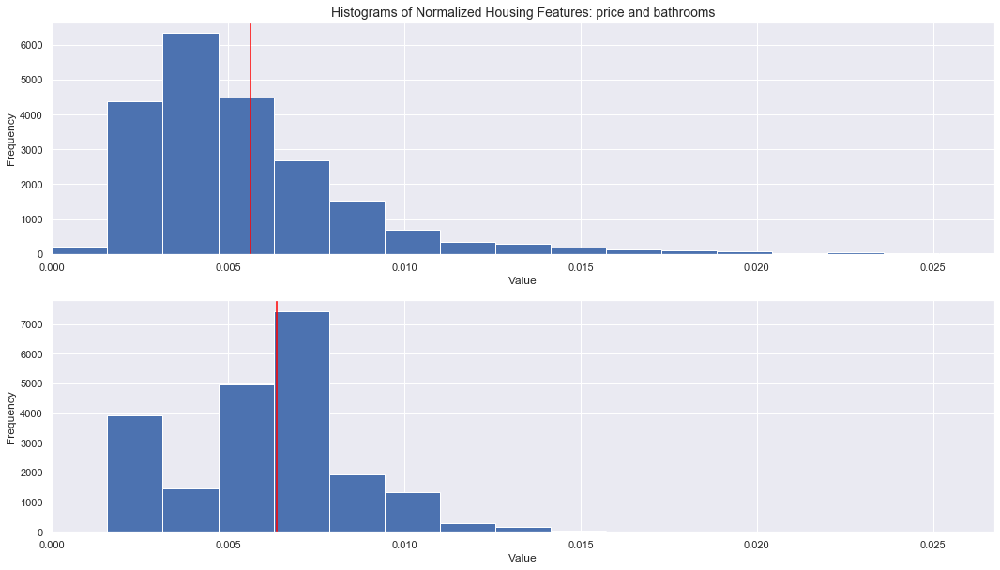

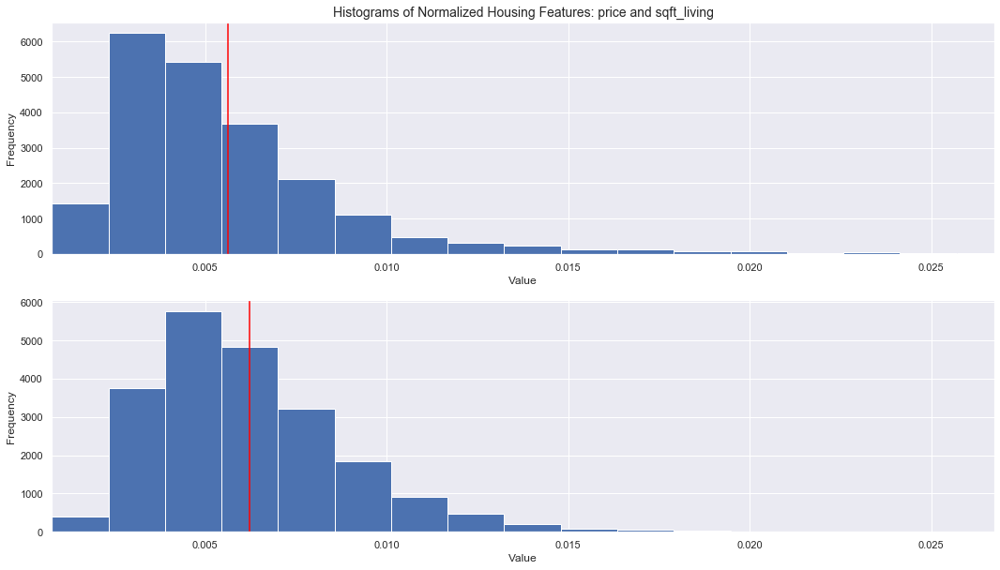

...

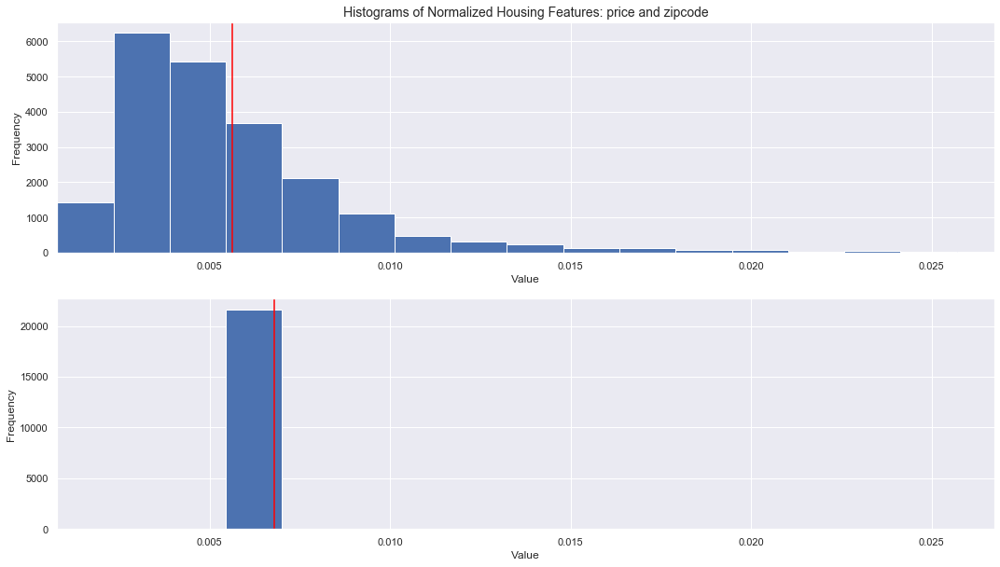

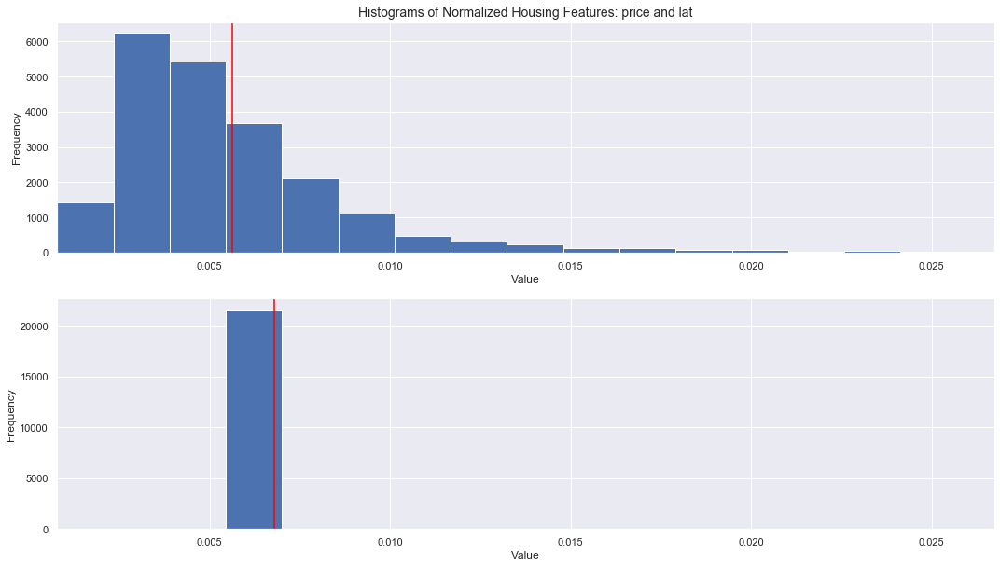

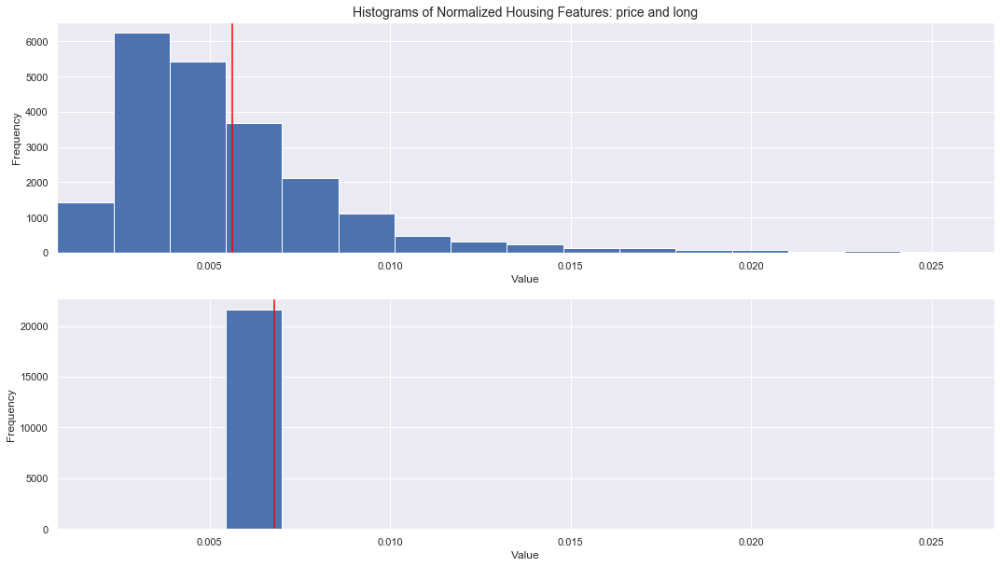

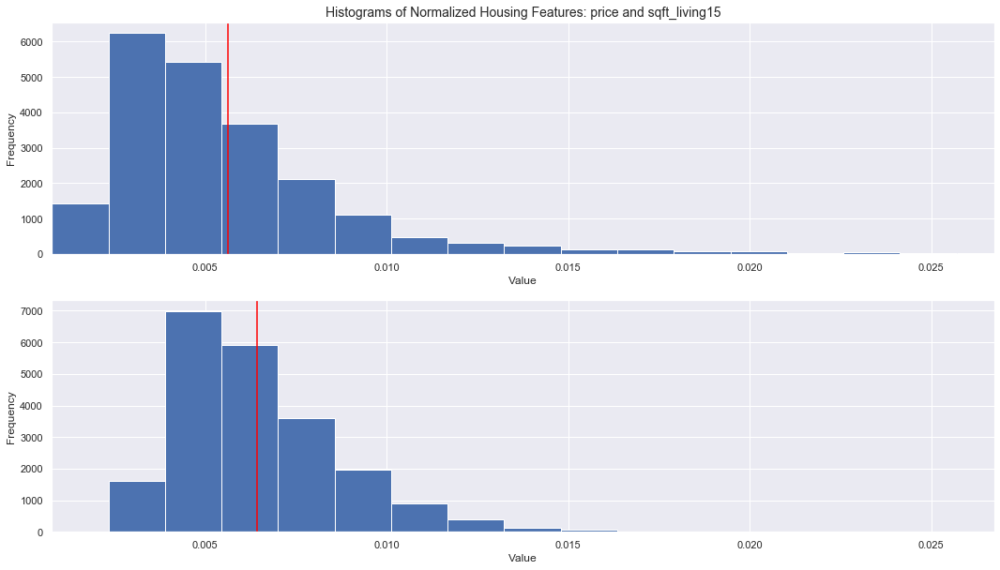

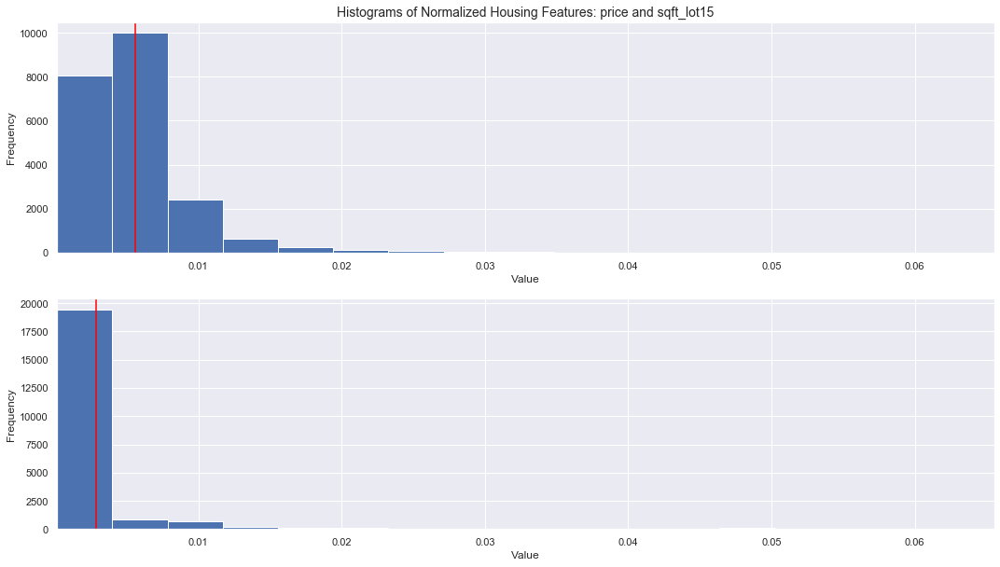

In [15]:
# show the population of the PRICE and LOG_PRICE features, along with mean population value
featured = 'price'
pop_A = housingNorm_df[featured]

# plot histograms using normalized data
for item in features_A:
    pop_B = housingNorm_df[item]
    plot_pop(pop_A, pop_B, 1, cols=[featured, item])

### Feature: sqft_living

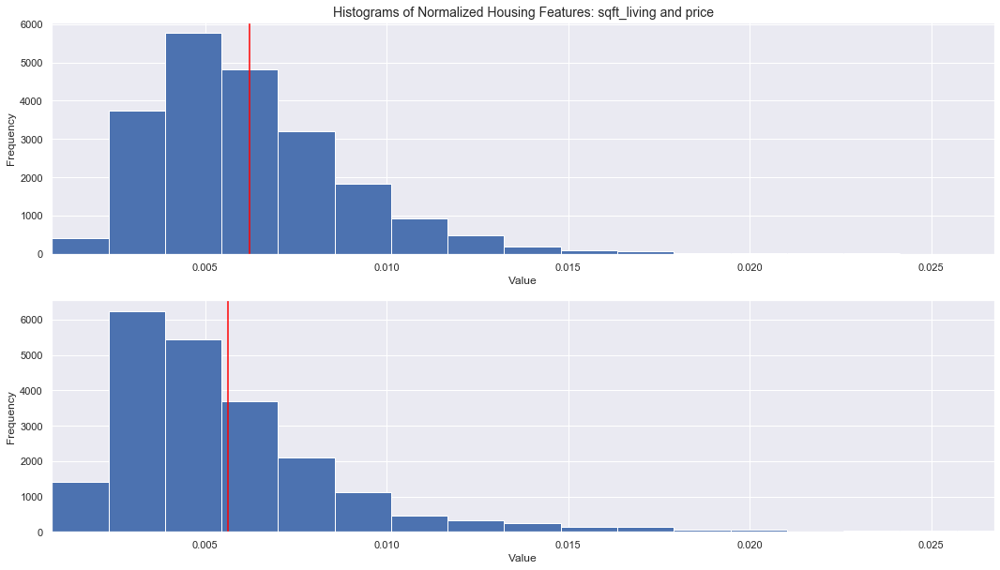

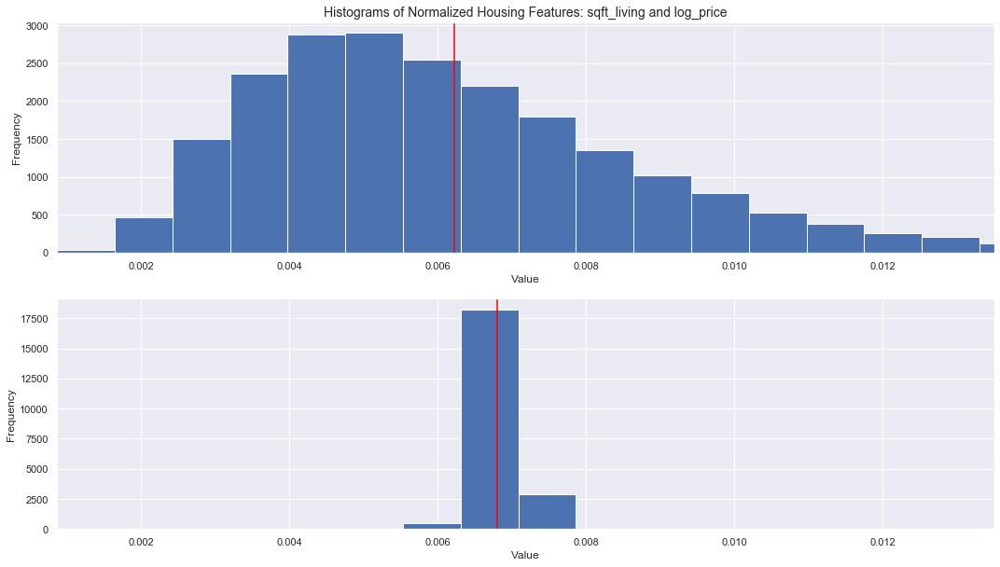

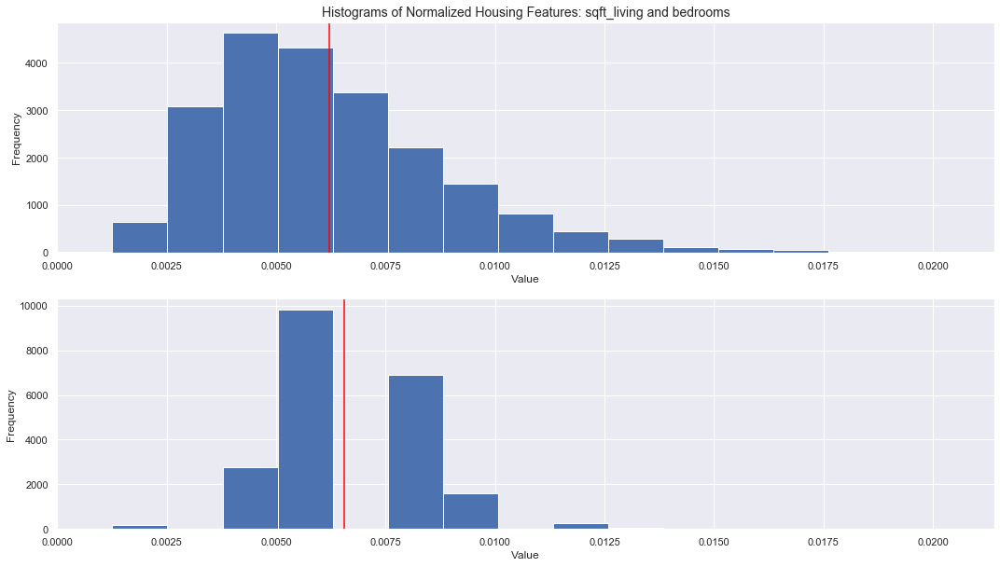

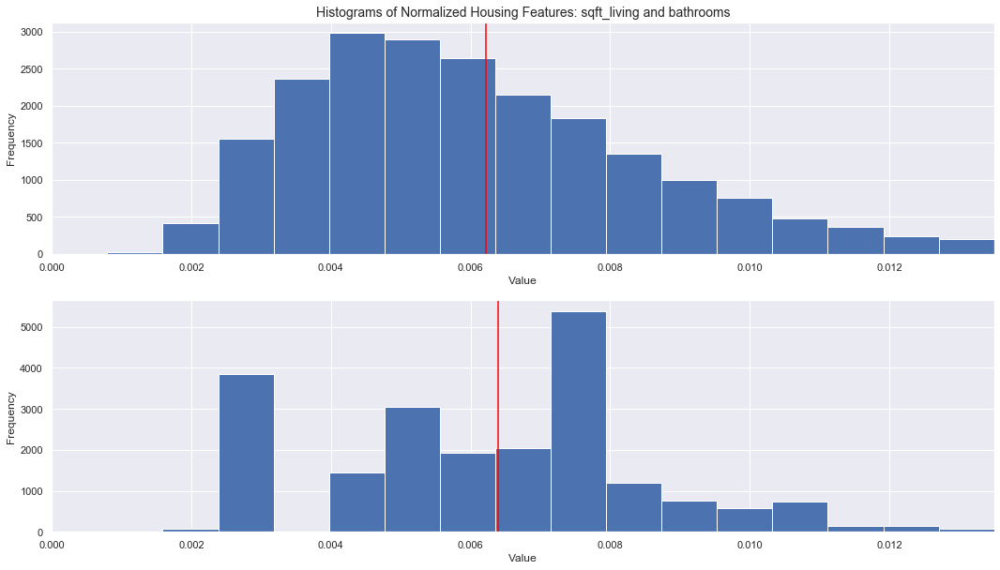

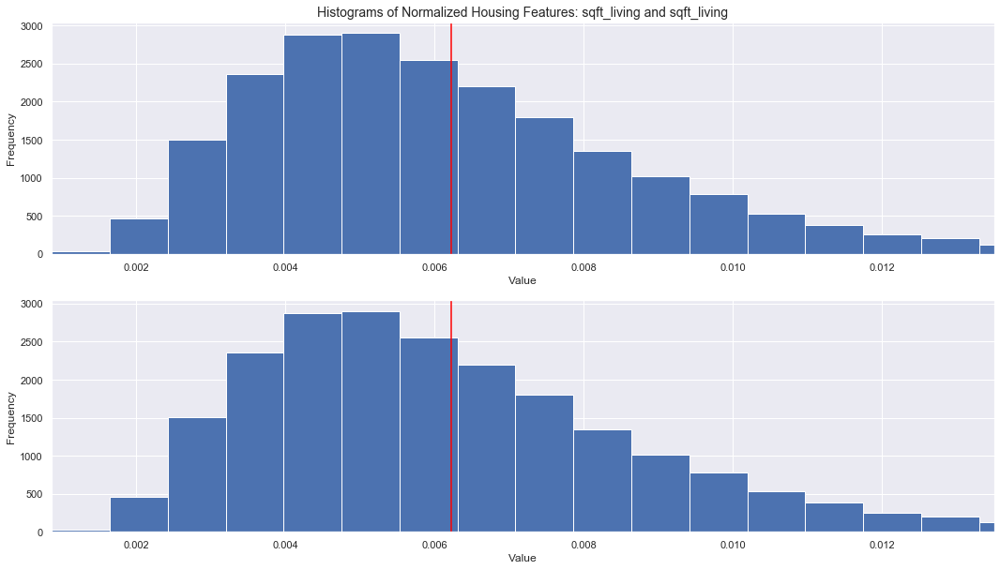

...

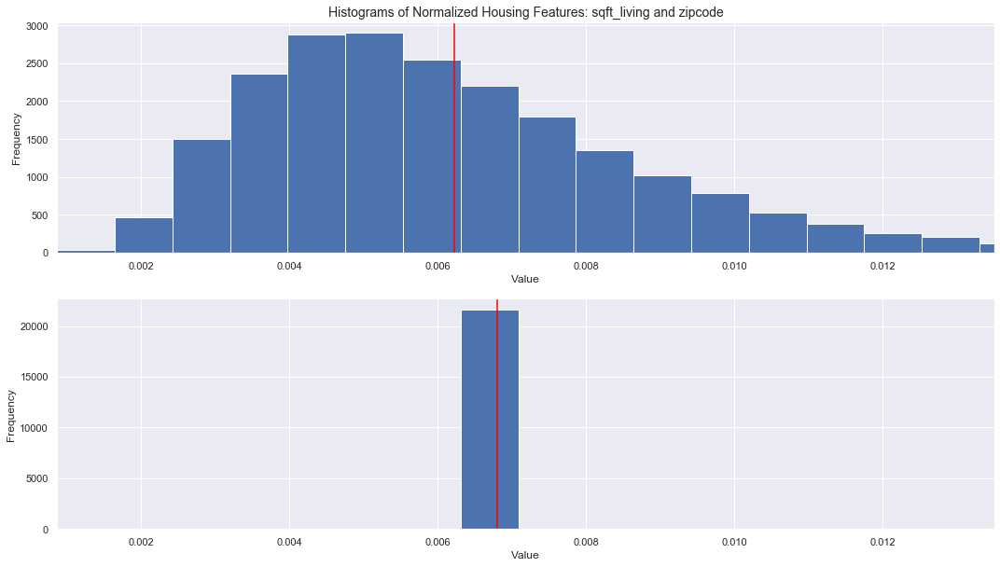

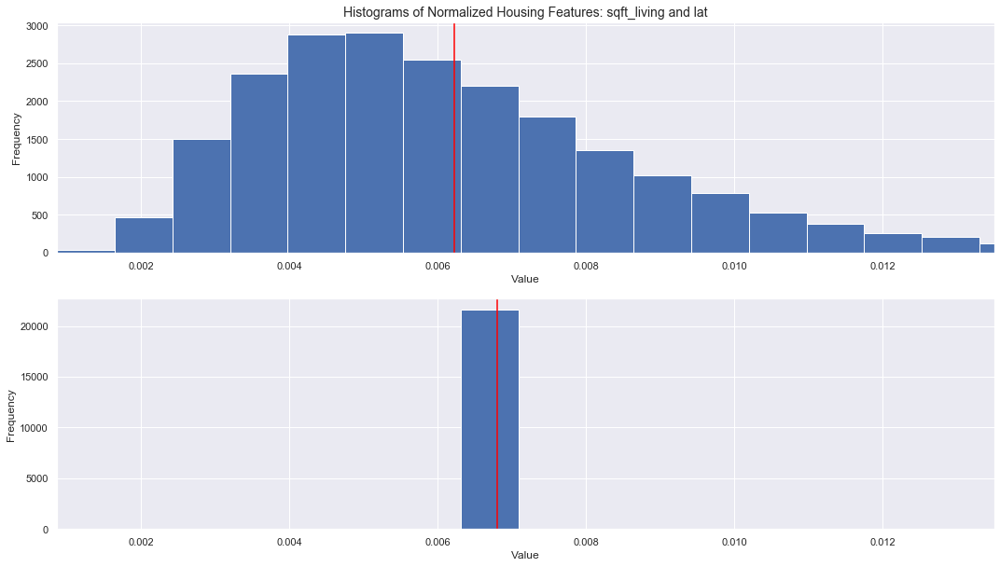

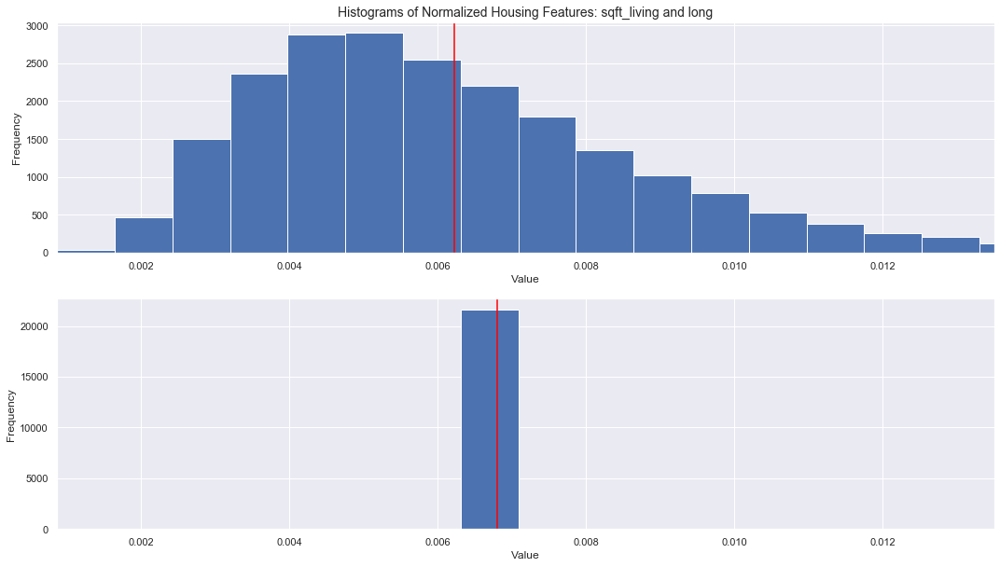

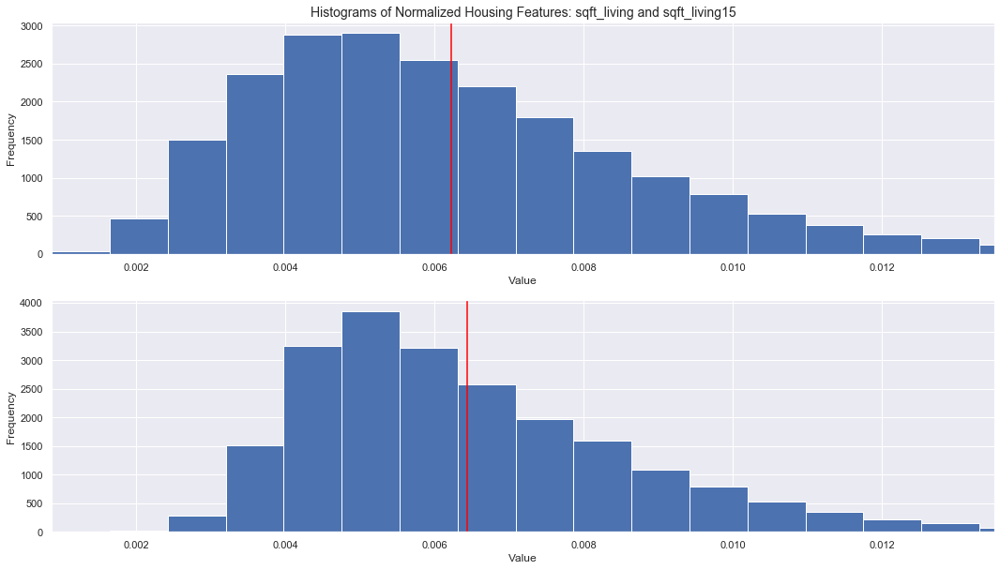

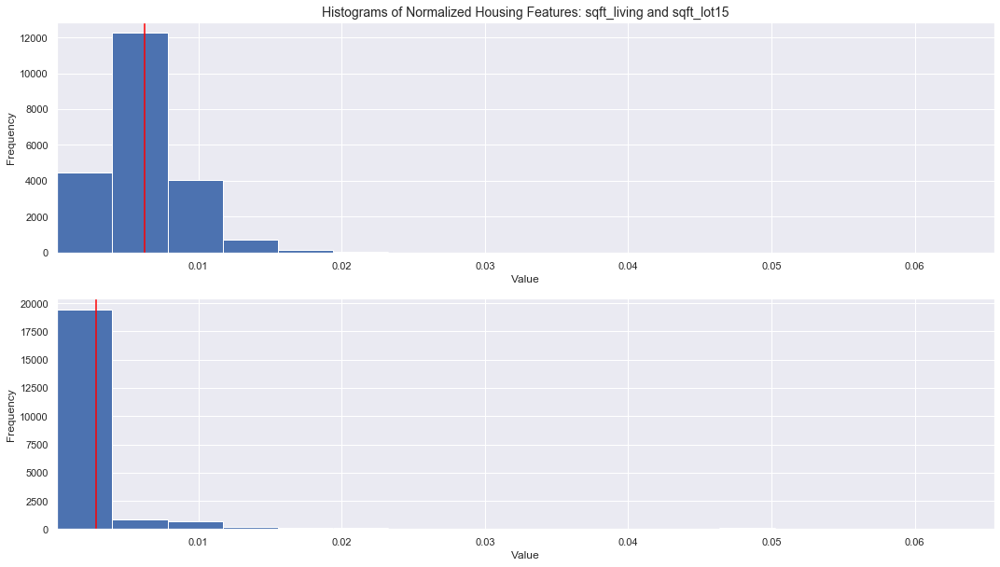

In [16]:
# show the population of the PRICE and LOG_PRICE features, along with mean population value
featured = 'sqft_living'
pop_A = housingNorm_df[featured]

# plot histograms using normalized data
for item in features_A:
    pop_B = housingNorm_df[item]
    plot_pop(pop_A, pop_B, 1, cols=[featured, item])

### Feature: bathrooms

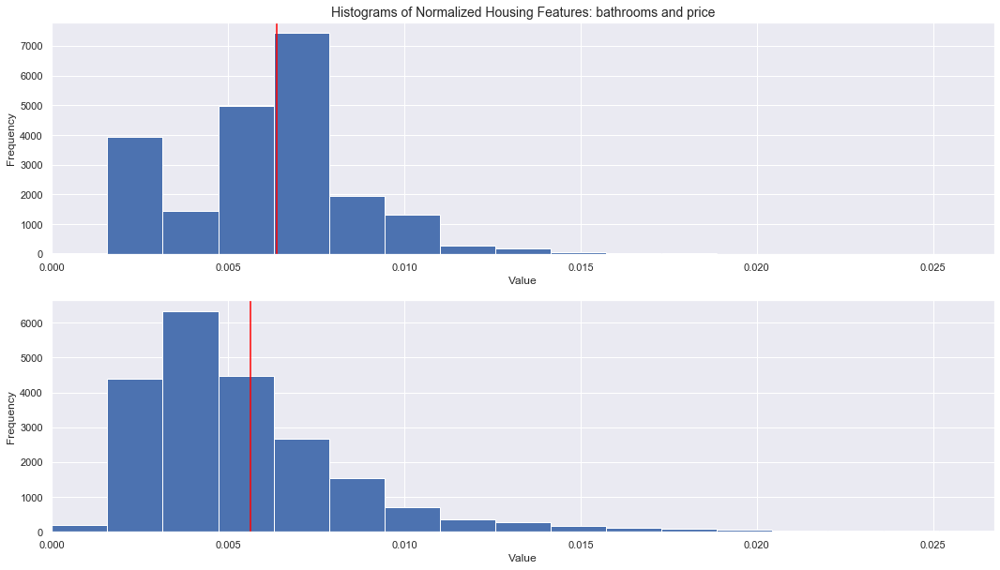

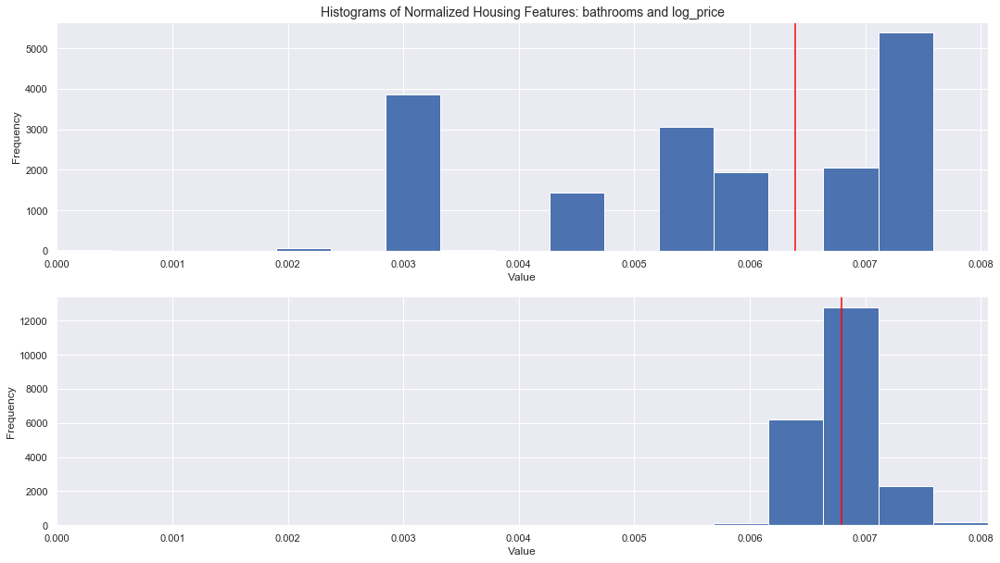

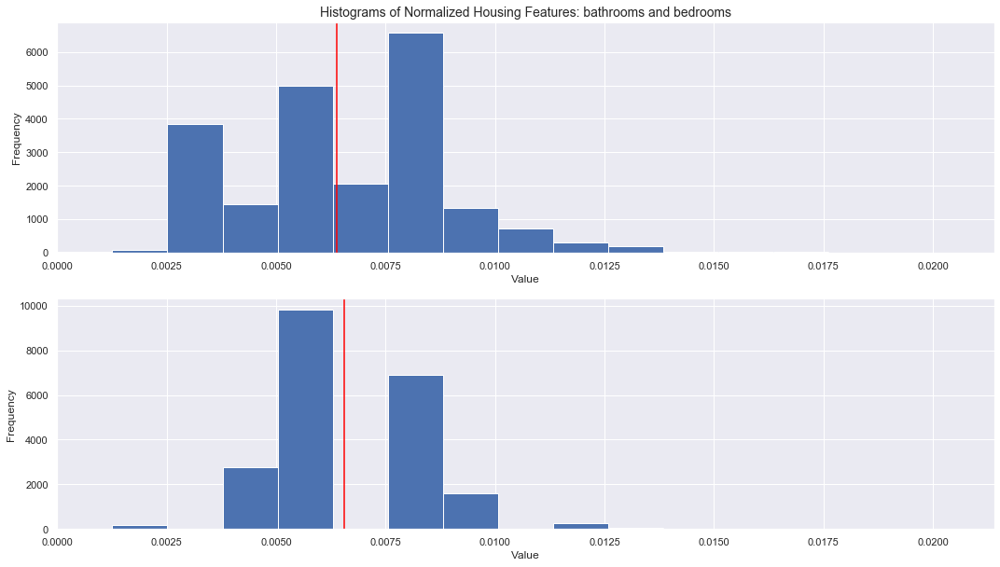

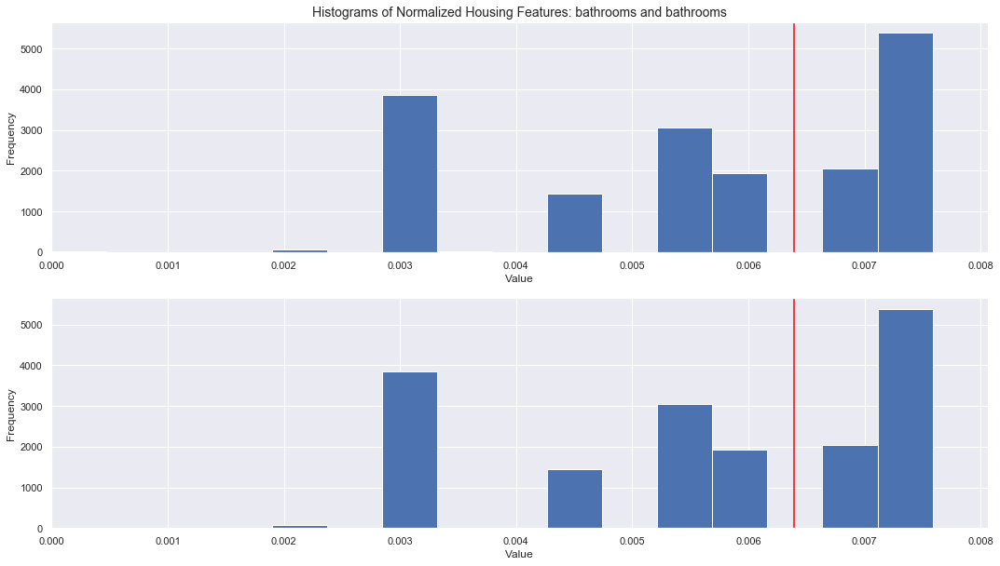

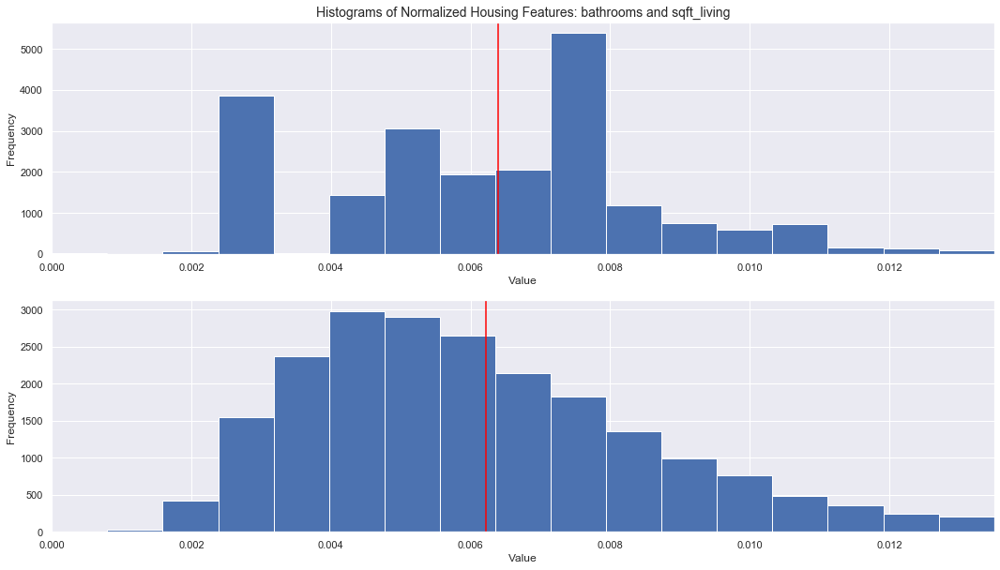

...

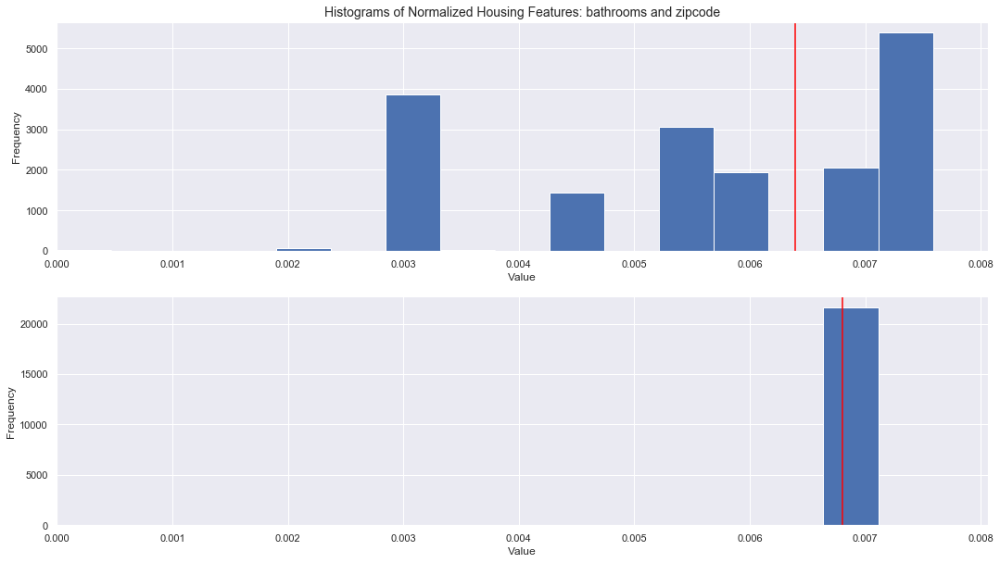

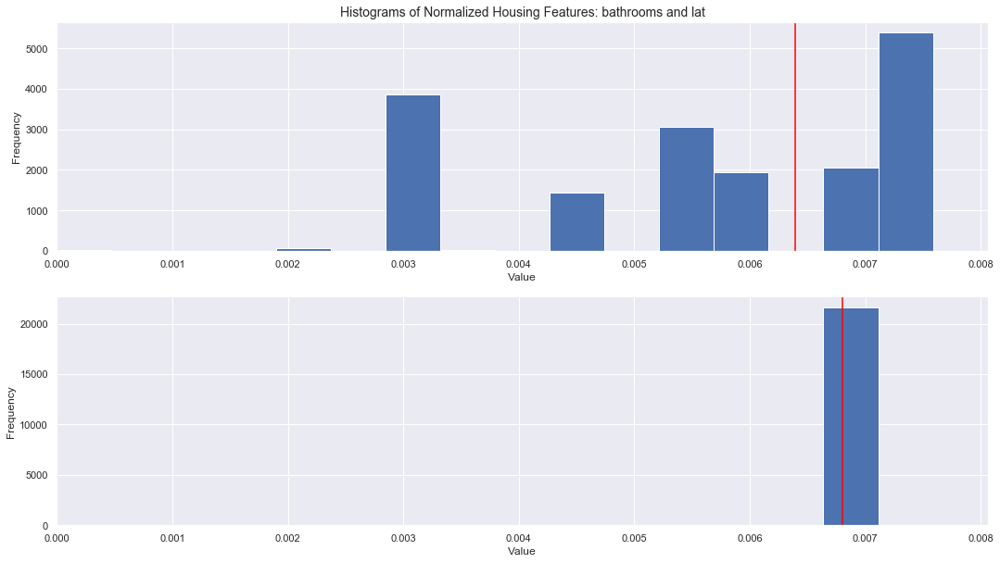

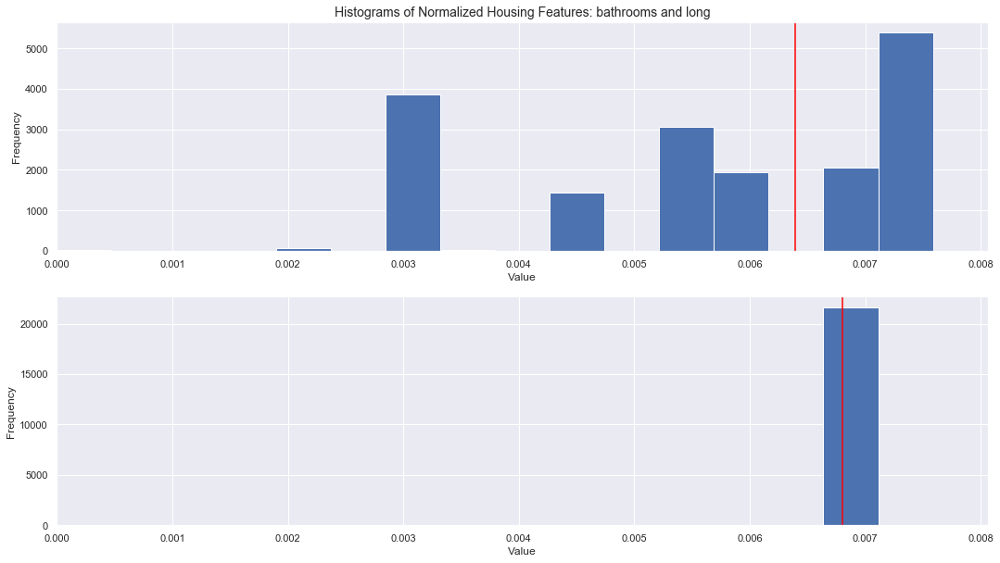

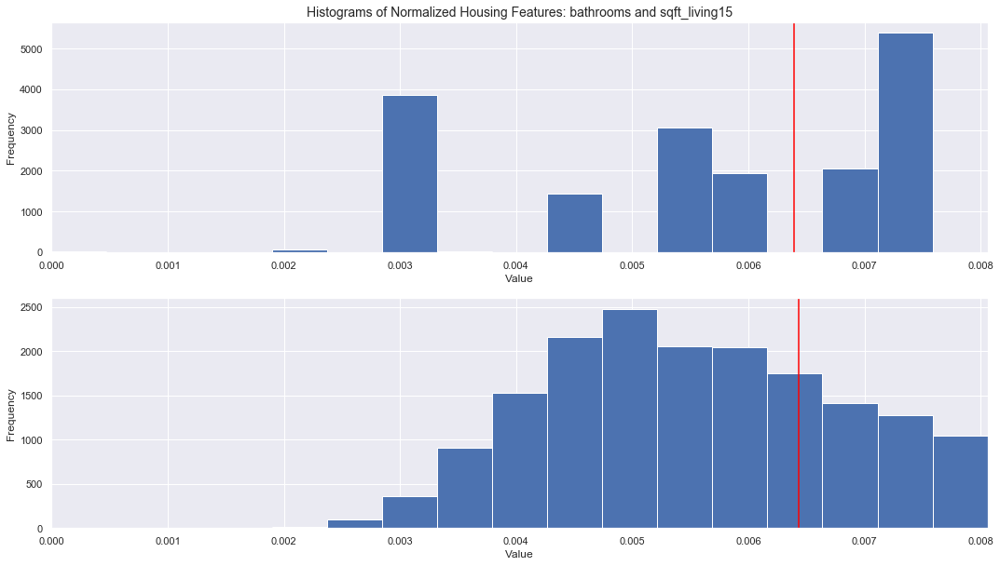

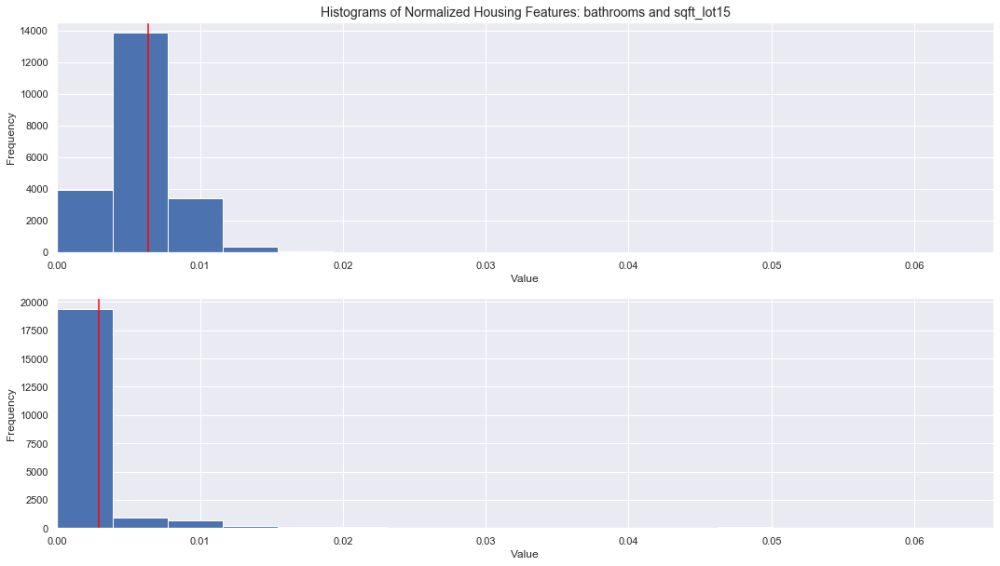

In [17]:
# show the population of the PRICE and LOG_PRICE features, along with mean population value
featured = 'bathrooms'
pop_A = housingNorm_df[featured]

# plot histograms using normalized data
for item in features_A:
    pop_B = housingNorm_df[item]
    plot_pop(pop_A, pop_B, 1, cols=[featured, item])

## Heatmap Plots (Correlations)  
> - Observe the various correlations from within the underlying dataset.  
> - Several features that reflect strong correlation are:  
>       - price
>       - log_price
>       - bedrooms
>       - bathrooms
>       - floors
>       - grade
>       - sqft_living
>       - sqft_living15
>       - sqft_above
>       - sqft_lot
>       - sqft_lot15

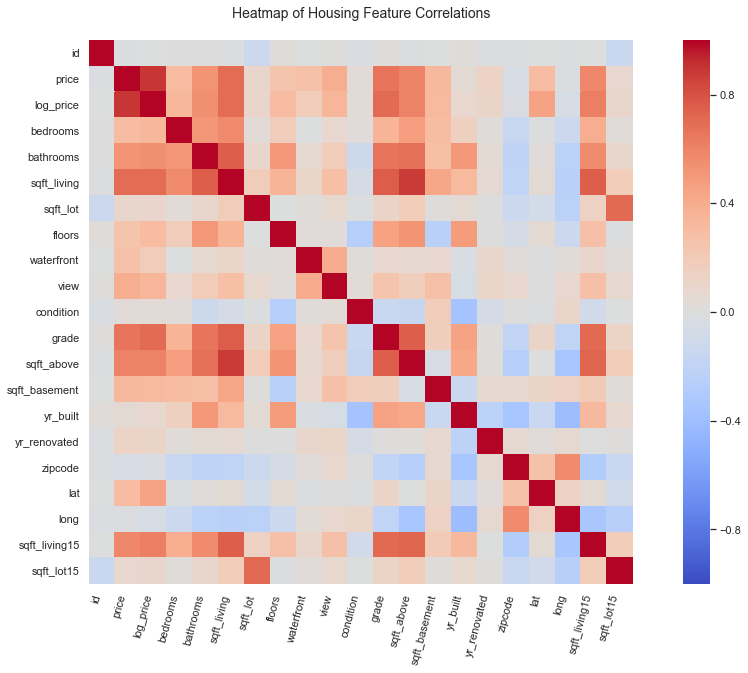

In [18]:
get_Heatmap(housingNorm_df)

# Basic Summary Statistics

## Functions for Scripting

In [19]:
# return the Classical summary statstics
def classicStats(stats_df, labels):
    print('--------------')
    print('-------------- SUMMARY STATISTICS FOR CLASSICAL APPROACH ----------------')
    print('--------------')
    stats_df = stats_df.describe()
    stats_df = stats_df.drop(['count'],axis=0)
    return stats_df

# return the Bootstrap summary statistics
def bootStats(stats_df, labels):
    # establish the dataframe structure for returning the bootstrap summary statistics
    df = pd.DataFrame()
    n_replicas = 1000

    # bootstrap the means
    bs_means = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).mean() for i in range(n_replicas)])
    bs_means = bs_means.mean()

    # bootstrap the standard deviations
    bs_deviations = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).std() for i in range(n_replicas)])
    bs_deviations = bs_deviations.std()
    
    # bootstrap the quantiles
    bs_quantile25 = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).quantile(0.25, axis=0) for i in range(n_replicas)])
    bs_quantile25 = bs_quantile25.quantile(0.25, axis=0)
    
    bs_quantile50 = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).quantile(0.50, axis=0) for i in range(n_replicas)])
    bs_quantile50 = bs_quantile50.quantile(0.50, axis=0)
    
    bs_quantile75 = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).quantile(0.75, axis=0) for i in range(n_replicas)])
    bs_quantile75 = bs_quantile75.quantile(0.75, axis=0)
    
    # bootstrap the min/max values
    bs_min = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).min() for i in range(n_replicas)])
    bs_min = bs_min.min()

    bs_max = pd.DataFrame([
        stats_df.sample(frac=1, replace=True).max() for i in range(n_replicas)])
    bs_max = bs_max.max()

    # assign the statistical results to the DataFrame
    results = [bs_means, bs_deviations, bs_min, bs_quantile25, bs_quantile50, bs_quantile75, bs_max]
    i = 0
    for items in results:
        j = 0
        for data in items:
            df.loc[i,j] = data
            j += 1
        i += 1

    # rename the columns
    df.columns = labels
    # reset the dataframe indices
    df.rename(index={0:'mean', 1:'std', 2: 'min', 3:'25%', 4:'50%', 5:'75%', 6:'max'}, inplace=True)
    print('--------------')
    print('-------------- SUMMARY STATISTICS FOR BOOTSTRAP APPROACH ----------------')
    print('--------------')
    return df

# return the Bayes summary statistics
def bayesStats(stats_df, labels):
    df = pd.DataFrame(columns=labels)
    stats_df = pd.DataFrame()

    for item in labels:
        x = classicalStats_df[item]
        log_normal_pdf = scipy.stats.lognorm.pdf(x, 1)
        df[item] = log_normal_pdf

    # return the means and standard deviations of the log-normal distribution
    bayes_means = df.mean()
    bayes_deviations = df.std()
    
    # return the quantiles derived via the log-normal distribution
    bayes_quantile25 = df.quantile(0.25, axis=0)
    bayes_quantile50 = df.quantile(0.50, axis=0)
    bayes_quantile75 = df.quantile(0.75, axis=0)
    
    # return the min/max values of the log-normal distribution
    bayes_min = df.min()
    bayes_max = df.max()

    results = [bayes_means, bayes_deviations, bayes_min,
               bayes_quantile25, bayes_quantile50, bayes_quantile75, bayes_max]
    i = 0
    for items in results:
            j = 0
            for data in items:
                stats_df.loc[i, j] = data
                j += 1
            i += 1

    # rename the columns
    stats_df.columns = labels
    # reset the dataframe indices
    stats_df.rename(index={0:'mean', 1:'std', 2: 'min', 3:'25%', 4:'50%', 5:'75%', 6:'max'}, inplace=True)
    print('--------------')
    print('-------------- SUMMARY STATISTICS FOR BAYESIAN APPROACH ----------------')
    print('--------------')
    return stats_df

## Classical Summary Statistics

In [20]:
# establish the dataframe to evaluate statistically
classicalStats_df = pd.DataFrame(housingNorm_df.loc[:,features_A])
classicalStats_Summary_df = classicStats(classicalStats_df, features_A)
classicalStats_Summary_df

--------------
-------------- SUMMARY STATISTICS FOR CLASSICAL APPROACH ----------------
--------------


,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
mean,0.005626,0.006797,0.006557,0.006391,0.006222,0.002331,0.006397,0.000591,0.001989,0.006681,0.006723,0.006173,0.003742,0.006801,0.001399,0.006802,0.006802,0.006802,0.006430,0.002881
std,0.003824,0.000274,0.001809,0.002328,0.002748,0.006390,0.002312,0.006777,0.006505,0.001275,0.001032,0.002858,0.005681,0.000101,0.006657,0.000004,0.000020,0.000008,0.002219,0.006162
min,0.000781,0.005847,0.000000,0.000000,0.000868,0.000080,0.004281,0.000000,0.000000,0.001960,0.000878,0.001001,0.000000,0.006556,0.000000,0.006797,0.006744,0.006752,0.001292,0.000147
25%,0.003353,0.006606,0.005836,0.005289,0.004269,0.000778,0.004281,0.000000,0.000000,0.005879,0.006147,0.004107,0.000000,0.006732,0.000000,0.006799,0.006789,0.006797,0.004823,0.001151
50%,0.004687,0.006781,0.005836,0.006800,0.005714,0.001175,0.006422,0.000000,0.000000,0.005879,0.006147,0.005384,0.000000,0.006815,0.000000,0.006801,0.006804,0.006803,0.005956,0.001720
75%,0.006718,0.006968,0.007781,0.007556,0.007629,0.001649,0.008562,0.000000,0.000000,0.007839,0.007025,0.007628,0.007188,0.006891,0.000000,0.006805,0.006819,0.006808,0.007639,0.002275
max,0.080203,0.008260,0.064193,0.024178,0.040508,0.254776,0.014984,0.078326,0.033954,0.009799,0.011415,0.032478,0.061867,0.006953,0.033394,0.006810,0.006833,0.006819,0.020101,0.196605


## Bootstrap Summary Statistics

In [21]:
bootstrapStats_df = bootStats(classicalStats_df, features_A)
bootstrapStats_df

--------------
-------------- SUMMARY STATISTICS FOR BOOTSTRAP APPROACH ----------------
--------------


,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
mean,0.005625,0.006797,0.006557,0.006392,0.006222,0.002330,0.006398,0.000590,0.001990,0.006681,0.006723,0.006172,0.003741,6.801347e-03,0.001399,6.802091e-03,6.802067e-03,6.802087e-03,0.006429,0.002881
std,0.000075,0.000001,0.000041,0.000014,0.000024,0.000369,0.000009,0.000254,0.000077,0.000007,0.000006,0.000022,0.000041,4.028713e-07,0.000106,1.333233e-08,7.893190e-08,4.778773e-08,0.000014,0.000258
min,0.000781,0.005847,0.000000,0.000000,0.000868,0.000080,0.004281,0.000000,0.000000,0.001960,0.000878,0.001001,0.000000,6.556319e-03,0.000000,6.796754e-03,6.744261e-03,6.752057e-03,0.001292,0.000147
25%,0.003333,0.006603,0.005836,0.004533,0.004248,0.000775,0.004281,0.000000,0.000000,0.005879,0.006147,0.004107,0.000000,6.732305e-03,0.000000,6.798974e-03,6.789098e-03,6.797084e-03,0.004791,0.001151
50%,0.004687,0.006781,0.005836,0.006800,0.005714,0.001175,0.006422,0.000000,0.000000,0.005879,0.006147,0.005384,0.000000,6.815121e-03,0.000000,6.801193e-03,6.803729e-03,6.803039e-03,0.005956,0.001720
75%,0.006744,0.006970,0.007781,0.007556,0.007629,0.001656,0.008562,0.000000,0.000000,0.007839,0.007025,0.007662,0.007316,6.891037e-03,0.000000,6.804869e-03,6.819017e-03,6.808493e-03,0.007671,0.002284
max,0.080203,0.008260,0.064193,0.024178,0.040508,0.254776,0.014984,0.078326,0.033954,0.009799,0.011415,0.032478,0.061867,6.953149e-03,0.033394,6.810487e-03,6.833176e-03,6.819068e-03,0.020101,0.196605


## Bayesian Summary Statistics -- LOG-NORMAL DISTRIBUTION (prior)  
> - Compare the population distributions of 'price' and 'log_price' against a log-normal distribution.  
> - Note that the 'price' feature does not provide a normal distribution using a log-normal model (REF next plot), as compared to the 'log_price' feature that does show a normal distribution post log-normal processing (REF latter plot). 

In [22]:
# x = classicalStats_df['price']
x = classicalStats_df['price']
y = classicalStats_df['log_price']

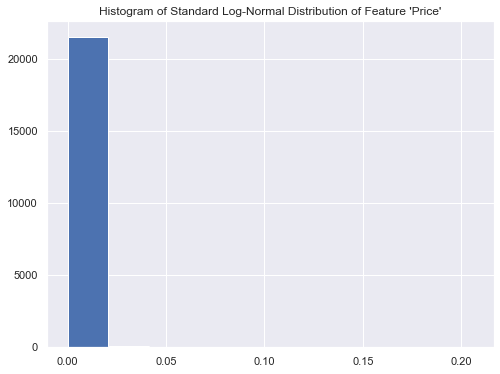

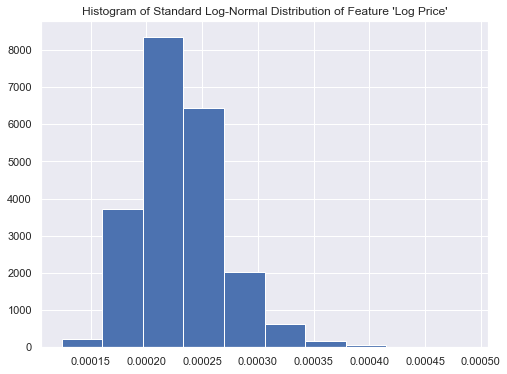

In [23]:
figSize = (8, 6)
log_normalX_pdf = scipy.stats.lognorm.pdf(x, 1)
plt.figure(figsize=figSize)

plt.hist(log_normalX_pdf)
plt.title('Histogram of Standard Log-Normal Distribution of Feature \'Price\'')
plt.show()

log_normalY_pdf = scipy.stats.lognorm.pdf(y, 1)
plt.figure(figsize=figSize)
plt.hist(log_normalY_pdf)

plt.title('Histogram of Standard Log-Normal Distribution of Feature \'Log Price\'')
plt.show()

In [24]:
# finally, evaluate the Bayesian summary statistics
bayesStats_df = bayesStats(classicalStats_df, features_A)
bayesStats_df

--------------
-------------- SUMMARY STATISTICS FOR BAYESIAN APPROACH ----------------
--------------


,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
mean,5.927679e-04,0.000230,0.000288,0.000320,3.790328e-04,1.154239e-03,0.000323,0.001499,0.001274,2.598360e-04,2.484803e-04,3.939508e-04,0.000762,0.000229,0.001528,2.291616e-04,0.000229,0.000229,3.239128e-04,1.242968e-03
std,3.828256e-03,0.000038,0.001036,0.000529,1.038169e-03,1.369548e-02,0.000441,0.017201,0.005468,2.269005e-04,1.715655e-04,9.799383e-04,0.002759,0.000013,0.007274,4.990298e-07,0.000003,0.000001,5.395401e-04,1.203986e-02
min,3.912747e-09,0.000124,0.000000,0.000000,7.421463e-09,2.421724e-16,0.000032,0.000000,0.000000,7.365102e-07,7.980189e-09,1.744338e-08,0.000000,0.000198,0.000000,2.284447e-04,0.000221,0.000223,7.610035e-08,3.308971e-14
25%,1.061224e-05,0.000204,0.000123,0.000081,3.204381e-05,3.802739e-09,0.000032,0.000000,0.000000,1.267080e-04,1.521538e-04,2.695081e-05,0.000000,0.000220,0.000000,2.287425e-04,0.000227,0.000228,5.477002e-05,3.941232e-08
50%,4.837594e-05,0.000226,0.000123,0.000229,1.125908e-04,4.447180e-08,0.000182,0.000000,0.000000,1.267080e-04,1.521538e-04,8.773410e-05,0.000000,0.000231,0.000000,2.290406e-04,0.000229,0.000229,1.336726e-04,3.684102e-07
75%,2.180812e-04,0.000252,0.000388,0.000347,3.598154e-04,2.938999e-07,0.000559,0.000000,0.000000,3.995974e-04,2.604391e-04,3.596014e-04,0.000285,0.000241,0.000000,2.295350e-04,0.000231,0.000230,3.616637e-04,1.592020e-06
max,2.061797e-01,0.000488,0.143280,0.016174,5.768627e-02,6.148239e-01,0.003921,0.198821,0.038479,9.199930e-04,1.581789e-03,3.457703e-02,0.134248,0.000250,0.036977,2.302919e-04,0.000233,0.000231,9.616722e-03,5.405179e-01


# Confidence Intervals

## Functions for Scripting

In [25]:
# return the lower and upper limits of the confidence interval
def get_intervals(df, labels):
    Z_95 = 1.96
    stats_df = pd.DataFrame()
    j = 0
    for item in labels:
        i = 0
        mean = df[item][0]
        upper = mean + (Z_95 * df[item][1])   # the upper limit of the confidence interval
        lower = mean - (Z_95 * df[item][1])   # the lower limit of the confidence interval
        for data in [lower, mean, upper]:
            stats_df.loc[i, j] = data
            i += 1
        j += 1

    # rename the columns
    stats_df.columns = labels
    # reset the dataframe indices
    stats_df.rename(index={0:'lower_ci', 1:'mean', 2: 'upper_ci'}, inplace=True)
    
    return stats_df

## Classical Confidence Intervals

In [26]:
classical_confLimits = get_intervals(classicalStats_df, features_A)
classical_confLimits

,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
lower_ci,-0.008672,-0.007060,-0.005602,-0.010306,-0.01154,-0.001318,-0.012501,0.0,0.0,-0.005644,-0.005901,-0.010607,-0.010063,-0.006449,-0.064672,-0.006529,-0.006582,-0.006539,-0.006384,-0.002104
mean,0.002311,0.006412,0.005836,0.003022,0.00353,0.000872,0.004281,0.0,0.0,0.005879,0.006147,0.004073,0.000000,0.006746,0.000000,0.006809,0.006795,0.006804,0.004337,0.001275
upper_ci,0.013295,0.019884,0.017274,0.016351,0.01860,0.003062,0.021063,0.0,0.0,0.017402,0.018194,0.018752,0.010063,0.019941,0.064672,0.020148,0.020172,0.020148,0.015059,0.004654


## Bootstrap Confidence Intervals

In [27]:
bootstrap_confLimits = get_intervals(bootstrapStats_df, features_A)
bootstrap_confLimits

,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
lower_ci,0.005478,0.006794,0.006476,0.006364,0.006174,0.001608,0.006379,0.000093,0.001839,0.006668,0.006711,0.006129,0.003661,0.006801,0.001192,0.006802,0.006802,0.006802,0.006401,0.002375
mean,0.005625,0.006797,0.006557,0.006392,0.006222,0.002330,0.006398,0.000590,0.001990,0.006681,0.006723,0.006172,0.003741,0.006801,0.001399,0.006802,0.006802,0.006802,0.006429,0.002881
upper_ci,0.005771,0.006799,0.006637,0.006420,0.006270,0.003053,0.006416,0.001087,0.002141,0.006695,0.006735,0.006216,0.003822,0.006802,0.001607,0.006802,0.006802,0.006802,0.006458,0.003388


## Bayesian Confidence Intervals -- LOG-NORMAL DISTRIBUTION (prior)

In [28]:
bayes_confLimits = get_intervals(bayesStats_df, features_A)
bayes_confLimits

,price,log_price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
lower_ci,-0.006911,0.000156,-0.001742,-0.000716,-0.001656,-0.025689,-0.000541,-0.032215,-0.009444,-0.000185,-0.000088,-0.001527,-0.004645,0.000203,-0.012730,0.000228,0.000224,0.000227,-0.000734,-0.022355
mean,0.000593,0.000230,0.000288,0.000320,0.000379,0.001154,0.000323,0.001499,0.001274,0.000260,0.000248,0.000394,0.000762,0.000229,0.001528,0.000229,0.000229,0.000229,0.000324,0.001243
upper_ci,0.008096,0.000305,0.002318,0.001356,0.002414,0.027997,0.001187,0.035214,0.011992,0.000705,0.000585,0.002315,0.006169,0.000256,0.015786,0.000230,0.000234,0.000231,0.001381,0.024841


# Hypothesis Testing

## Functions for Scripting

In [29]:
# use a t-test to compare hypothesis test outcomes
def t_test(a, b, alpha, alternative='two-sided'):
    diff = a.mean() - b.mean()
    res = ss.ttest_ind(a, b, equal_var=False)
    means = ws.CompareMeans(ws.DescrStatsW(a), ws.DescrStatsW(b))
    confint = means.tconfint_diff(
        alpha=alpha, alternative=alternative, usevar='unequal')
    degfree = means.dof_satt()
    index = ['DegFreedom', 'Difference',
             't-Statistic', 'PValue', 'Low95CI', 'High95CI']
    return pd.Series([degfree, diff, res[0], res[1], confint[0], confint[1]], index=index)


def helper_tTest(df, features, zoomFlag=False):
    pop_A = df[features[0]]
    pop_B = df[features[1]]
    
    logType = False
    if (features[0] == 'log_price') | (features[0] == 'grade'):
        logType = True
    
    if features[0] != features[1]:
        t_testResult = t_test(pop_A, pop_B, 0.05)
        print(t_testResult)
        
        if zoomFlag != True:
            plot_t(pop_A, pop_B, t_testResult, logType, cols=features)
        elif zoomFlag == True:
            plotZoom_t(pop_A, pop_B, t_testResult, logType, cols=features)


def helperBS_tTest(df, features, zoomFlag=False):
    pop_A = df[features[0]]
    pop_B = df[features[1]]
    
    if features[0] != features[1]:
        t_testResult = t_test(pop_A, pop_B, 0.05)
        print(t_testResult)

        plotBS_t(pop_A, pop_B, t_testResult, cols=features)


def helperBay_tTest(df, features, zoomFlag=False):
    pop_A = df[features[0]]
    pop_B = df[features[1]]
    
    if features[0] != features[1]:
        t_testResult = t_test(pop_A, pop_B, 0.05)
        print(t_testResult)

        plotBay_t(pop_A, pop_B, t_testResult, cols=features)


def hist_mean_ci(vec, t_test, bins):
    upper = mean(vec) + t_test[5] - t_test[1]
    lower = mean(vec) + t_test[4] - t_test[1]
    plt.hist(vec, bins=bins)
    plt.axvline(mean(vec), color='red')
    plt.axvline(upper, color='red', linestyle='--')
    plt.axvline(lower, color='red', linestyle='--')
    plt.ylabel('Frequency')
    plt.xlabel('Value')


def plot_t(a, b, t_test, flag, cols=['pop_A', 'pop_B'], nbins=200):
    minx = min([min(a), min(b)])
    maxx = max([max(a), max(b)])
    stepx = (maxx - minx)/(nbins + 1)
    bins = [minx + i * stepx for i in range(nbins + 1)]
    plt.figure(figsize=figArea)
    plt.subplot(2, 1, 1)  # The first plot
    
    if flag == True:
        plt.xlim(minx, maxx)
    elif flag == False:
        plt.xlim(minx, maxx/3)
        
    hist_mean_ci(a, t_test, bins)
    plt.title('Histograms of ' +
              str(cols[0]) + ' and ' + str(cols[1]), fontsize='14')
    plt.subplot(2, 1, 2)  # The next plot
    
    if flag == True:
        plt.xlim(minx, maxx)
    elif flag == False:
        plt.xlim(minx, maxx/3) 
        
    hist_plot(b, bins)
    plt.show()

    
def plotBS_t(a, b, t_test, cols=['pop_A', 'pop_B'], nbins=200):
    minx = min([min(a), min(b)])
    maxx = max([max(a), max(b)])
    stepx = (maxx - minx)/(nbins + 1)
    bins = [minx + i * stepx for i in range(nbins + 1)]
    plt.figure(figsize=figArea)
    plt.subplot(2, 1, 1)  # The first plot

    plt.xlim(minx, maxx)
        
    hist_mean_ci(a, t_test, bins)
    plt.title('Histograms of ' +
              str(cols[0]) + ' and ' + str(cols[1]), fontsize='14')
    plt.subplot(2, 1, 2)  # The next plot

    plt.xlim(minx, maxx) 
        
    hist_plot(b, bins)
    plt.show()


def plotBay_t(a, b, t_test, cols=['pop_A', 'pop_B'], nbins=200):
    minx = min([min(a), min(b)])
    maxx = max([max(a), max(b)])
    stepx = (maxx - minx)/(nbins + 1)
    bins = [minx + i * stepx for i in range(nbins + 1)]
    plt.figure(figsize=figArea)
    plt.subplot(2, 1, 1)  # The first plot
    
    plt.xlim(minx, 0.01)
        
    hist_mean_ci(a, t_test, bins)
    plt.title('Histograms of ' +
              str(cols[0]) + ' and ' + str(cols[1]), fontsize='14')
    plt.subplot(2, 1, 2)  # The next plot
    
    plt.xlim(minx, 0.01)
        
    hist_plot(b, bins)
    plt.show()


def plotZoom_t(a, b, t_test, flag, cols=['pop_A', 'pop_B'], nbins=200):
    minx = min([min(a), min(b)])
    maxx = max([max(a), max(b)])
    stepx = (maxx - minx)/(nbins + 1)
    bins = [minx + i * stepx for i in range(nbins + 1)]
    plt.figure(figsize=figArea)
    plt.subplot(2, 1, 1)  # The first plot

    if (cols[0] == 'log_price'):
        plt.xlim(0.0067, 0.0069)
    elif (cols[0] == 'grade'):
        if (cols[1] != 'bedrooms'):
            plt.xlim(0.0060, 0.0080)
        elif (cols[1] == 'bedrooms'):
            plt.xlim(0.0000, 0.0100)

    hist_mean_ci(a, t_test, bins)
    plt.title('Histograms of ' +
              str(cols[0]) + ' and ' + str(cols[1]), fontsize='14')
    plt.subplot(2, 1, 2)  # The next plot

    if (cols[0] == 'log_price'):
        plt.xlim(0.0067, 0.0069)
    elif (cols[0] == 'grade'):
        if (cols[1] != 'bedrooms'):
            plt.xlim(0.0060, 0.0080)
        elif (cols[1] == 'bedrooms'):
            plt.xlim(0.0000, 0.0100)
        
    hist_plot(b, bins)
    plt.show()

In [30]:
def get_Groups(df):
    data1 = df['price'].tolist()
    data2 = df['log_price'].tolist()
    data3 = df['bedrooms'].tolist()
    data4 = df['bathrooms'].tolist()
    data5 = df['sqft_living'].tolist()
    data6 = df['sqft_lot'].tolist()
    data7 = df['floors'].tolist()
    data8 = df['waterfront'].tolist()
    data9 = df['view'].tolist()
    data10 = df['condition'].tolist()
    data11 = df['grade'].tolist()
    data12 = df['sqft_above'].tolist()
    data13 = df['sqft_basement'].tolist()
    data14 = df['yr_built'].tolist()
    data15 = df['yr_renovated'].tolist()
    data16 = df['zipcode'].tolist()
    data17 = df['lat'].tolist()
    data18 = df['long'].tolist()
    data19 = df['sqft_living15'].tolist()
    data20 = df['sqft_lot15'].tolist()
    
    lenFeature = len(data1)
    temp_df = pd.DataFrame({'vals': data1 + data2 + data3 + data4 + data5 + data6
                            + data7 + data8 + data9 + data10 + data11 + data12 + data13
                            + data14 + data15 + data16 + data17 + data18 + data19 + data20,
                            'group_num': ['  price  '] * lenFeature
                            + ['  log_price  '] * lenFeature
                            + ['  bedrooms  '] * lenFeature
                            + ['  bathrooms  '] * lenFeature
                            + ['  sqft_living  '] * lenFeature
                            + ['  sqft_lot  '] * lenFeature
                            + ['  floors  '] * lenFeature
                            + ['  waterfront  '] * lenFeature
                            + ['  view  '] * lenFeature
                            + ['  condition  '] * lenFeature
                            + ['  grade  '] * lenFeature
                            + ['  sqft_above  '] * lenFeature
                            + ['  sqft_basement  '] * lenFeature
                            + ['  yr_built  '] * lenFeature
                            + ['  yr_renovated  '] * lenFeature
                            + ['  zipcode  '] * lenFeature
                            + ['  lat  '] * lenFeature
                            + ['  long  '] * lenFeature
                            + ['  sqft_living15  '] * lenFeature
                            + ['  sqft_lot15  '] * lenFeature
                           })    
    return temp_df


# return the log-normal distribution of the samples
def get_LogNormal(df, labels):
    # ensure all features are converted to the correct data type
    for label in labels:
        df[label] = pd.to_numeric(df[label])
#     df['peak-rpm'] = pd.to_numeric(df['peak-rpm'])
#     df['horsepower'] = pd.to_numeric(df['horsepower'])
#     df['stroke'] = pd.to_numeric(df['stroke'])
#     df['bore'] = pd.to_numeric(df['bore'])

    # get the log-normal distribution
    temp_df = pd.DataFrame(columns=labels)
    for item in labels:
        x = df[item]
        log_normal_pdf = scipy.stats.lognorm.pdf(x, 1)
        temp_df[item] = log_normal_pdf
    return temp_df

## 'Price' vs. 'Log Price'

> With confidence intervals plotted, the 'price' and 'log_price' features are shown here to reject the null hypothesis that these 2 features are equivalent for assessing the price of a house.


         LOG-PRICE
DegFreedom     21834.478761
Difference        -0.001171
t-Statistic      -44.905703
PValue             0.000000
Low95CI           -0.001222
High95CI          -0.001120
dtype: float64


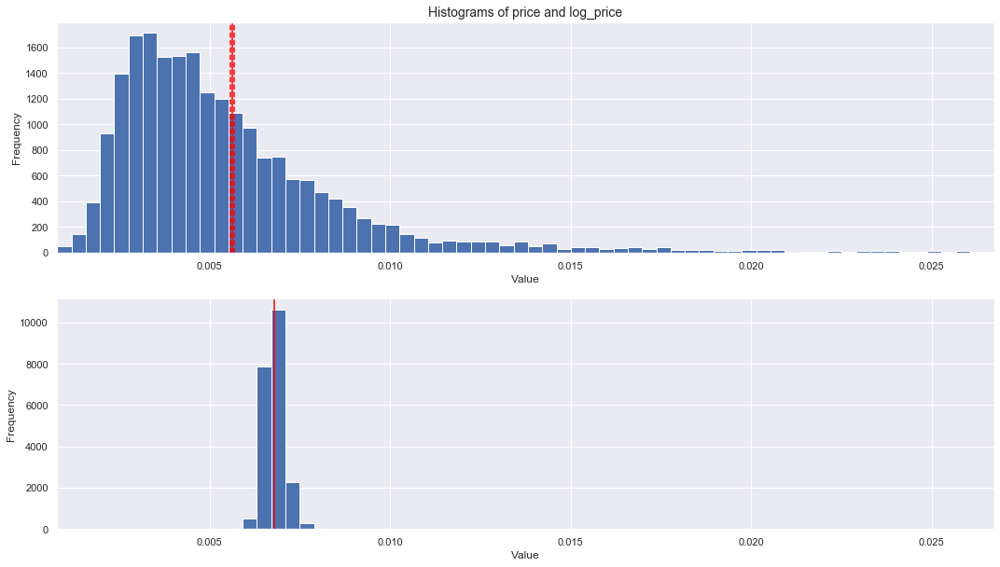

In [31]:
print('\n         LOG-PRICE')
features = ['price', 'log_price']
helper_tTest(classicalStats_df, features)

## Classical Hypothesis Test

### Feature: price  
> Based upon the results below, all of the following features reject the null hypothesis of feature 'price'.


*** price

*** log_price
DegFreedom     21834.478761
Difference        -0.001171
t-Statistic      -44.905703
PValue             0.000000
Low95CI           -0.001222
High95CI          -0.001120
dtype: float64


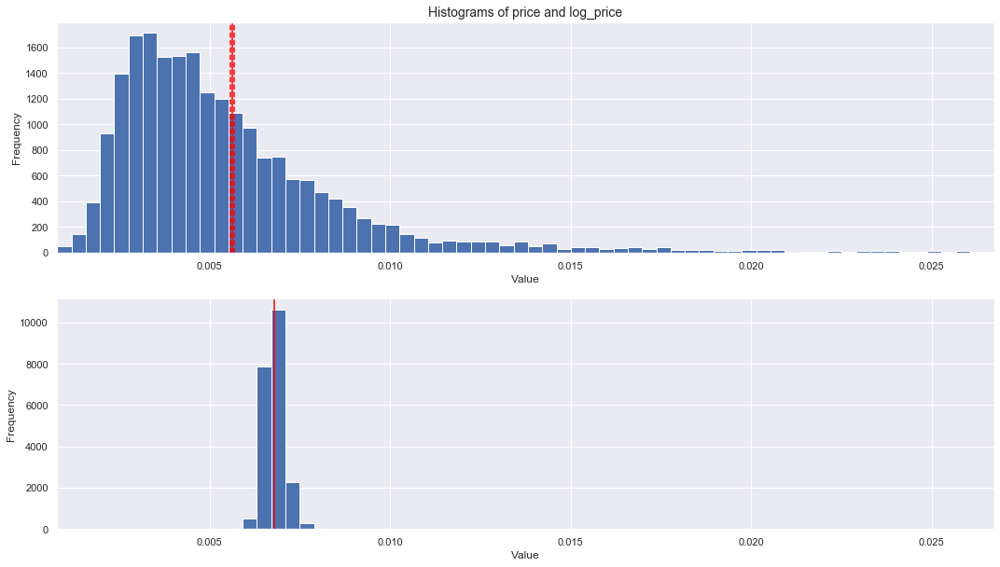


*** bedrooms
DegFreedom      3.082568e+04
Difference     -9.315760e-04
t-Statistic    -3.237420e+01
PValue         3.912736e-226
Low95CI        -9.879767e-04
High95CI       -8.751754e-04
dtype: float64


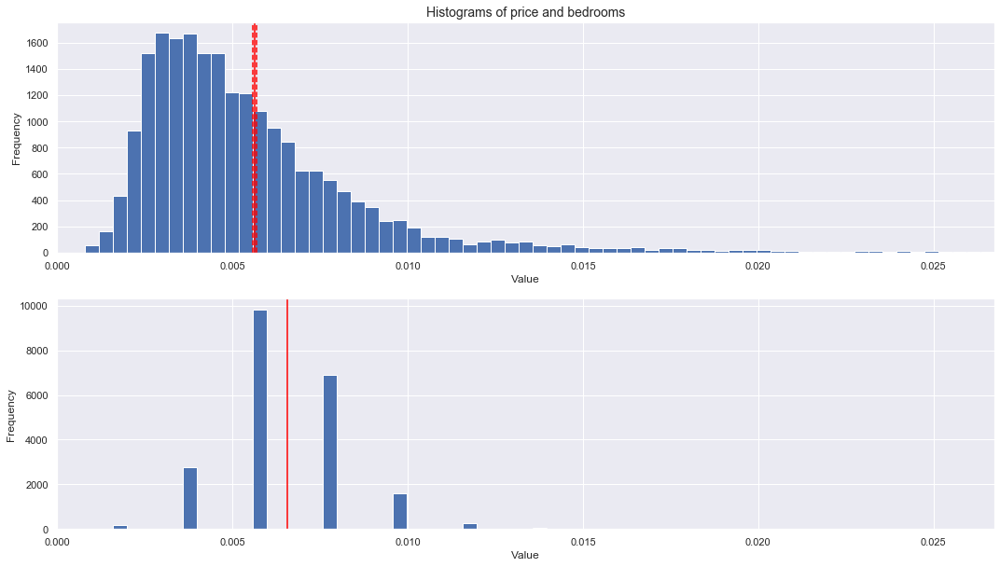


*** bathrooms
DegFreedom      3.569418e+04
Difference     -7.659373e-04
t-Statistic    -2.515321e+01
PValue         2.100114e-138
Low95CI        -8.256219e-04
High95CI       -7.062527e-04
dtype: float64


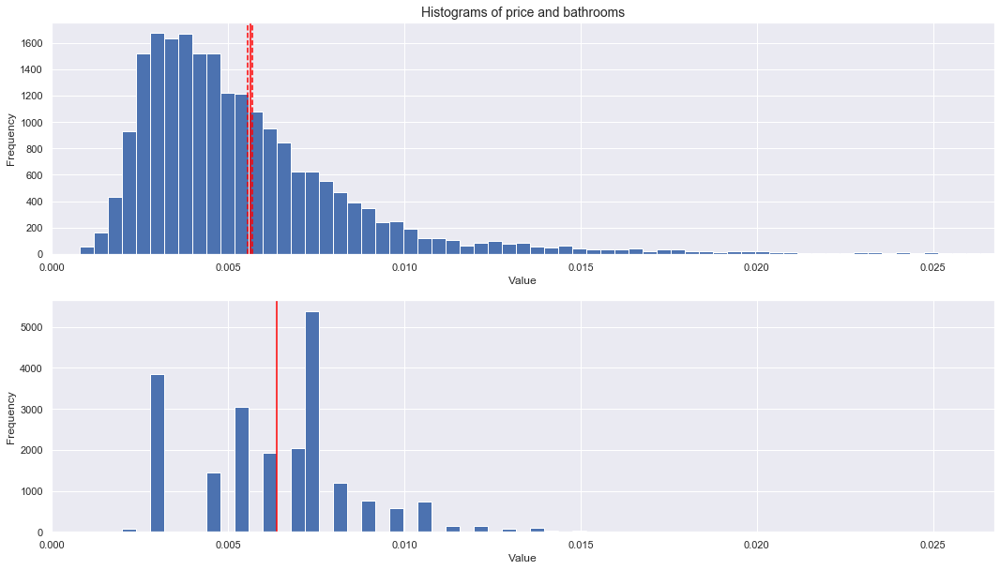


*** sqft_living
DegFreedom     3.923198e+04
Difference    -5.969381e-04
t-Statistic   -1.863710e+01
PValue         3.466438e-77
Low95CI       -6.597169e-04
High95CI      -5.341594e-04
dtype: float64


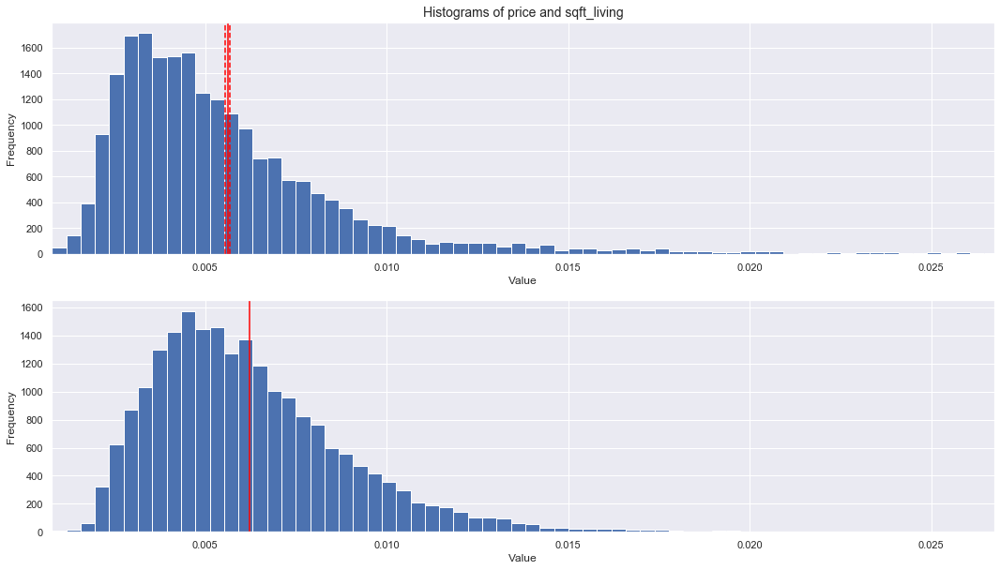


*** sqft_lot
DegFreedom     35330.234866
Difference         0.003295
t-Statistic       65.041463
PValue             0.000000
Low95CI            0.003195
High95CI           0.003394
dtype: float64


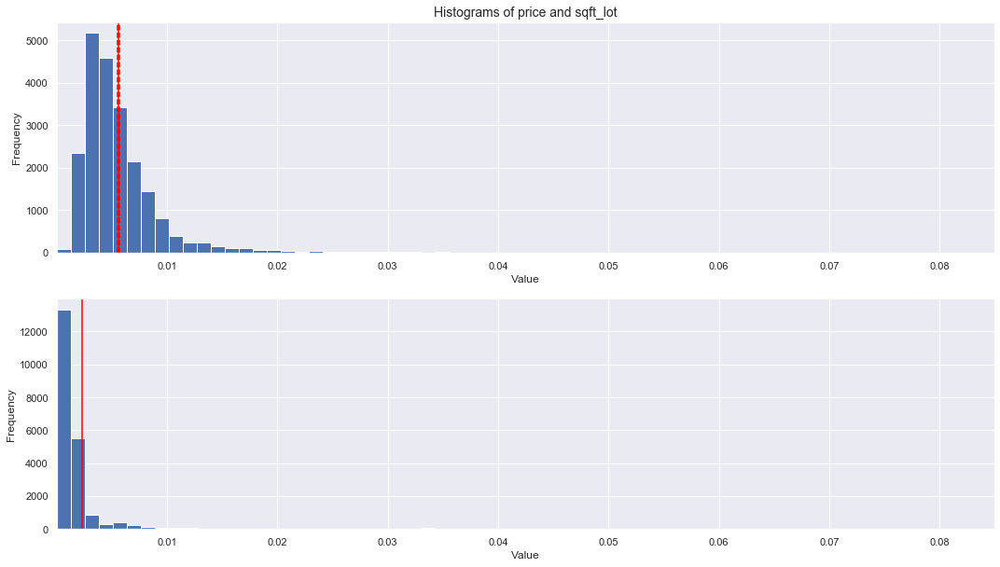


*** floors
DegFreedom      3.554755e+04
Difference     -7.717209e-04
t-Statistic    -2.539005e+01
PValue         5.884919e-141
Low95CI        -8.312953e-04
High95CI       -7.121465e-04
dtype: float64


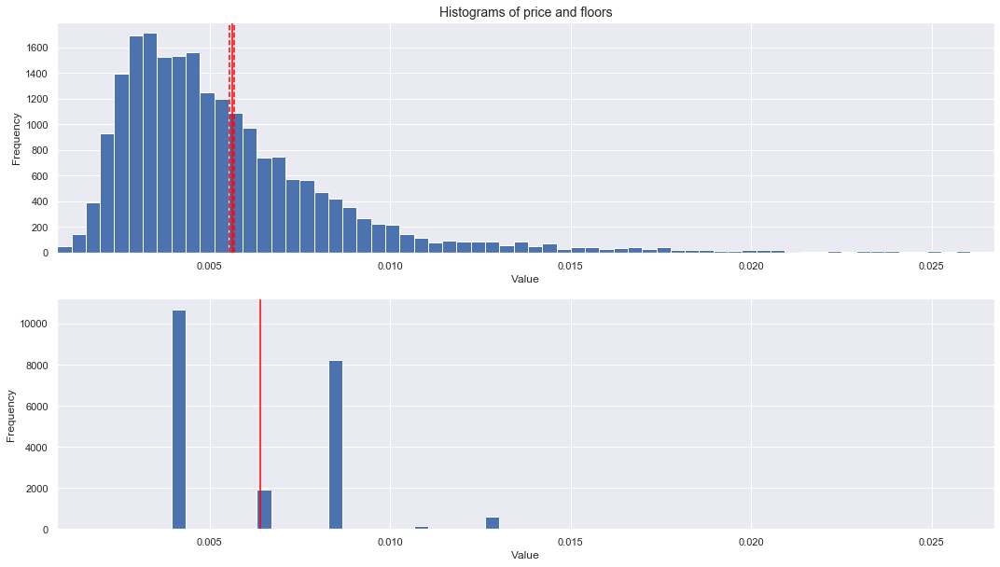


*** waterfront
DegFreedom     34108.612101
Difference         0.005035
t-Statistic       95.126768
PValue             0.000000
Low95CI            0.004931
High95CI           0.005139
dtype: float64


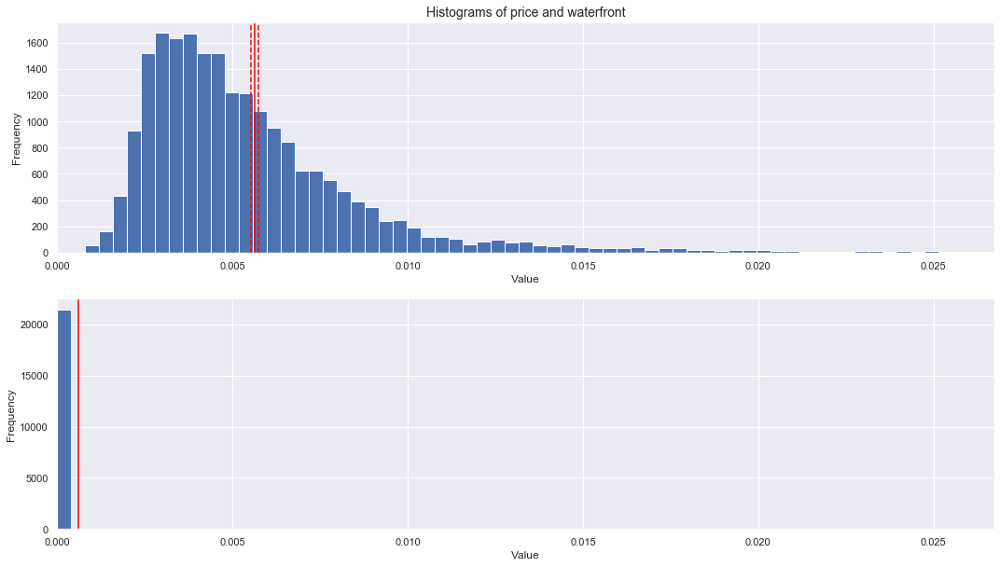


*** view
DegFreedom     34955.496120
Difference         0.003637
t-Statistic       70.852436
PValue             0.000000
Low95CI            0.003536
High95CI           0.003737
dtype: float64


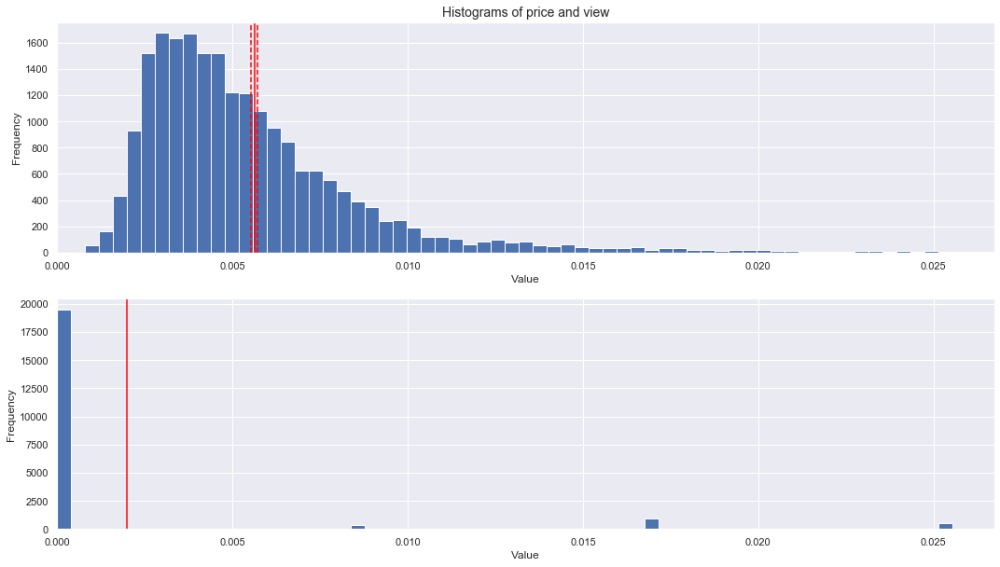


*** condition
DegFreedom     26360.530207
Difference        -0.001056
t-Statistic      -38.511938
PValue             0.000000
Low95CI           -0.001110
High95CI          -0.001002
dtype: float64


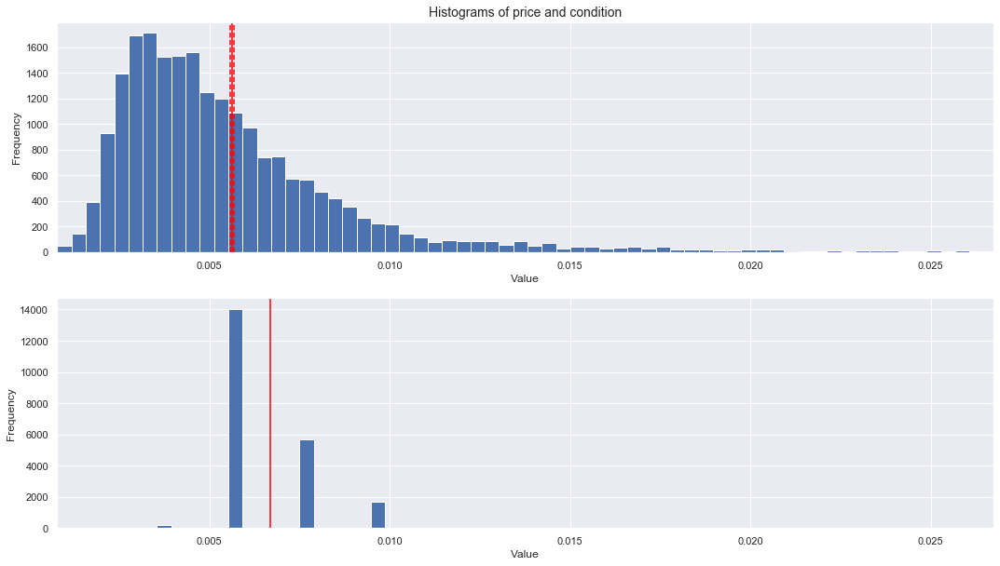


*** grade
DegFreedom     24744.409884
Difference        -0.001098
t-Statistic      -40.747702
PValue             0.000000
Low95CI           -0.001151
High95CI          -0.001045
dtype: float64


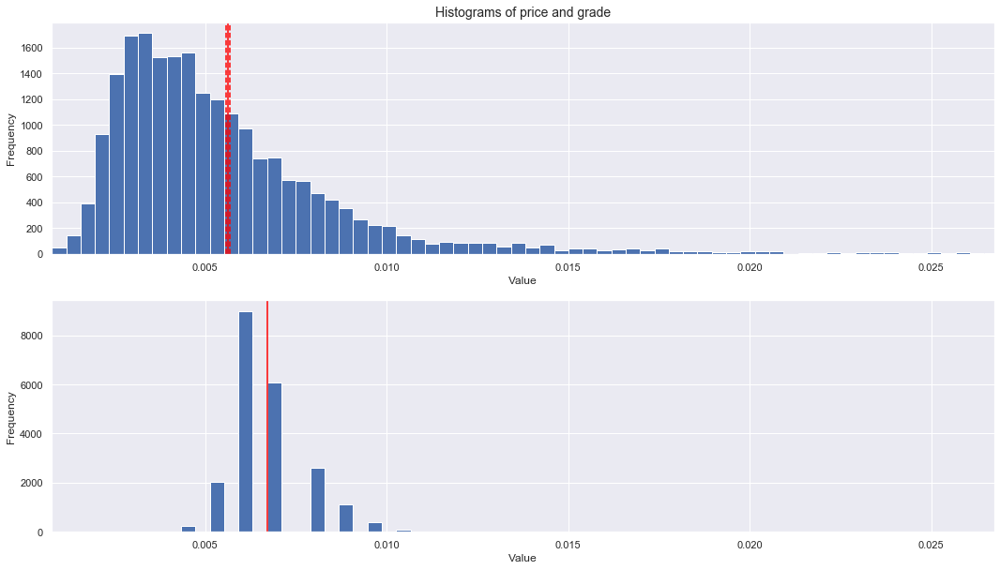


*** sqft_above
DegFreedom     4.001529e+04
Difference    -5.470103e-04
t-Statistic   -1.684483e+01
PValue         1.895618e-63
Low95CI       -6.106591e-04
High95CI      -4.833616e-04
dtype: float64


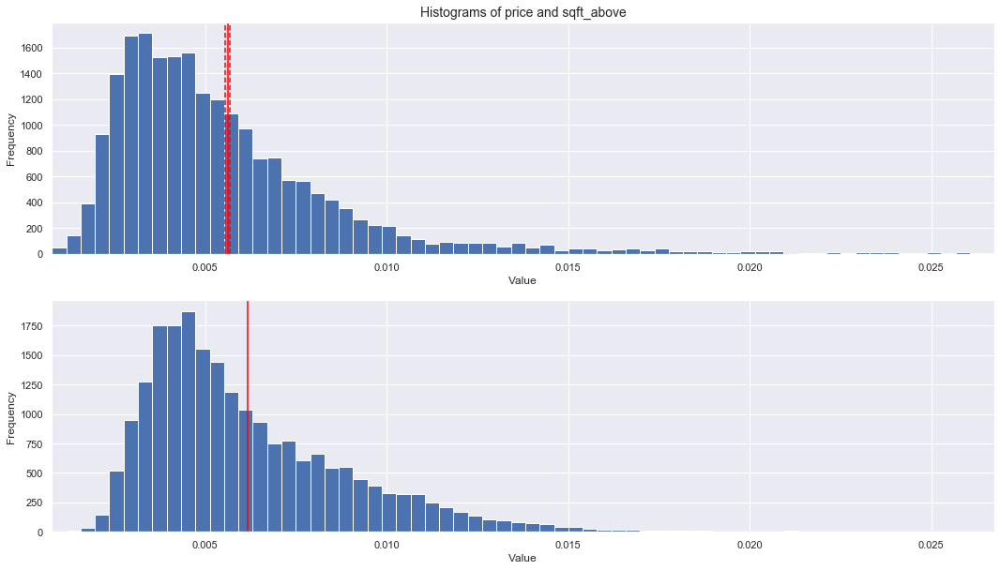


*** sqft_basement
DegFreedom     37861.791110
Difference         0.001884
t-Statistic       40.443862
PValue             0.000000
Low95CI            0.001793
High95CI           0.001975
dtype: float64


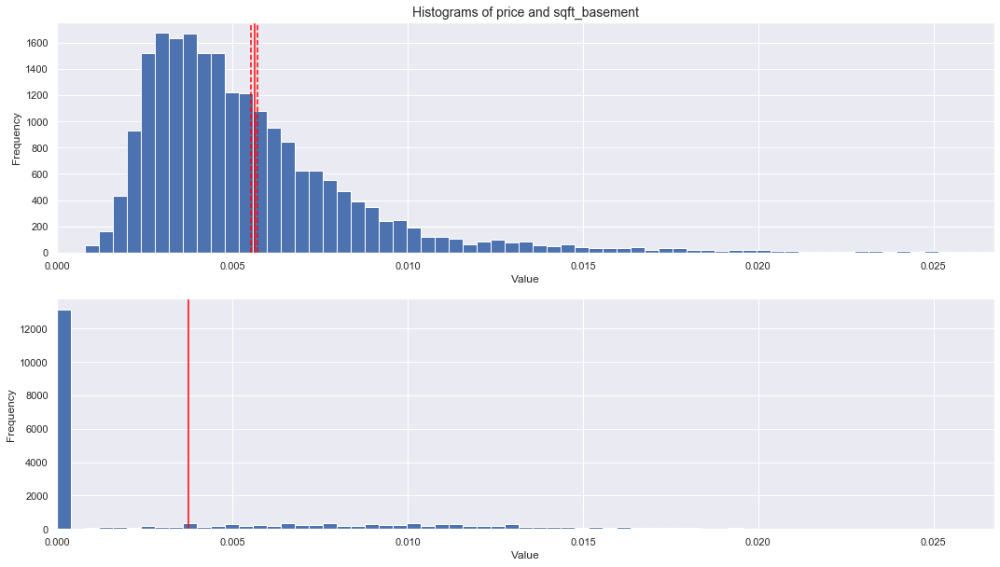


*** yr_built
DegFreedom     21642.368147
Difference        -0.001176
t-Statistic      -45.189001
PValue             0.000000
Low95CI           -0.001227
High95CI          -0.001125
dtype: float64


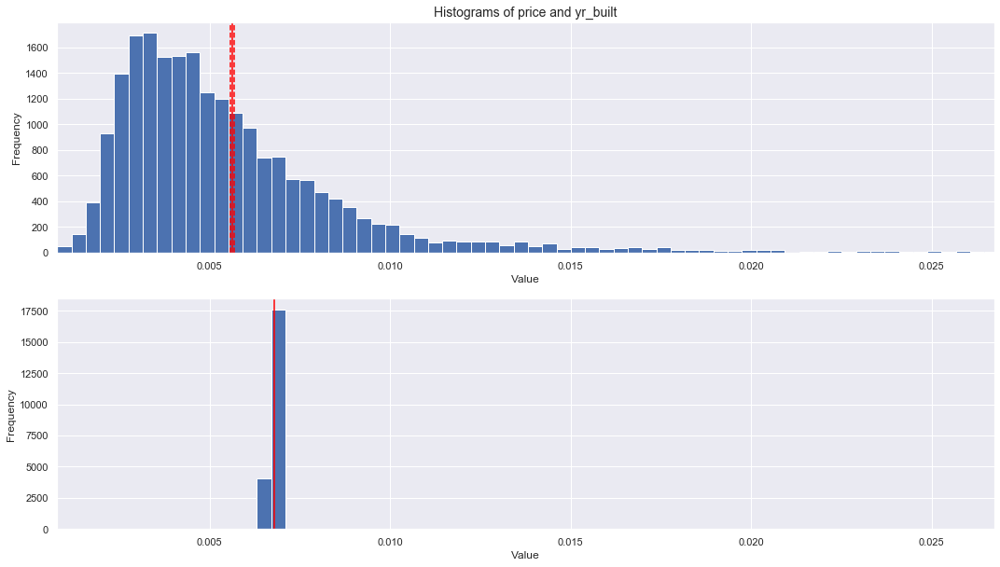


*** yr_renovated
DegFreedom     34474.501050
Difference         0.004227
t-Statistic       80.941468
PValue             0.000000
Low95CI            0.004124
High95CI           0.004329
dtype: float64


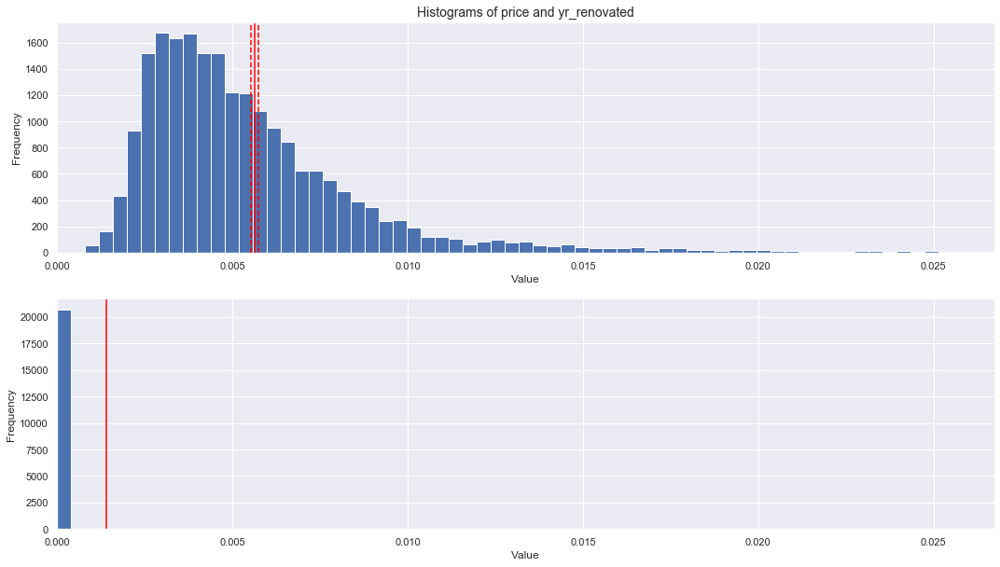


*** zipcode
DegFreedom     21612.040703
Difference        -0.001177
t-Statistic      -45.233845
PValue             0.000000
Low95CI           -0.001228
High95CI          -0.001126
dtype: float64


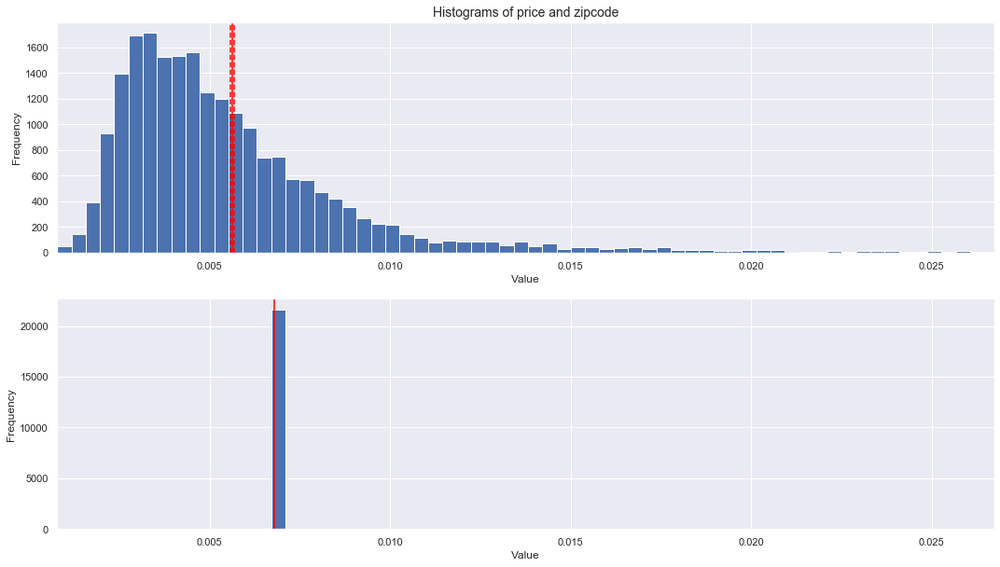


*** lat
DegFreedom     21613.160893
Difference        -0.001177
t-Statistic      -45.232188
PValue             0.000000
Low95CI           -0.001228
High95CI          -0.001126
dtype: float64


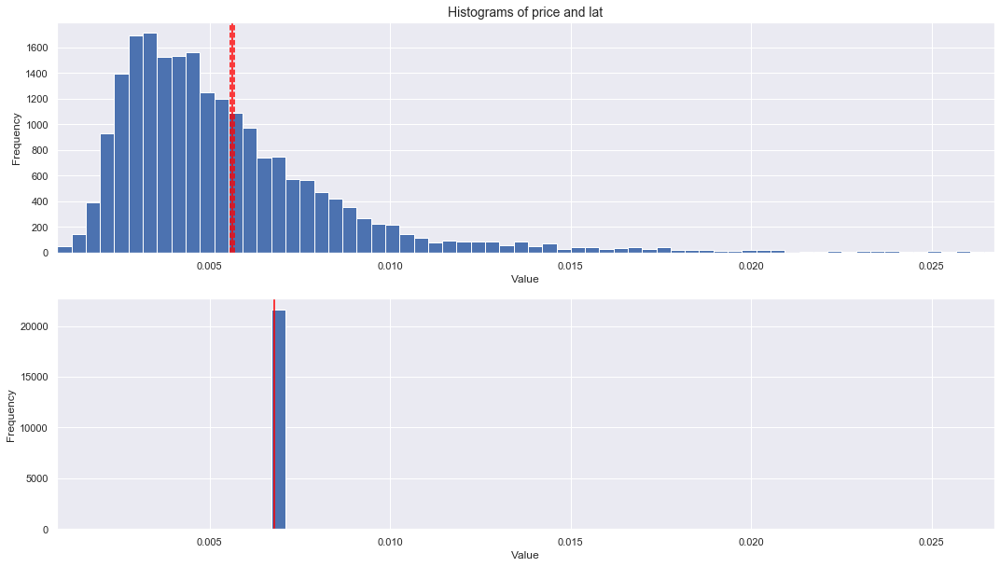


*** long
DegFreedom     21612.181602
Difference        -0.001177
t-Statistic      -45.233637
PValue             0.000000
Low95CI           -0.001228
High95CI          -0.001126
dtype: float64


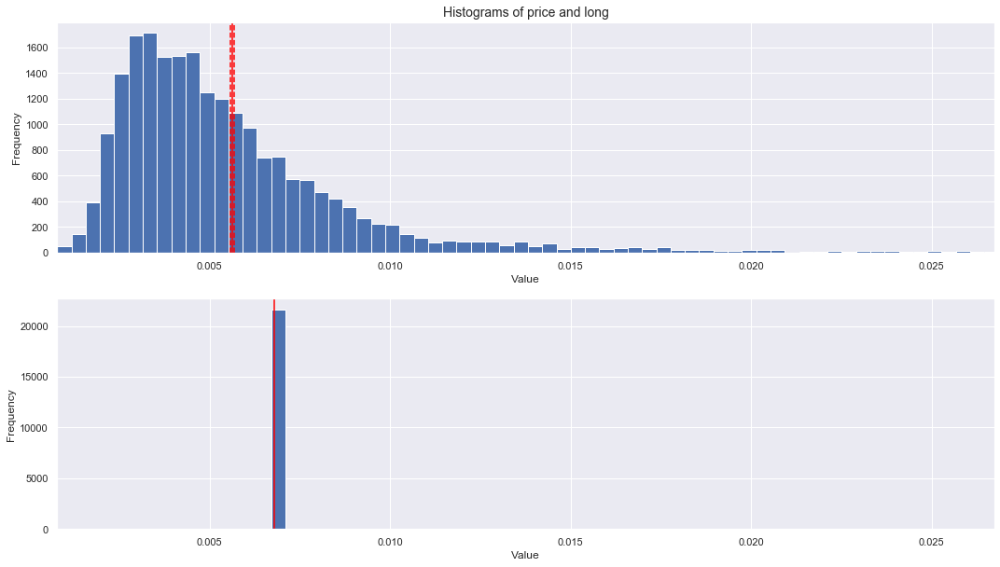


*** sqft_living15
DegFreedom      3.468001e+04
Difference     -8.046433e-04
t-Statistic    -2.675771e+01
PValue         3.885836e-156
Low95CI        -8.635843e-04
High95CI       -7.457023e-04
dtype: float64


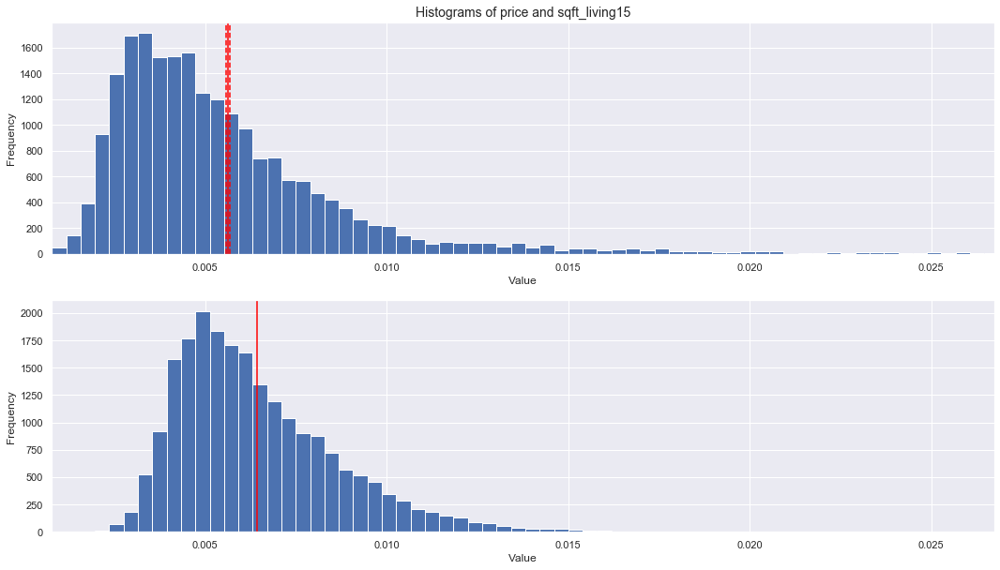


*** sqft_lot15
DegFreedom     36108.910164
Difference         0.002744
t-Statistic       55.628401
PValue             0.000000
Low95CI            0.002647
High95CI           0.002841
dtype: float64


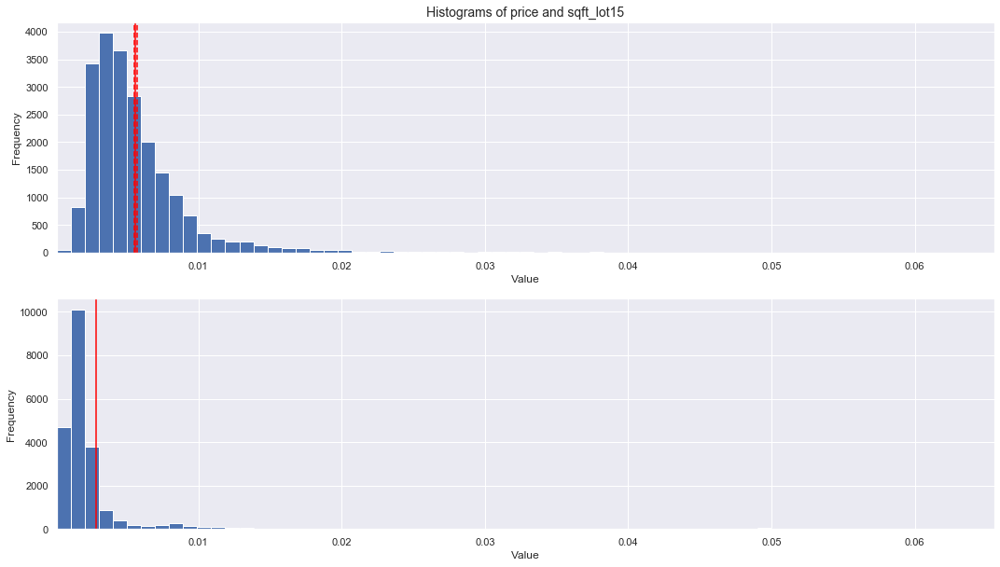

In [32]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['price', item]
    helper_tTest(housingNorm_df, features)

### Feature: log_price (I)


*** price
DegFreedom     21834.478761
Difference         0.001171
t-Statistic       44.905703
PValue             0.000000
Low95CI            0.001120
High95CI           0.001222
dtype: float64


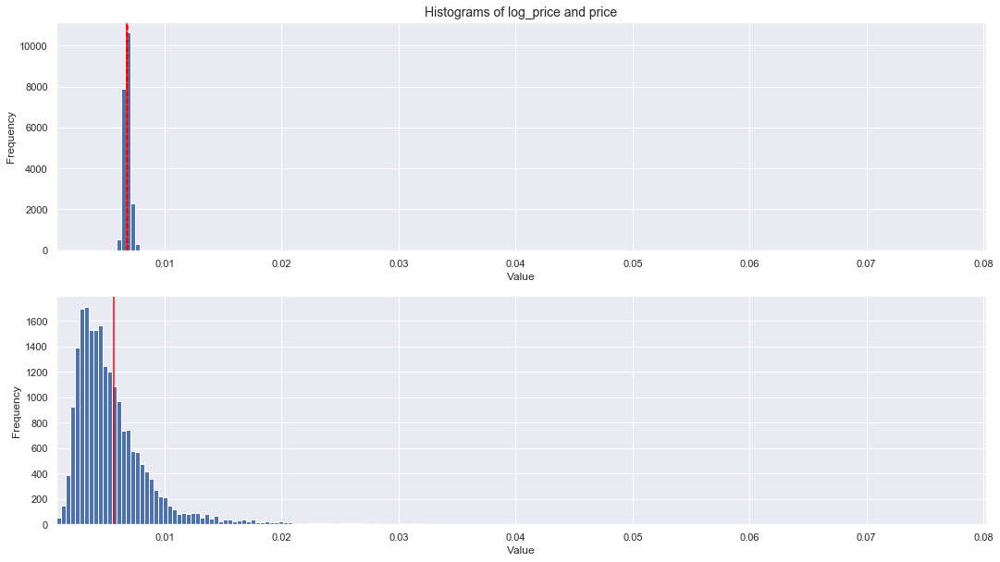


*** log_price

*** bedrooms
DegFreedom     2.260541e+04
Difference     2.394672e-04
t-Statistic    1.923899e+01
PValue         7.879088e-82
Low95CI        2.150702e-04
High95CI       2.638641e-04
dtype: float64


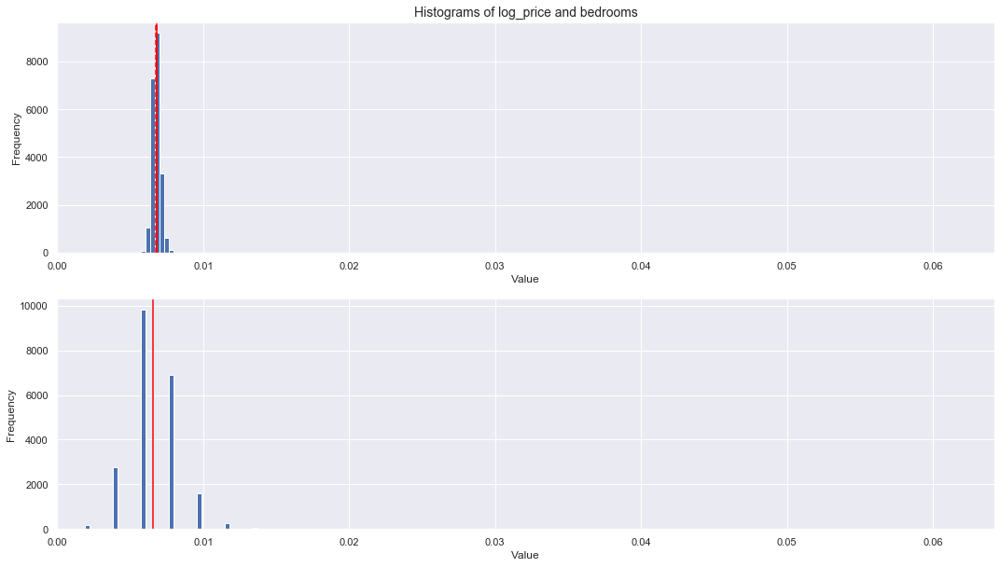


*** bathrooms
DegFreedom      2.221235e+04
Difference      4.051059e-04
t-Statistic     2.541023e+01
PValue         1.968042e-140
Low95CI         3.738572e-04
High95CI        4.363546e-04
dtype: float64


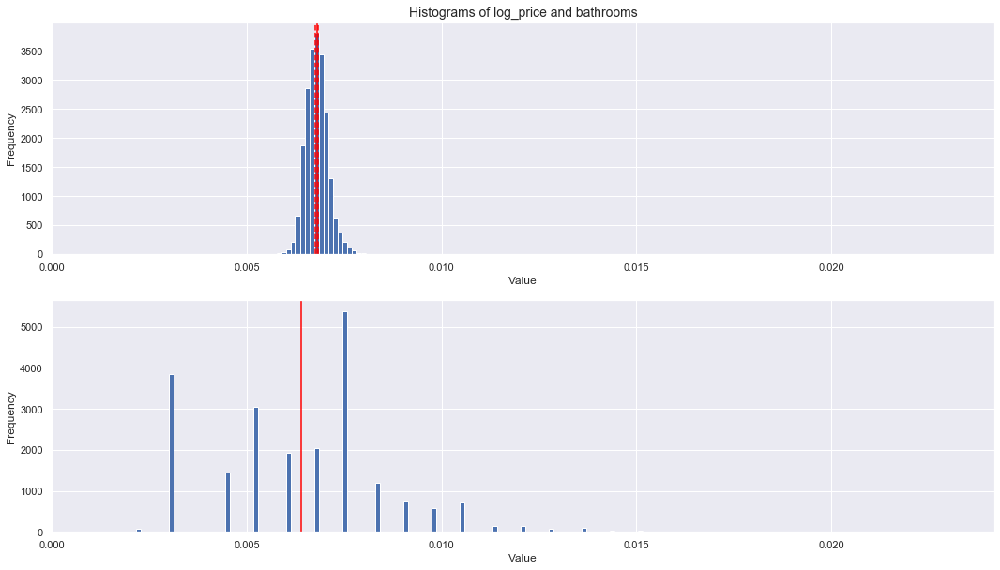


*** sqft_living
DegFreedom      2.204287e+04
Difference      5.741051e-04
t-Statistic     3.056501e+01
PValue         5.536055e-201
Low95CI         5.372889e-04
High95CI        6.109213e-04
dtype: float64


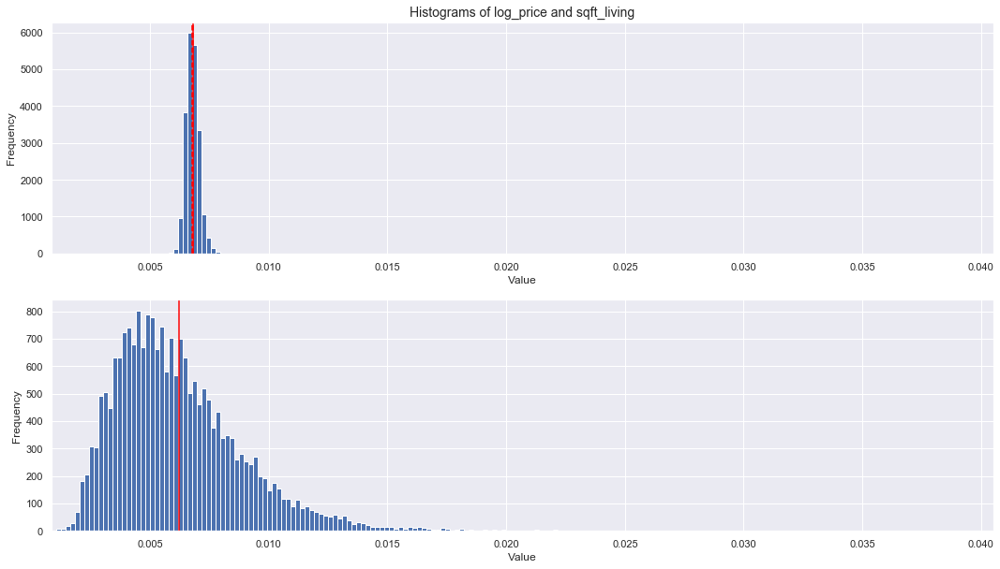


*** sqft_lot
DegFreedom     21691.664068
Difference         0.004466
t-Statistic      102.642295
PValue             0.000000
Low95CI            0.004381
High95CI           0.004551
dtype: float64


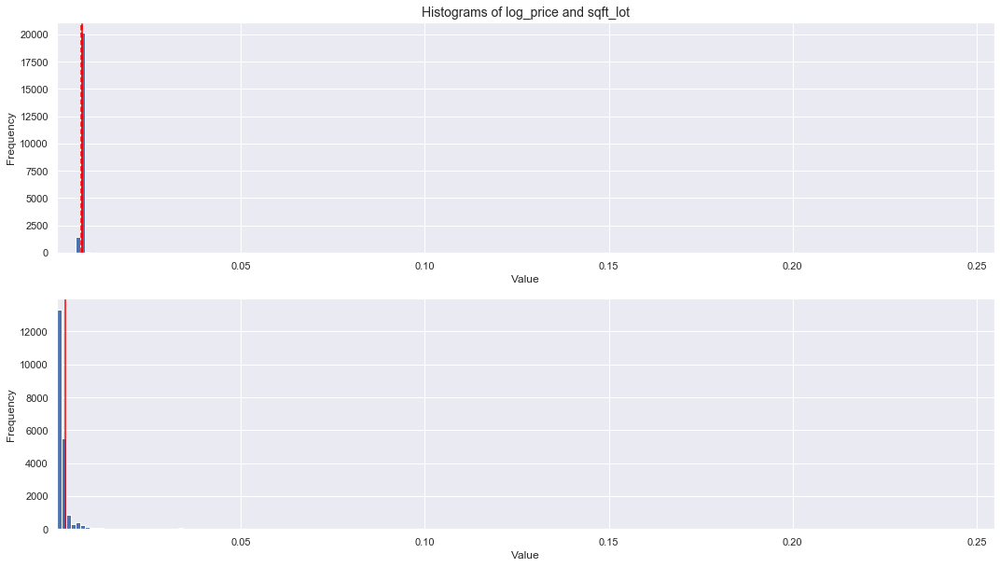


*** floors
DegFreedom      2.222065e+04
Difference      3.993223e-04
t-Statistic     2.521781e+01
PValue         2.252330e-138
Low95CI         3.682847e-04
High95CI        4.303599e-04
dtype: float64


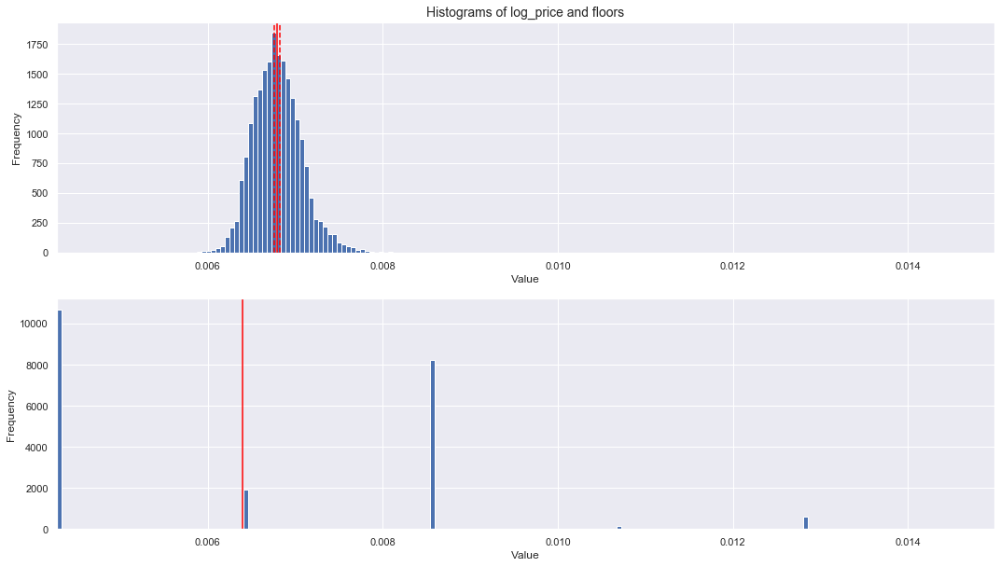


*** waterfront
DegFreedom     21682.845101
Difference         0.006206
t-Statistic      134.522182
PValue             0.000000
Low95CI            0.006115
High95CI           0.006296
dtype: float64


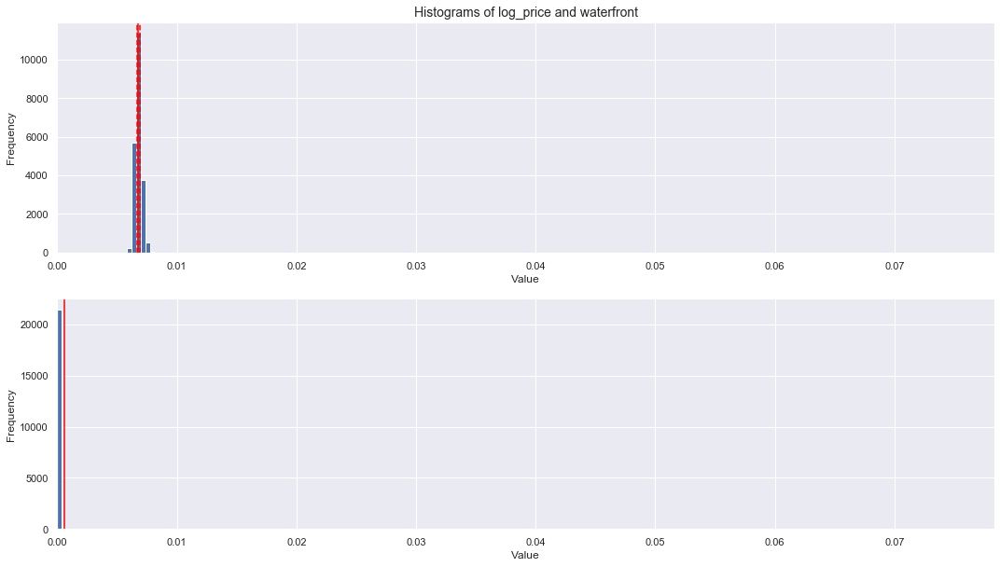


*** view
DegFreedom     21688.884043
Difference         0.004808
t-Statistic      108.557246
PValue             0.000000
Low95CI            0.004721
High95CI           0.004894
dtype: float64


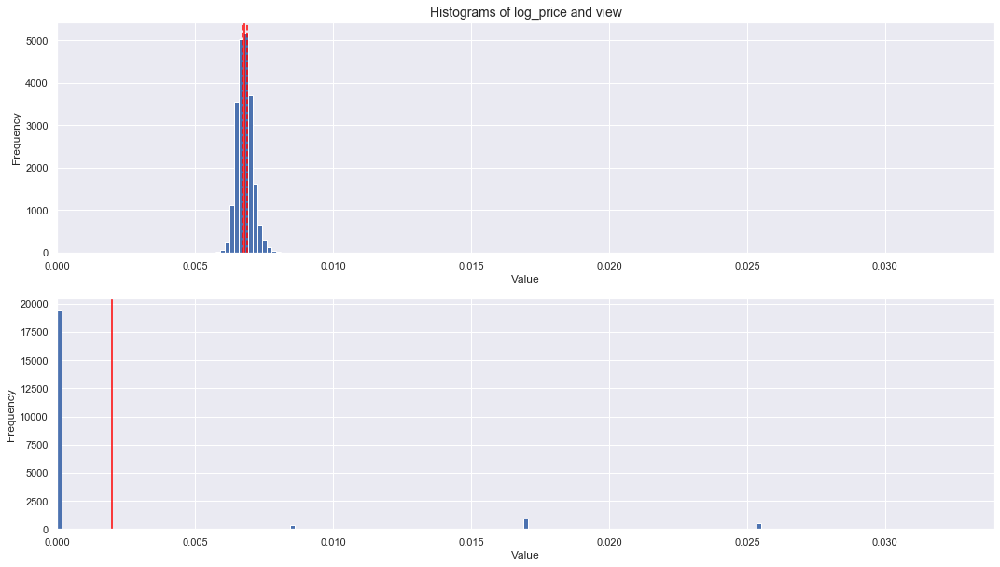


*** condition
DegFreedom     2.360817e+04
Difference     1.150734e-04
t-Statistic    1.296904e+01
PValue         2.478766e-38
Low95CI        9.768191e-05
High95CI       1.324650e-04
dtype: float64


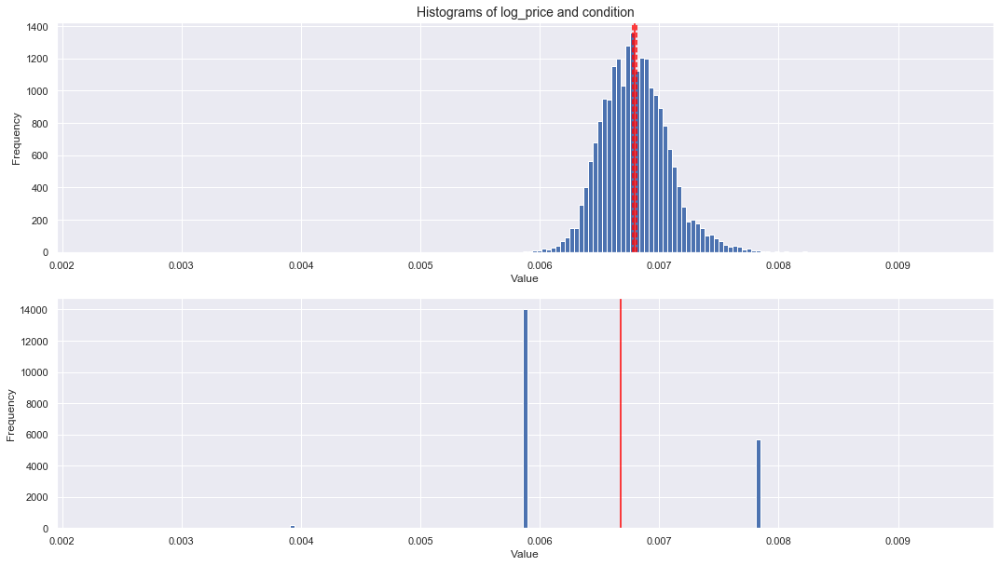


*** grade
DegFreedom     2.465068e+04
Difference     7.322615e-05
t-Statistic    1.007997e+01
PValue         7.535803e-24
Low95CI        5.898725e-05
High95CI       8.746505e-05
dtype: float64


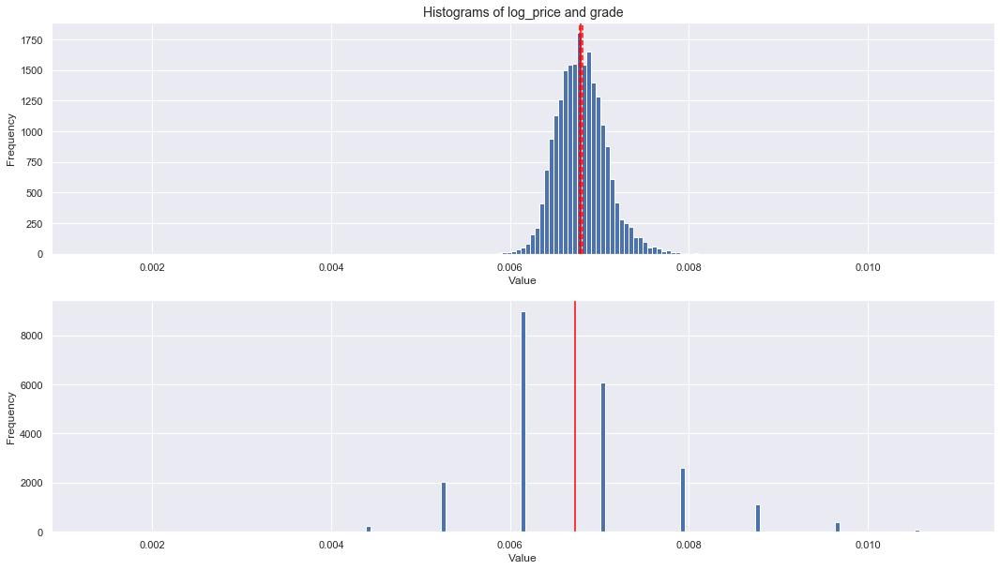


*** sqft_above
DegFreedom      2.201023e+04
Difference      6.240329e-04
t-Statistic     3.195177e+01
PValue         5.076627e-219
Low95CI         5.857518e-04
High95CI        6.623140e-04
dtype: float64


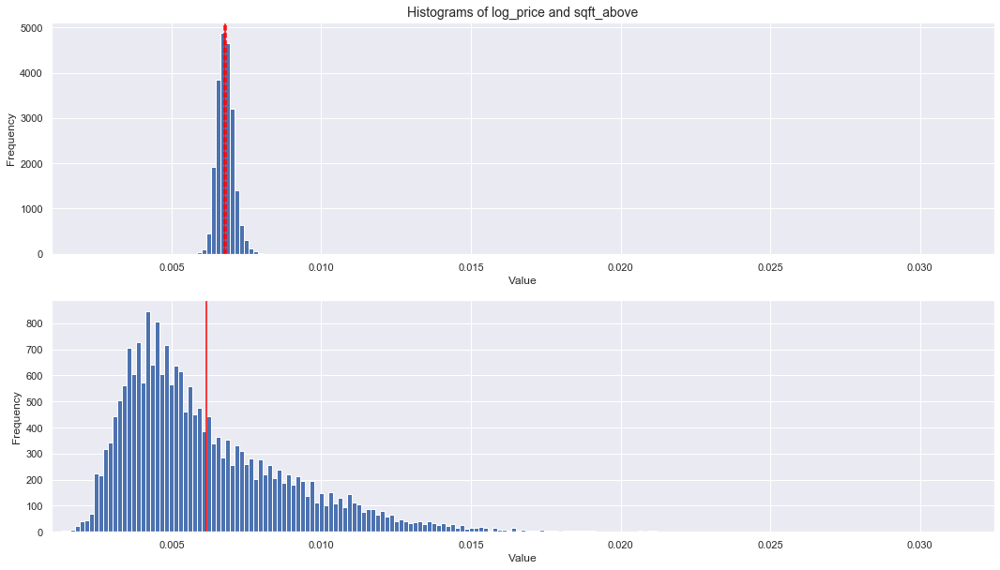


*** sqft_basement
DegFreedom     21712.815622
Difference         0.003055
t-Statistic       78.967679
PValue             0.000000
Low95CI            0.002979
High95CI           0.003131
dtype: float64


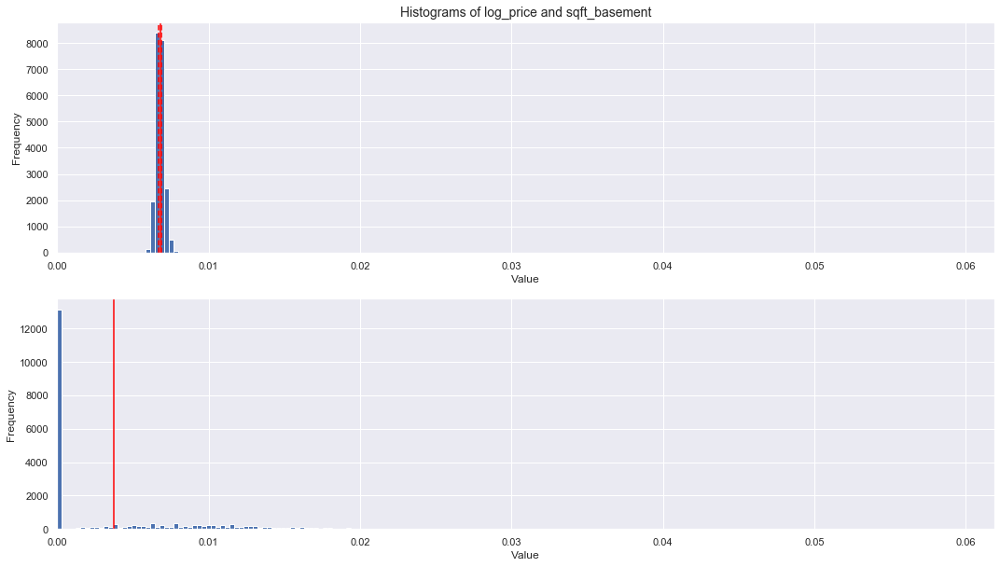


*** yr_built
DegFreedom     2.740397e+04
Difference    -4.779431e-06
t-Statistic   -2.402416e+00
PValue         1.629379e-02
Low95CI       -8.678808e-06
High95CI      -8.800534e-07
dtype: float64


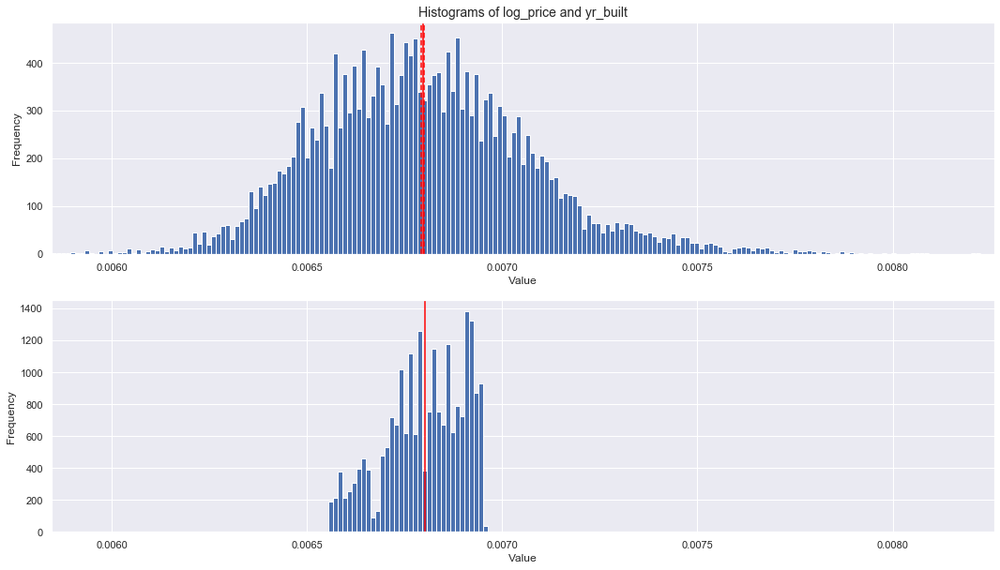


*** yr_renovated
DegFreedom     21685.415288
Difference         0.005398
t-Statistic      119.106334
PValue             0.000000
Low95CI            0.005309
High95CI           0.005487
dtype: float64


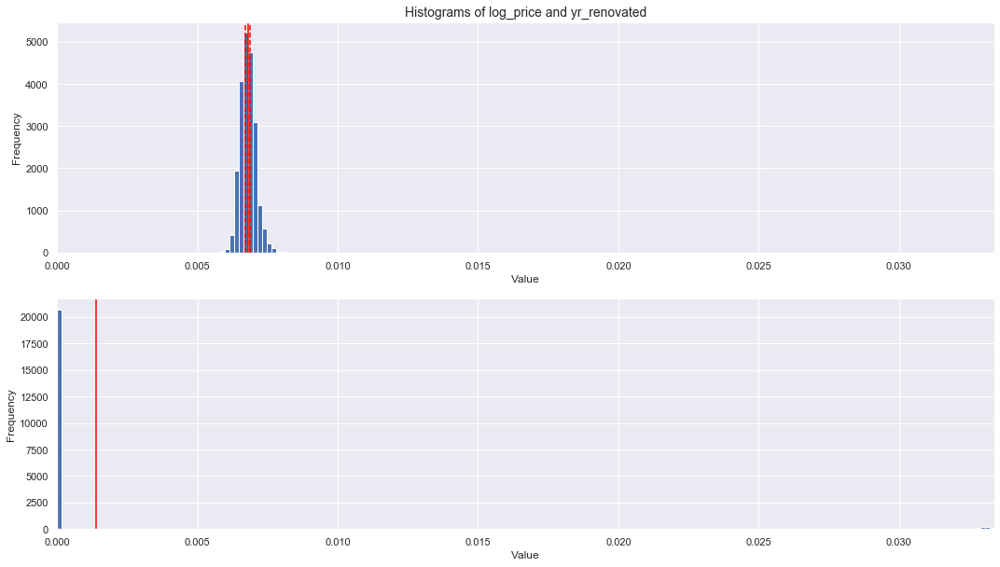


*** zipcode
DegFreedom     21619.907750
Difference        -0.000006
t-Statistic       -2.964997
PValue             0.003030
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


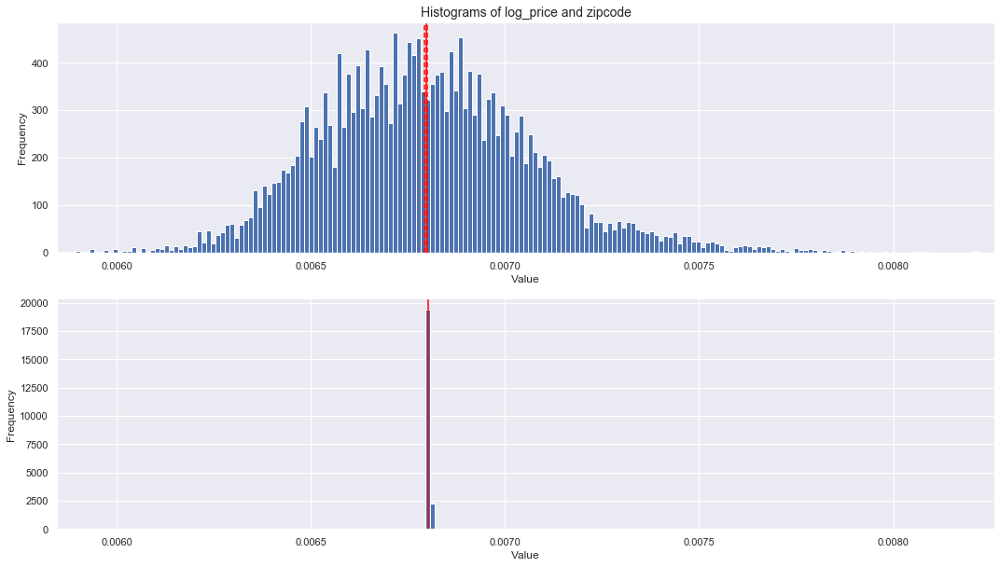


*** lat
DegFreedom     21837.530576
Difference        -0.000006
t-Statistic       -2.942674
PValue             0.003257
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


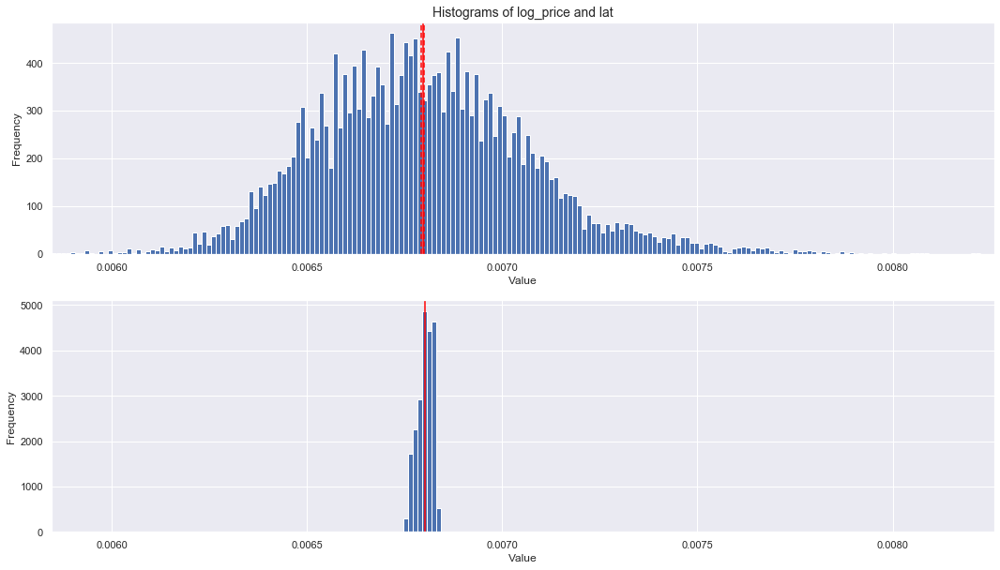


*** long
DegFreedom     21647.281308
Difference        -0.000006
t-Statistic       -2.962182
PValue             0.003058
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


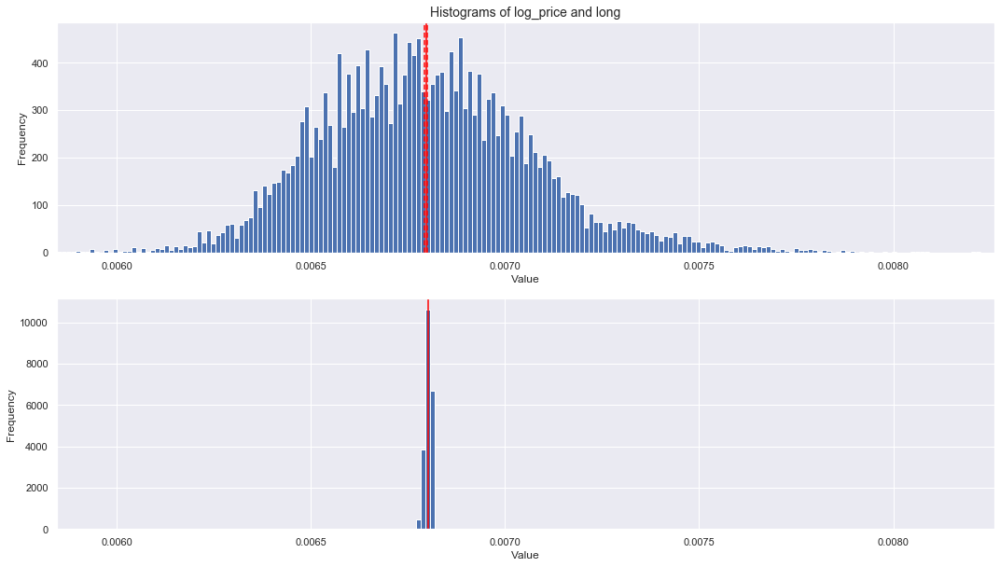


*** sqft_living15
DegFreedom      2.227286e+04
Difference      3.663999e-04
t-Statistic     2.409668e+01
PValue         1.131951e-126
Low95CI         3.365962e-04
High95CI        3.962036e-04
dtype: float64


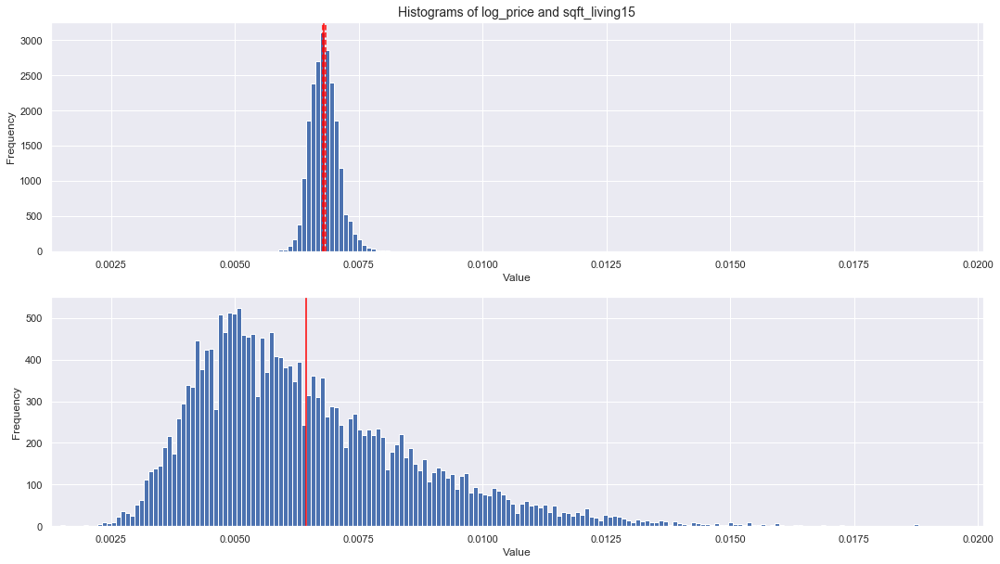


*** sqft_lot15
DegFreedom     21697.687309
Difference         0.003915
t-Statistic       93.317637
PValue             0.000000
Low95CI            0.003833
High95CI           0.003997
dtype: float64


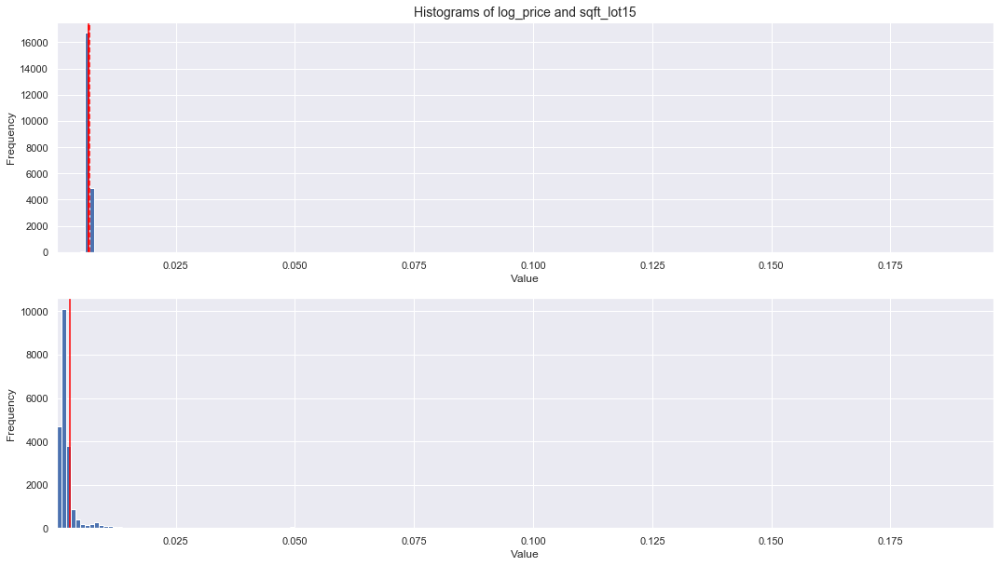

In [33]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['log_price', item]
    helper_tTest(housingNorm_df, features)

### Feature: log_price (II)  
> - From the above results, feature 'log_price' appears to reject the null hypothesis for the following features:  
>       - yr_built
>       - zipcode
>       - lat
>       - long
> - Although these 4 features appear very close to being statistically significant, they are not.  
> - Further validation of the same conclusion is achieved by observation of the t-statistics as shown in table of prior to each plot.  
> - The tables show a small p-value, with a small t-statistic, but the secondary feature remains ***outside*** of the confidence interval.  
> - Therefore, all dataset features with a null hypothesis assessed against 'log_price' must be rejected.


*** yr_built
DegFreedom     2.740397e+04
Difference    -4.779431e-06
t-Statistic   -2.402416e+00
PValue         1.629379e-02
Low95CI       -8.678808e-06
High95CI      -8.800534e-07
dtype: float64


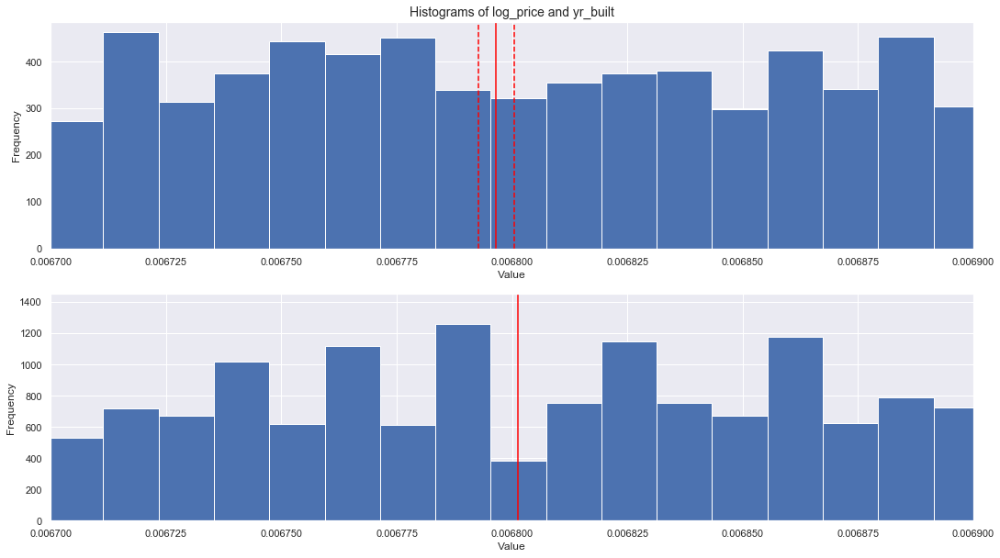


*** zipcode
DegFreedom     21619.907750
Difference        -0.000006
t-Statistic       -2.964997
PValue             0.003030
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


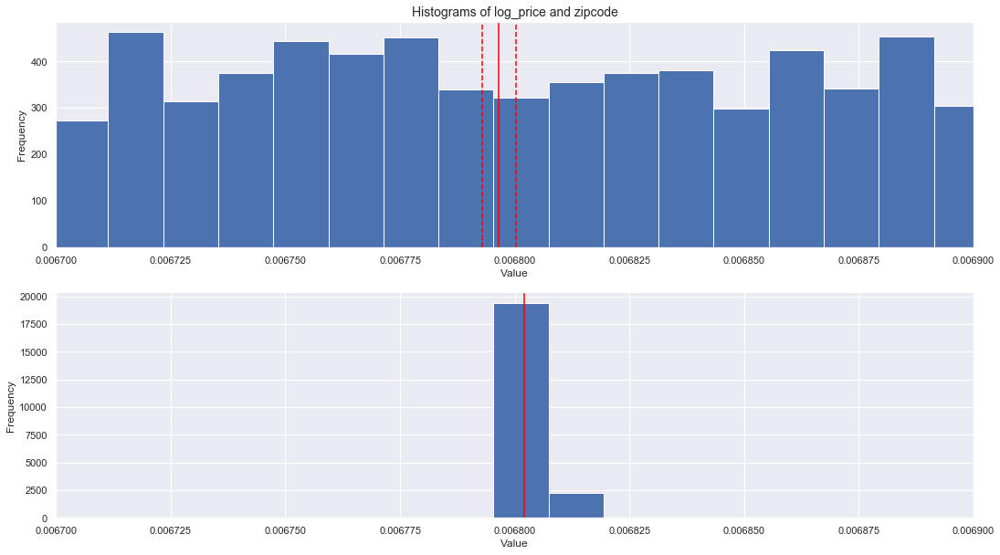


*** lat
DegFreedom     21837.530576
Difference        -0.000006
t-Statistic       -2.942674
PValue             0.003257
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


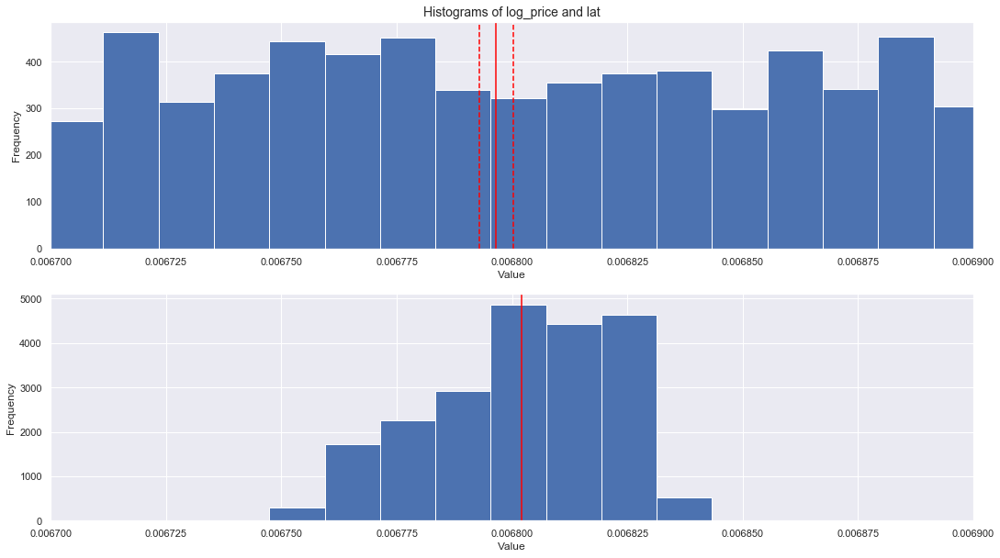


*** long
DegFreedom     21647.281308
Difference        -0.000006
t-Statistic       -2.962182
PValue             0.003058
Low95CI           -0.000009
High95CI          -0.000002
dtype: float64


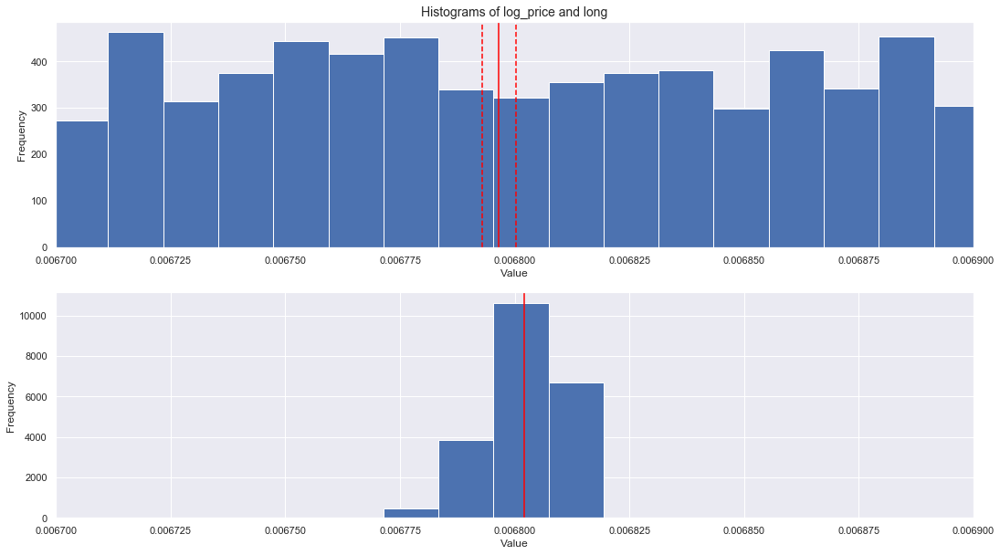

In [34]:
features_C = ['yr_built', 'zipcode', 'lat', 'long']
for item in features_C:
    print('\n*** ' + str(item))
    features = ['log_price', item]
    helper_tTest(housingNorm_df, features, True)

### Feature: grade (I)


*** price
DegFreedom     24744.409884
Difference         0.001098
t-Statistic       40.747702
PValue             0.000000
Low95CI            0.001045
High95CI           0.001151
dtype: float64


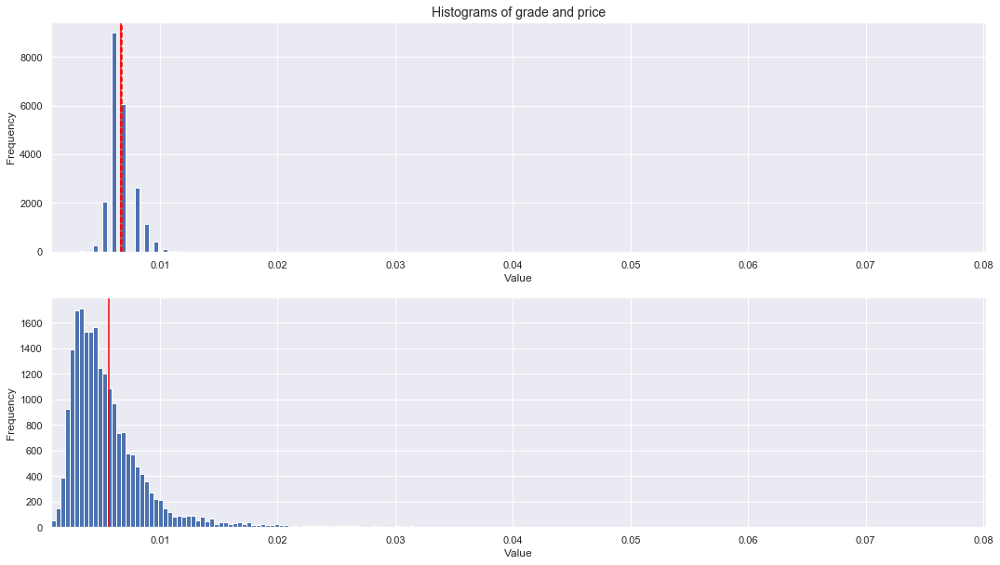


*** log_price
DegFreedom     2.465068e+04
Difference    -7.322615e-05
t-Statistic   -1.007997e+01
PValue         7.535803e-24
Low95CI       -8.746505e-05
High95CI      -5.898725e-05
dtype: float64


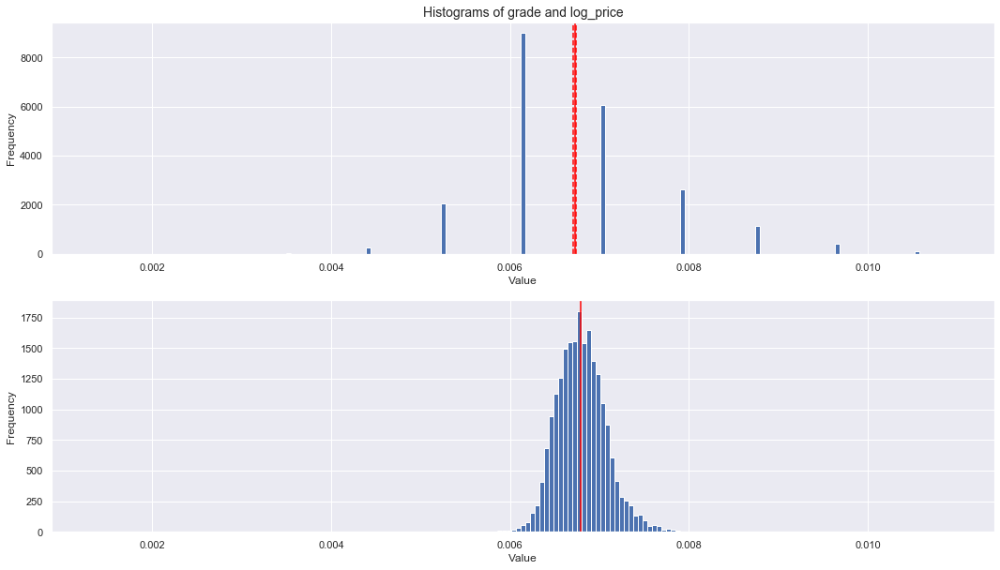


*** bedrooms
DegFreedom     3.433263e+04
Difference     1.662410e-04
t-Statistic    1.173346e+01
PValue         9.874418e-32
Low95CI        1.384711e-04
High95CI       1.940110e-04
dtype: float64


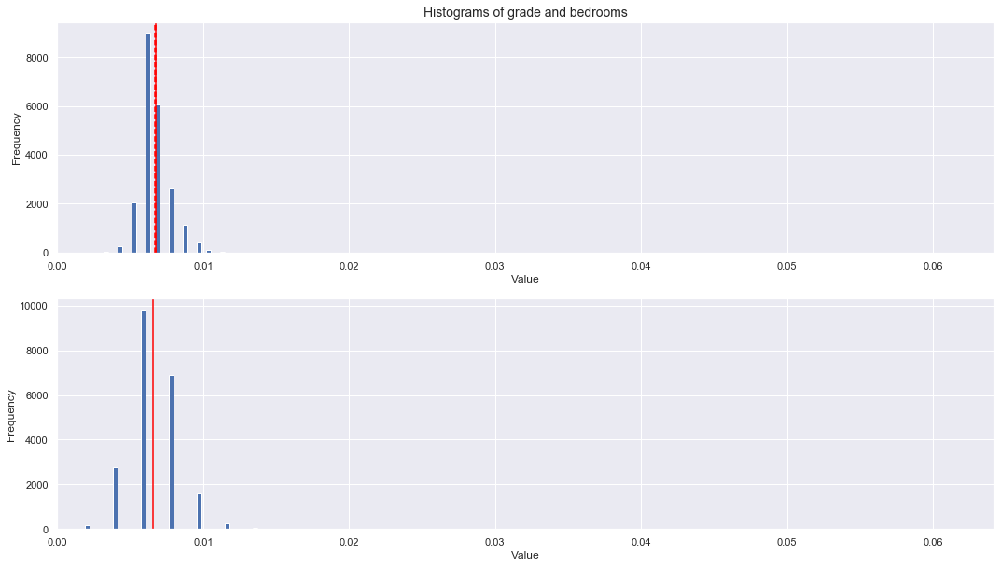


*** bathrooms
DegFreedom     2.979455e+04
Difference     3.318798e-04
t-Statistic    1.916186e+01
PValue         2.381289e-81
Low95CI        2.979322e-04
High95CI       3.658274e-04
dtype: float64


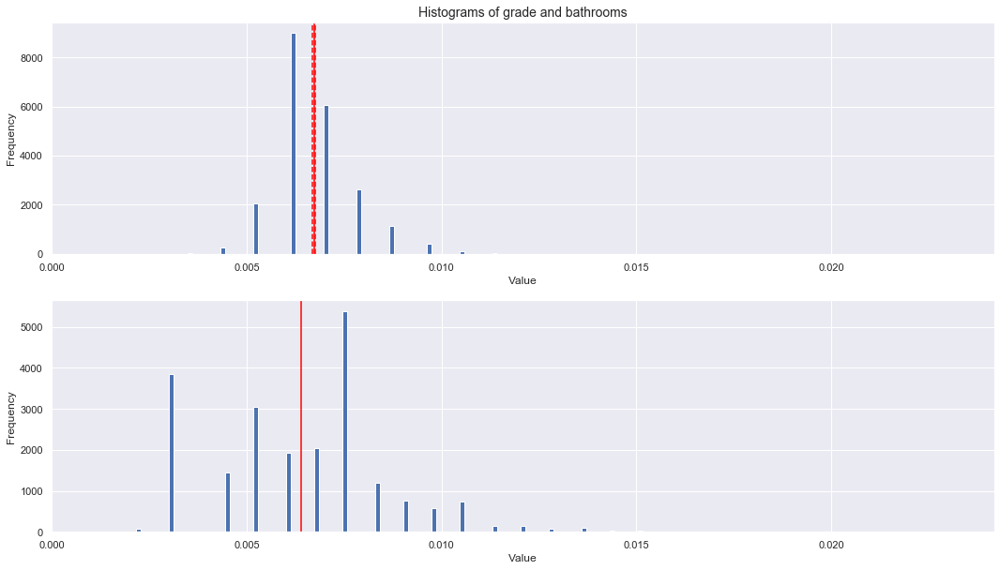


*** sqft_living
DegFreedom      2.759203e+04
Difference      5.008789e-04
t-Statistic     2.508749e+01
PValue         2.363076e-137
Low95CI         4.617460e-04
High95CI        5.400119e-04
dtype: float64


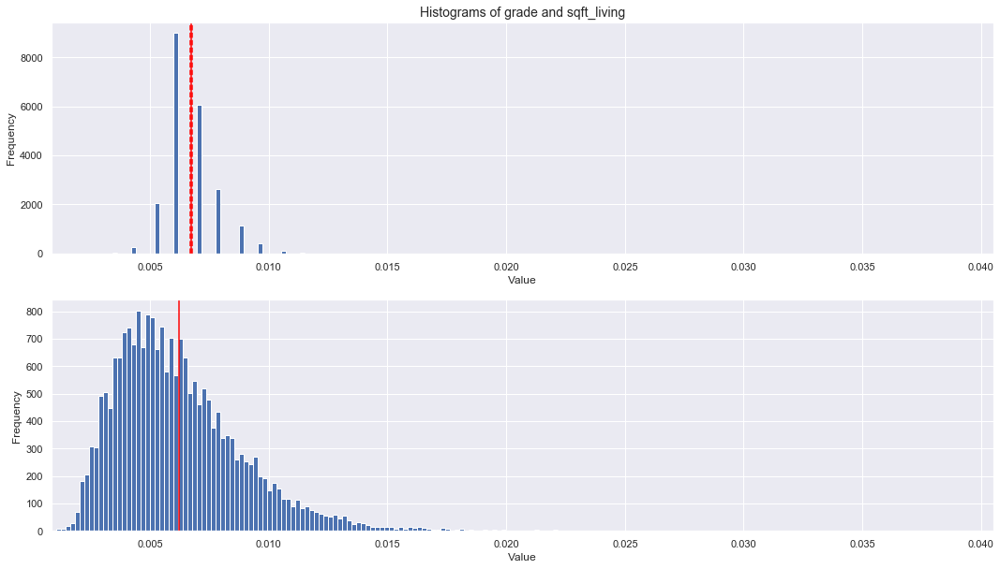


*** sqft_lot
DegFreedom     22738.797933
Difference         0.004393
t-Statistic       99.759447
PValue             0.000000
Low95CI            0.004306
High95CI           0.004479
dtype: float64


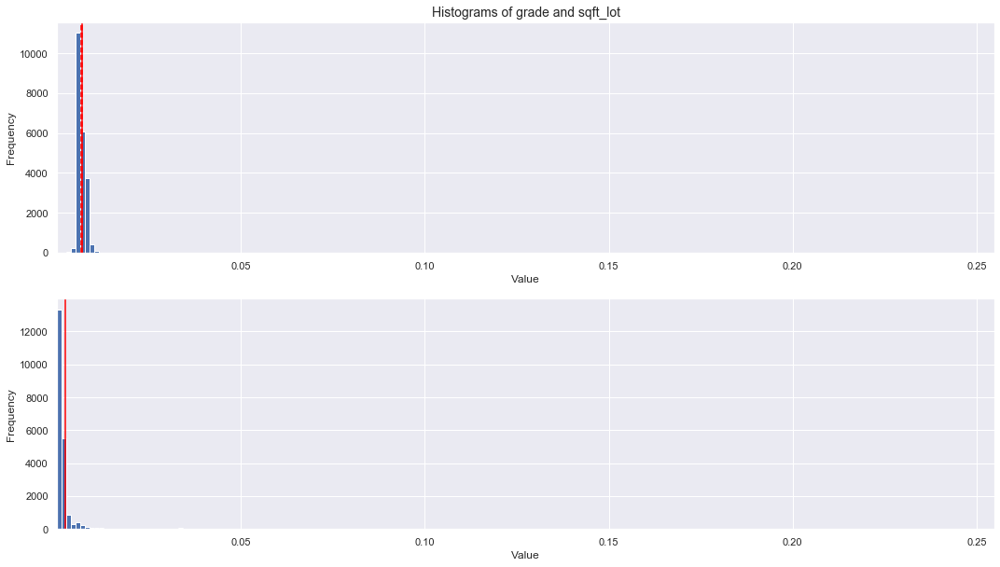


*** floors
DegFreedom     2.989921e+04
Difference     3.260961e-04
t-Statistic    1.893626e+01
PValue         1.675539e-79
Low95CI        2.923428e-04
High95CI       3.598495e-04
dtype: float64


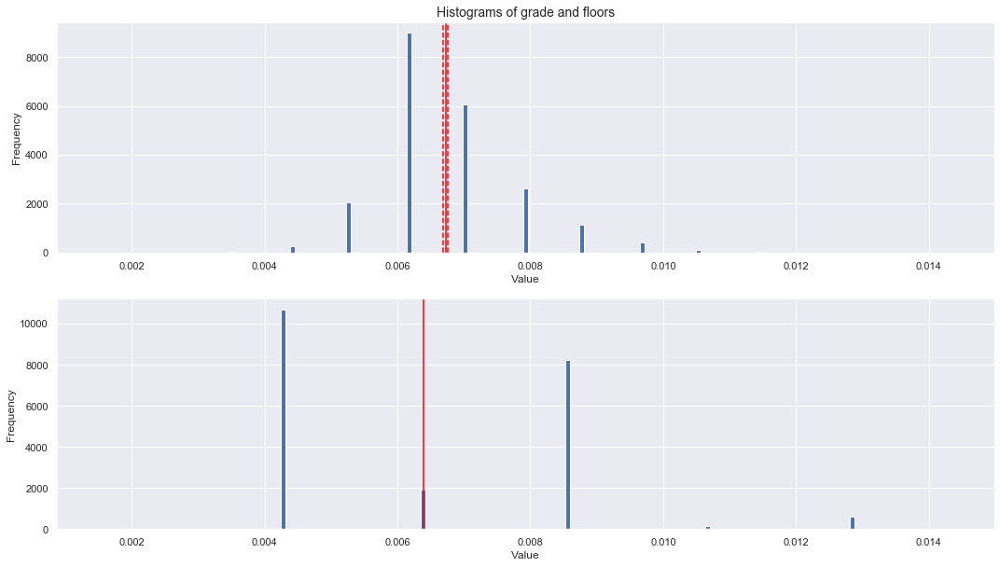


*** waterfront
DegFreedom     22614.201036
Difference         0.006133
t-Statistic      131.526899
PValue             0.000000
Low95CI            0.006041
High95CI           0.006224
dtype: float64


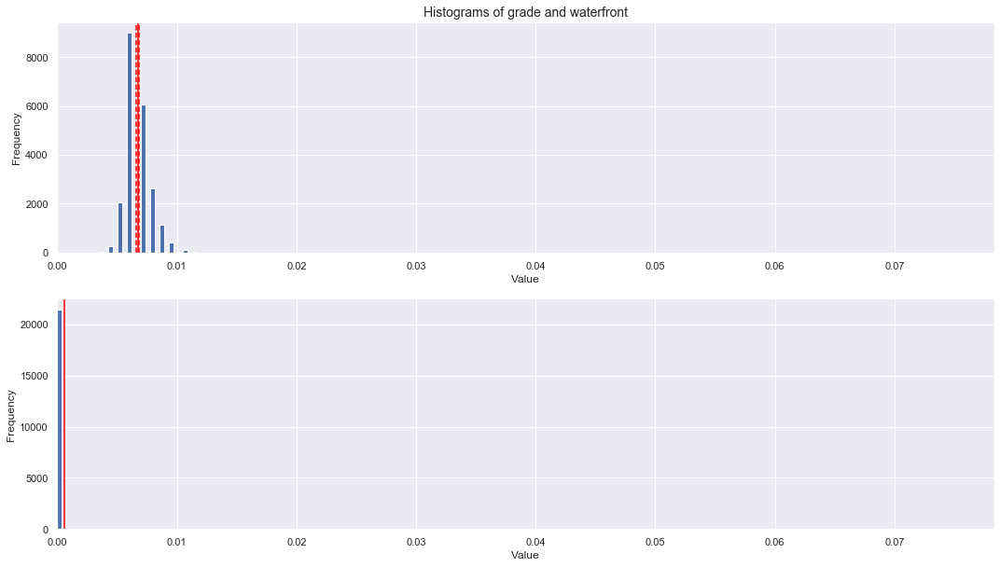


*** view
DegFreedom     22699.526701
Difference         0.004734
t-Statistic      105.676824
PValue             0.000000
Low95CI            0.004647
High95CI           0.004822
dtype: float64


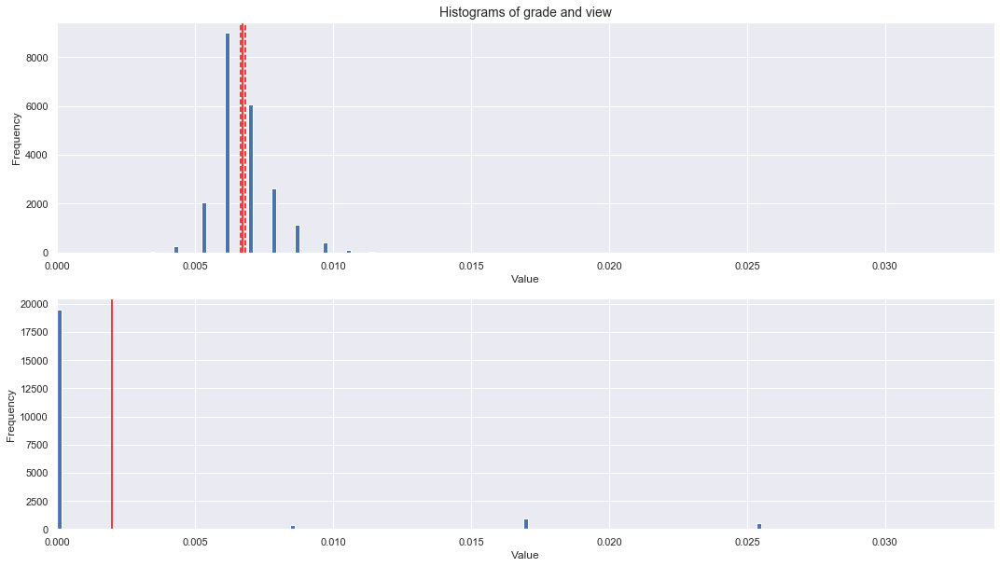


*** condition
DegFreedom     41424.608132
Difference         0.000042
t-Statistic        3.749882
PValue             0.000177
Low95CI            0.000020
High95CI           0.000064
dtype: float64


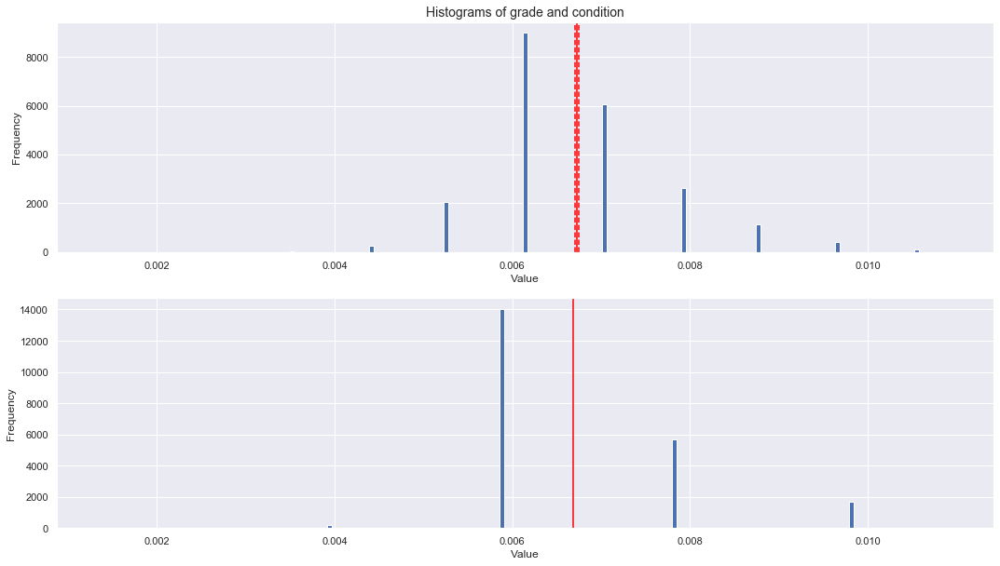


*** grade

*** sqft_above
DegFreedom      2.715474e+04
Difference      5.508067e-04
t-Statistic     2.664769e+01
PValue         1.848414e-154
Low95CI         5.102925e-04
High95CI        5.913209e-04
dtype: float64


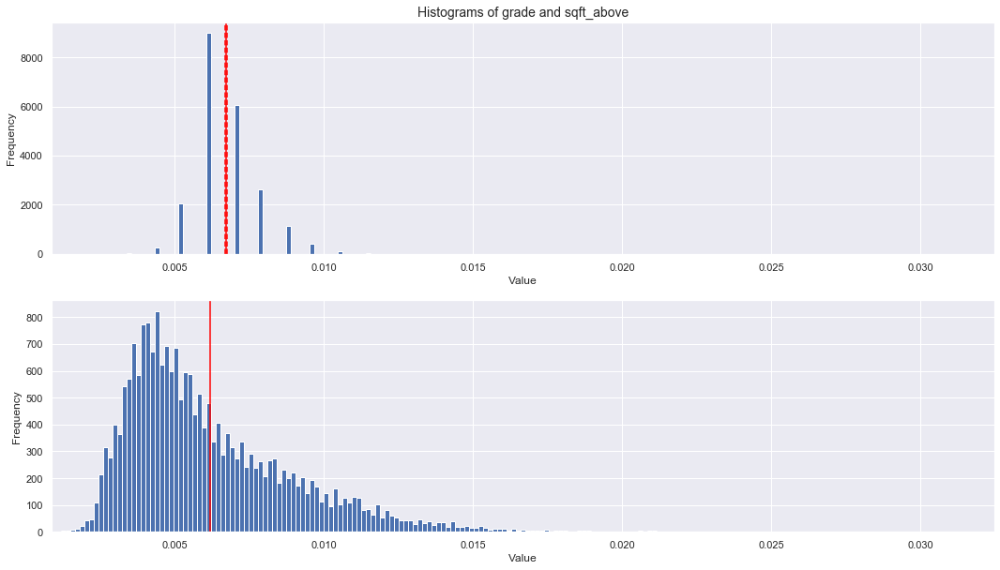


*** sqft_basement
DegFreedom     23037.393141
Difference         0.002982
t-Statistic       75.921632
PValue             0.000000
Low95CI            0.002905
High95CI           0.003059
dtype: float64


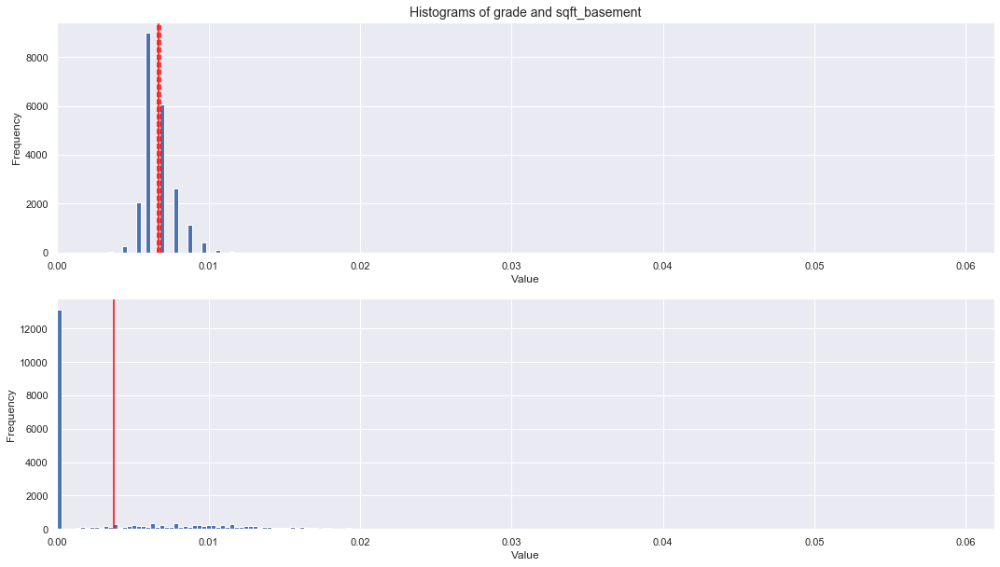


*** yr_built
DegFreedom     2.202880e+04
Difference    -7.800558e-05
t-Statistic   -1.105754e+01
PValue         2.393139e-28
Low95CI       -9.183293e-05
High95CI      -6.417823e-05
dtype: float64


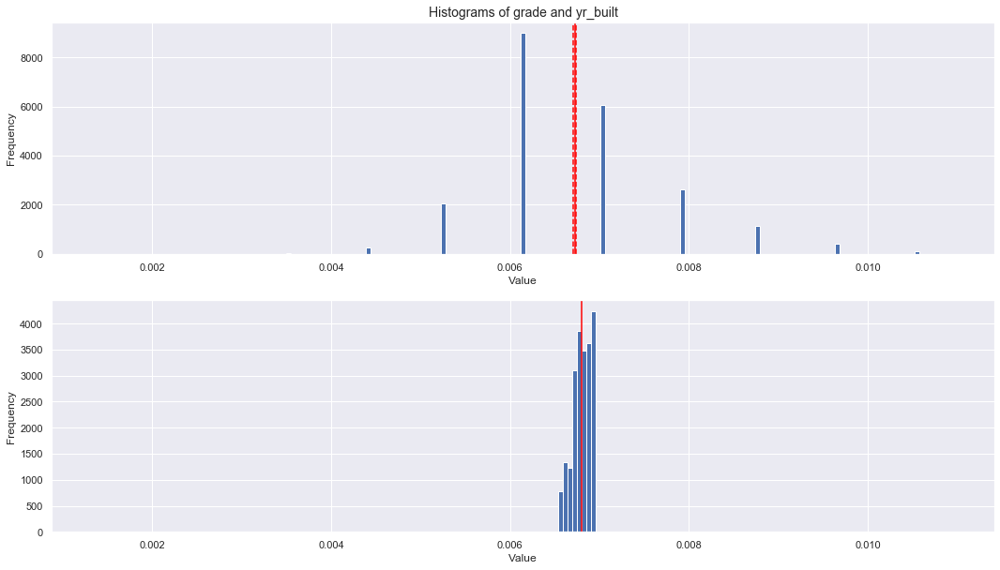


*** yr_renovated
DegFreedom     22650.518804
Difference         0.005325
t-Statistic      116.201810
PValue             0.000000
Low95CI            0.005235
High95CI           0.005414
dtype: float64


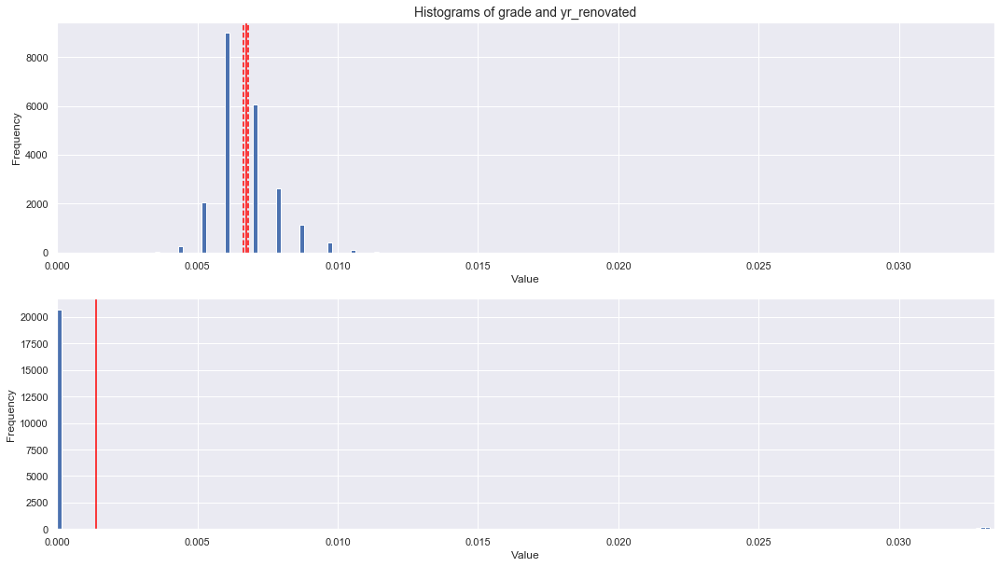


*** zipcode
DegFreedom     2.161256e+04
Difference    -7.875975e-05
t-Statistic   -1.121808e+01
PValue         4.001000e-29
Low95CI       -9.252101e-05
High95CI      -6.499849e-05
dtype: float64


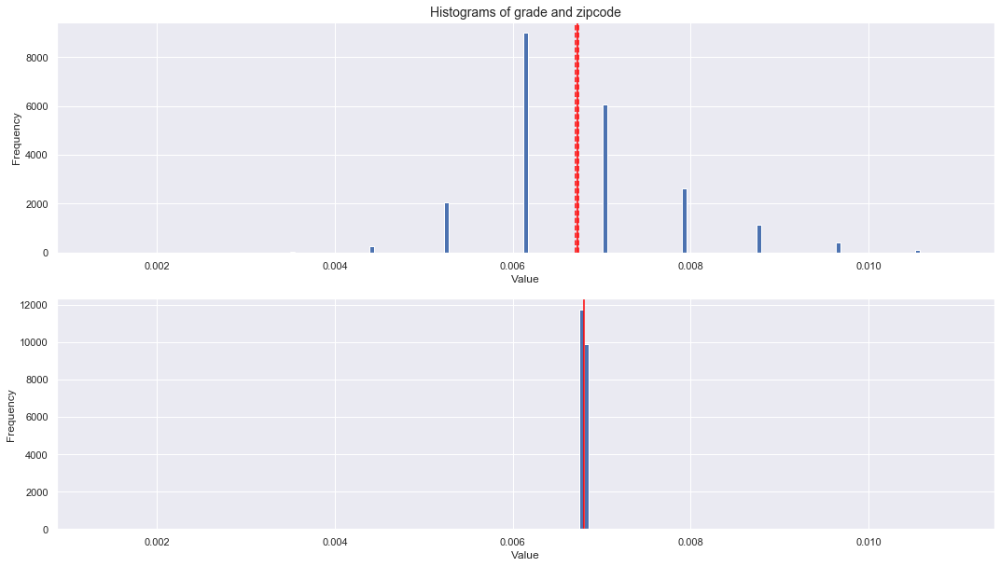


*** lat
DegFreedom     2.162793e+04
Difference    -7.873190e-05
t-Statistic   -1.121212e+01
PValue         4.277658e-29
Low95CI       -9.249560e-05
High95CI      -6.496819e-05
dtype: float64


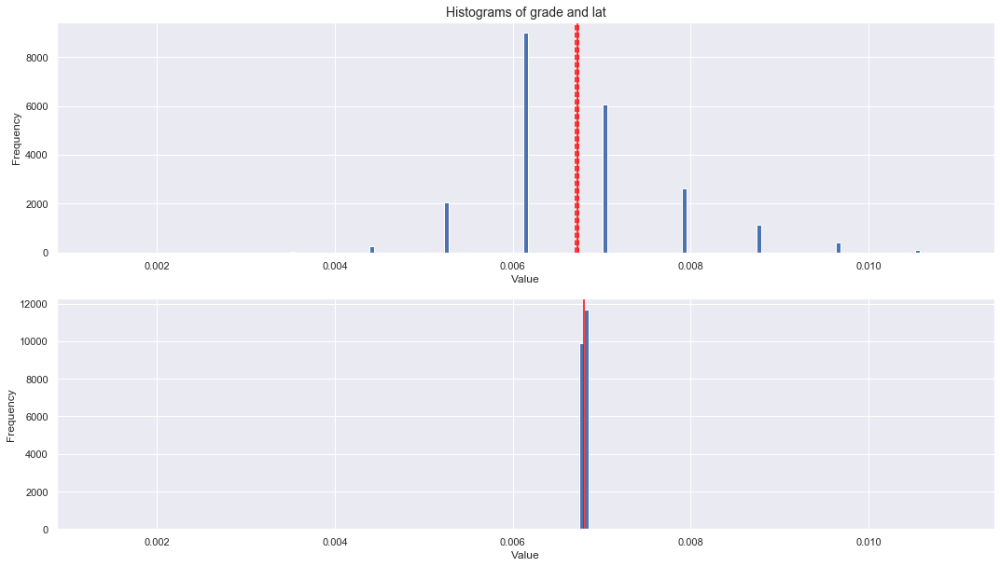


*** long
DegFreedom     2.161449e+04
Difference    -7.875625e-05
t-Statistic   -1.121733e+01
PValue         4.034803e-29
Low95CI       -9.251781e-05
High95CI      -6.499468e-05
dtype: float64


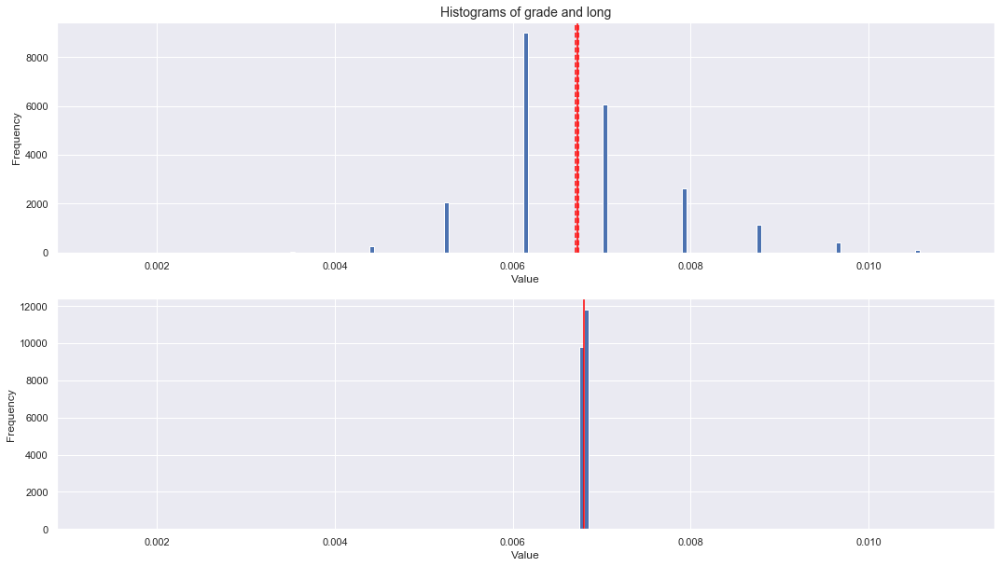


*** sqft_living15
DegFreedom     3.054918e+04
Difference     2.931738e-04
t-Statistic    1.761469e+01
PValue         4.176670e-69
Low95CI        2.605514e-04
High95CI       3.257961e-04
dtype: float64


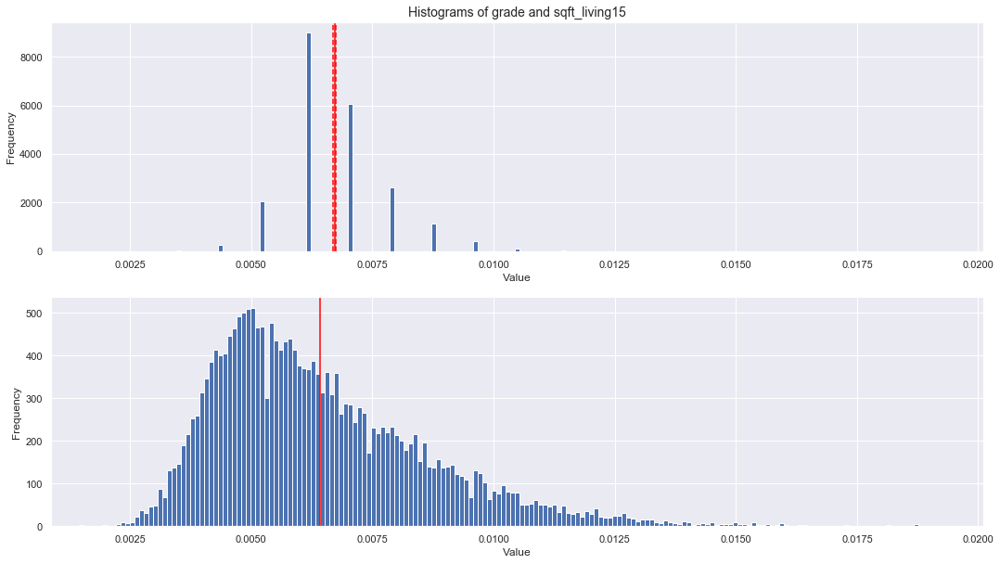


*** sqft_lot15
DegFreedom     22823.864179
Difference         0.003842
t-Statistic       90.403448
PValue             0.000000
Low95CI            0.003759
High95CI           0.003925
dtype: float64


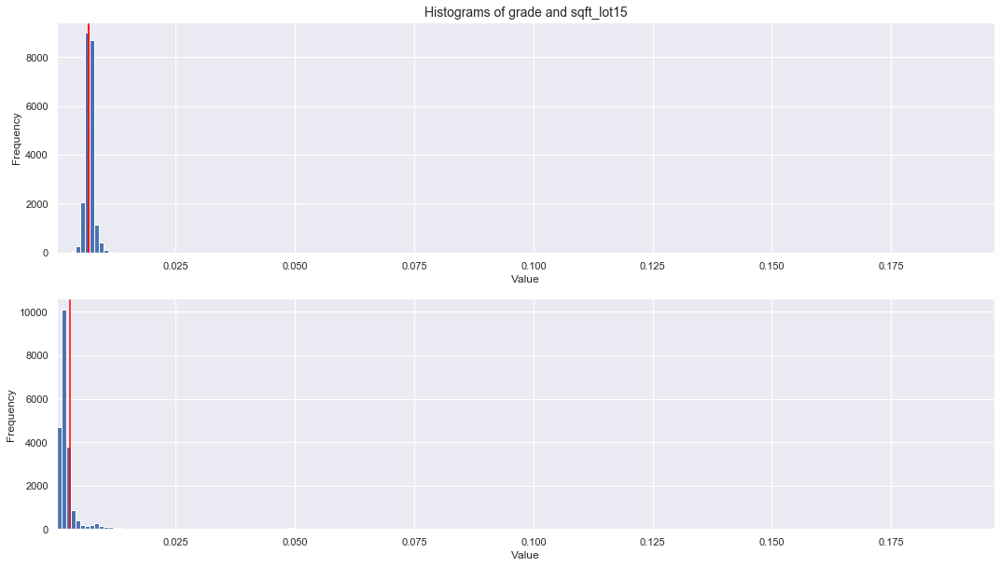

In [35]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['grade', item]
    helper_tTest(housingNorm_df, features)

### Feature: grade (II)
> - From the above results, feature 'grade' appears to reject the null hypothesis for the following features:
>       - log_price
>       - bedrooms
>       - condition  
> - Although these 3 features appear very close to being statistically significant, they are not.  
> - Further validation of the same conclusion is achieved by observation of the t-statistics as shown in table of prior to each plot.  
> - The tables show a small p-value, with a small t-statistic, but the secondary feature remains ***outside*** of the confidence interval.  
> - Therefore, all dataset features with a null hypothesis assessed against 'grade' must be rejected.


*** log_price
DegFreedom     2.465068e+04
Difference    -7.322615e-05
t-Statistic   -1.007997e+01
PValue         7.535803e-24
Low95CI       -8.746505e-05
High95CI      -5.898725e-05
dtype: float64


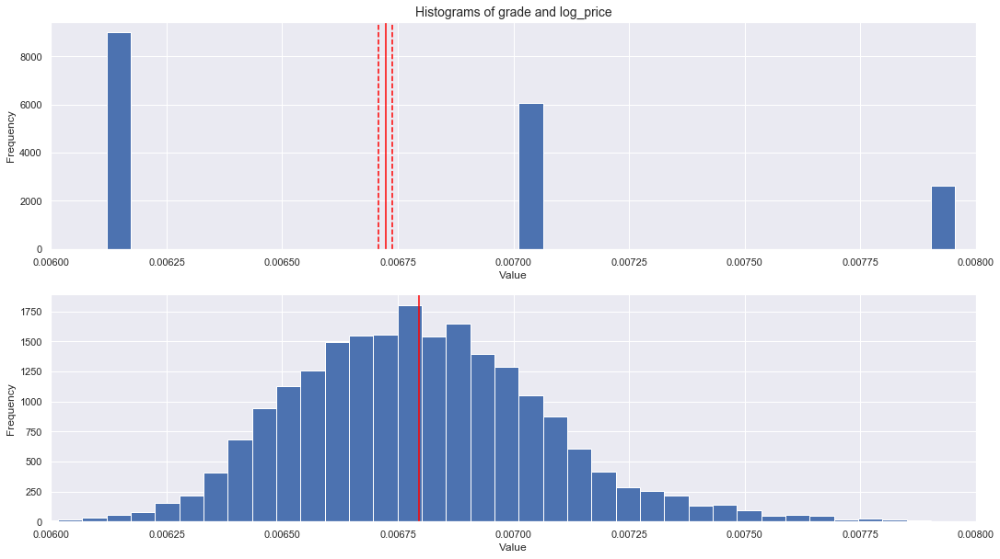


*** bedrooms
DegFreedom     3.433263e+04
Difference     1.662410e-04
t-Statistic    1.173346e+01
PValue         9.874418e-32
Low95CI        1.384711e-04
High95CI       1.940110e-04
dtype: float64


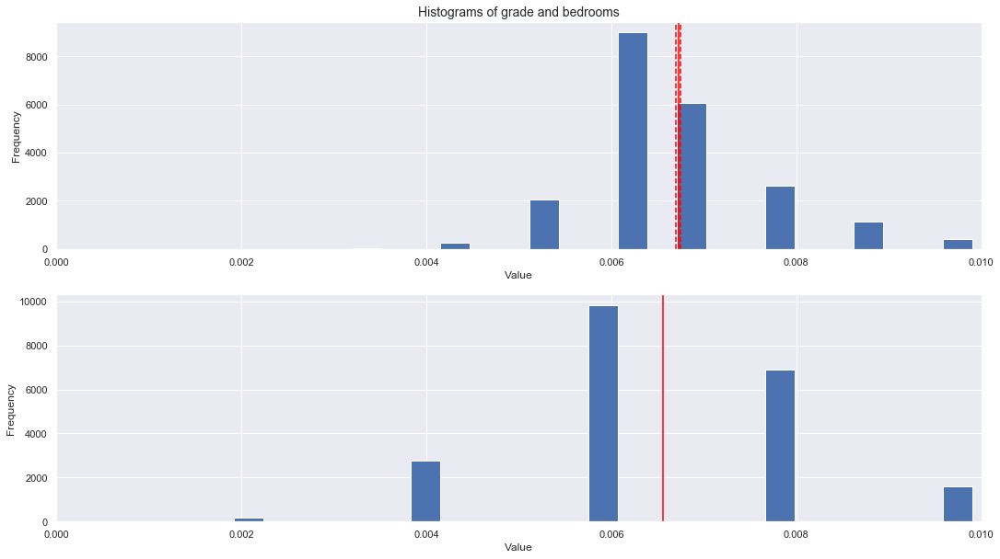


*** condition
DegFreedom     41424.608132
Difference         0.000042
t-Statistic        3.749882
PValue             0.000177
Low95CI            0.000020
High95CI           0.000064
dtype: float64


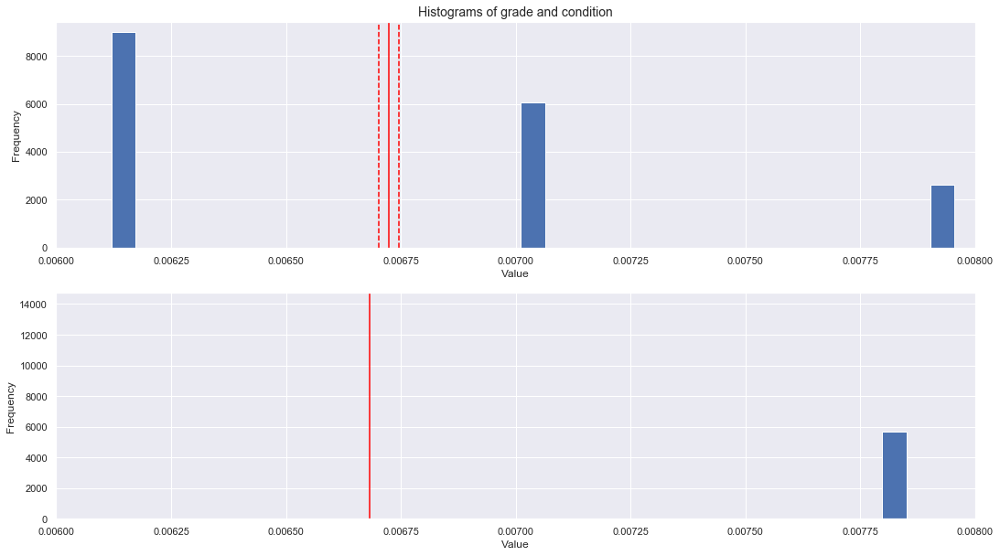

In [36]:
features_D = ['log_price', 'bedrooms', 'condition']
for item in features_D:
    print('\n*** ' + str(item))
    features = ['grade', item]
    helper_tTest(housingNorm_df, features, True)

### Feature: sqft_above
> - From the above results, feature 'sqft_above' appears to reject the null hypothesis for the following features:
>       - sqft_living


*** price
DegFreedom     4.001529e+04
Difference     5.470103e-04
t-Statistic    1.684483e+01
PValue         1.895618e-63
Low95CI        4.833616e-04
High95CI       6.106591e-04
dtype: float64


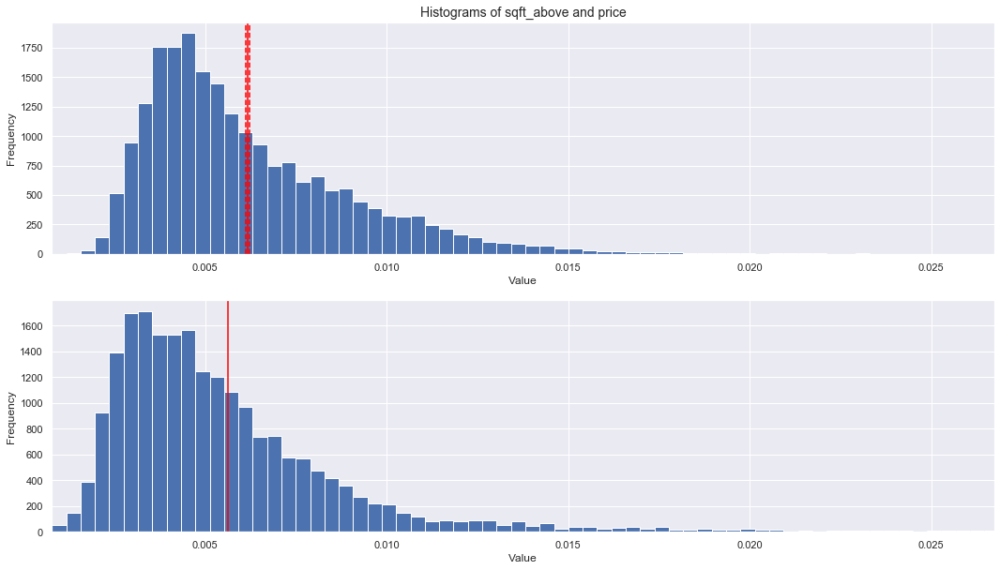


*** log_price
DegFreedom      2.201023e+04
Difference     -6.240329e-04
t-Statistic    -3.195177e+01
PValue         5.076627e-219
Low95CI        -6.623140e-04
High95CI       -5.857518e-04
dtype: float64


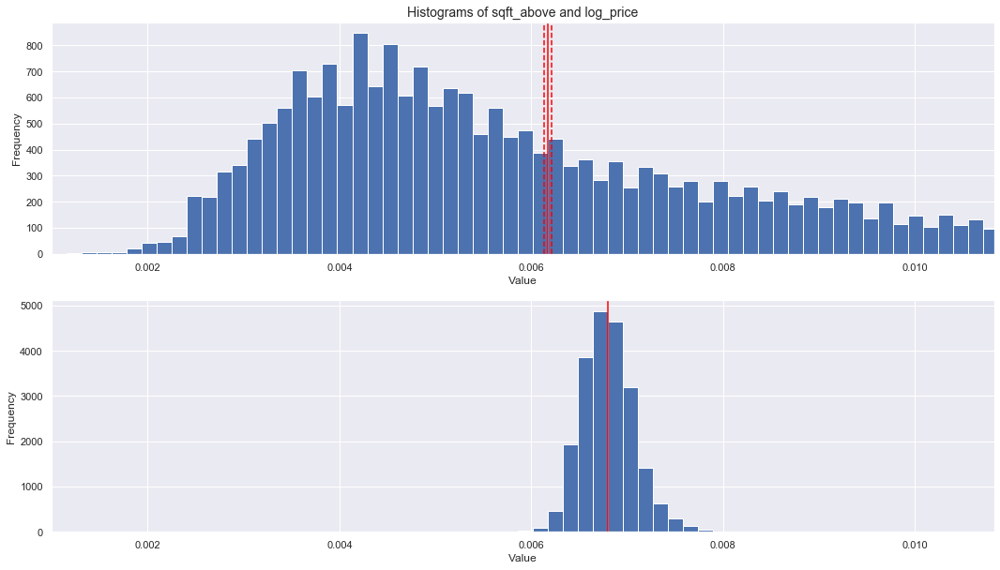


*** bedrooms
DegFreedom     3.653553e+04
Difference    -3.845657e-04
t-Statistic   -1.671391e+01
PValue         1.772496e-62
Low95CI       -4.296635e-04
High95CI      -3.394679e-04
dtype: float64


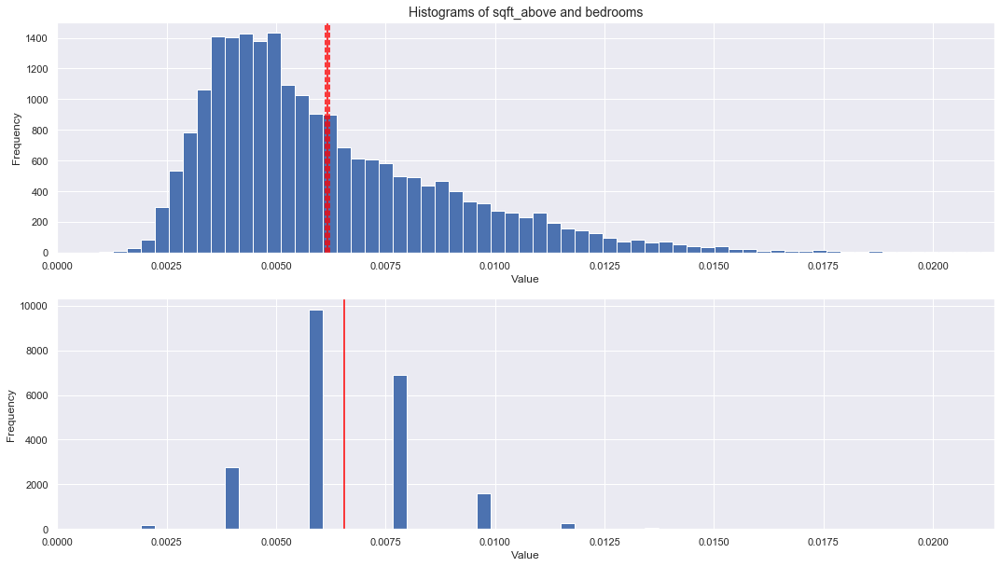


*** bathrooms
DegFreedom     4.152209e+04
Difference    -2.189270e-04
t-Statistic   -8.731678e+00
PValue         2.600846e-18
Low95CI       -2.680700e-04
High95CI      -1.697839e-04
dtype: float64


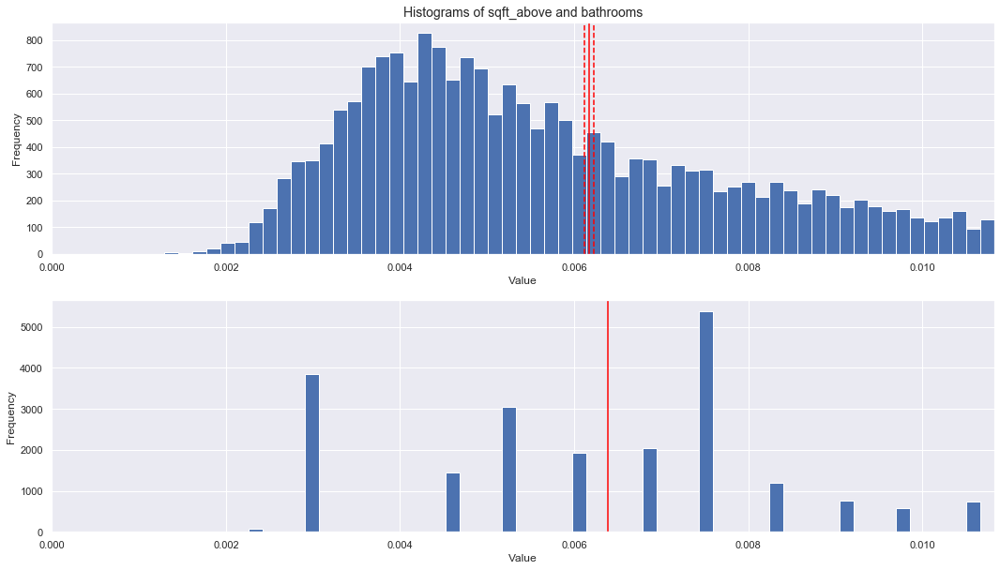


*** sqft_living
DegFreedom     43157.098285
Difference        -0.000050
t-Statistic       -1.851365
PValue             0.064124
Low95CI           -0.000103
High95CI           0.000003
dtype: float64


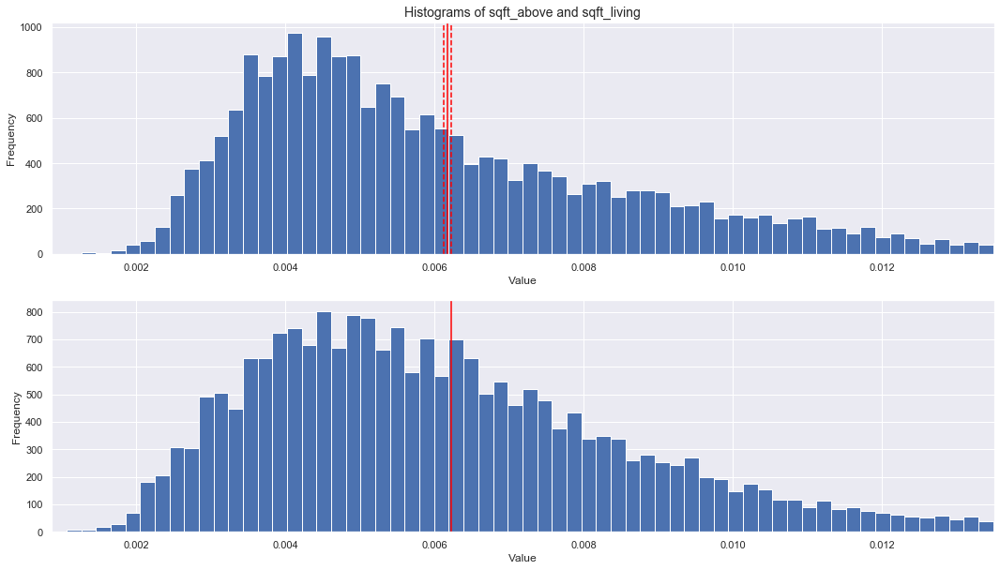


*** sqft_lot
DegFreedom     29925.413345
Difference         0.003842
t-Statistic       80.679348
PValue             0.000000
Low95CI            0.003748
High95CI           0.003935
dtype: float64


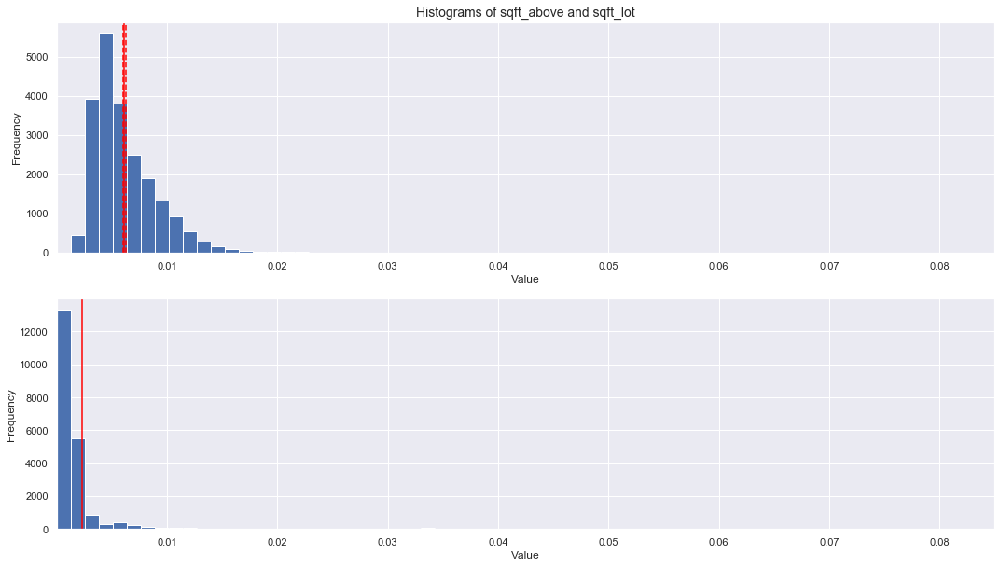


*** floors
DegFreedom     4.141434e+04
Difference    -2.247106e-04
t-Statistic   -8.986849e+00
PValue         2.648814e-19
Low95CI       -2.737197e-04
High95CI      -1.757015e-04
dtype: float64


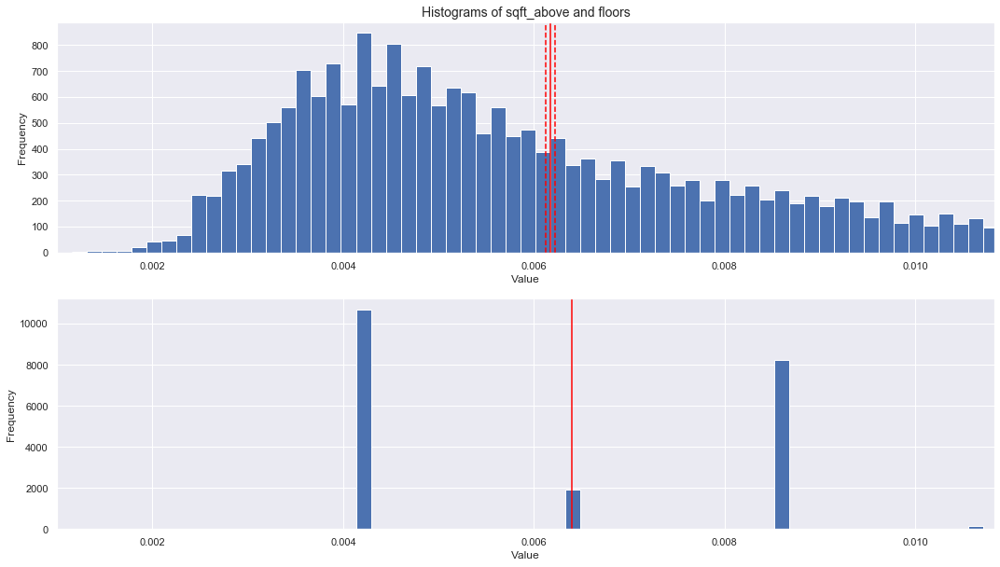


*** waterfront
DegFreedom     29065.067859
Difference         0.005582
t-Statistic      111.576392
PValue             0.000000
Low95CI            0.005484
High95CI           0.005680
dtype: float64


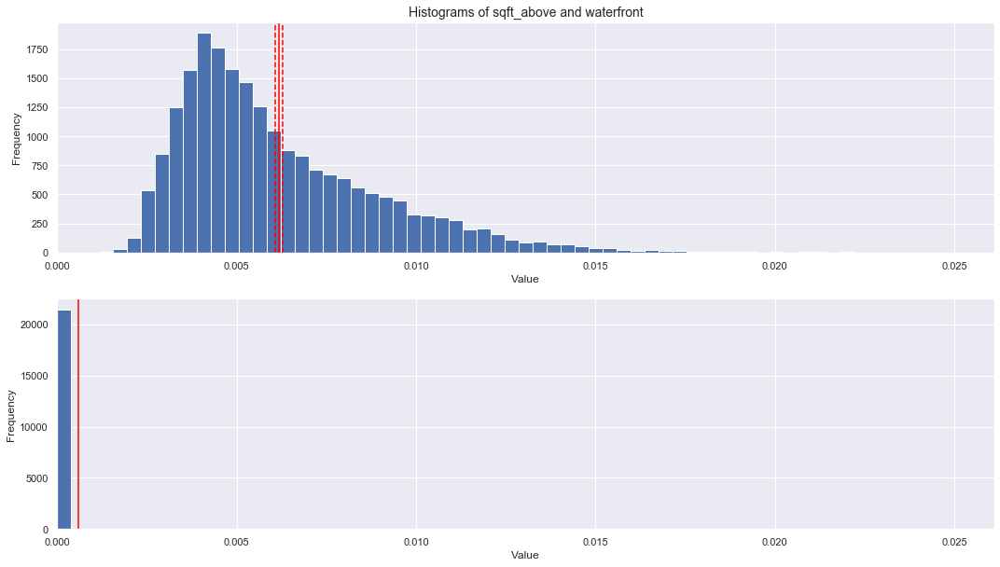


*** view
DegFreedom     29656.523281
Difference         0.004184
t-Statistic       86.563486
PValue             0.000000
Low95CI            0.004089
High95CI           0.004278
dtype: float64


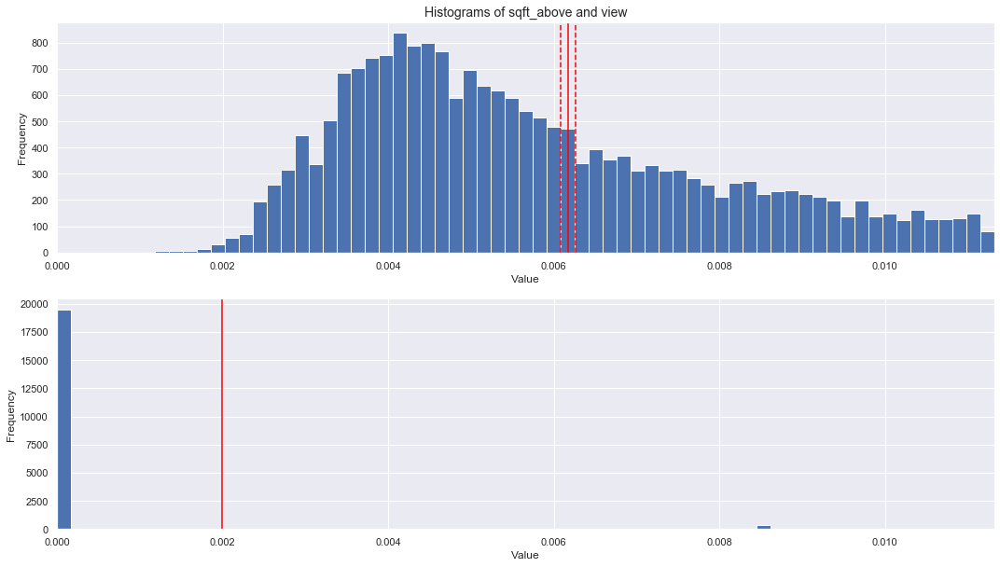


*** condition
DegFreedom      2.988929e+04
Difference     -5.089594e-04
t-Statistic    -2.390764e+01
PValue         3.824330e-125
Low95CI        -5.506860e-04
High95CI       -4.672329e-04
dtype: float64


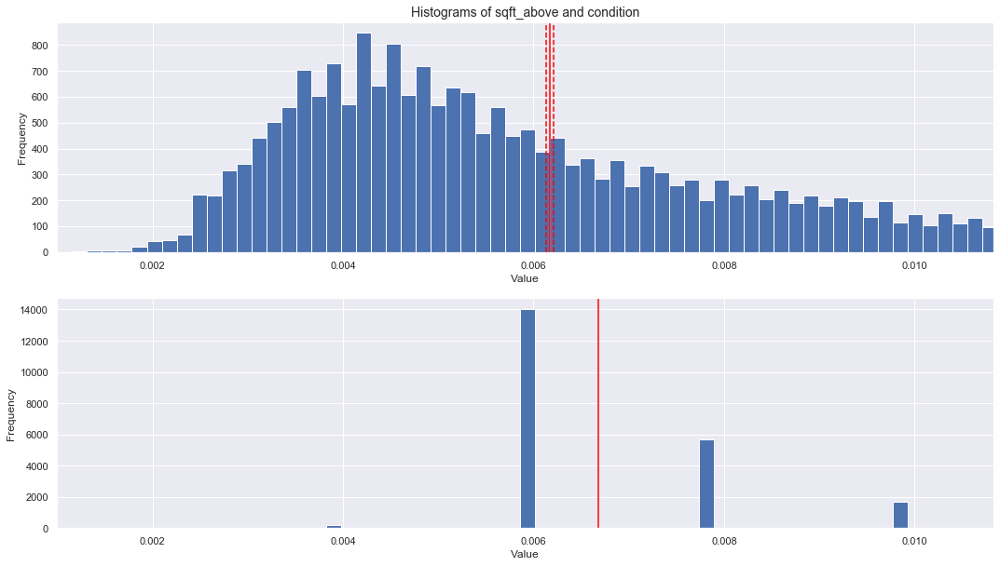


*** grade
DegFreedom      2.715474e+04
Difference     -5.508067e-04
t-Statistic    -2.664769e+01
PValue         1.848414e-154
Low95CI        -5.913209e-04
High95CI       -5.102925e-04
dtype: float64


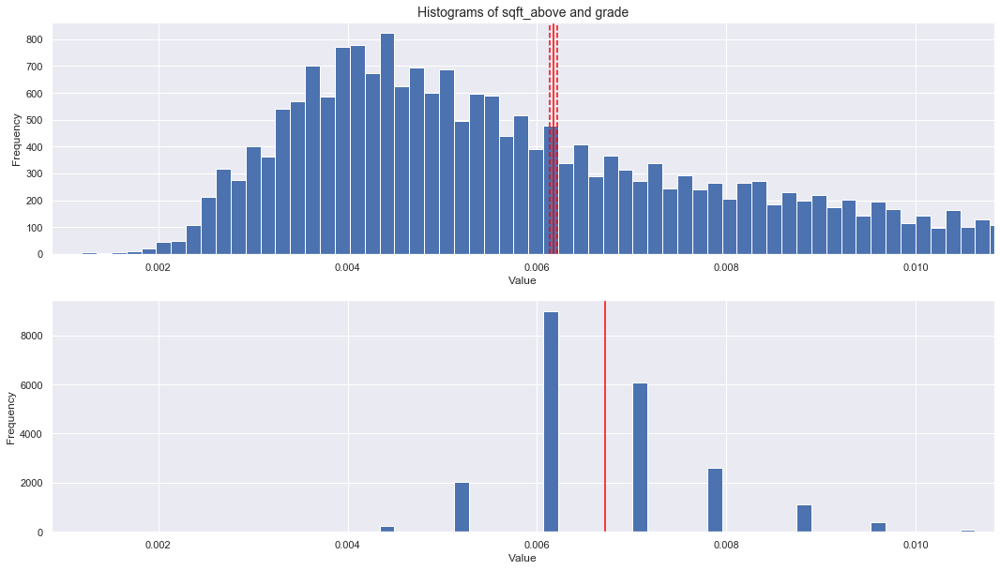


*** sqft_above

*** sqft_basement
DegFreedom     31894.761922
Difference         0.002431
t-Statistic       56.197866
PValue             0.000000
Low95CI            0.002346
High95CI           0.002516
dtype: float64


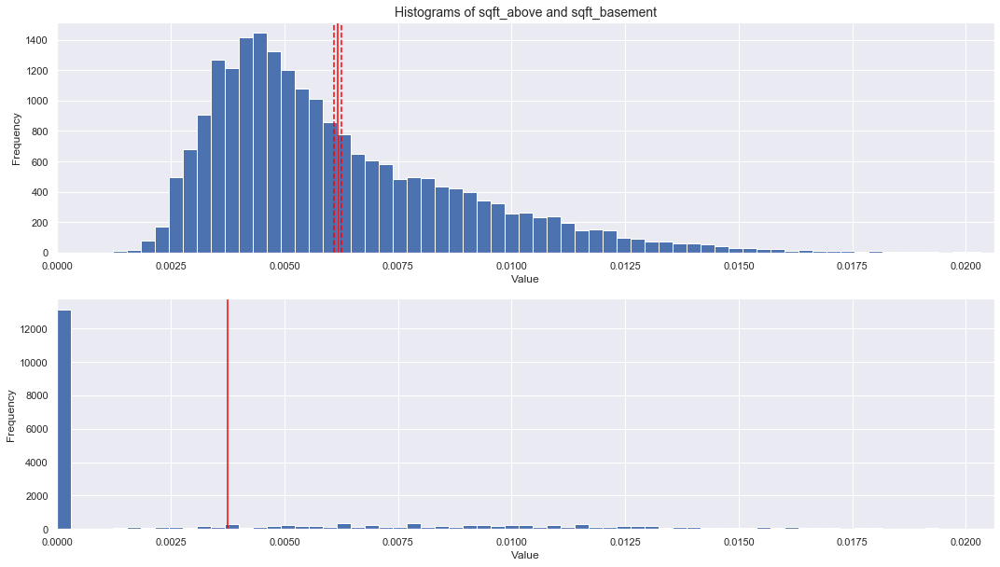


*** yr_built
DegFreedom      2.166636e+04
Difference     -6.288123e-04
t-Statistic    -3.232416e+01
PValue         6.556886e-224
Low95CI        -6.669423e-04
High95CI       -5.906824e-04
dtype: float64


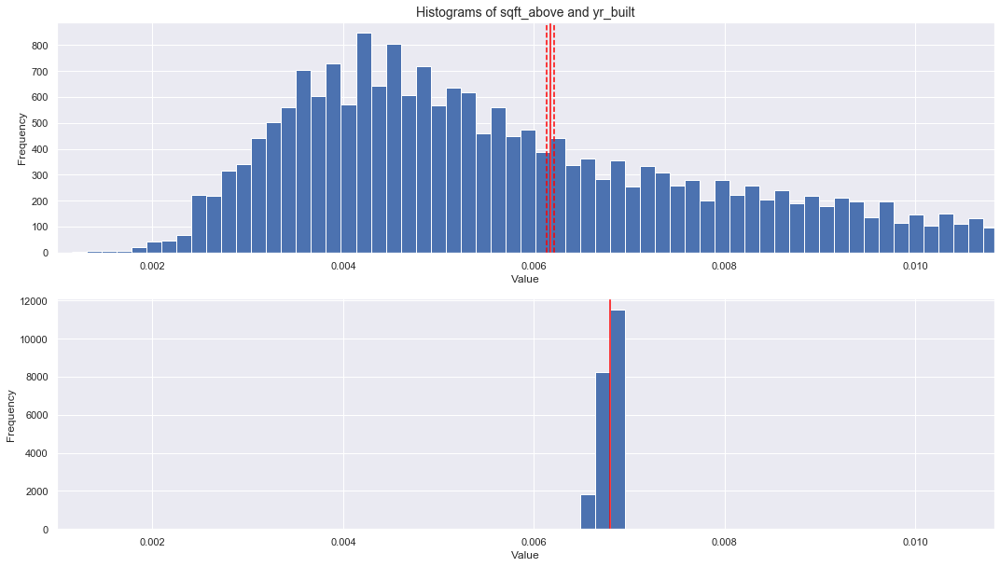


*** yr_renovated
DegFreedom     29317.997899
Difference         0.004774
t-Statistic       96.874565
PValue             0.000000
Low95CI            0.004677
High95CI           0.004870
dtype: float64


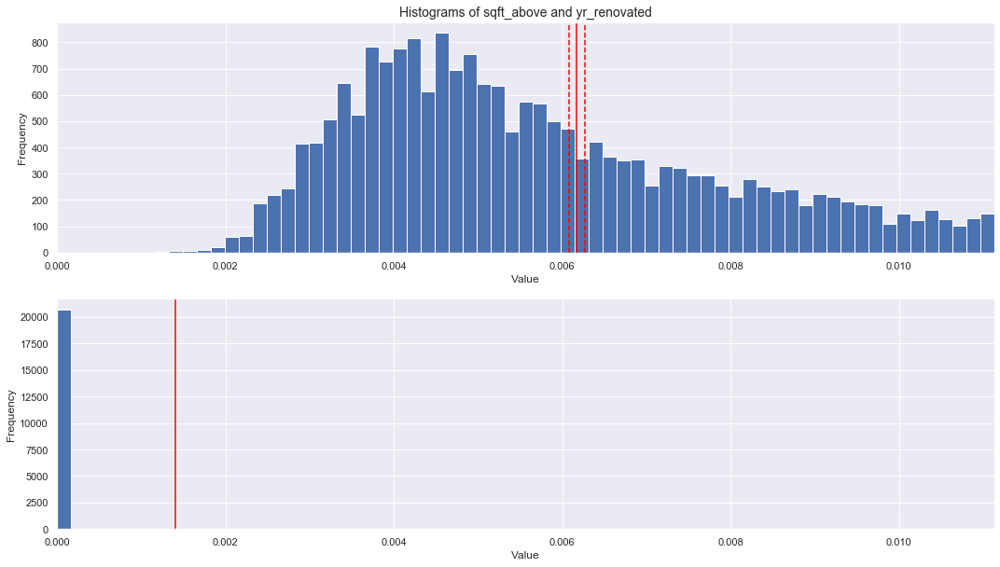


*** zipcode
DegFreedom      2.161207e+04
Difference     -6.295665e-04
t-Statistic    -3.238324e+01
PValue         1.088960e-224
Low95CI        -6.676725e-04
High95CI       -5.914604e-04
dtype: float64


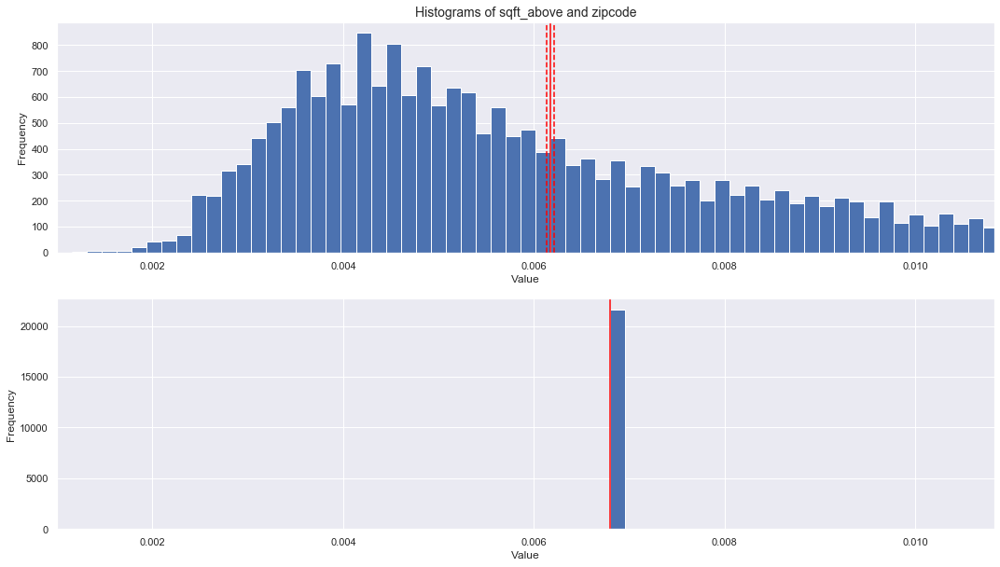


*** lat
DegFreedom      2.161408e+04
Difference     -6.295386e-04
t-Statistic    -3.238106e+01
PValue         1.163722e-224
Low95CI        -6.676455e-04
High95CI       -5.914317e-04
dtype: float64


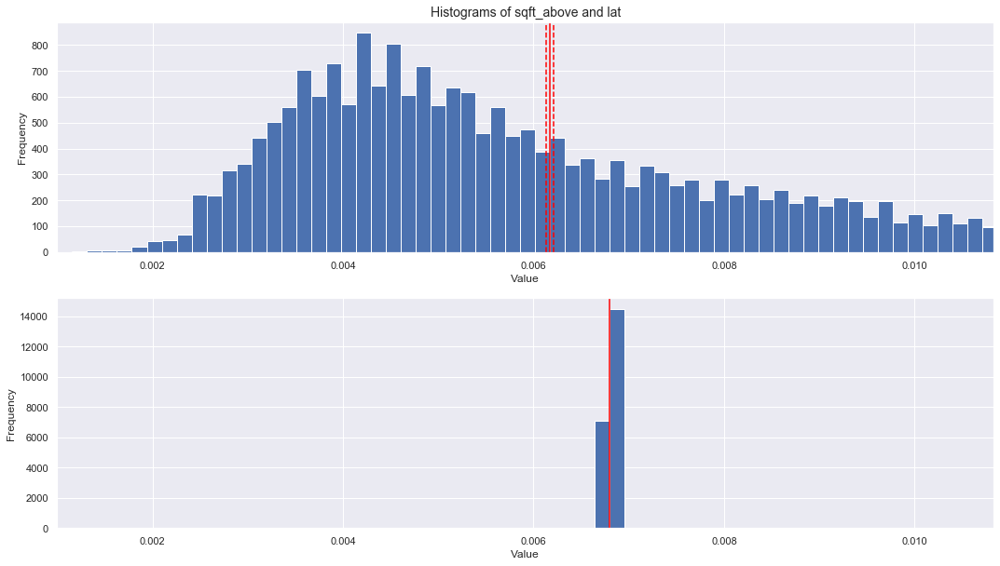


*** long
DegFreedom      2.161233e+04
Difference     -6.295630e-04
t-Statistic    -3.238297e+01
PValue         1.098093e-224
Low95CI        -6.676691e-04
High95CI       -5.914568e-04
dtype: float64


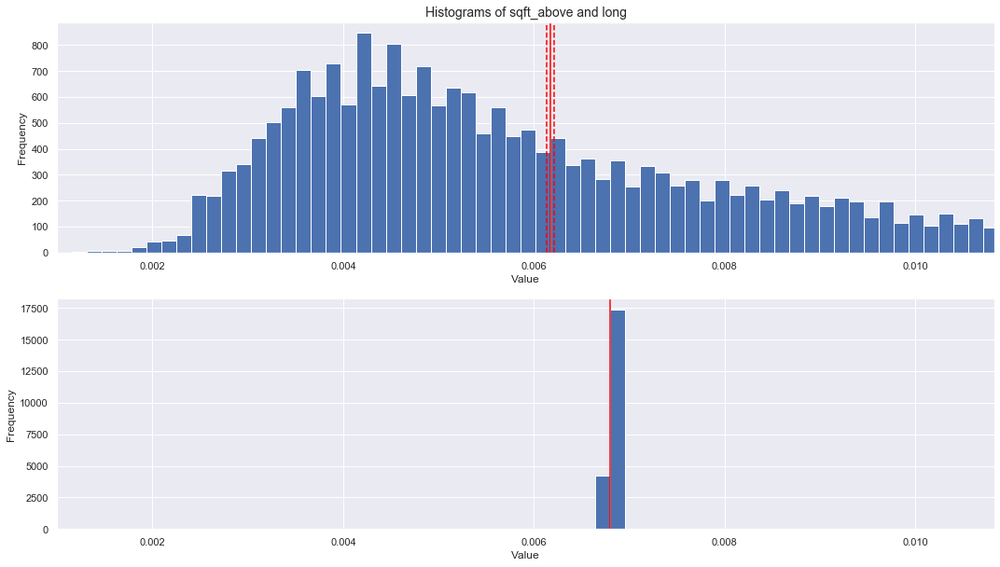


*** sqft_living15
DegFreedom     4.071876e+04
Difference    -2.576330e-04
t-Statistic   -1.046840e+01
PValue         1.300557e-25
Low95CI       -3.058702e-04
High95CI      -2.093958e-04
dtype: float64


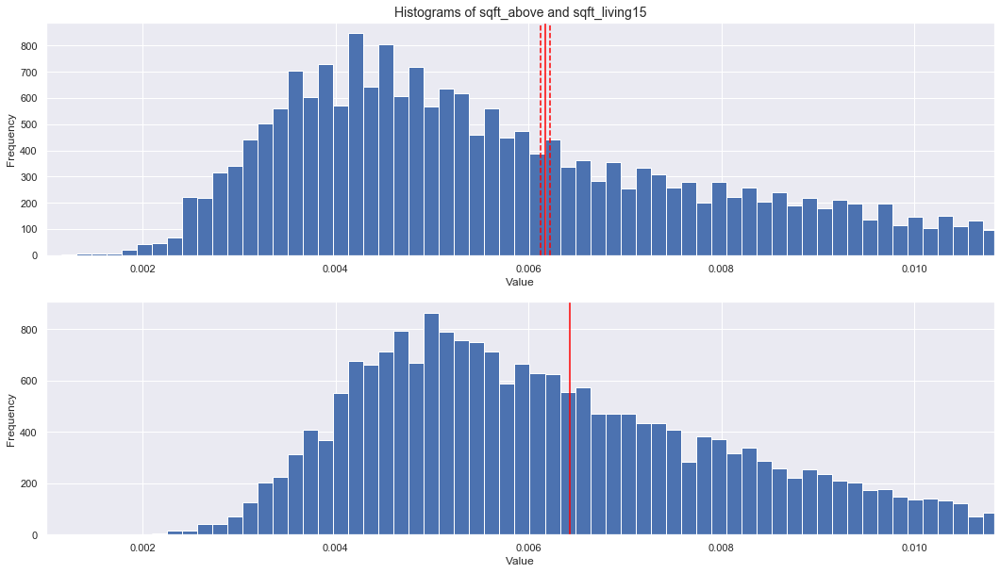


*** sqft_lot15
DegFreedom     30500.314646
Difference         0.003291
t-Statistic       71.231475
PValue             0.000000
Low95CI            0.003200
High95CI           0.003382
dtype: float64


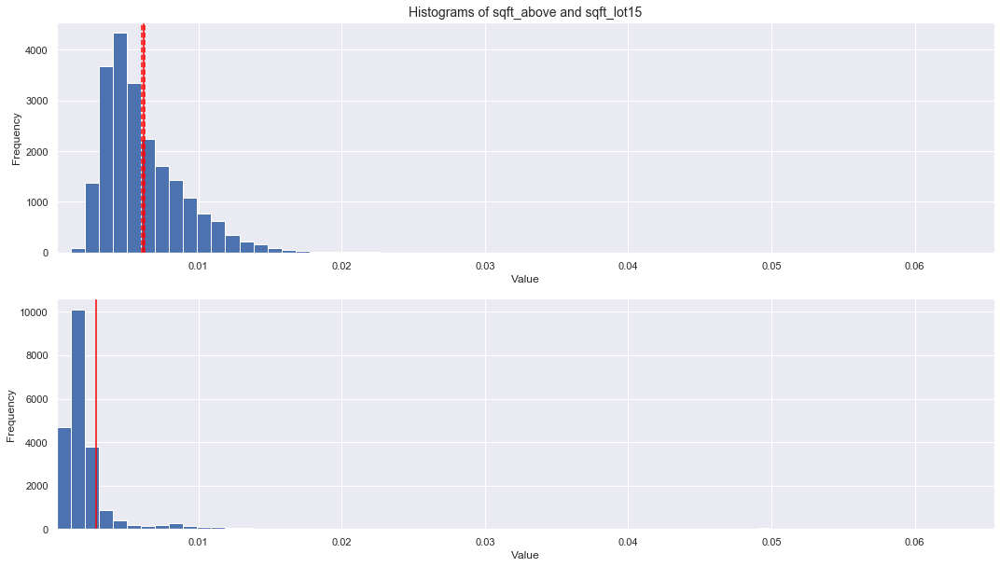

In [37]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_above', item]
    helper_tTest(housingNorm_df, features)

### Feature: sqft_living
> - The following t-Test results indicate that most of the null hypothesis for feature 'sqft_living' are rejected against the other features.  
> - The exceptions to this are:  
>       - sqft_above


*** price
DegFreedom     3.923198e+04
Difference     5.969381e-04
t-Statistic    1.863710e+01
PValue         3.466438e-77
Low95CI        5.341594e-04
High95CI       6.597169e-04
dtype: float64


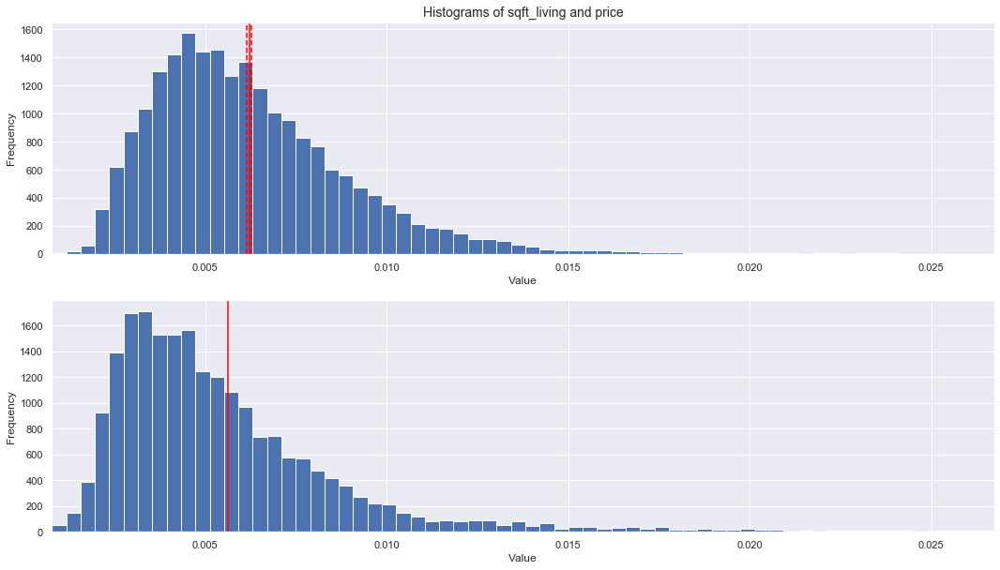


*** log_price
DegFreedom      2.204287e+04
Difference     -5.741051e-04
t-Statistic    -3.056501e+01
PValue         5.536055e-201
Low95CI        -6.109213e-04
High95CI       -5.372889e-04
dtype: float64


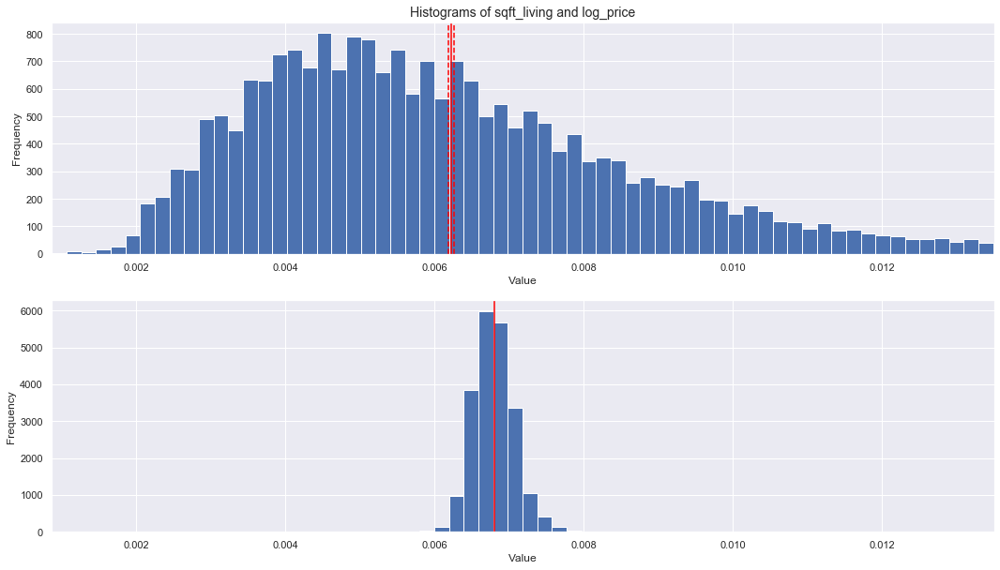


*** bedrooms
DegFreedom     3.738640e+04
Difference    -3.346379e-04
t-Statistic   -1.495400e+01
PValue         2.052353e-50
Low95CI       -3.784990e-04
High95CI      -2.907768e-04
dtype: float64


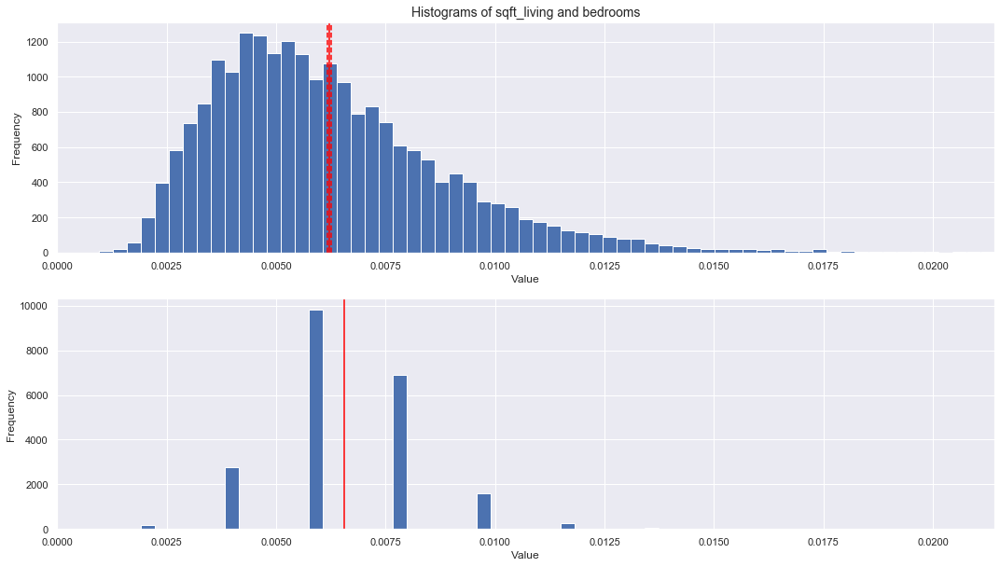


*** bathrooms
DegFreedom     4.208661e+04
Difference    -1.689992e-04
t-Statistic   -6.899323e+00
PValue         5.298811e-12
Low95CI       -2.170099e-04
High95CI      -1.209884e-04
dtype: float64


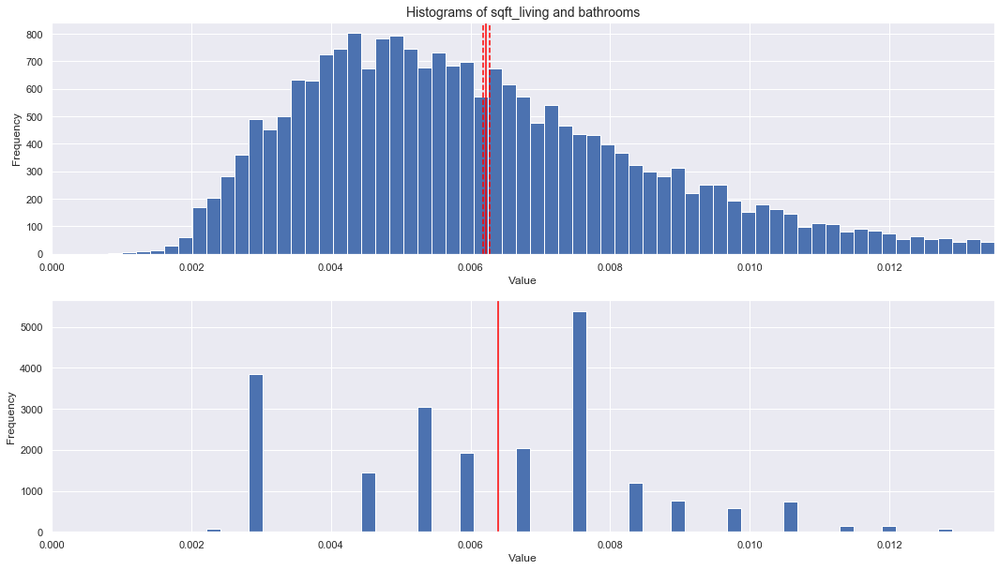


*** sqft_living

*** sqft_lot
DegFreedom     29338.910122
Difference         0.003892
t-Statistic       82.248847
PValue             0.000000
Low95CI            0.003799
High95CI           0.003984
dtype: float64


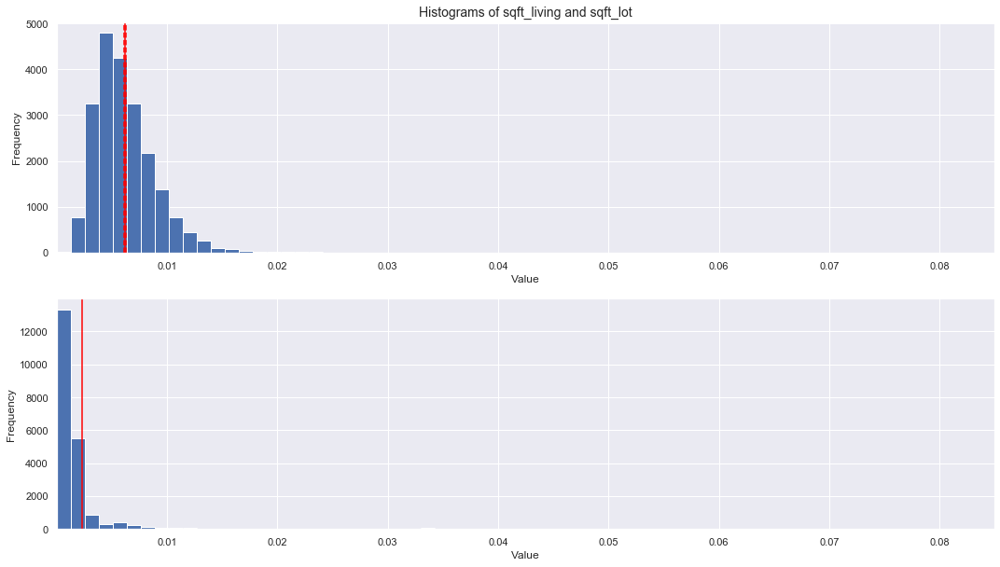


*** floors
DegFreedom     4.199498e+04
Difference    -1.747828e-04
t-Statistic   -7.155875e+00
PValue         8.449888e-13
Low95CI       -2.226564e-04
High95CI      -1.269091e-04
dtype: float64


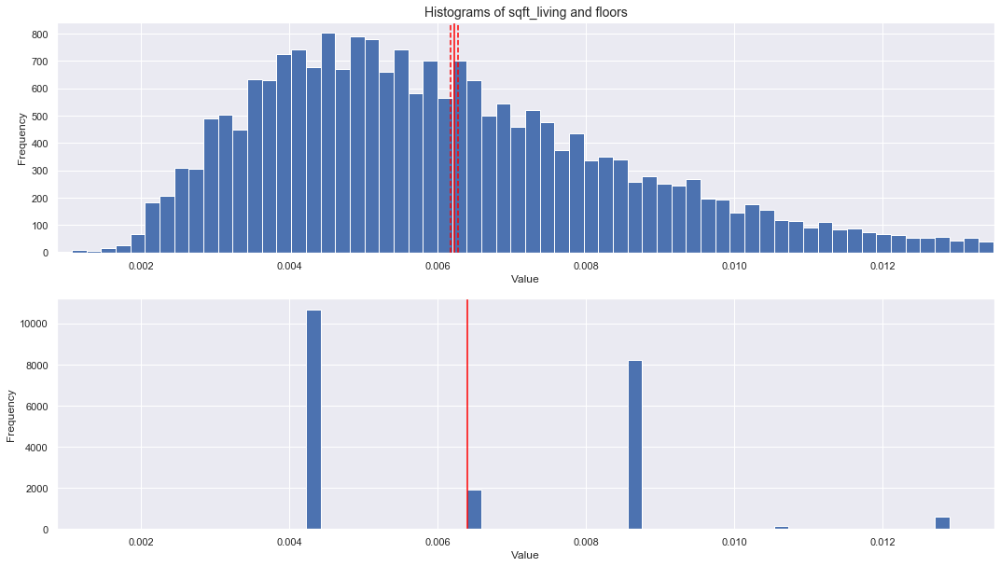


*** waterfront
DegFreedom     28531.349040
Difference         0.005632
t-Statistic      113.224011
PValue             0.000000
Low95CI            0.005534
High95CI           0.005729
dtype: float64


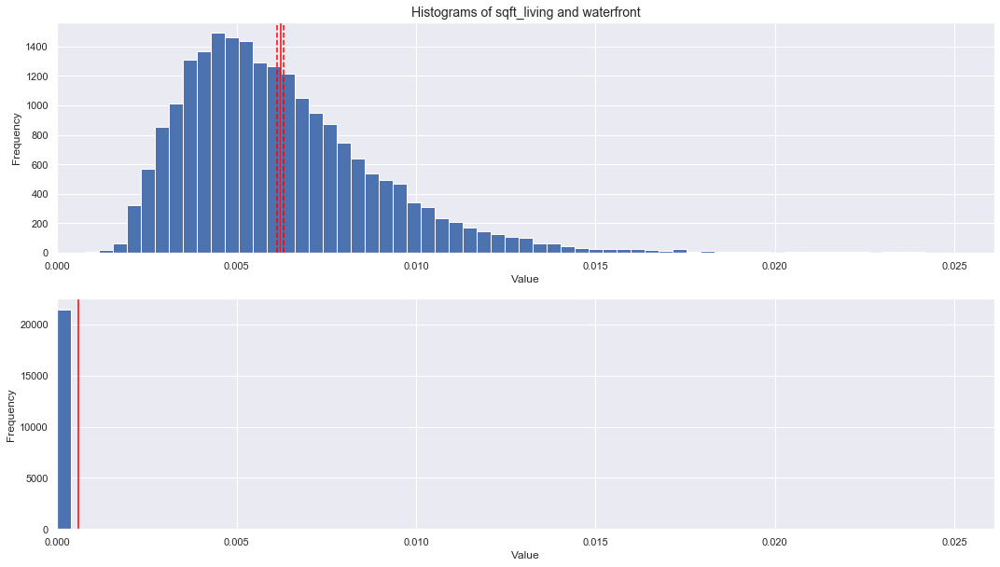


*** view
DegFreedom     29086.202919
Difference         0.004234
t-Statistic       88.138462
PValue             0.000000
Low95CI            0.004139
High95CI           0.004328
dtype: float64


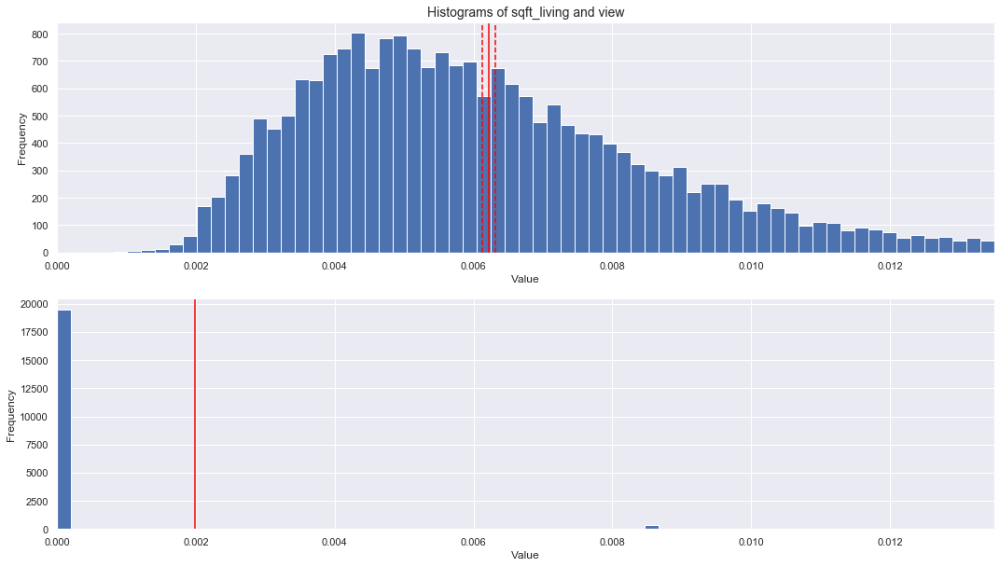


*** condition
DegFreedom      3.050991e+04
Difference     -4.590316e-04
t-Statistic    -2.227762e+01
PValue         4.521500e-109
Low95CI        -4.994184e-04
High95CI       -4.186449e-04
dtype: float64


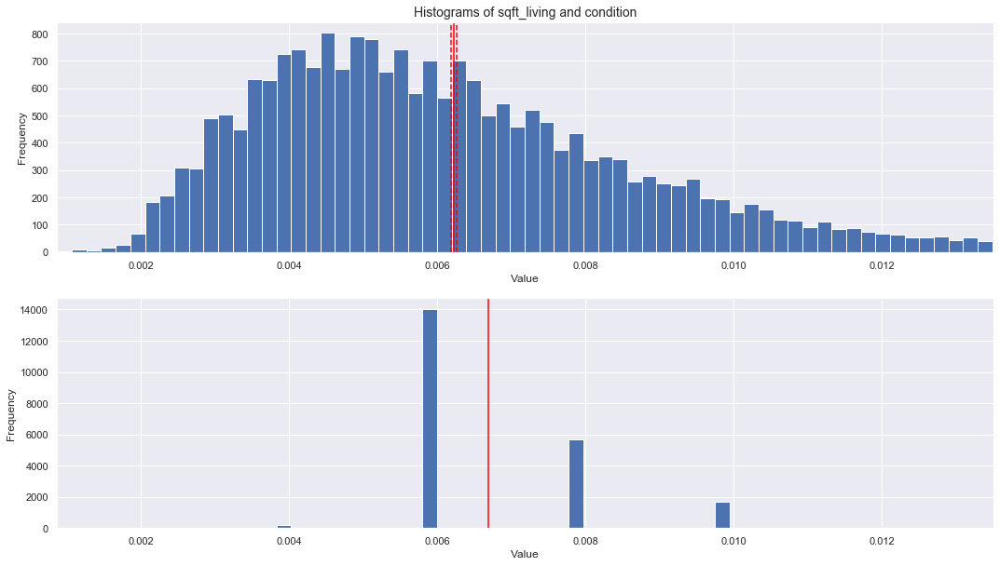


*** grade
DegFreedom      2.759203e+04
Difference     -5.008789e-04
t-Statistic    -2.508749e+01
PValue         2.363076e-137
Low95CI        -5.400119e-04
High95CI       -4.617460e-04
dtype: float64


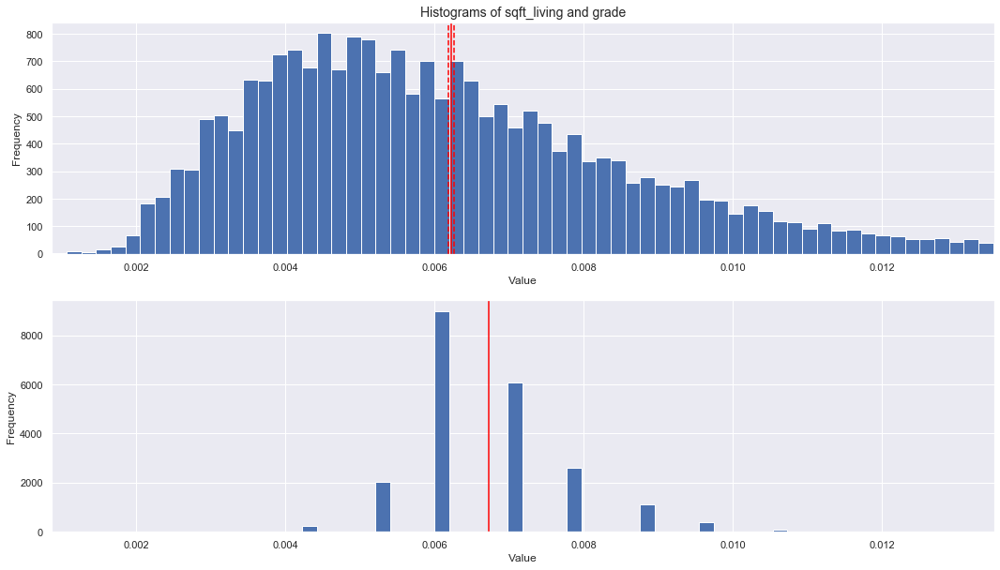


*** sqft_above
DegFreedom     43157.098285
Difference         0.000050
t-Statistic        1.851365
PValue             0.064124
Low95CI           -0.000003
High95CI           0.000103
dtype: float64


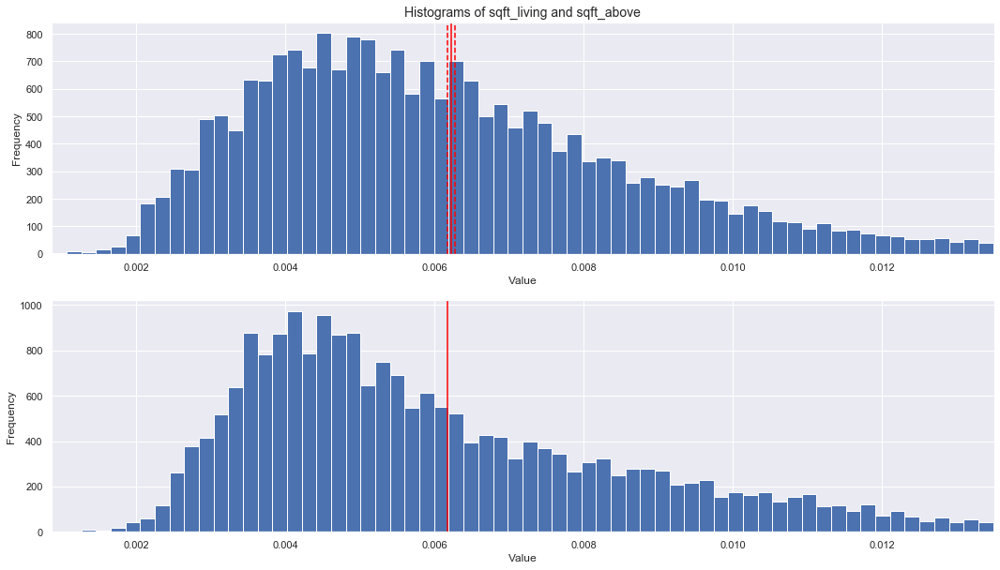


*** sqft_basement
DegFreedom     31199.893347
Difference         0.002481
t-Statistic       57.796086
PValue             0.000000
Low95CI            0.002397
High95CI           0.002565
dtype: float64


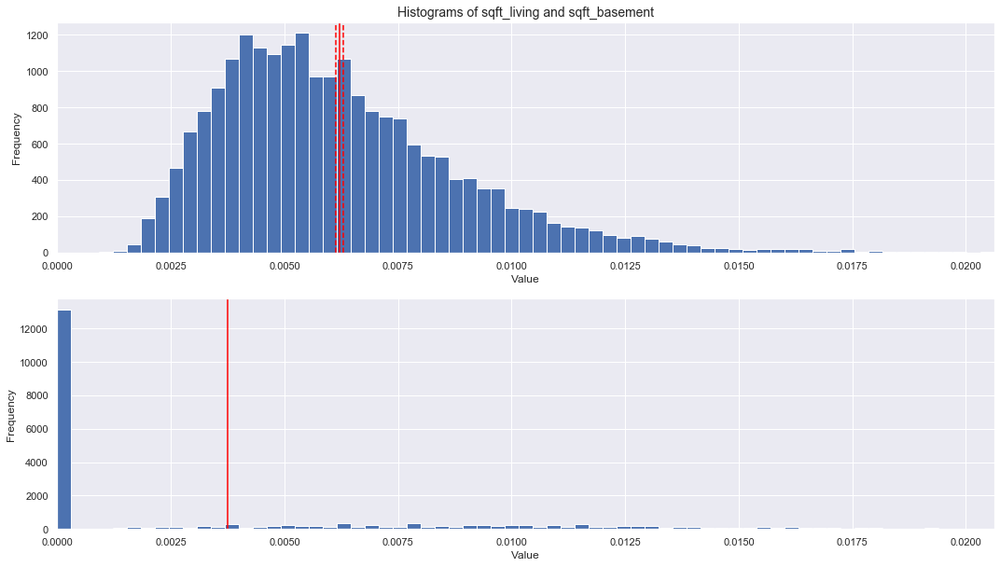


*** yr_built
DegFreedom      2.167082e+04
Difference     -5.788845e-04
t-Statistic    -3.095165e+01
PValue         7.229567e-206
Low95CI        -6.155435e-04
High95CI       -5.422255e-04
dtype: float64


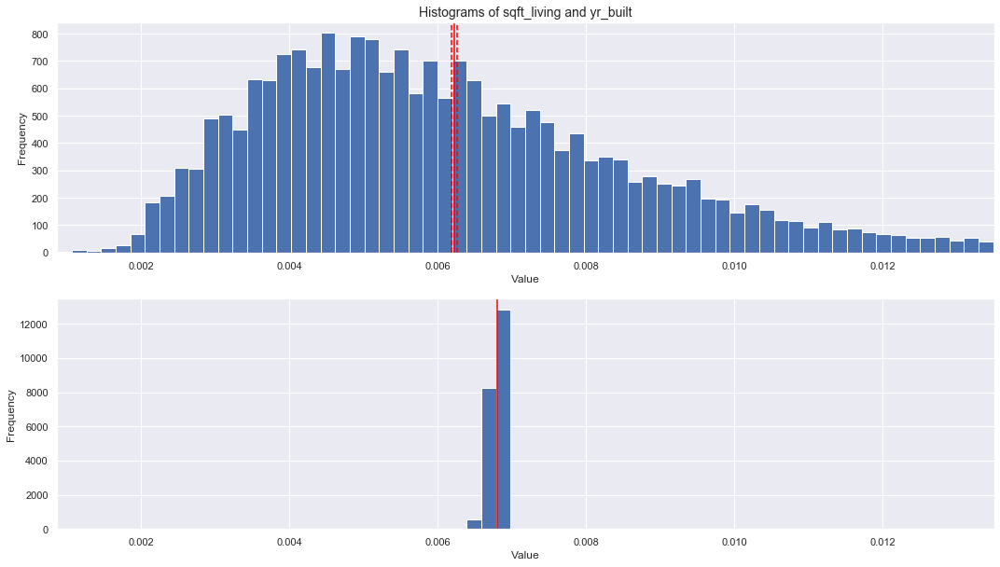


*** yr_renovated
DegFreedom     28768.463211
Difference         0.004824
t-Statistic       98.470064
PValue             0.000000
Low95CI            0.004728
High95CI           0.004920
dtype: float64


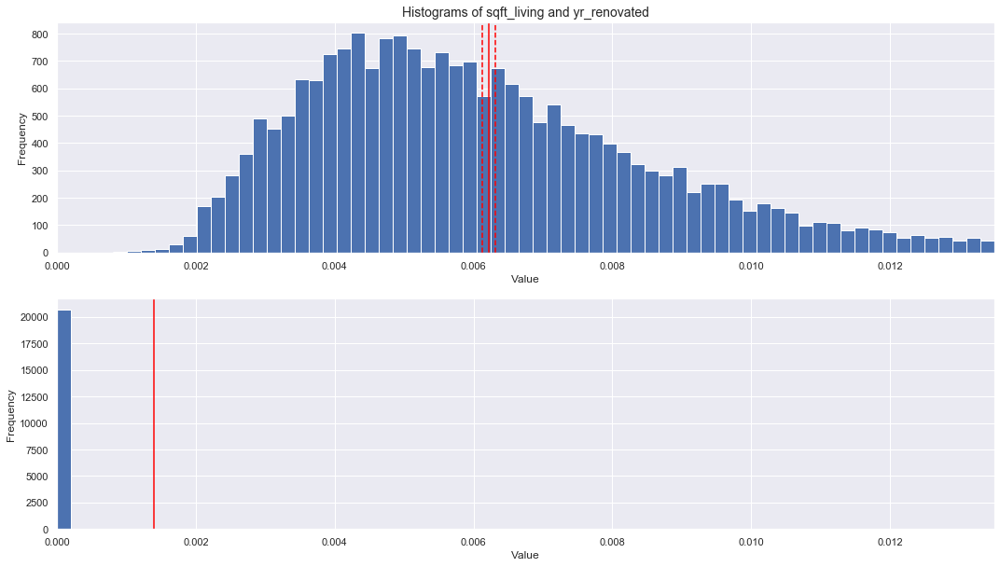


*** zipcode
DegFreedom      2.161208e+04
Difference     -5.796387e-04
t-Statistic    -3.101303e+01
PValue         1.200615e-206
Low95CI        -6.162728e-04
High95CI       -5.430046e-04
dtype: float64


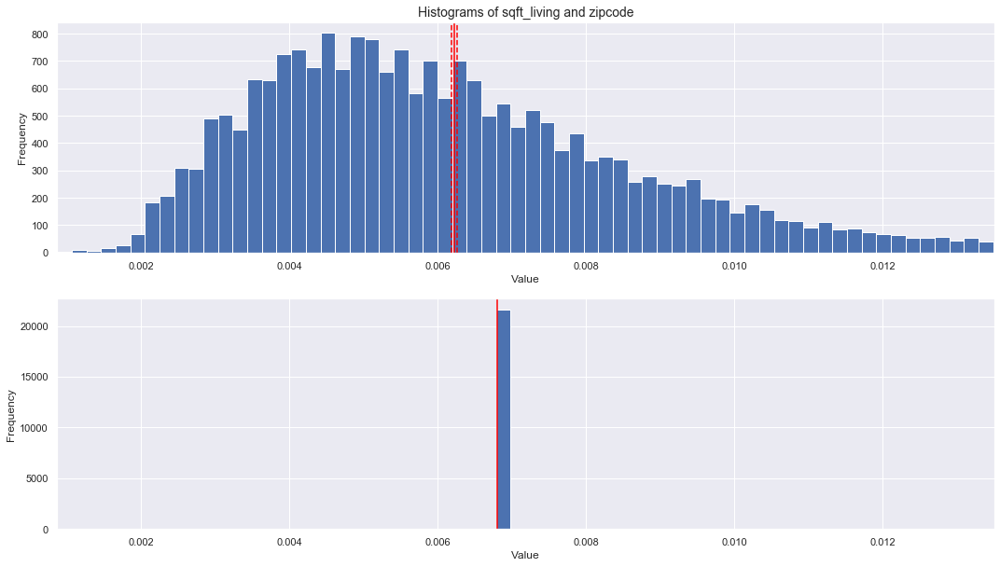


*** lat
DegFreedom      2.161425e+04
Difference     -5.796108e-04
t-Statistic    -3.101076e+01
PValue         1.283057e-206
Low95CI        -6.162459e-04
High95CI       -5.429758e-04
dtype: float64


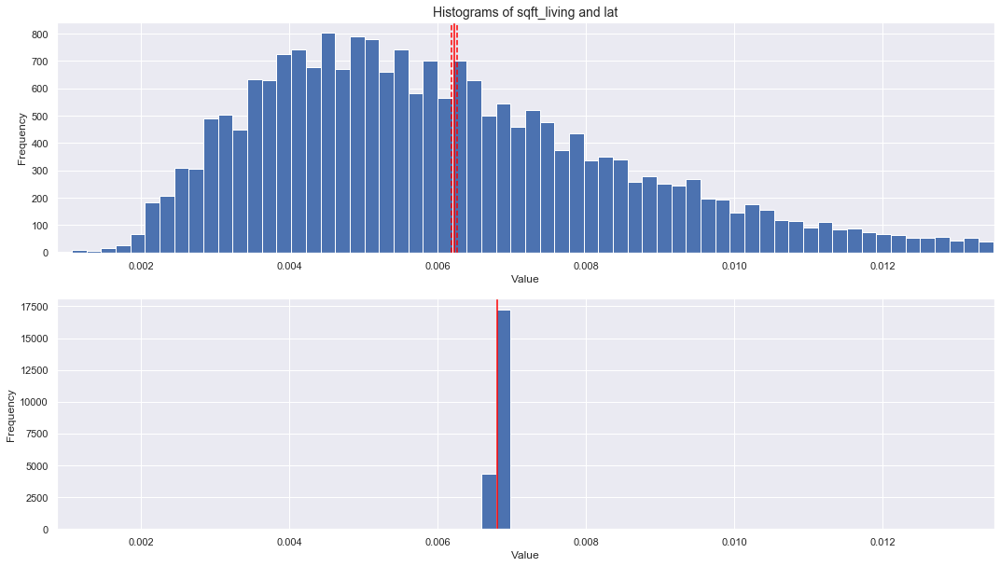


*** long
DegFreedom      2.161235e+04
Difference     -5.796352e-04
t-Statistic    -3.101274e+01
PValue         1.210687e-206
Low95CI        -6.162694e-04
High95CI       -5.430010e-04
dtype: float64


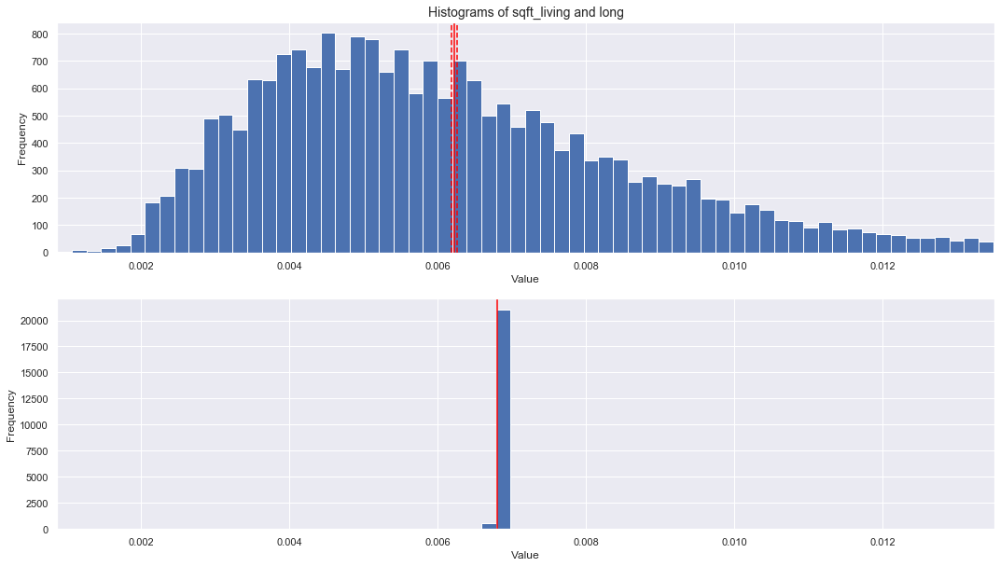


*** sqft_living15
DegFreedom     4.138618e+04
Difference    -2.077052e-04
t-Statistic   -8.646550e+00
PValue         5.494955e-18
Low95CI       -2.547883e-04
High95CI      -1.606220e-04
dtype: float64


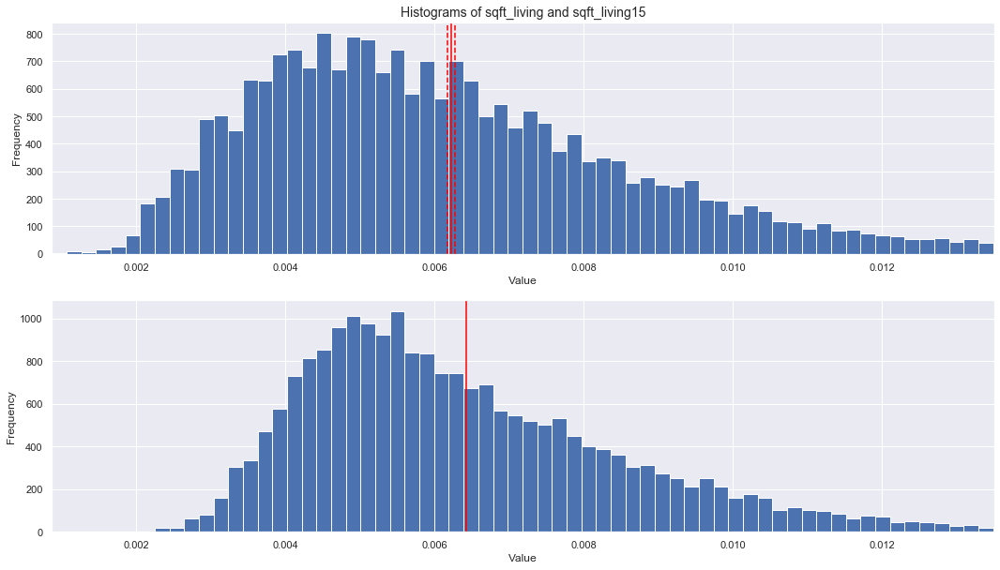


*** sqft_lot15
DegFreedom     29880.247529
Difference         0.003341
t-Statistic       72.802053
PValue             0.000000
Low95CI            0.003251
High95CI           0.003431
dtype: float64


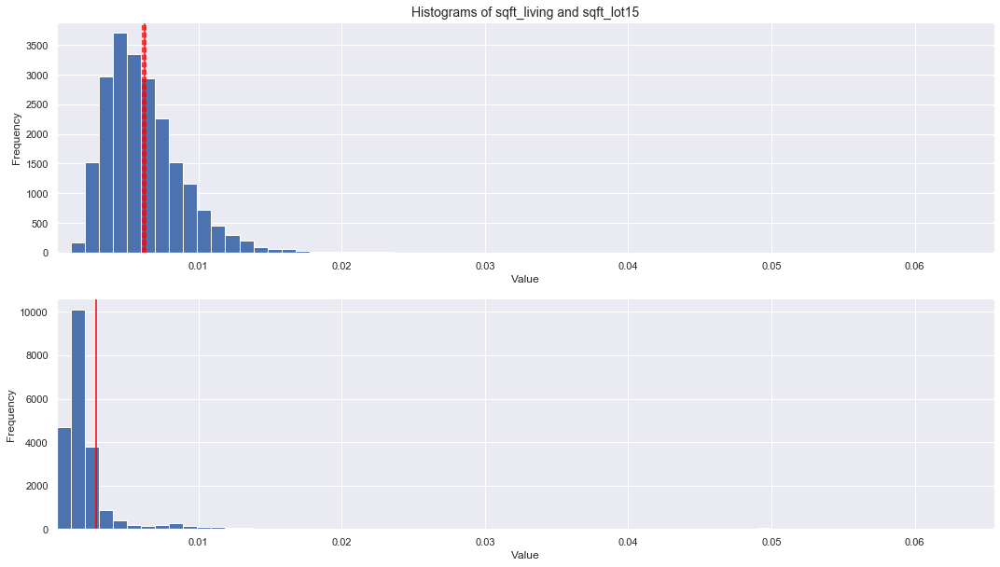

In [38]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_living', item]
    helper_tTest(housingNorm_df, features)

### Feature: bathrooms
> - The following t-Test results indicate that most of the null hypothesis for feature 'bathroom' are rejected against the other features.  
> - The exceptions to this are:  
>       - floors
>       - sqft_living15


*** price
DegFreedom      3.569418e+04
Difference      7.659373e-04
t-Statistic     2.515321e+01
PValue         2.100114e-138
Low95CI         7.062527e-04
High95CI        8.256219e-04
dtype: float64


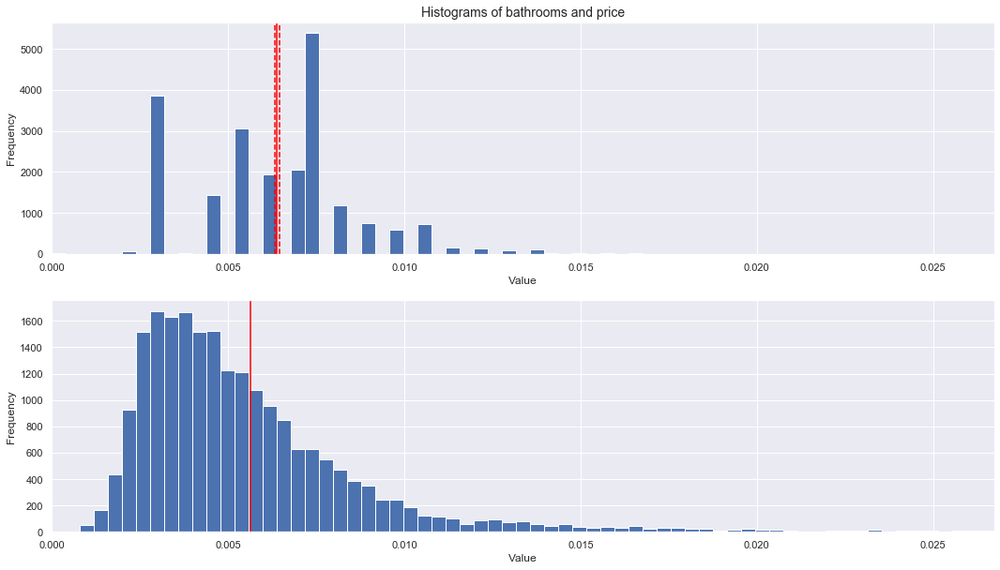


*** log_price
DegFreedom      2.221235e+04
Difference     -4.051059e-04
t-Statistic    -2.541023e+01
PValue         1.968042e-140
Low95CI        -4.363546e-04
High95CI       -3.738572e-04
dtype: float64


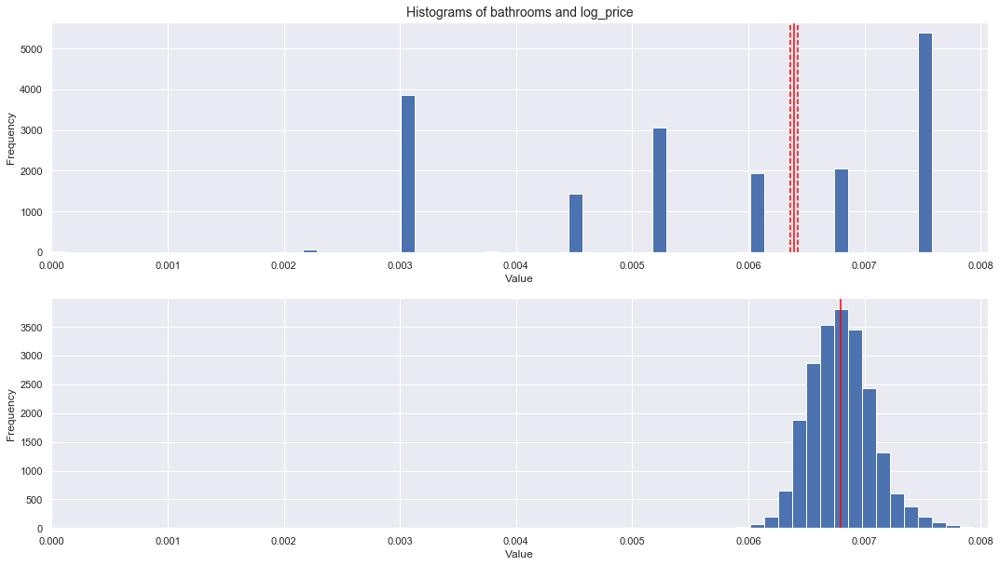


*** bedrooms
DegFreedom     4.074263e+04
Difference    -1.656387e-04
t-Statistic   -8.259977e+00
PValue         1.500418e-16
Low95CI       -2.049434e-04
High95CI      -1.263341e-04
dtype: float64


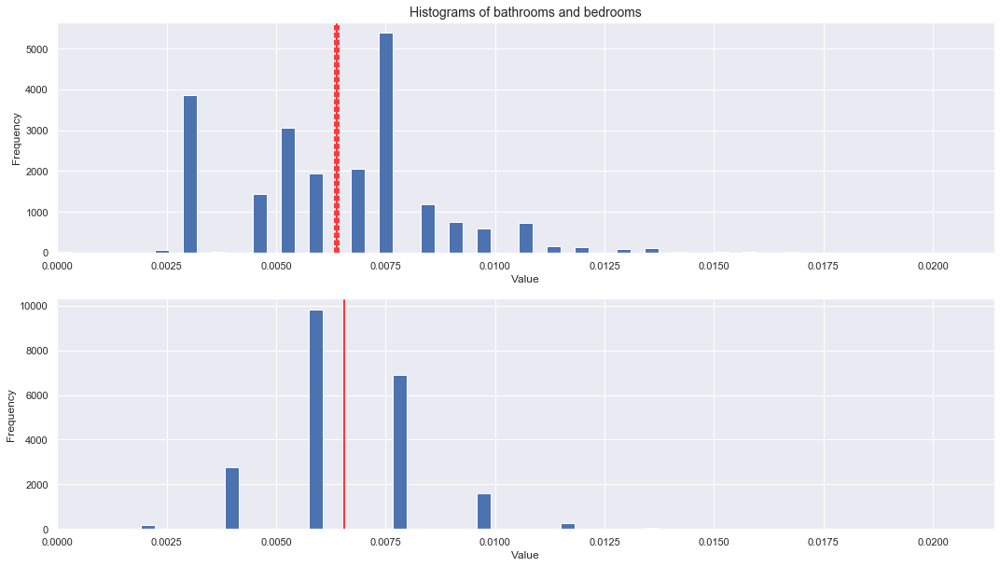


*** bathrooms

*** sqft_living
DegFreedom     4.208661e+04
Difference     1.689992e-04
t-Statistic    6.899323e+00
PValue         5.298811e-12
Low95CI        1.209884e-04
High95CI       2.170099e-04
dtype: float64


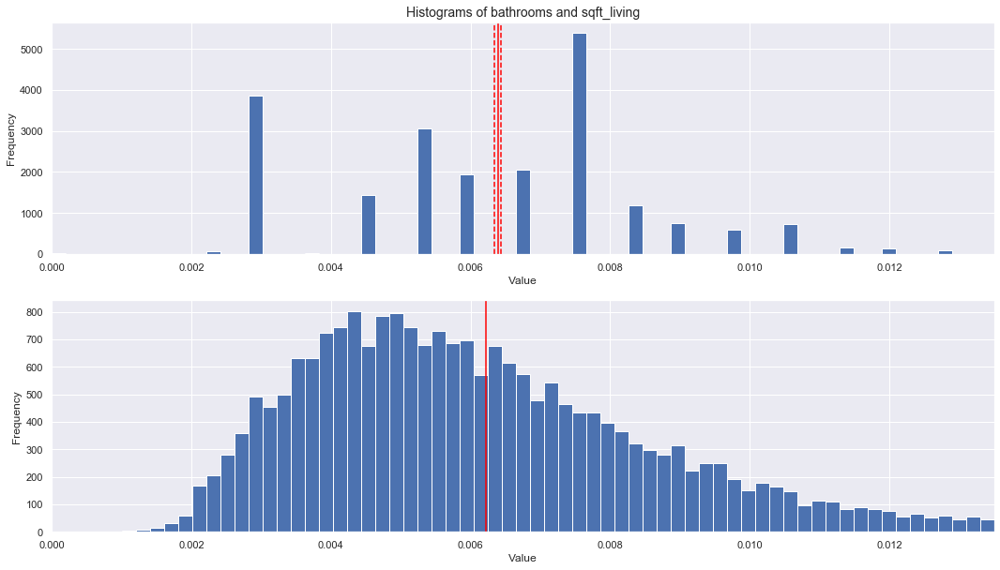


*** sqft_lot
DegFreedom     27247.417425
Difference         0.004061
t-Statistic       87.775900
PValue             0.000000
Low95CI            0.003970
High95CI           0.004151
dtype: float64


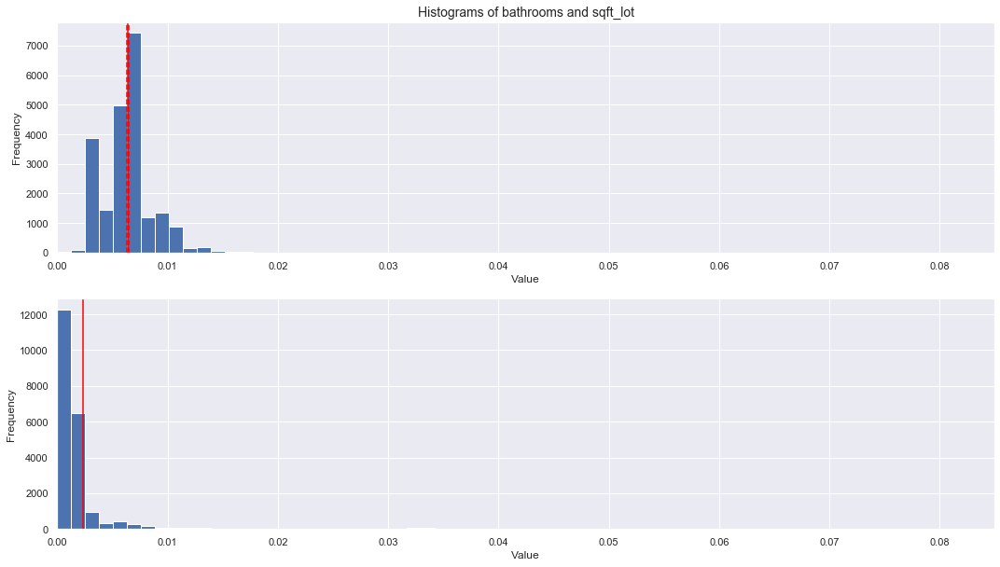


*** floors
DegFreedom     43221.958261
Difference        -0.000006
t-Statistic       -0.259184
PValue             0.795494
Low95CI           -0.000050
High95CI           0.000038
dtype: float64


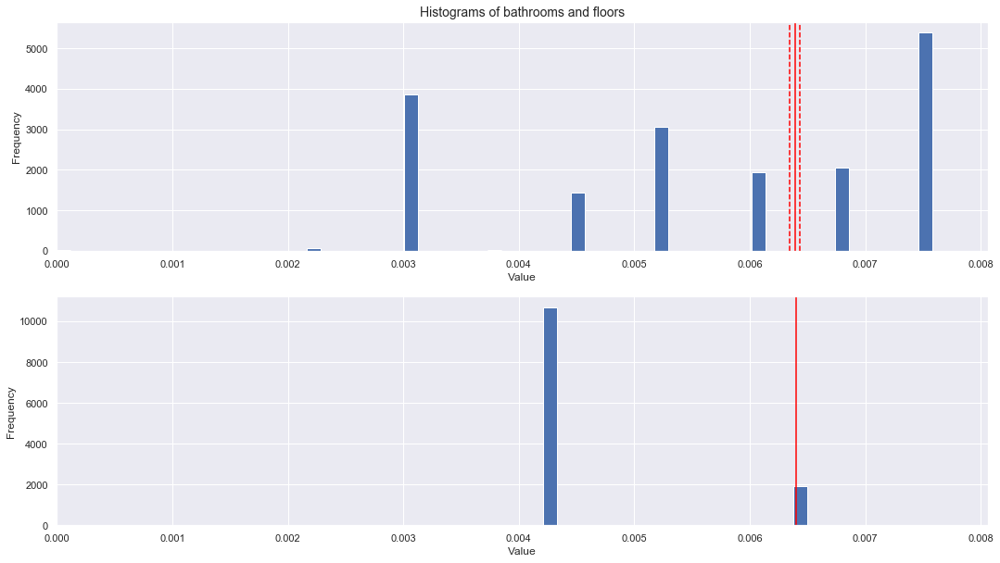


*** waterfront
DegFreedom     26641.758557
Difference         0.005801
t-Statistic      119.018360
PValue             0.000000
Low95CI            0.005705
High95CI           0.005896
dtype: float64


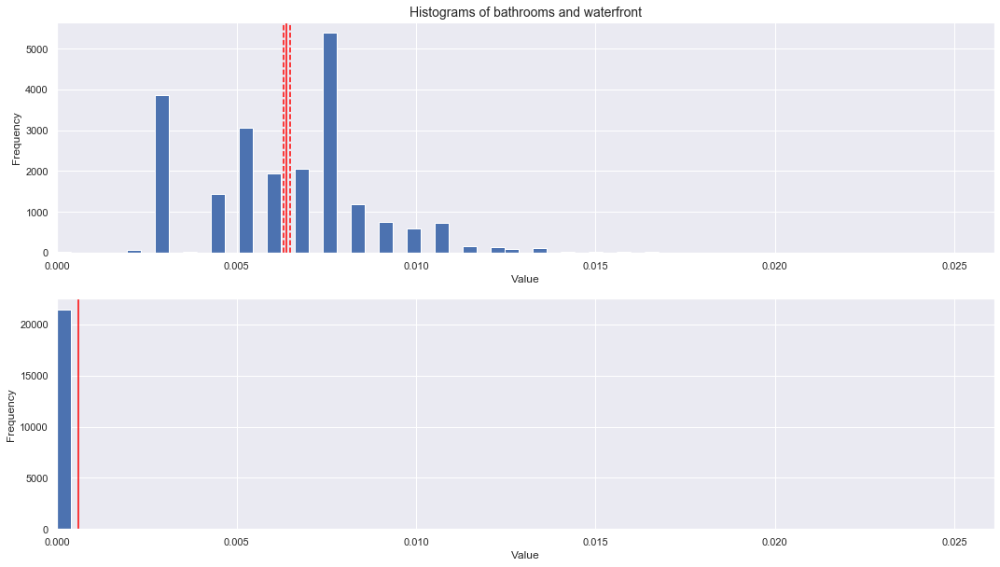


*** view
DegFreedom     27057.216919
Difference         0.004403
t-Statistic       93.681302
PValue             0.000000
Low95CI            0.004310
High95CI           0.004495
dtype: float64


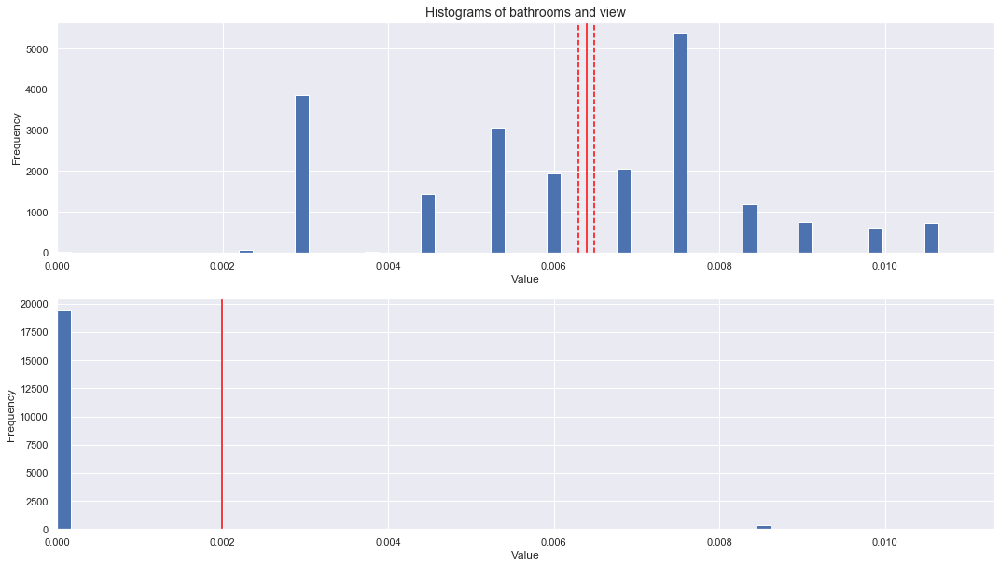


*** condition
DegFreedom     3.351393e+04
Difference    -2.900325e-04
t-Statistic   -1.606510e+01
PValue         7.374814e-58
Low95CI       -3.254181e-04
High95CI      -2.546469e-04
dtype: float64


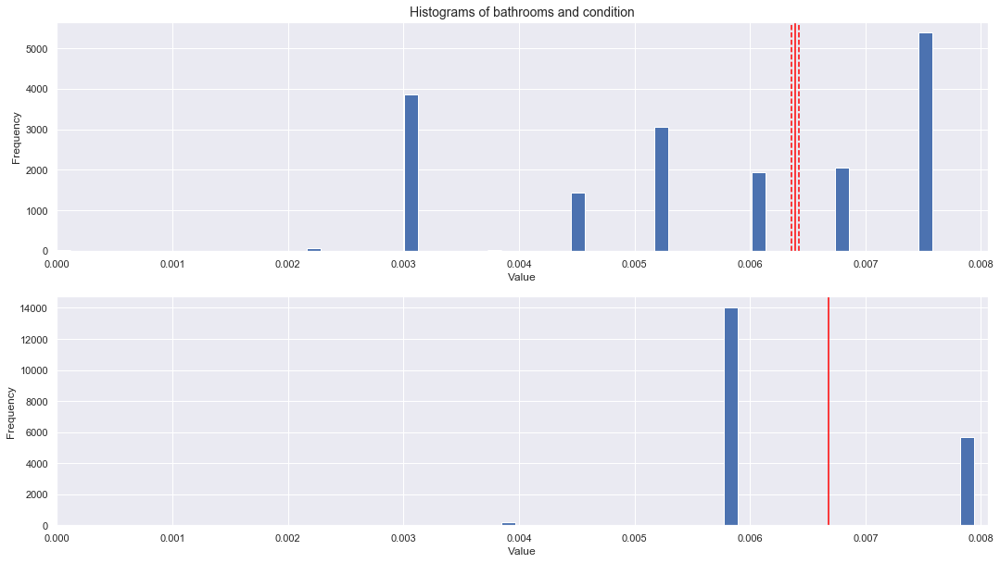


*** grade
DegFreedom     2.979455e+04
Difference    -3.318798e-04
t-Statistic   -1.916186e+01
PValue         2.381289e-81
Low95CI       -3.658274e-04
High95CI      -2.979322e-04
dtype: float64


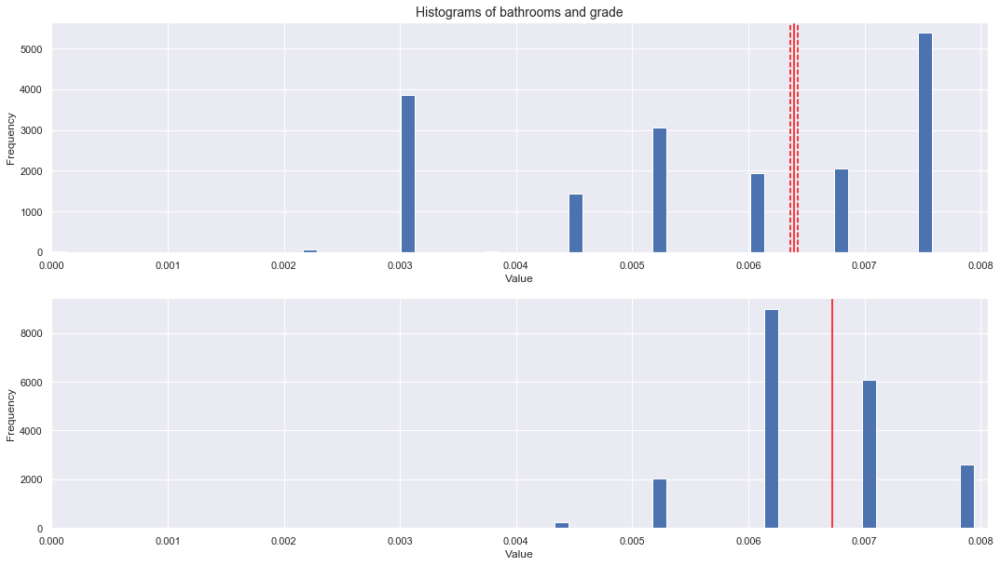


*** sqft_above
DegFreedom     4.152209e+04
Difference     2.189270e-04
t-Statistic    8.731678e+00
PValue         2.600846e-18
Low95CI        1.697839e-04
High95CI       2.680700e-04
dtype: float64


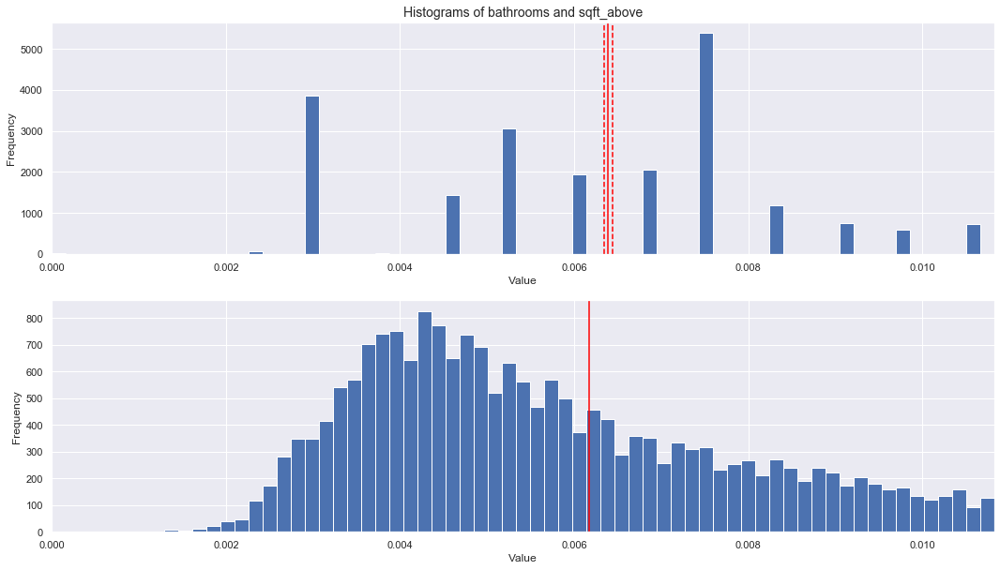


*** sqft_basement
DegFreedom     28670.248790
Difference         0.002650
t-Statistic       63.455301
PValue             0.000000
Low95CI            0.002568
High95CI           0.002732
dtype: float64


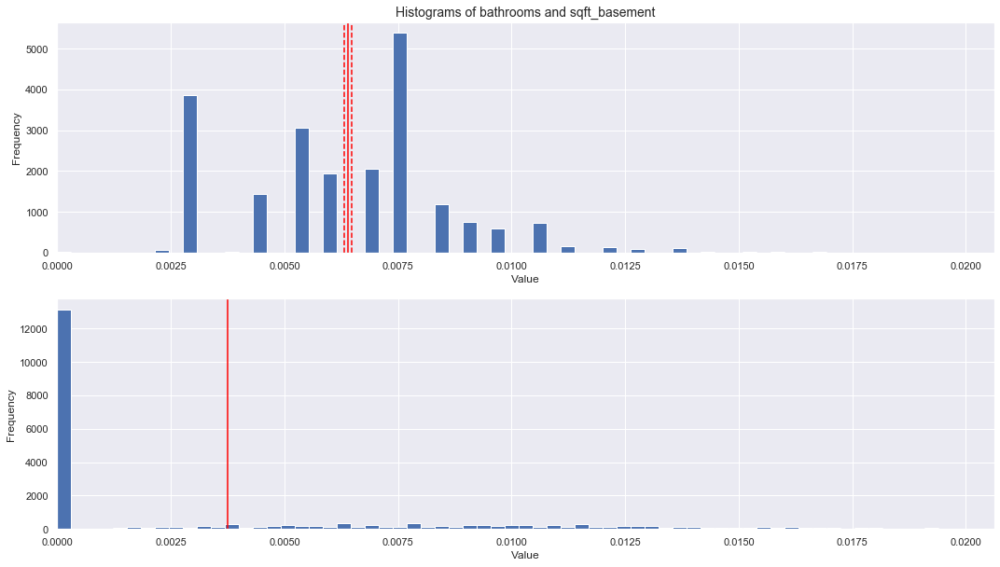


*** yr_built
DegFreedom      2.169396e+04
Difference     -4.098853e-04
t-Statistic    -2.586348e+01
PValue         2.726502e-145
Low95CI        -4.409487e-04
High95CI       -3.788220e-04
dtype: float64


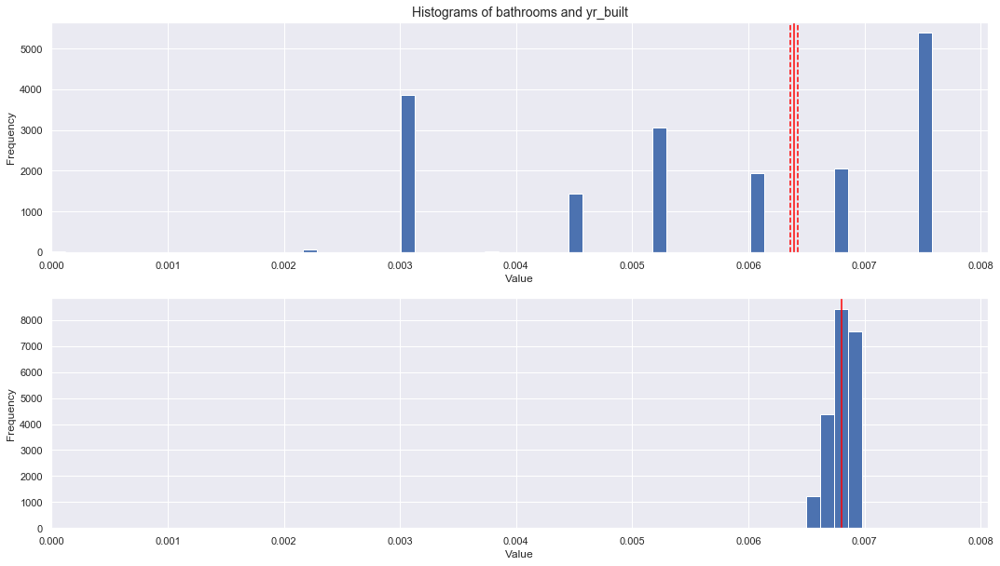


*** yr_renovated
DegFreedom     26818.952961
Difference         0.004993
t-Statistic      104.081545
PValue             0.000000
Low95CI            0.004899
High95CI           0.005087
dtype: float64


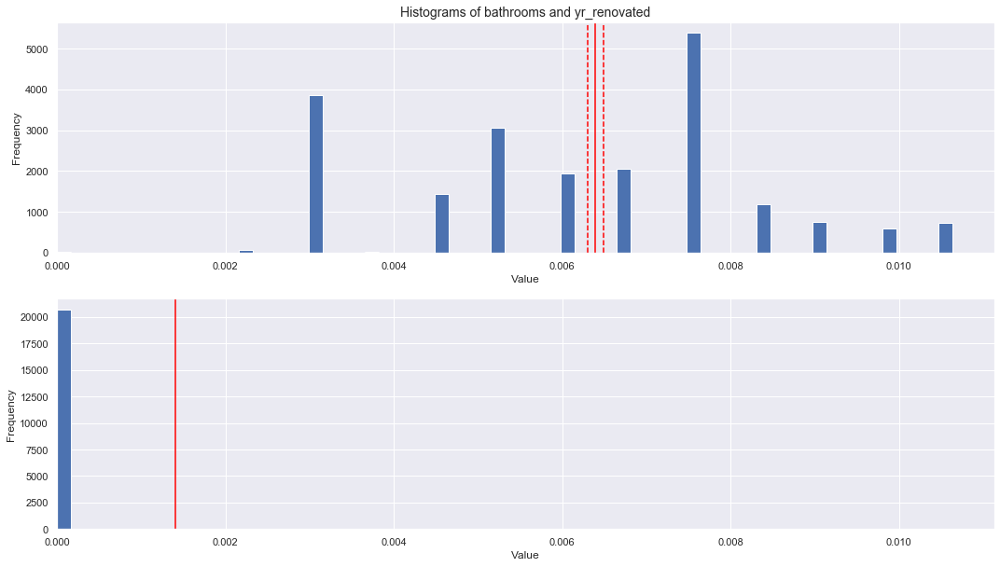


*** zipcode
DegFreedom      2.161211e+04
Difference     -4.106395e-04
t-Statistic    -2.593559e+01
PValue         4.528307e-146
Low95CI        -4.416735e-04
High95CI       -3.796056e-04
dtype: float64


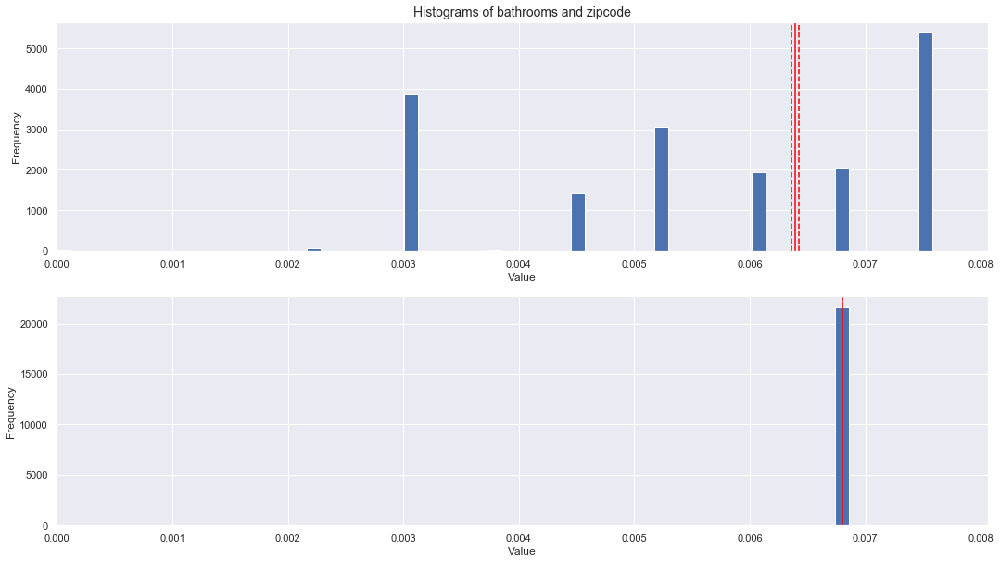


*** lat
DegFreedom      2.161513e+04
Difference     -4.106117e-04
t-Statistic    -2.593292e+01
PValue         4.839455e-146
Low95CI        -4.416467e-04
High95CI       -3.795766e-04
dtype: float64


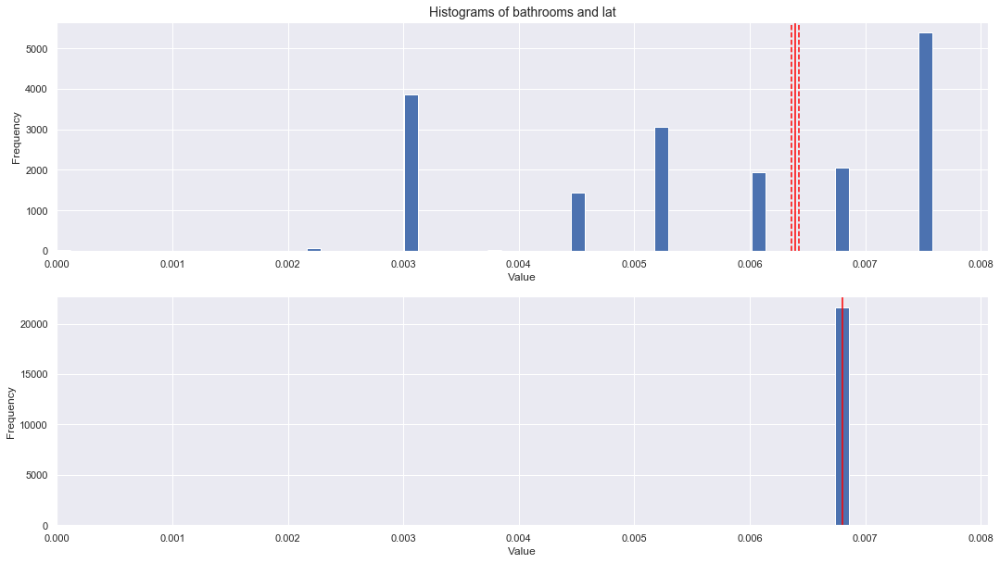


*** long
DegFreedom      2.161249e+04
Difference     -4.106360e-04
t-Statistic    -2.593525e+01
PValue         4.566319e-146
Low95CI        -4.416701e-04
High95CI       -3.796019e-04
dtype: float64


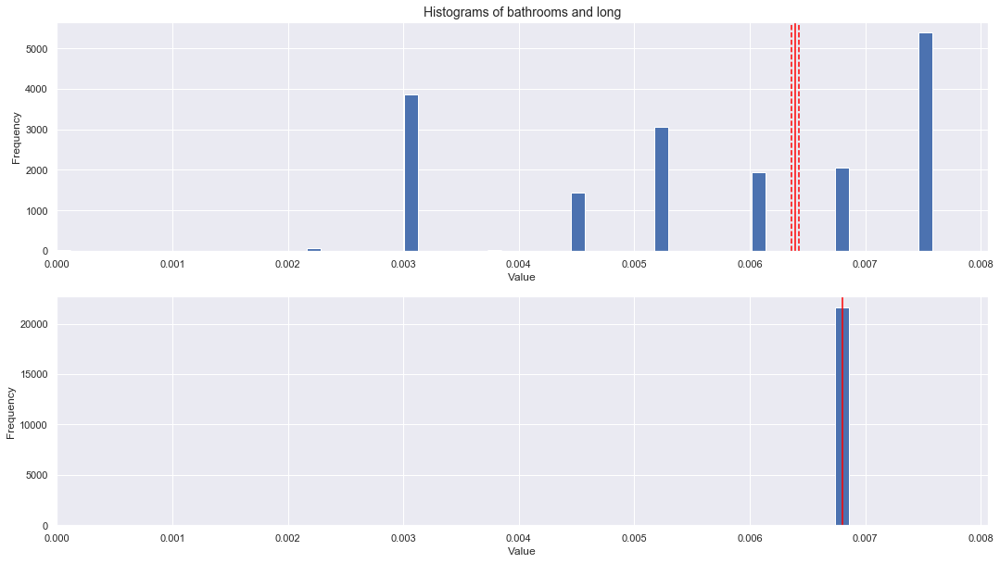


*** sqft_living15
DegFreedom     43124.646745
Difference        -0.000039
t-Statistic       -1.769618
PValue             0.076798
Low95CI           -0.000082
High95CI           0.000004
dtype: float64


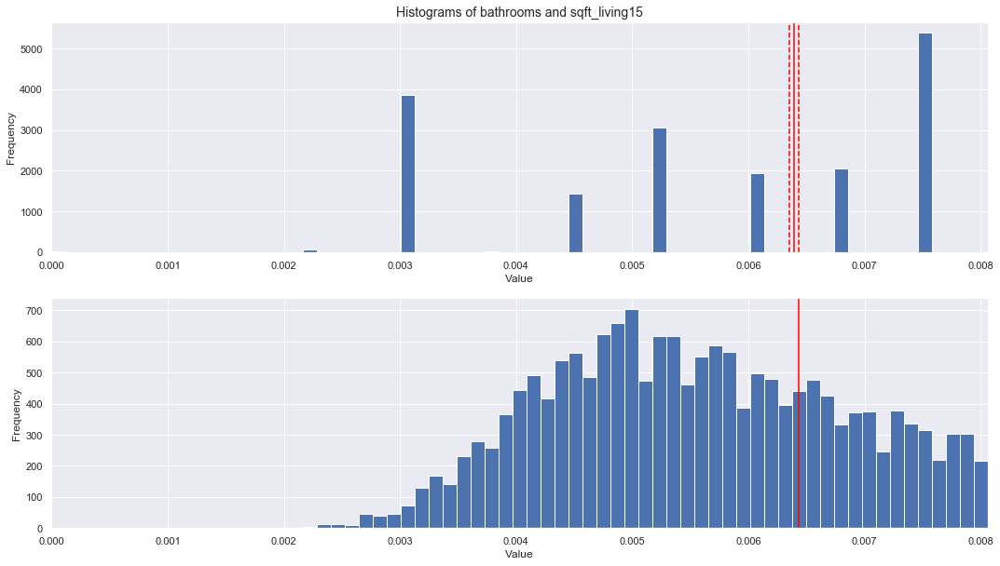


*** sqft_lot15
DegFreedom     27657.093607
Difference         0.003510
t-Statistic       78.341238
PValue             0.000000
Low95CI            0.003422
High95CI           0.003598
dtype: float64


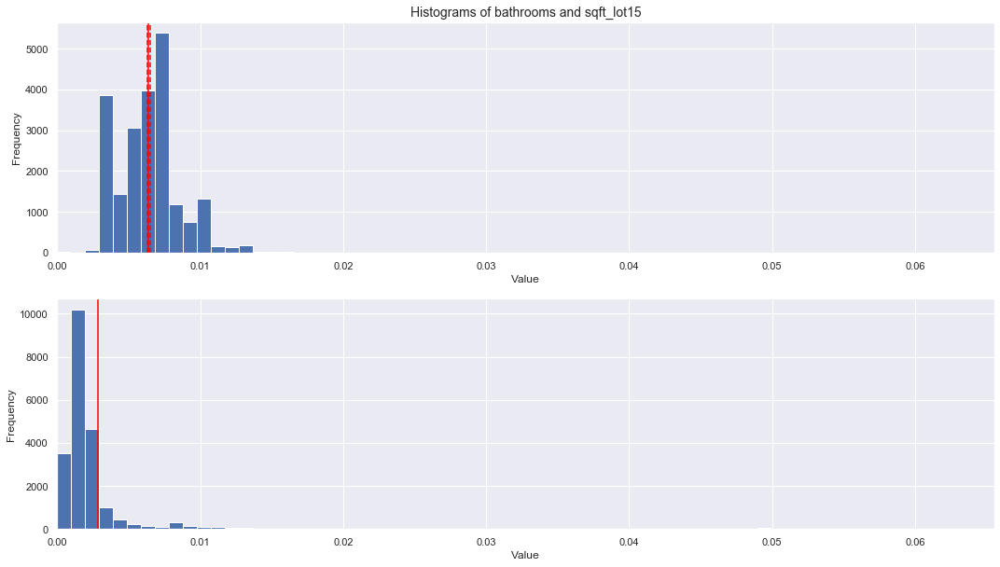

In [39]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['bathrooms', item]
    helper_tTest(housingNorm_df, features)

## Tukey's HSD Hypothesis Test  
> - Evaluate each of the dataset features to discover which of null hypothesis can be rejected or not.  
> - Result: majority of the null hypothesis are rejected.

In [40]:
df = get_Groups(housingNorm_df)
Tukey_HSD = pairwise_tukeyhsd(df.vals, df.group_num)
print(Tukey_HSD)

           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
      group1            group2      meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------
      bathrooms          bedrooms     0.0002 0.0013     0.0  0.0003   True
      bathrooms         condition     0.0003  0.001  0.0002  0.0004   True
      bathrooms            floors        0.0    0.9 -0.0001  0.0001  False
      bathrooms             grade     0.0003  0.001  0.0002  0.0005   True
      bathrooms               lat     0.0004  0.001  0.0003  0.0005   True
      bathrooms         log_price     0.0004  0.001  0.0003  0.0005   True
      bathrooms              long     0.0004  0.001  0.0003  0.0005   True
      bathrooms             price    -0.0008  0.001 -0.0009 -0.0006   True
      bathrooms        sqft_above    -0.0002  0.001 -0.0004 -0.0001   True
      bathrooms     sqft_basement    -0.0026  0.001 -0.0028 -0.0025   True
      bathrooms       sqf

## Boostrap Hypothesis Test  
> All features evaluated below via the bootstrap hypothesis test, reject the null hypothesis for the given feature.

In [41]:
# bootstrap the means
n_replicas = 1000
bs_means = pd.DataFrame([
    classicalStats_df.sample(frac=1, replace=True).mean() for i in range(n_replicas)])

### Feature: price


*** price

*** log_price
DegFreedom     1009.244950
Difference       -0.001173
t-Statistic   -1413.129726
PValue            0.000000
Low95CI          -0.001174
High95CI         -0.001171
dtype: float64


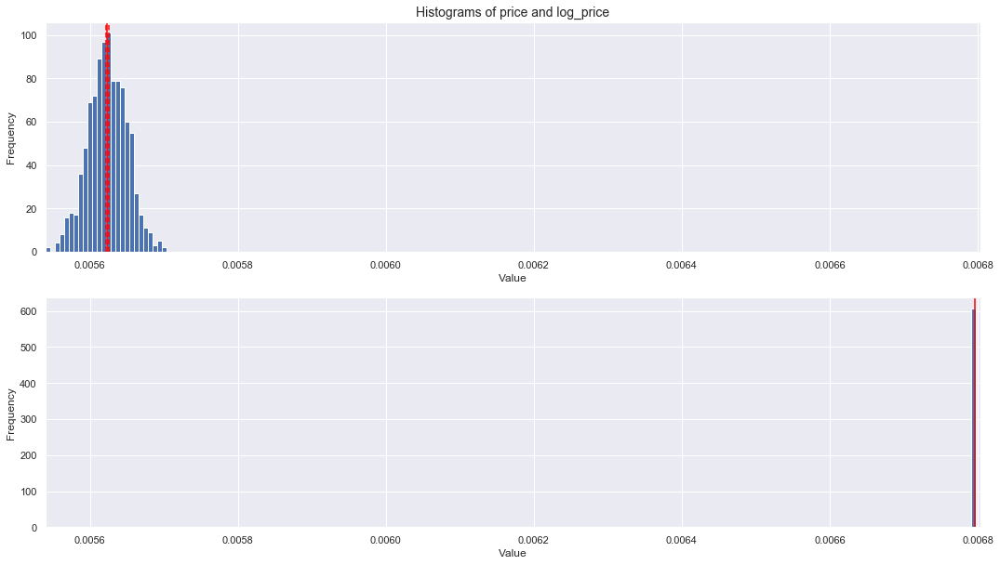


*** bedrooms
DegFreedom     1413.655220
Difference       -0.000933
t-Statistic   -1021.271184
PValue            0.000000
Low95CI          -0.000935
High95CI         -0.000931
dtype: float64


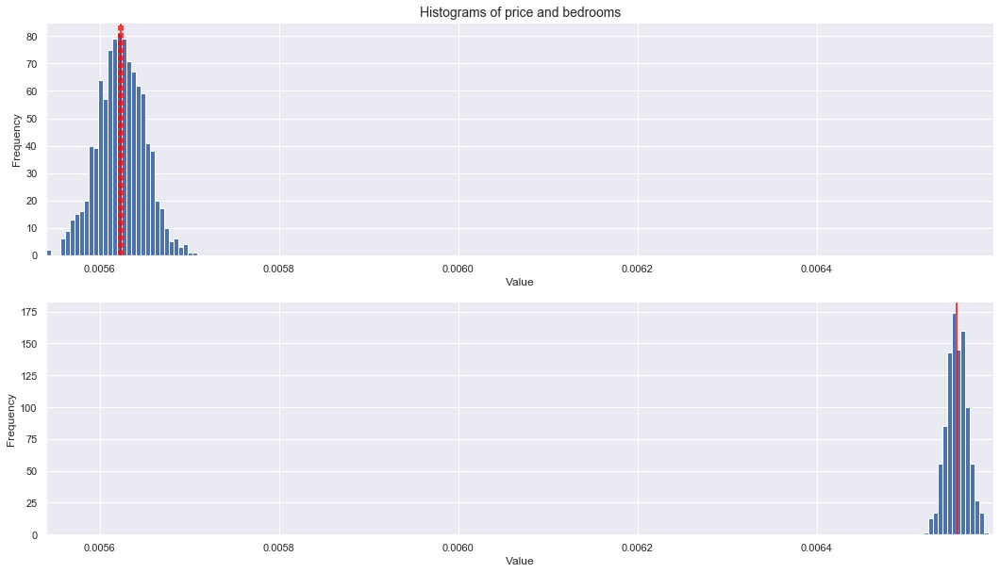


*** bathrooms
DegFreedom     1618.123990
Difference       -0.000767
t-Statistic    -798.194463
PValue            0.000000
Low95CI          -0.000769
High95CI         -0.000765
dtype: float64


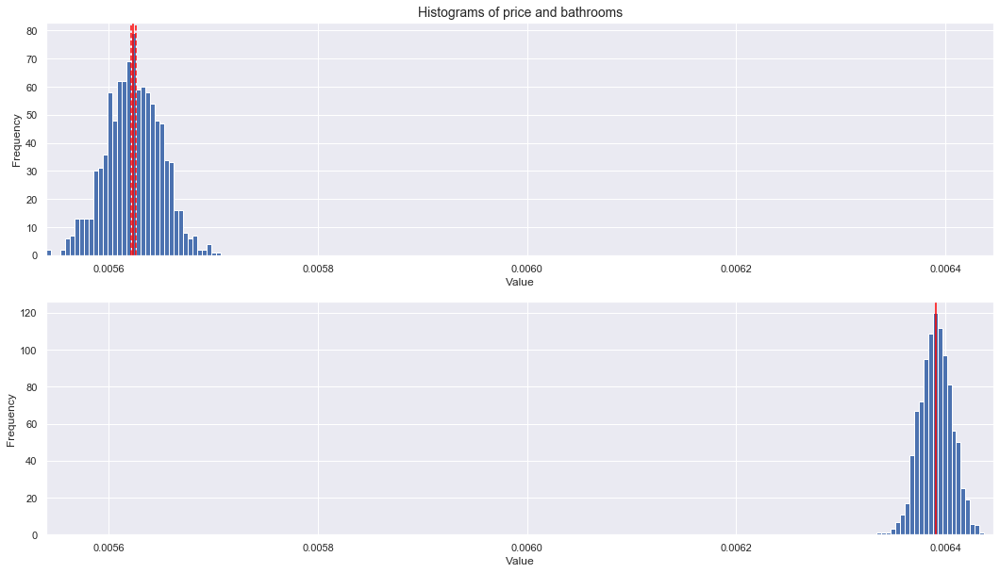


*** sqft_living
DegFreedom     1781.997611
Difference       -0.000598
t-Statistic    -593.126575
PValue            0.000000
Low95CI          -0.000600
High95CI         -0.000596
dtype: float64


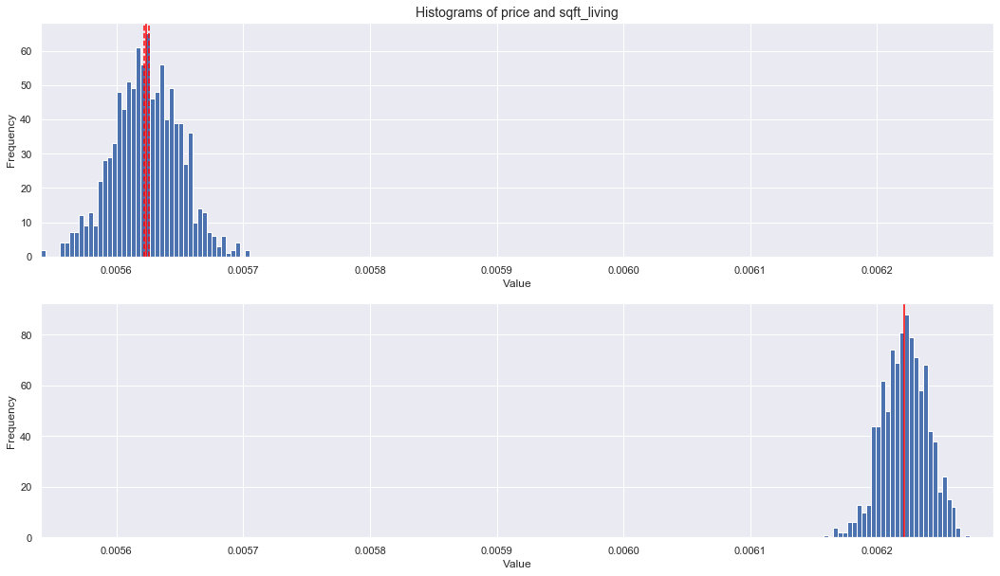


*** sqft_lot
DegFreedom     1649.827675
Difference        0.003291
t-Statistic    2067.025707
PValue            0.000000
Low95CI           0.003288
High95CI          0.003294
dtype: float64


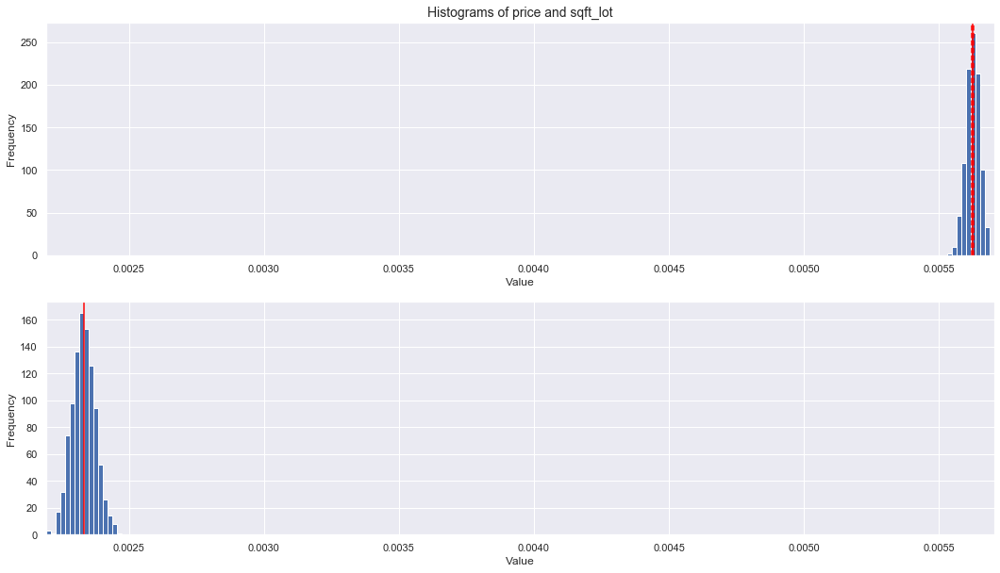


*** floors
DegFreedom     1623.244157
Difference       -0.000774
t-Statistic    -804.297977
PValue            0.000000
Low95CI          -0.000776
High95CI         -0.000772
dtype: float64


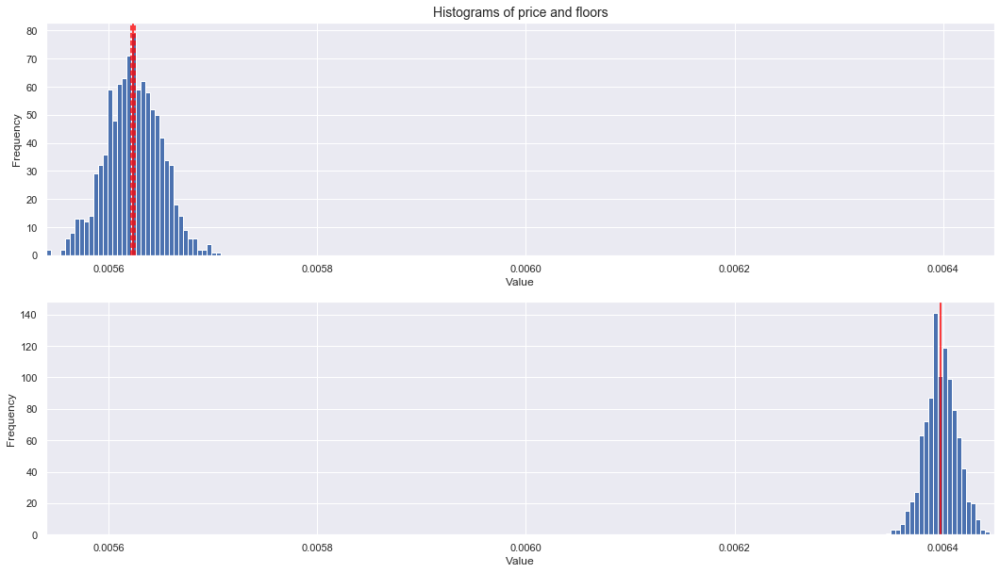


*** waterfront
DegFreedom     1581.072772
Difference        0.005033
t-Statistic    2998.795596
PValue            0.000000
Low95CI           0.005030
High95CI          0.005037
dtype: float64


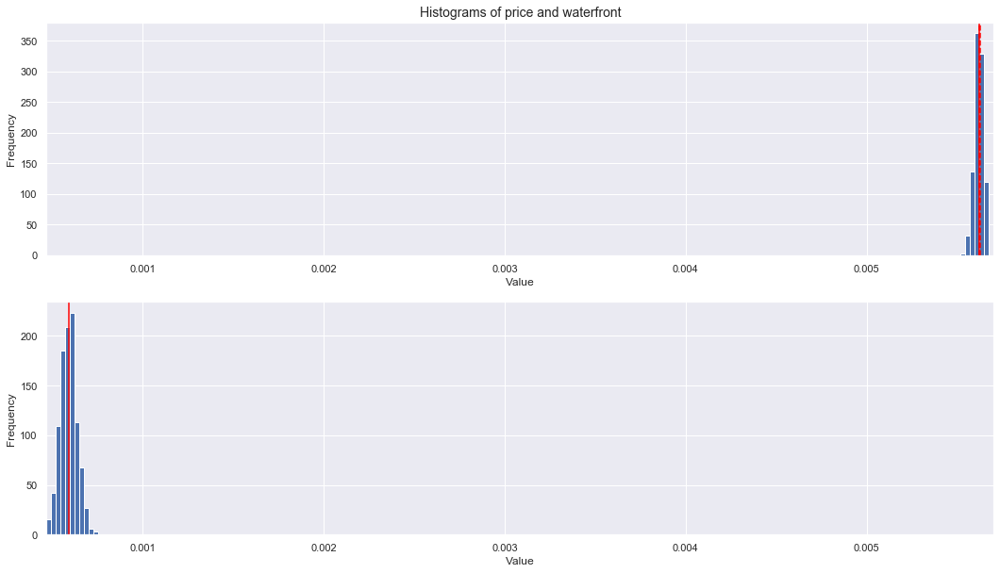


*** view
DegFreedom     1634.795314
Difference        0.003634
t-Statistic    2257.234182
PValue            0.000000
Low95CI           0.003631
High95CI          0.003638
dtype: float64


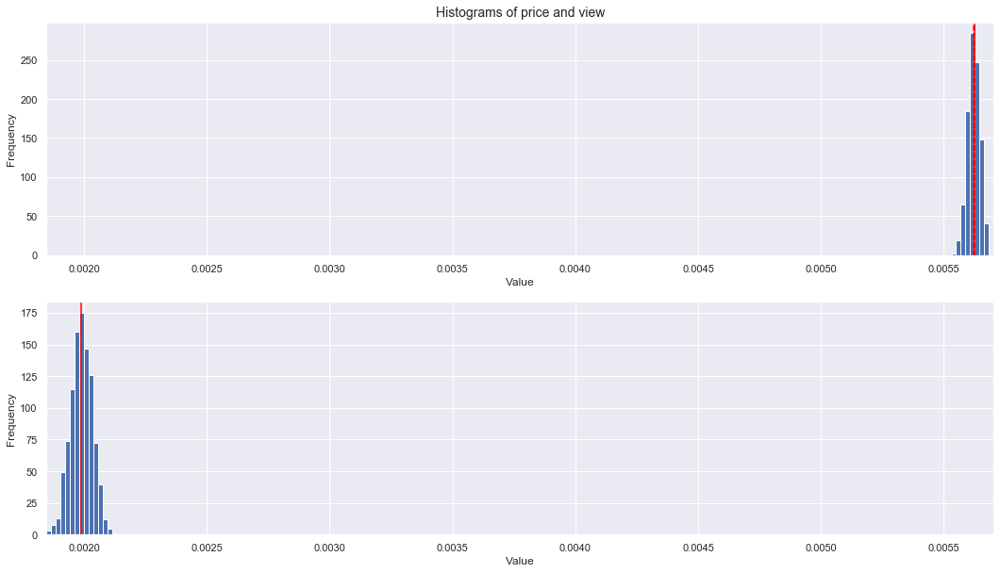


*** condition
DegFreedom     1207.928477
Difference       -0.001058
t-Statistic   -1215.609194
PValue            0.000000
Low95CI          -0.001060
High95CI         -0.001056
dtype: float64


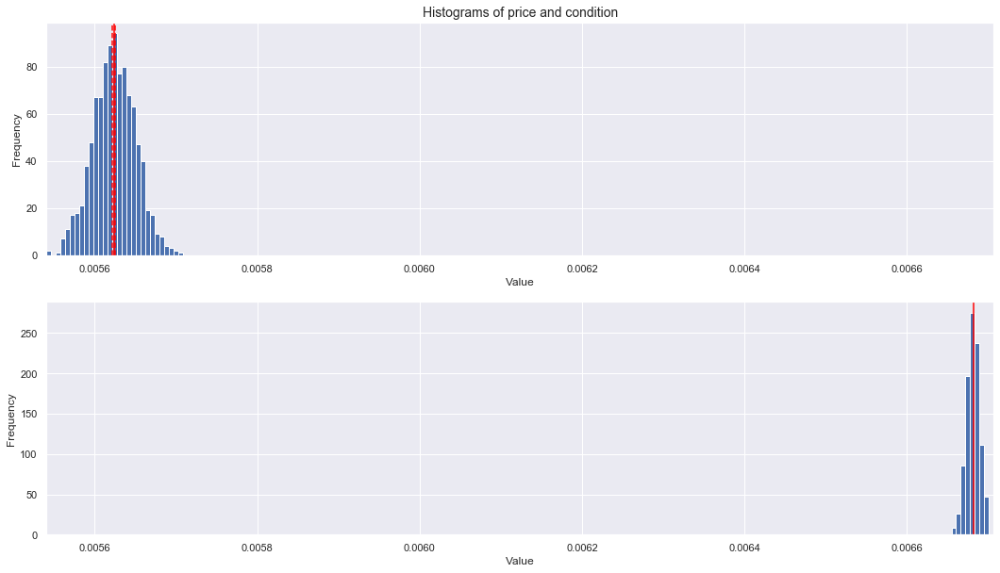


*** grade
DegFreedom     1141.973916
Difference       -0.001099
t-Statistic   -1282.798437
PValue            0.000000
Low95CI          -0.001101
High95CI         -0.001098
dtype: float64


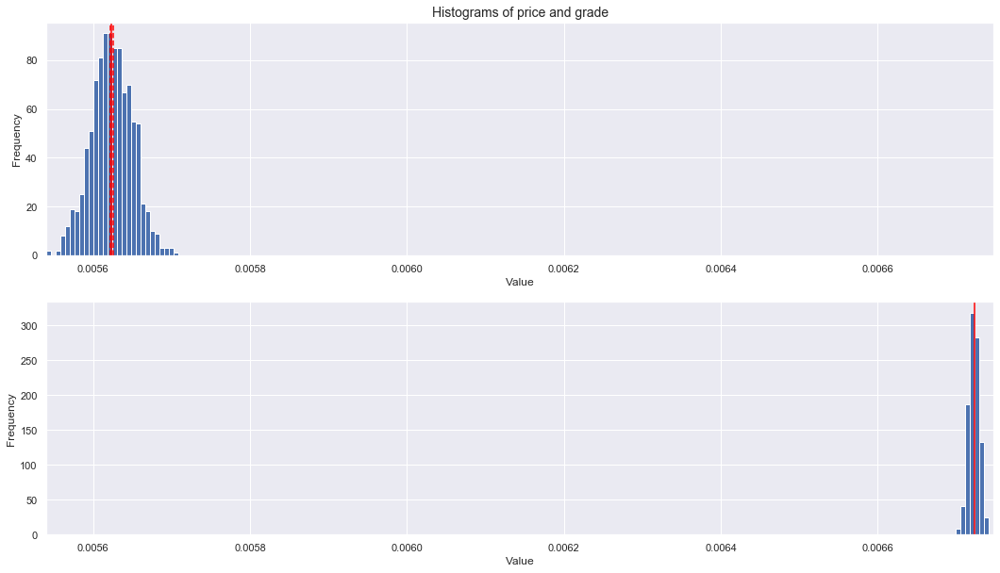


*** sqft_above
DegFreedom     1832.923359
Difference       -0.000548
t-Statistic    -533.643538
PValue            0.000000
Low95CI          -0.000550
High95CI         -0.000546
dtype: float64


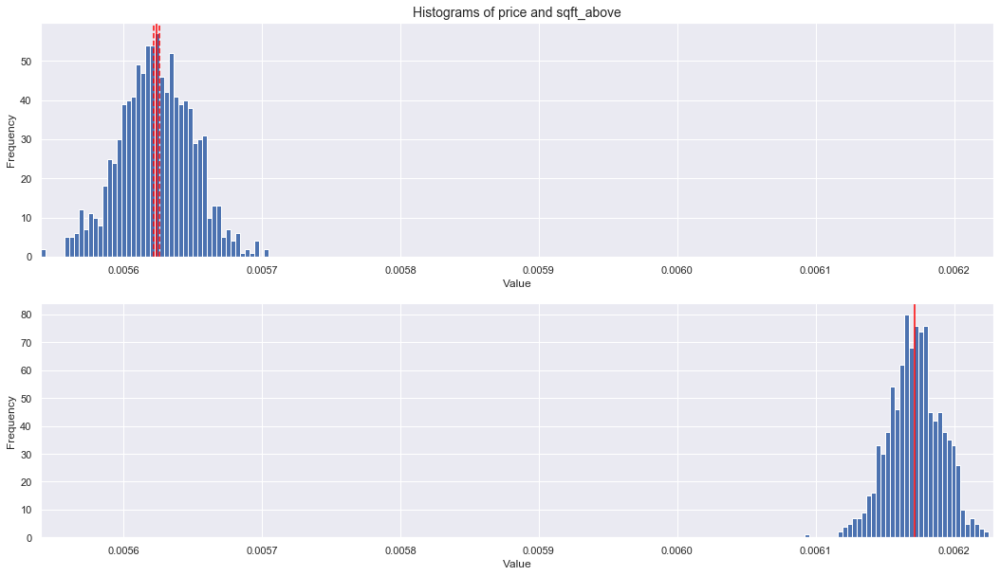


*** sqft_basement
DegFreedom     1774.318835
Difference        0.001882
t-Statistic    1290.797181
PValue            0.000000
Low95CI           0.001879
High95CI          0.001885
dtype: float64


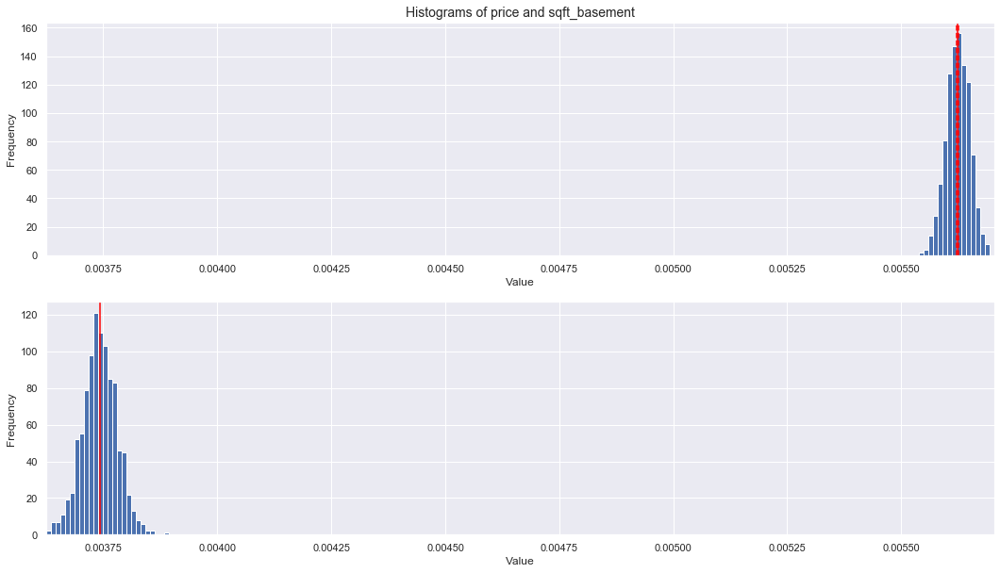


*** yr_built
DegFreedom     1000.370258
Difference       -0.001178
t-Statistic   -1422.157242
PValue            0.000000
Low95CI          -0.001179
High95CI         -0.001176
dtype: float64


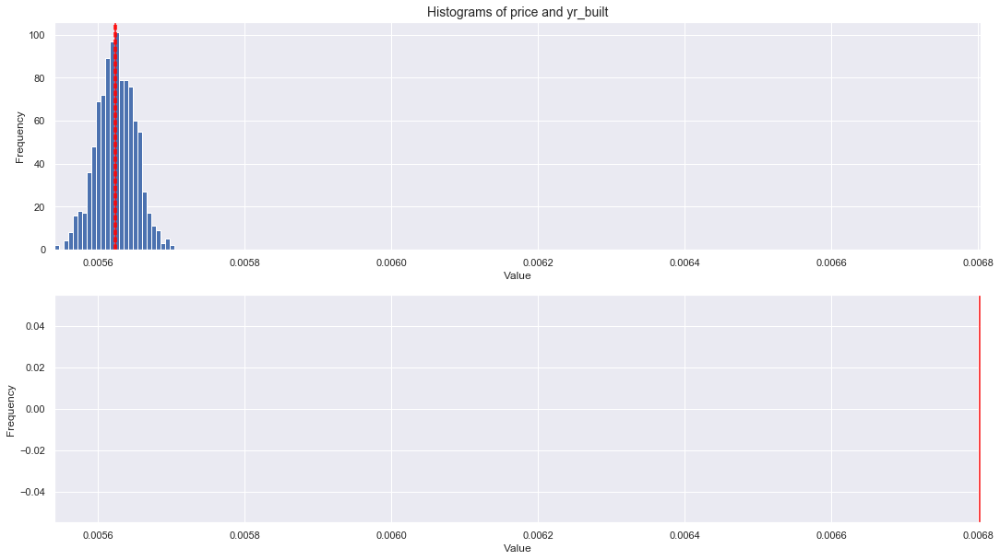


*** yr_renovated
DegFreedom     1577.861430
Difference        0.004226
t-Statistic    2511.117975
PValue            0.000000
Low95CI           0.004222
High95CI          0.004229
dtype: float64


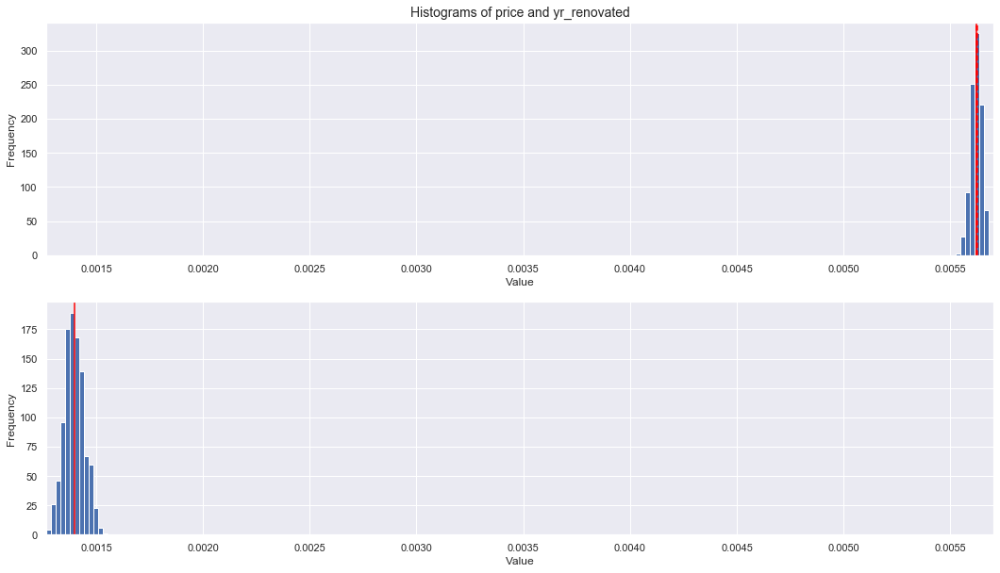


*** zipcode
DegFreedom      999.001819
Difference       -0.001178
t-Statistic   -1423.570135
PValue            0.000000
Low95CI          -0.001180
High95CI         -0.001177
dtype: float64


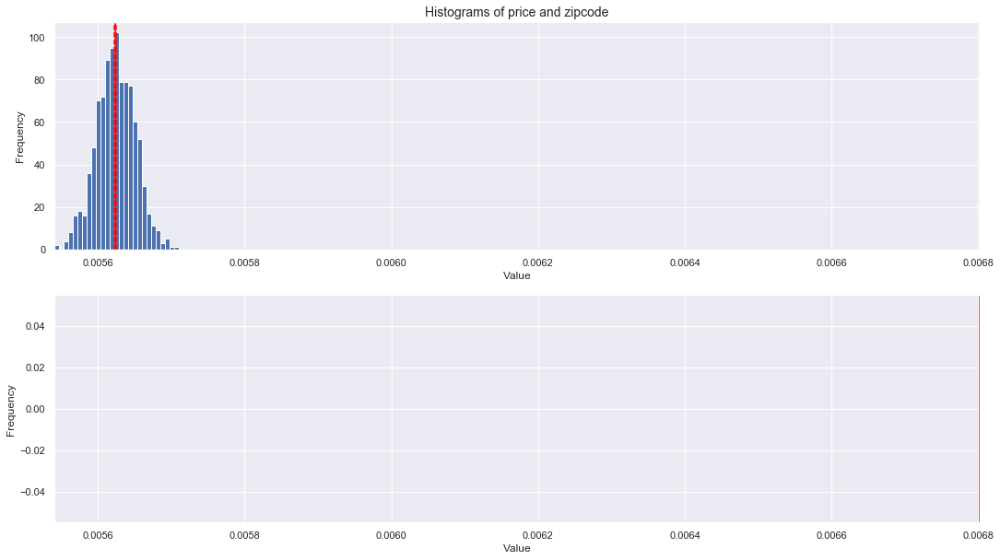


*** lat
DegFreedom      999.054978
Difference       -0.001178
t-Statistic   -1423.513609
PValue            0.000000
Low95CI          -0.001180
High95CI         -0.001177
dtype: float64


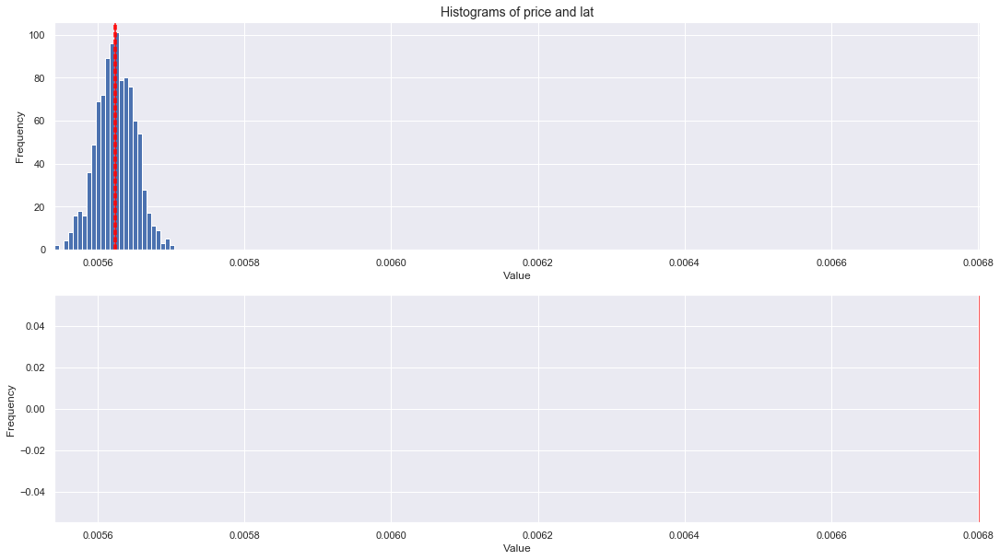


*** long
DegFreedom      999.009064
Difference       -0.001178
t-Statistic   -1423.564096
PValue            0.000000
Low95CI          -0.001180
High95CI         -0.001177
dtype: float64


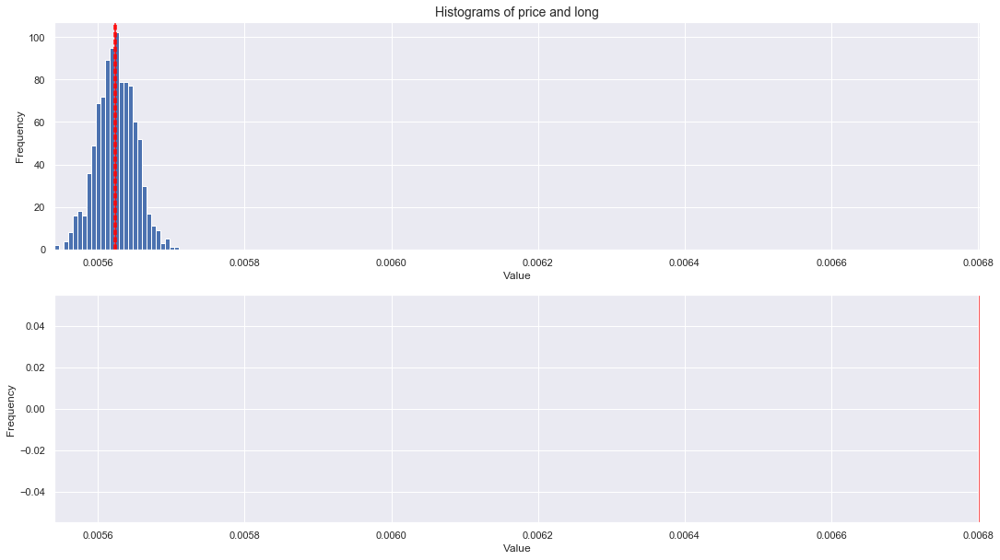


*** sqft_living15
DegFreedom     1572.930390
Difference       -0.000806
t-Statistic    -848.595358
PValue            0.000000
Low95CI          -0.000808
High95CI         -0.000804
dtype: float64


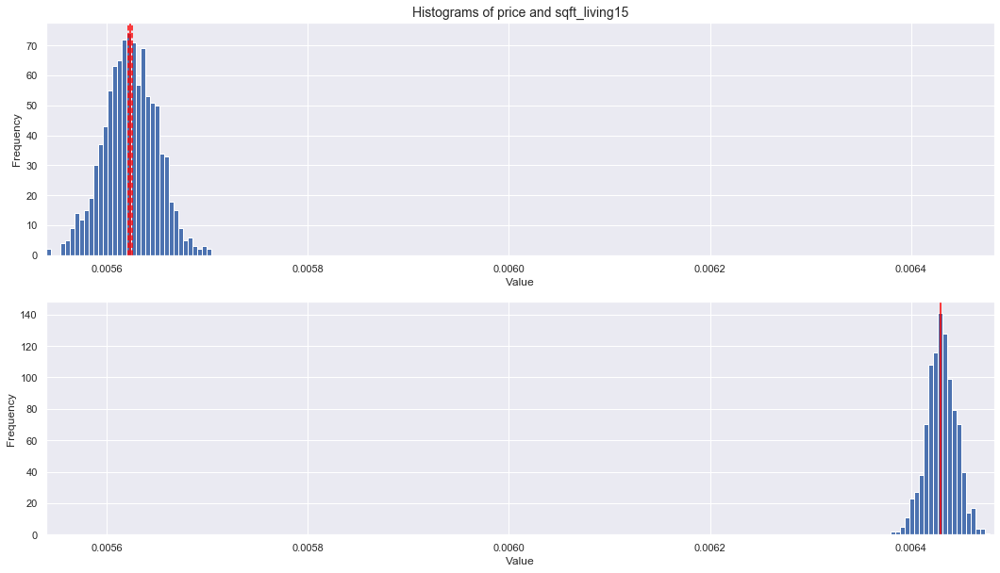


*** sqft_lot15
DegFreedom     1713.673227
Difference        0.002742
t-Statistic    1802.847970
PValue            0.000000
Low95CI           0.002739
High95CI          0.002745
dtype: float64


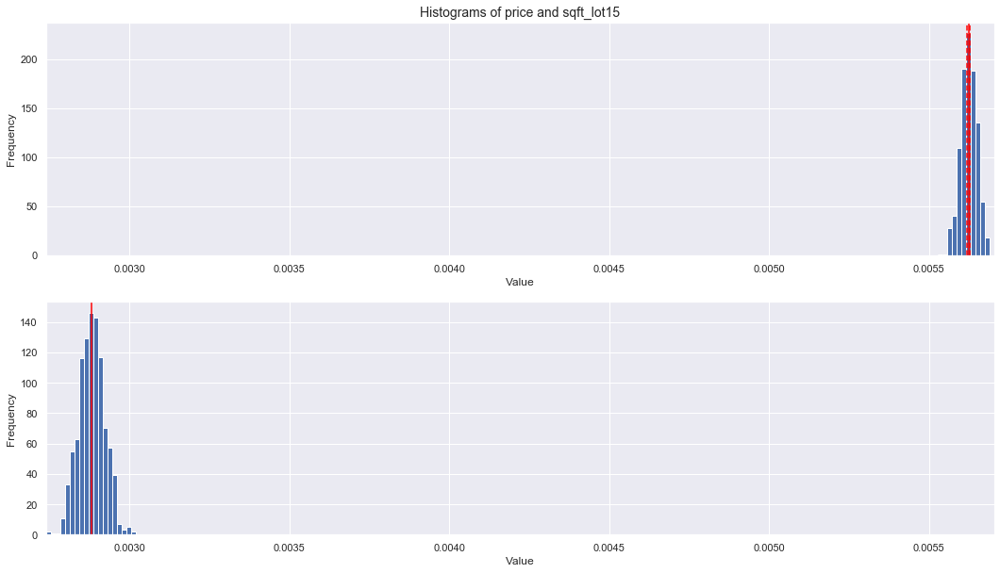

In [42]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['price', item]
    helperBS_tTest(bs_means, features)

### Feature: log_price


*** price
DegFreedom     1009.244950
Difference        0.001173
t-Statistic    1413.129726
PValue            0.000000
Low95CI           0.001171
High95CI          0.001174
dtype: float64


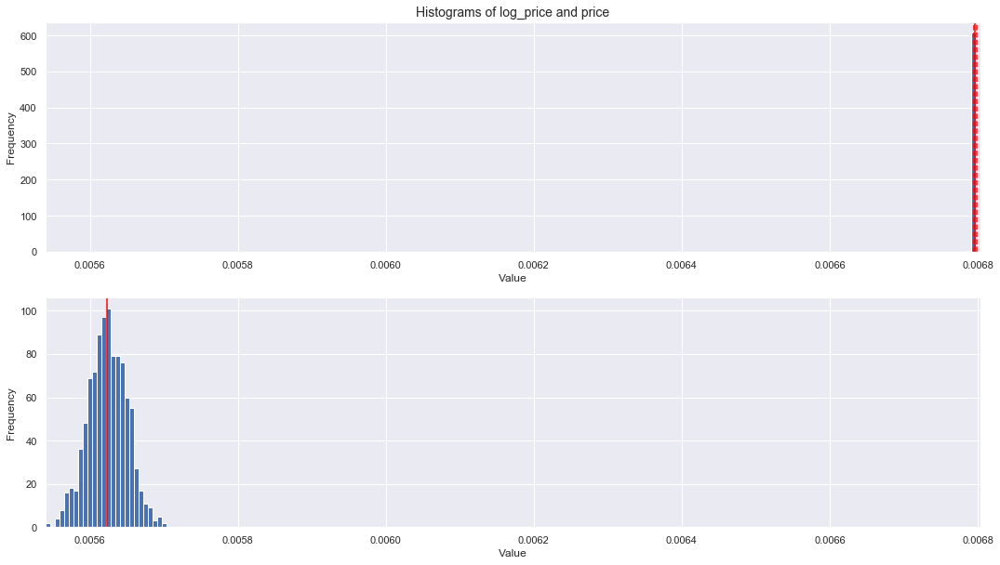


*** log_price

*** bedrooms
DegFreedom     1046.113286
Difference        0.000240
t-Statistic     614.736556
PValue            0.000000
Low95CI           0.000239
High95CI          0.000241
dtype: float64


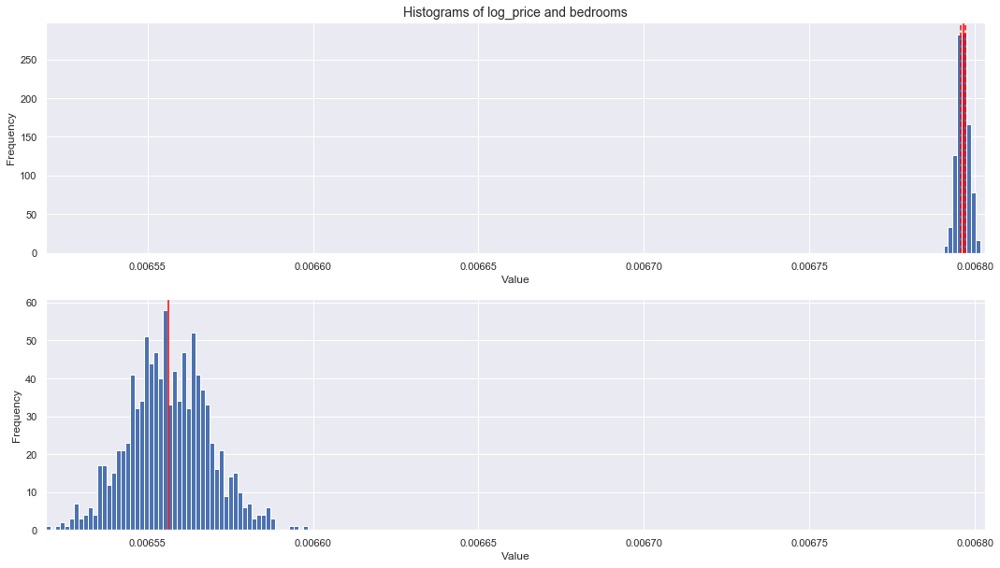


*** bathrooms
DegFreedom     1028.498844
Difference        0.000406
t-Statistic     825.944443
PValue            0.000000
Low95CI           0.000405
High95CI          0.000407
dtype: float64


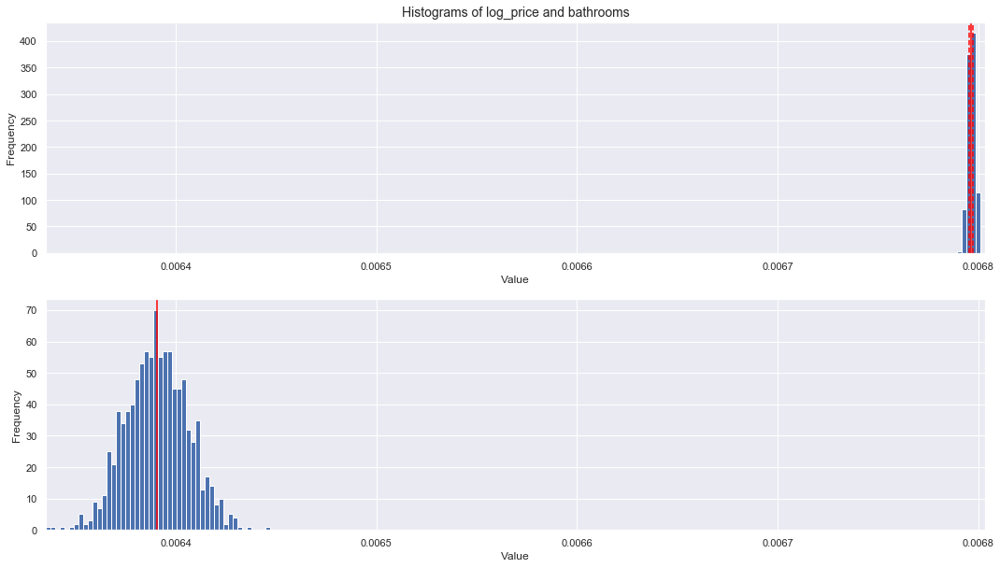


*** sqft_living
DegFreedom     1020.187043
Difference        0.000575
t-Statistic     993.277414
PValue            0.000000
Low95CI           0.000574
High95CI          0.000576
dtype: float64


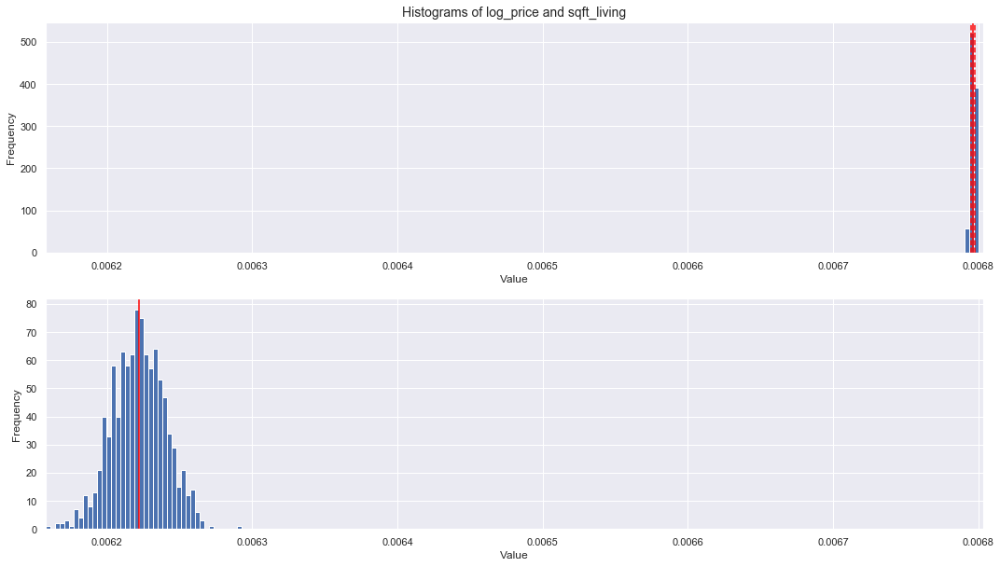


*** sqft_lot
DegFreedom     1002.795218
Difference        0.004464
t-Statistic    3278.952350
PValue            0.000000
Low95CI           0.004461
High95CI          0.004467
dtype: float64


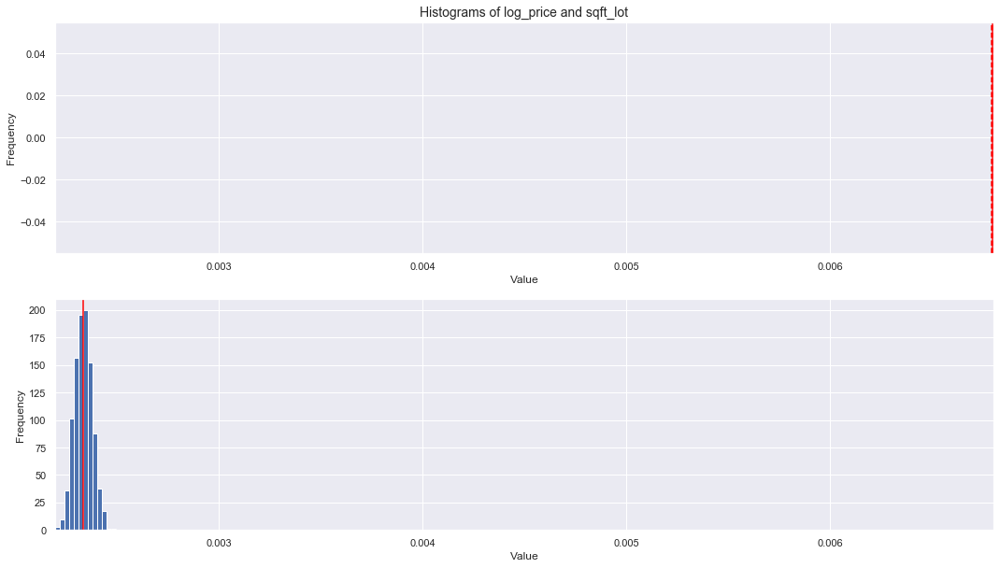


*** floors
DegFreedom     1028.190229
Difference        0.000399
t-Statistic     807.669290
PValue            0.000000
Low95CI           0.000398
High95CI          0.000400
dtype: float64


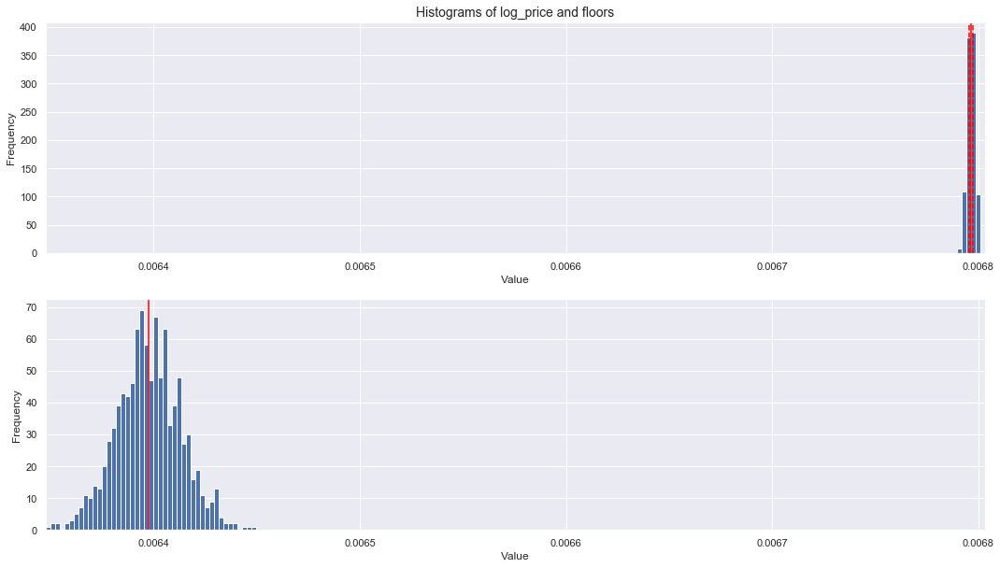


*** waterfront
DegFreedom     1002.293073
Difference        0.006206
t-Statistic    4246.933855
PValue            0.000000
Low95CI           0.006203
High95CI          0.006209
dtype: float64


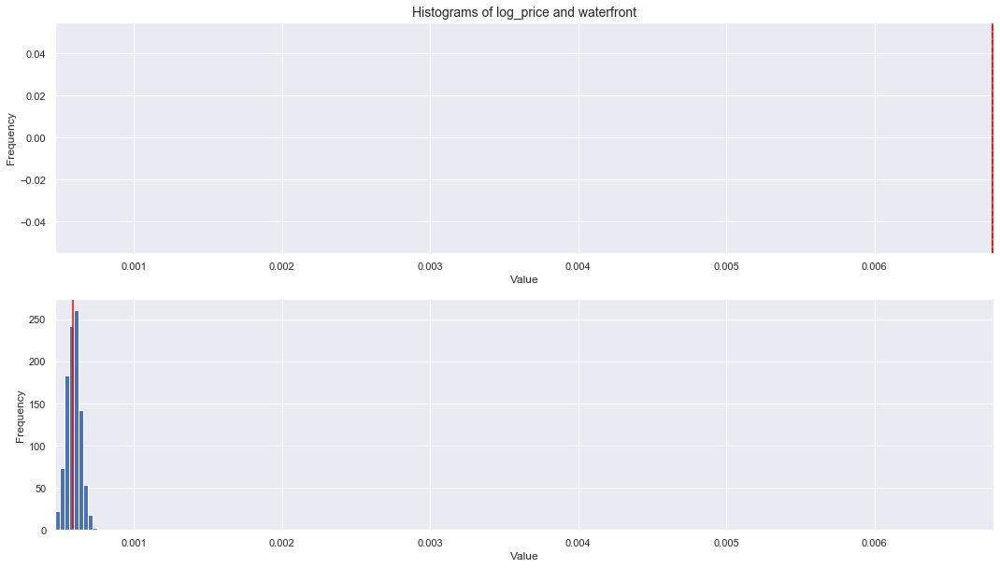


*** view
DegFreedom     1002.681047
Difference        0.004807
t-Statistic    3477.697221
PValue            0.000000
Low95CI           0.004805
High95CI          0.004810
dtype: float64


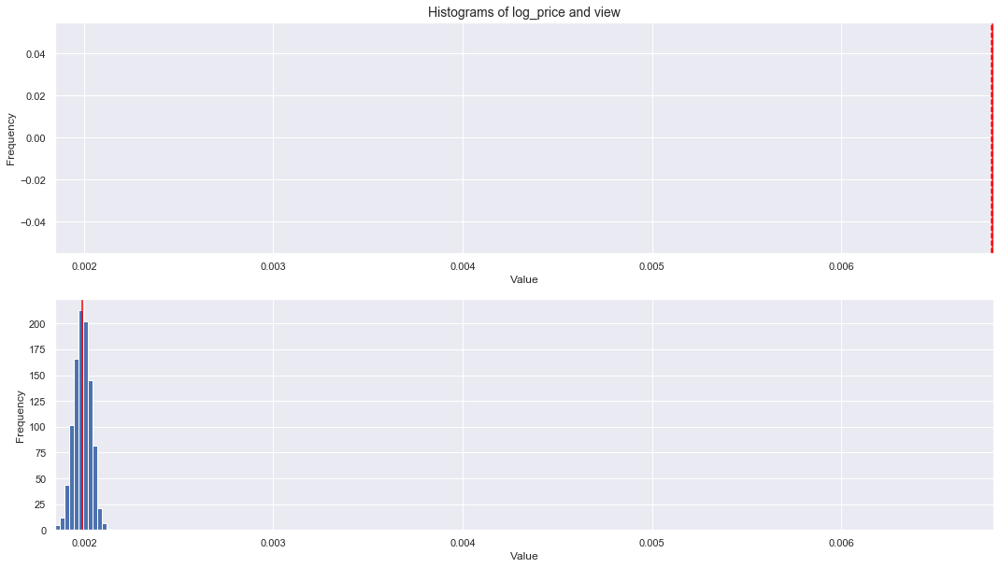


*** condition
DegFreedom     1095.665224
Difference        0.000115
t-Statistic     415.916335
PValue            0.000000
Low95CI           0.000114
High95CI          0.000115
dtype: float64


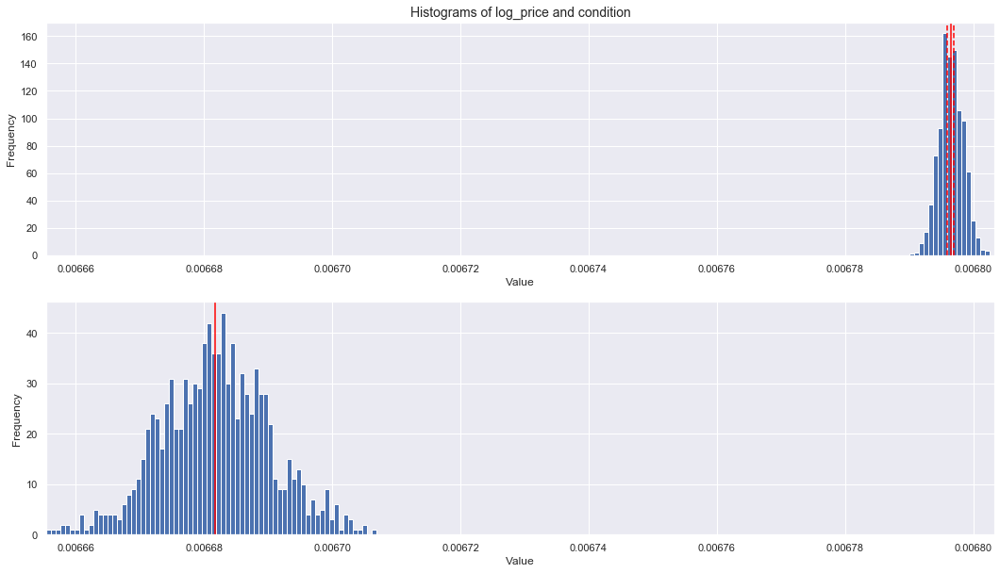


*** grade
DegFreedom     1140.715462
Difference        0.000073
t-Statistic     319.231927
PValue            0.000000
Low95CI           0.000073
High95CI          0.000074
dtype: float64


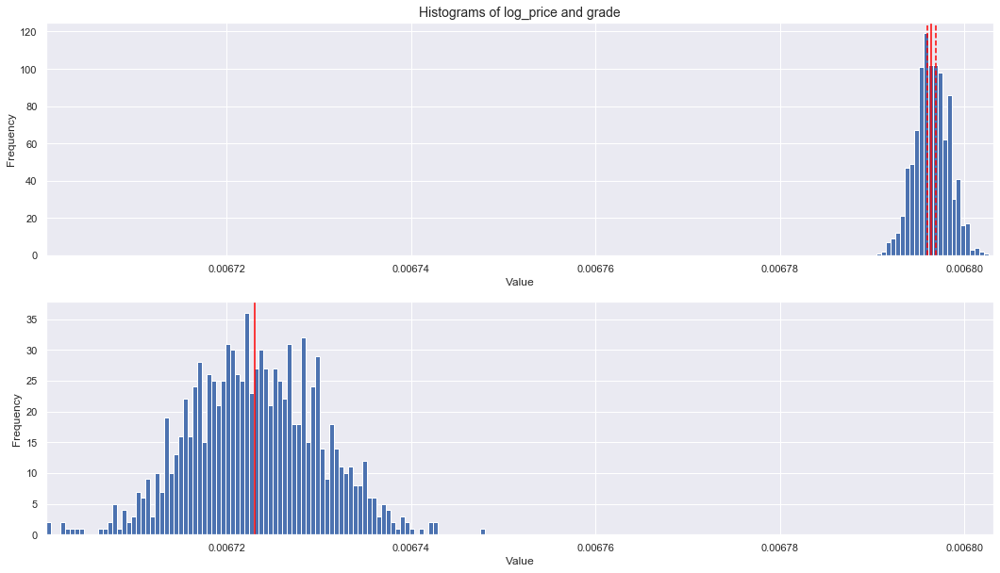


*** sqft_above
DegFreedom     1018.029426
Difference        0.000625
t-Statistic    1023.967471
PValue            0.000000
Low95CI           0.000624
High95CI          0.000626
dtype: float64


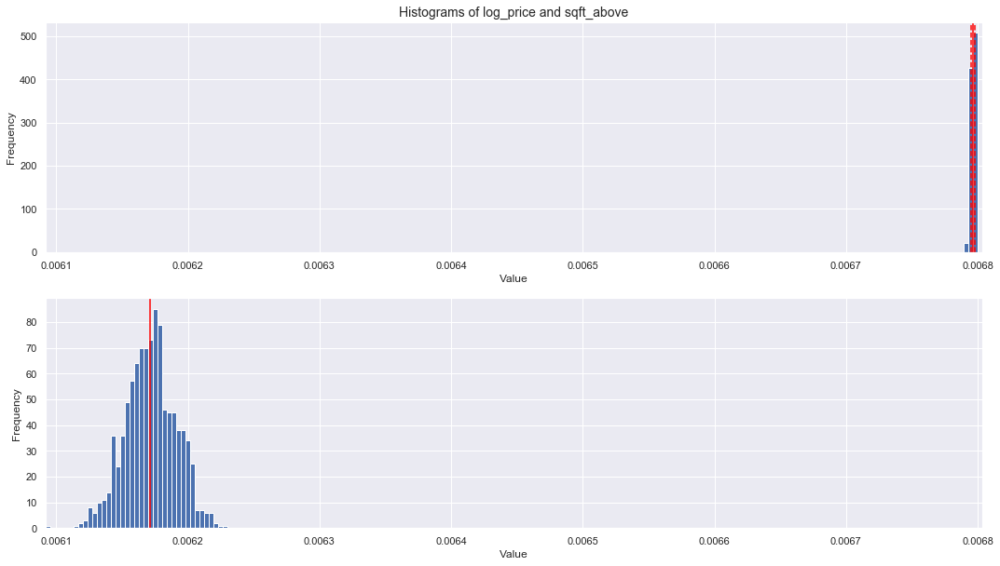


*** sqft_basement
DegFreedom     1003.876203
Difference        0.003055
t-Statistic    2542.477141
PValue            0.000000
Low95CI           0.003052
High95CI          0.003057
dtype: float64


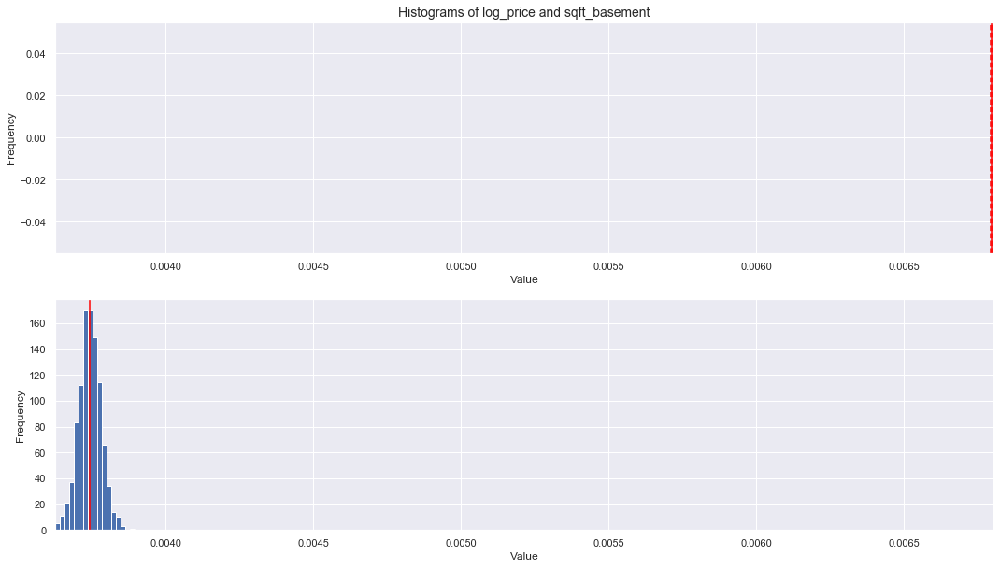


*** yr_built
DegFreedom     1261.528740
Difference       -0.000005
t-Statistic     -77.336570
PValue            0.000000
Low95CI          -0.000005
High95CI         -0.000005
dtype: float64


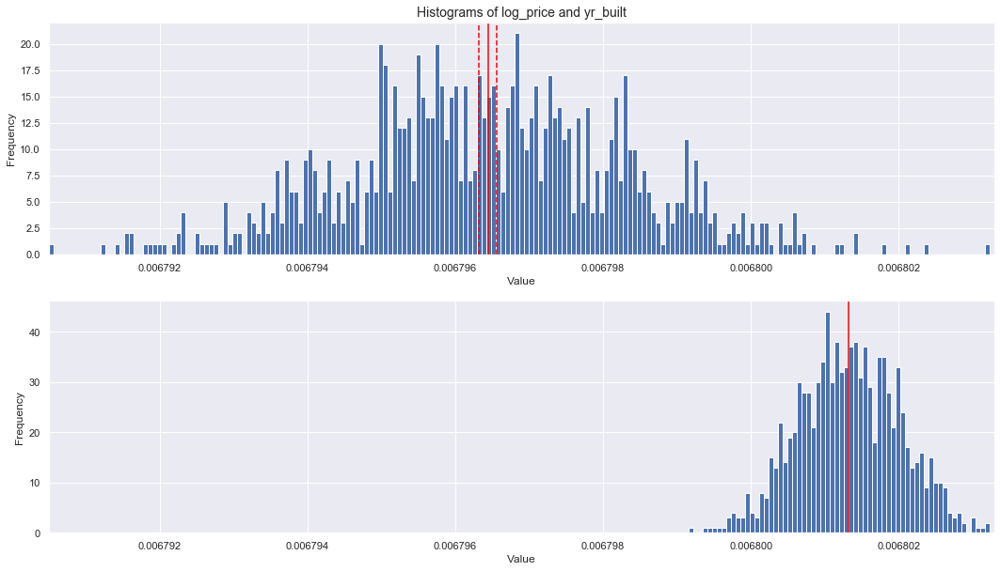


*** yr_renovated
DegFreedom     1002.270764
Difference        0.005399
t-Statistic    3681.713784
PValue            0.000000
Low95CI           0.005396
High95CI          0.005401
dtype: float64


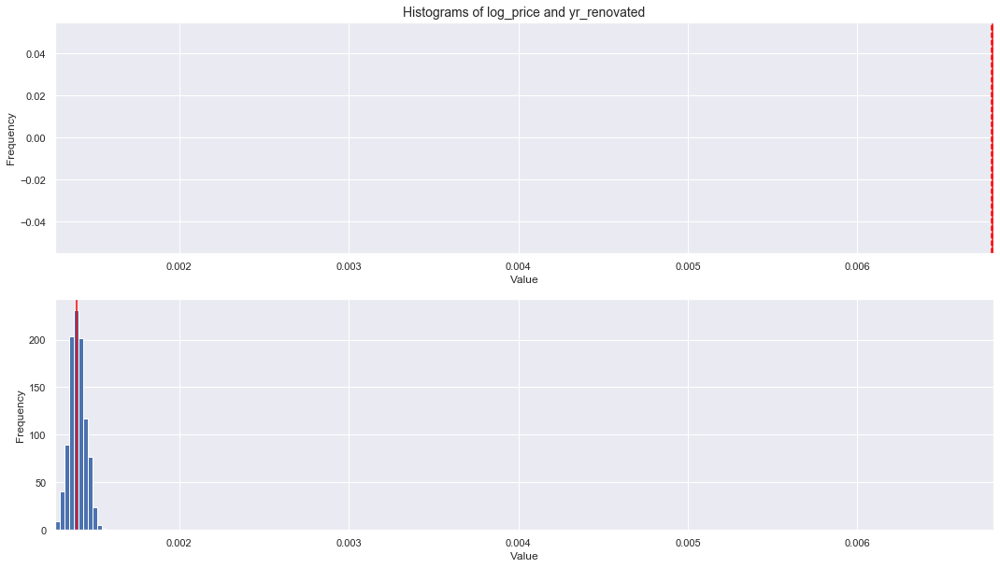


*** zipcode
DegFreedom     999.354762
Difference      -0.000006
t-Statistic    -95.268457
PValue           0.000000
Low95CI         -0.000006
High95CI        -0.000006
dtype: float64


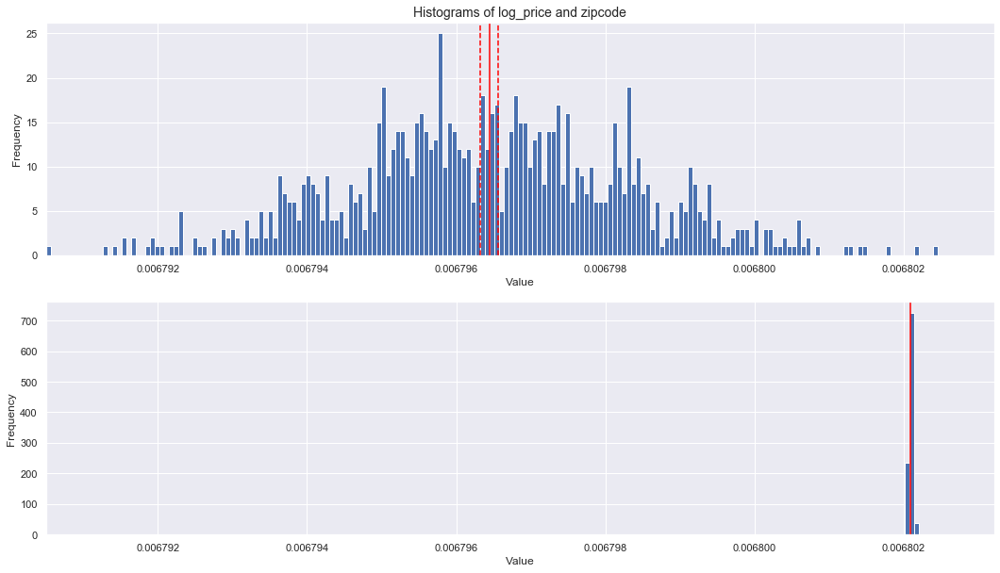


*** lat
DegFreedom     1009.721420
Difference       -0.000006
t-Statistic     -94.498786
PValue            0.000000
Low95CI          -0.000006
High95CI         -0.000006
dtype: float64


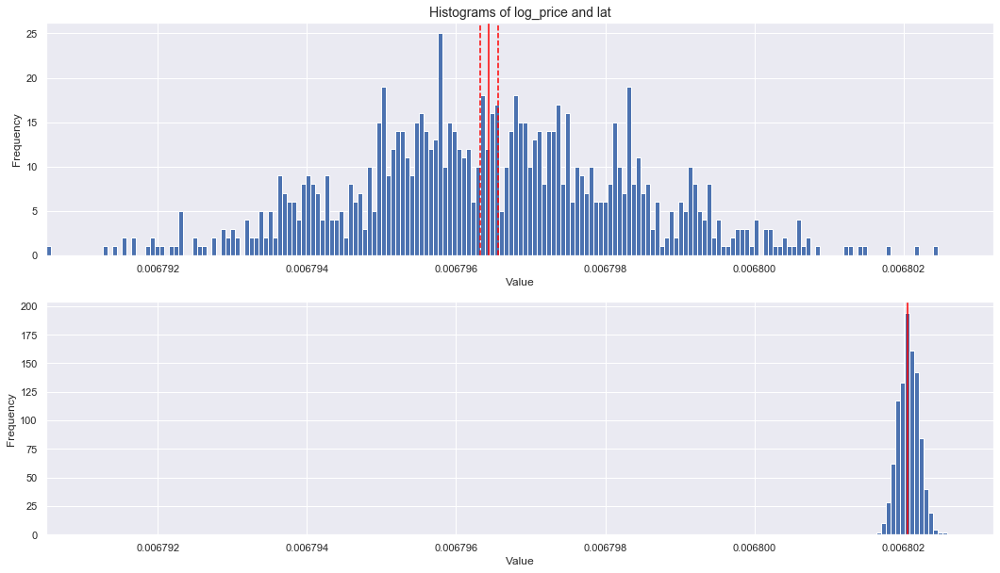


*** long
DegFreedom     1000.767560
Difference       -0.000006
t-Statistic     -95.186529
PValue            0.000000
Low95CI          -0.000006
High95CI         -0.000006
dtype: float64


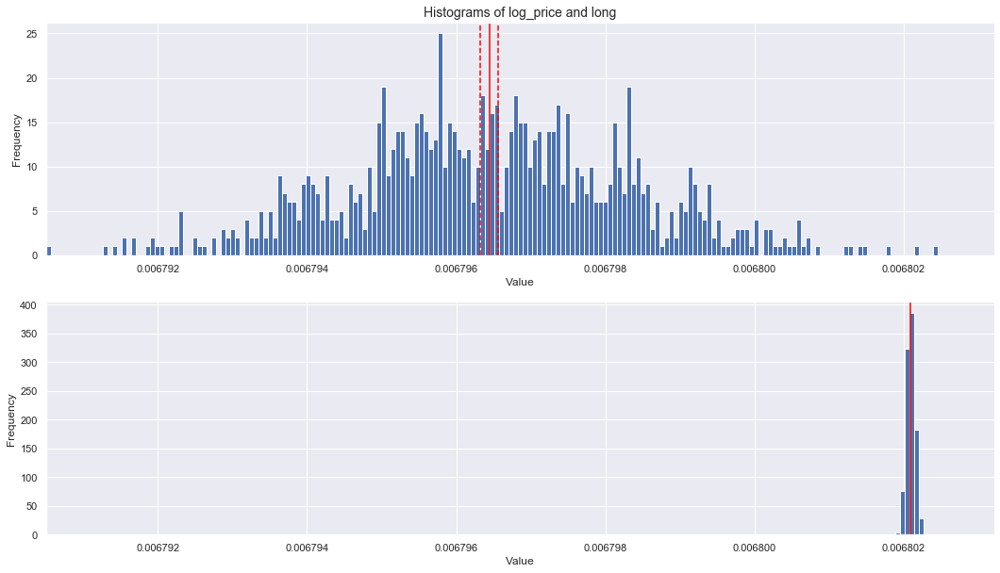


*** sqft_living15
DegFreedom     1031.421022
Difference        0.000367
t-Statistic     782.357063
PValue            0.000000
Low95CI           0.000366
High95CI          0.000368
dtype: float64


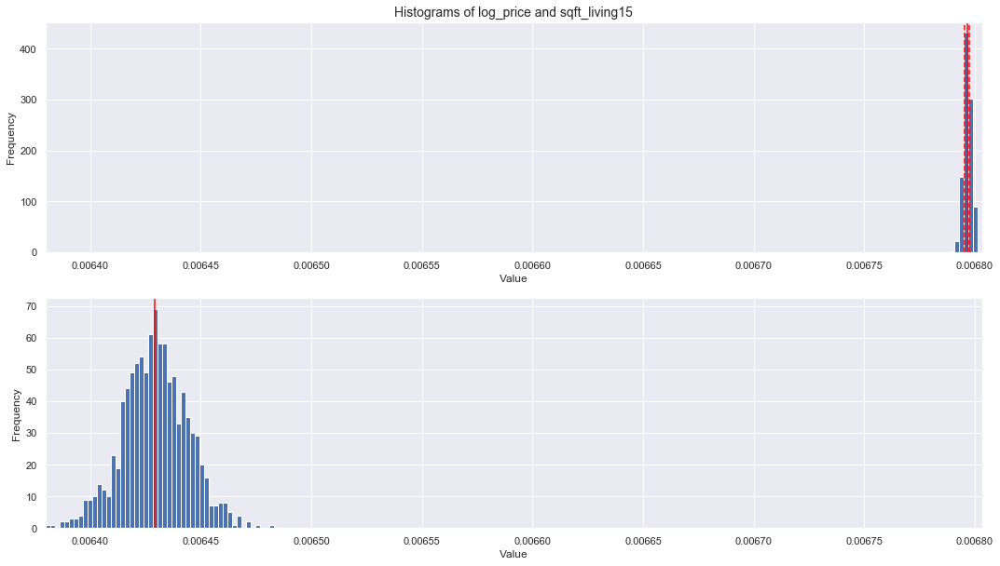


*** sqft_lot15
DegFreedom     1003.314572
Difference        0.003914
t-Statistic    3065.284241
PValue            0.000000
Low95CI           0.003912
High95CI          0.003917
dtype: float64


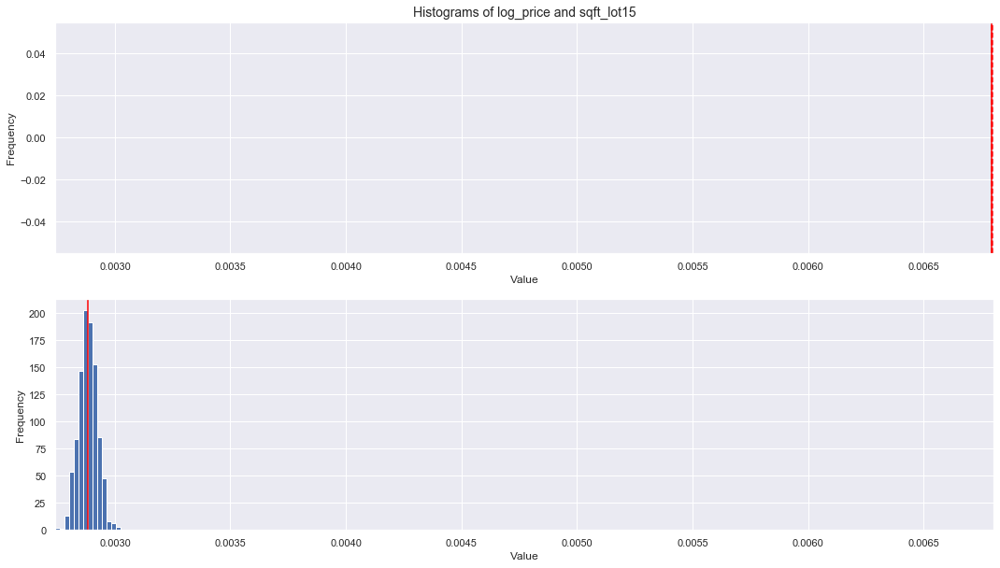

In [43]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['log_price', item]
    helperBS_tTest(bs_means, features)

### Feature: grade


*** price
DegFreedom     1141.973916
Difference        0.001099
t-Statistic    1282.798437
PValue            0.000000
Low95CI           0.001098
High95CI          0.001101
dtype: float64


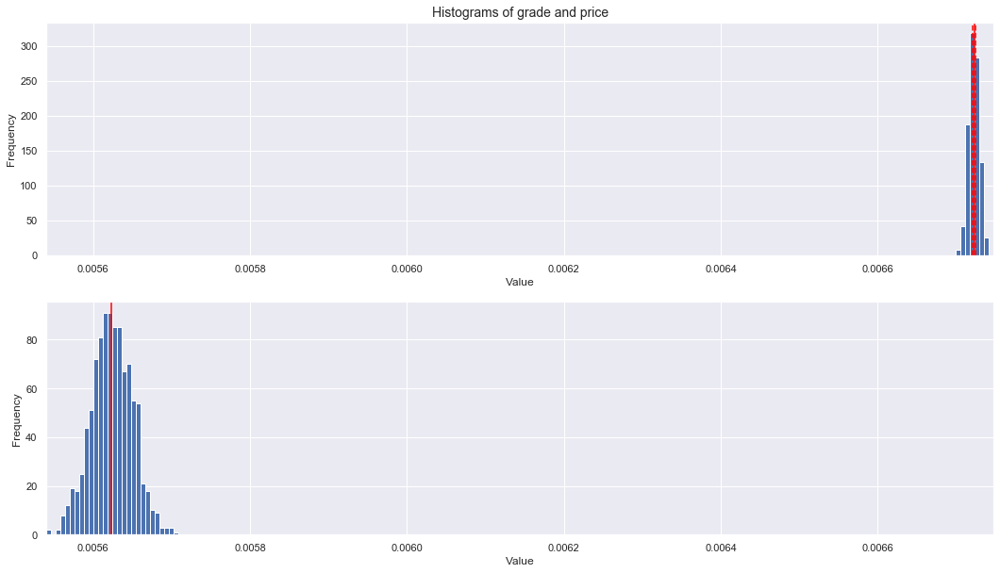


*** log_price
DegFreedom     1140.715462
Difference       -0.000073
t-Statistic    -319.231927
PValue            0.000000
Low95CI          -0.000074
High95CI         -0.000073
dtype: float64


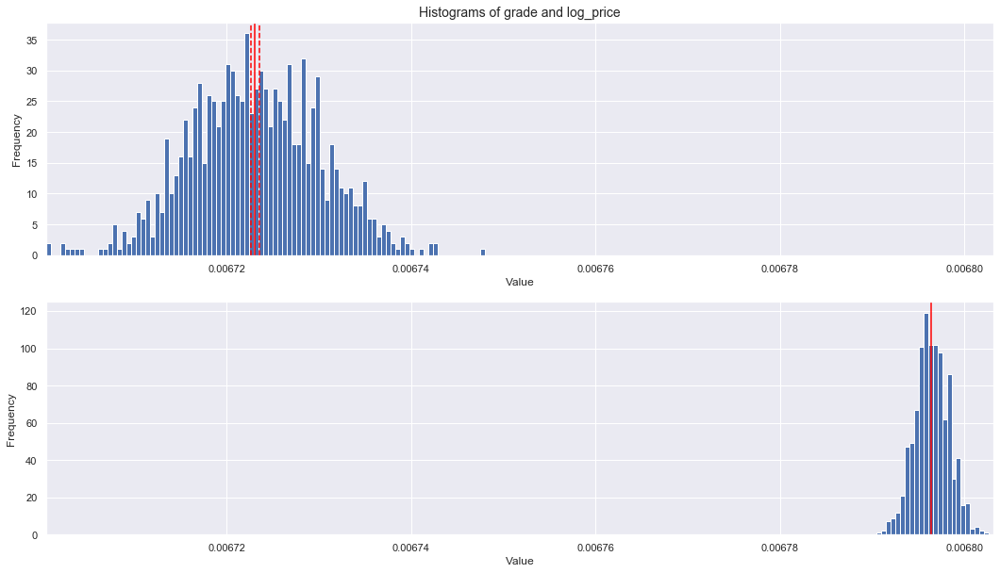


*** bedrooms
DegFreedom     1594.967761
Difference        0.000167
t-Statistic     374.338914
PValue            0.000000
Low95CI           0.000166
High95CI          0.000168
dtype: float64


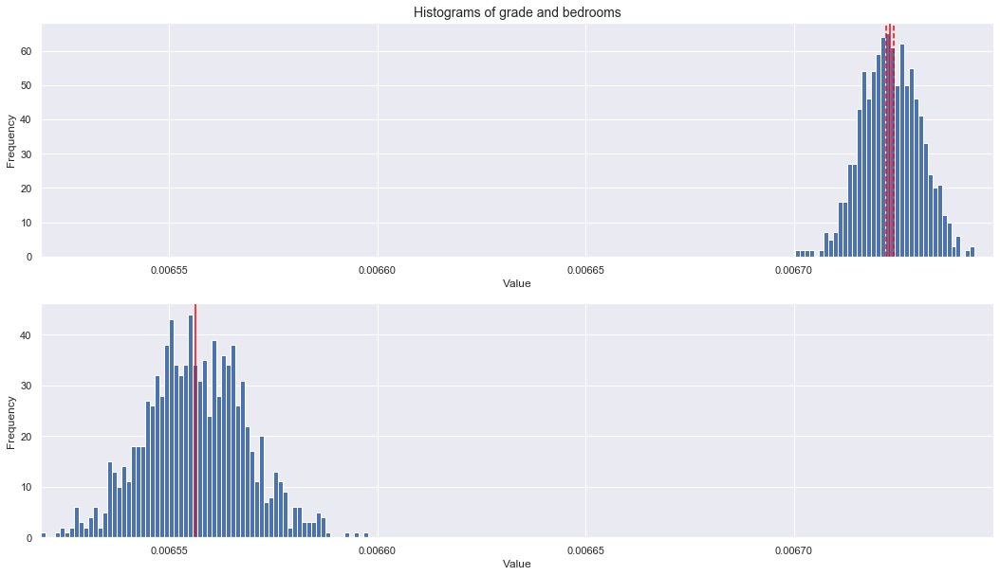


*** bathrooms
DegFreedom     1395.852779
Difference        0.000333
t-Statistic     620.401693
PValue            0.000000
Low95CI           0.000331
High95CI          0.000334
dtype: float64


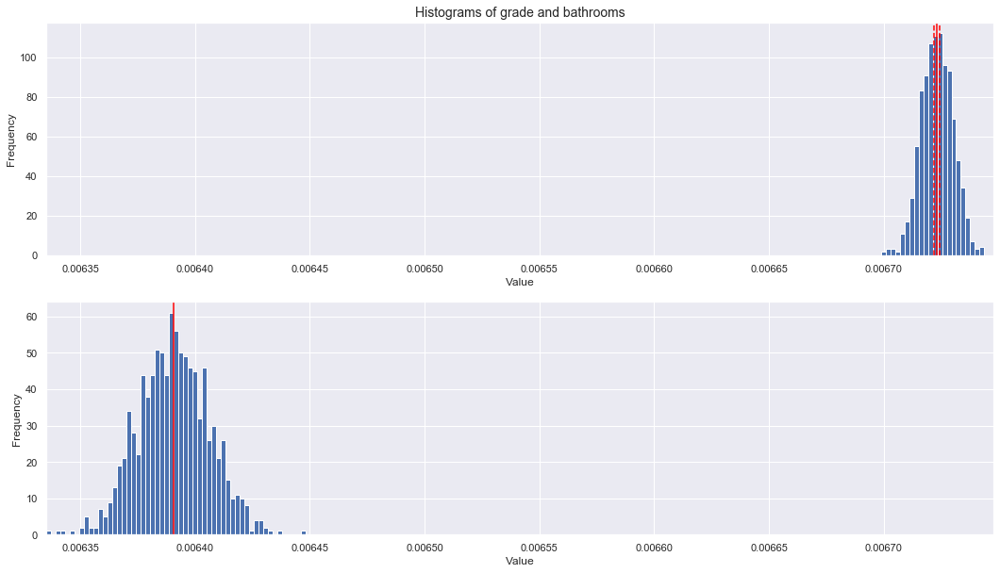


*** sqft_living
DegFreedom     1289.796599
Difference        0.000501
t-Statistic     812.731553
PValue            0.000000
Low95CI           0.000500
High95CI          0.000503
dtype: float64


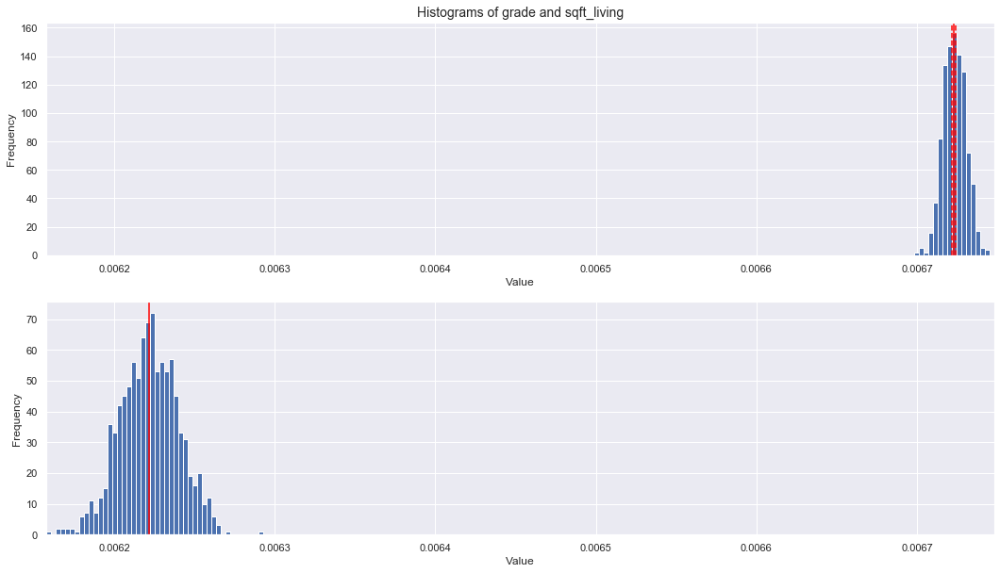


*** sqft_lot
DegFreedom     1052.199401
Difference        0.004391
t-Statistic    3185.963905
PValue            0.000000
Low95CI           0.004388
High95CI          0.004393
dtype: float64


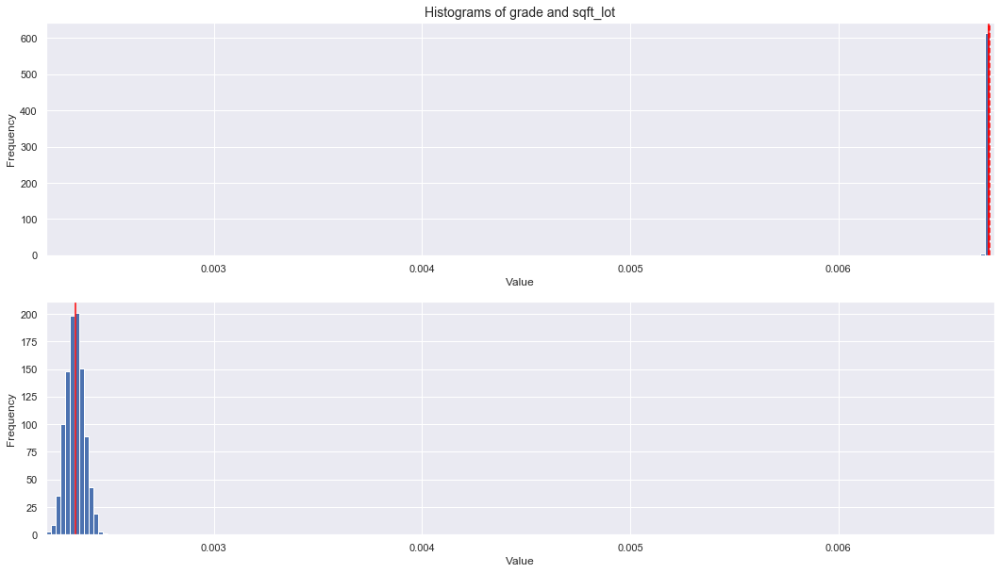


*** floors
DegFreedom     1392.035889
Difference        0.000326
t-Statistic     604.851130
PValue            0.000000
Low95CI           0.000325
High95CI          0.000327
dtype: float64


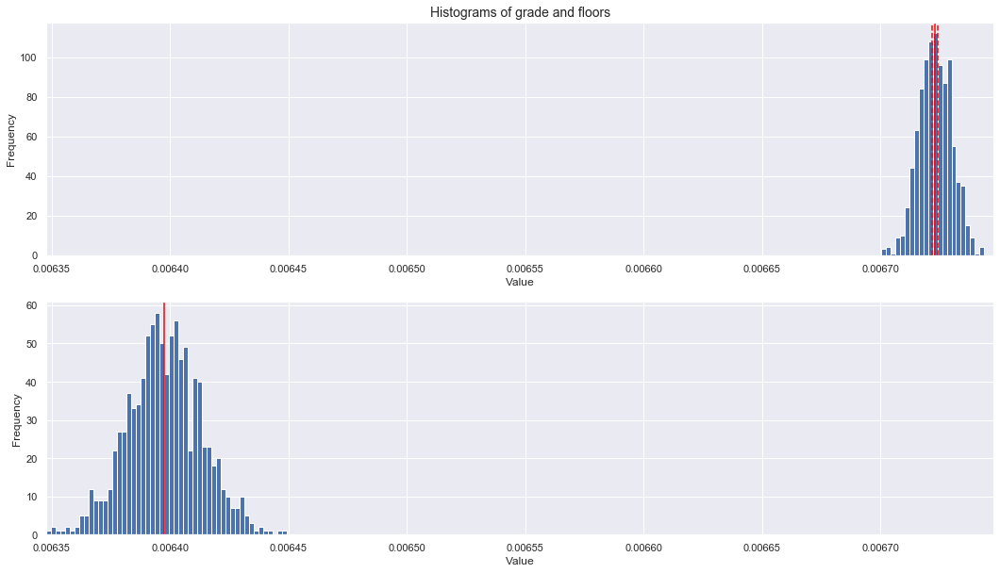


*** waterfront
DegFreedom     1045.168643
Difference        0.006133
t-Statistic    4152.464327
PValue            0.000000
Low95CI           0.006130
High95CI          0.006136
dtype: float64


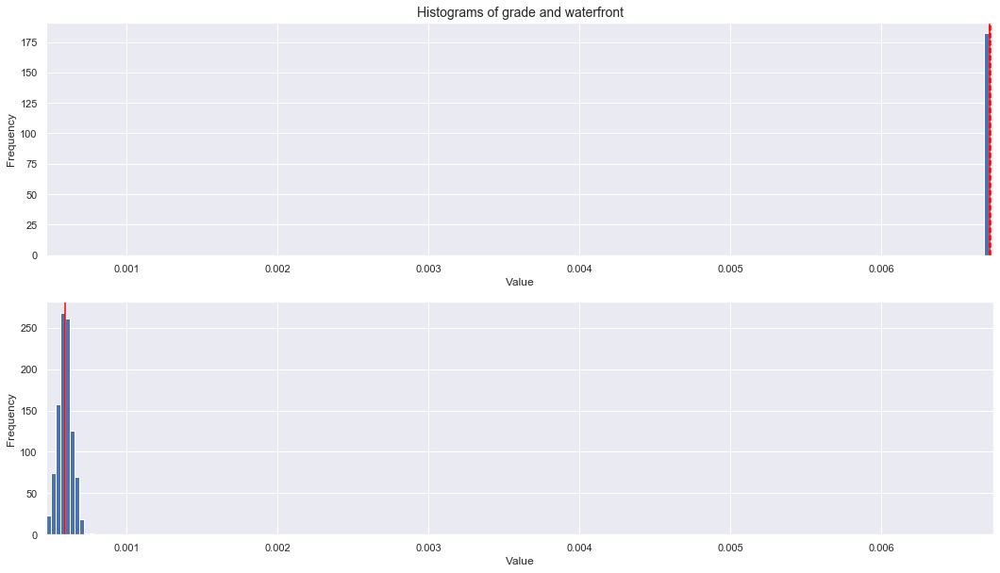


*** view
DegFreedom     1050.601176
Difference        0.004734
t-Statistic    3384.329187
PValue            0.000000
Low95CI           0.004731
High95CI          0.004737
dtype: float64


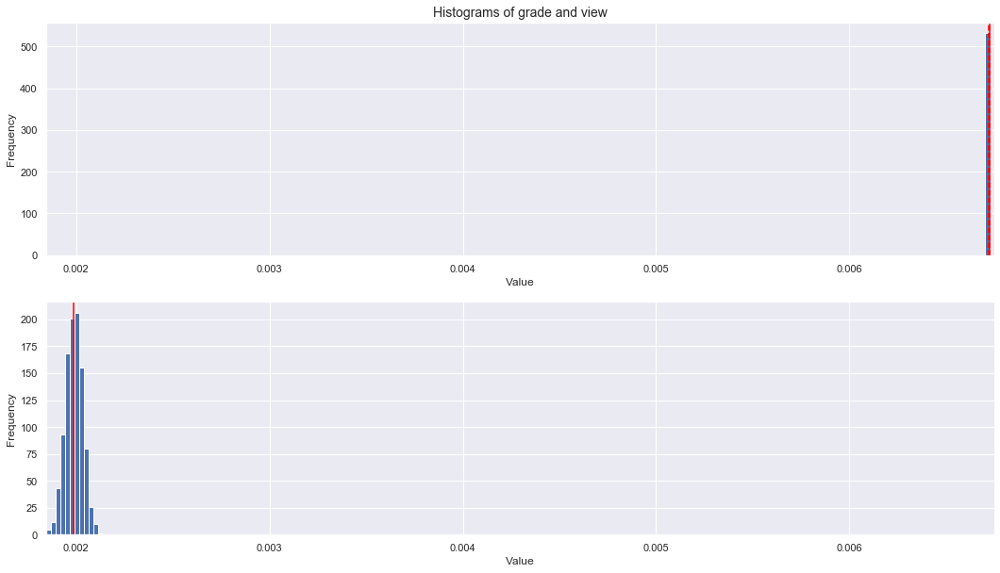


*** condition
DegFreedom     1928.176044
Difference        0.000041
t-Statistic     118.313655
PValue            0.000000
Low95CI           0.000041
High95CI          0.000042
dtype: float64


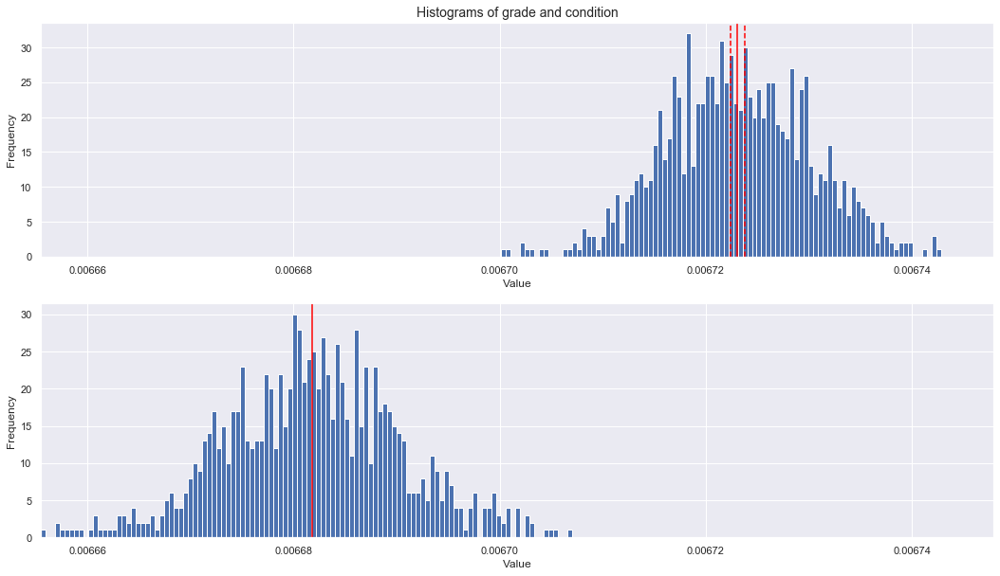


*** grade

*** sqft_above
DegFreedom     1261.275095
Difference        0.000552
t-Statistic     852.865148
PValue            0.000000
Low95CI           0.000550
High95CI          0.000553
dtype: float64


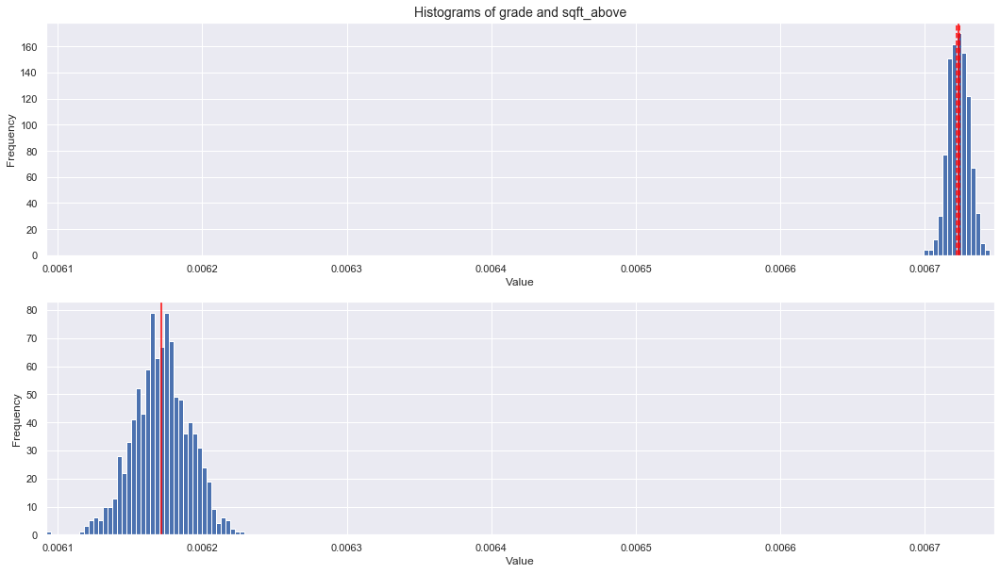


*** sqft_basement
DegFreedom     1067.320710
Difference        0.002981
t-Statistic    2442.977119
PValue            0.000000
Low95CI           0.002979
High95CI          0.002984
dtype: float64


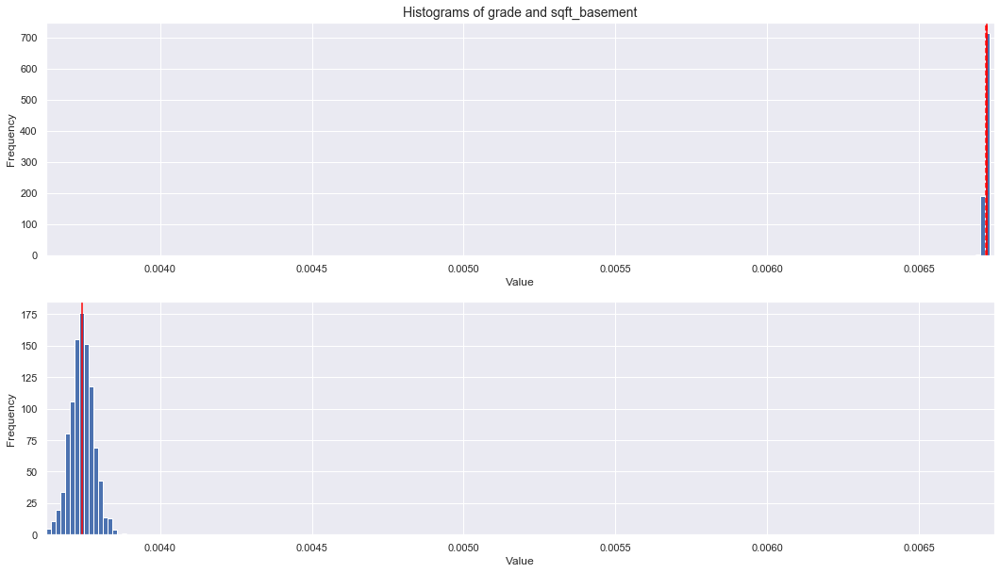


*** yr_built
DegFreedom     1018.048496
Difference       -0.000078
t-Statistic    -350.733260
PValue            0.000000
Low95CI          -0.000079
High95CI         -0.000078
dtype: float64


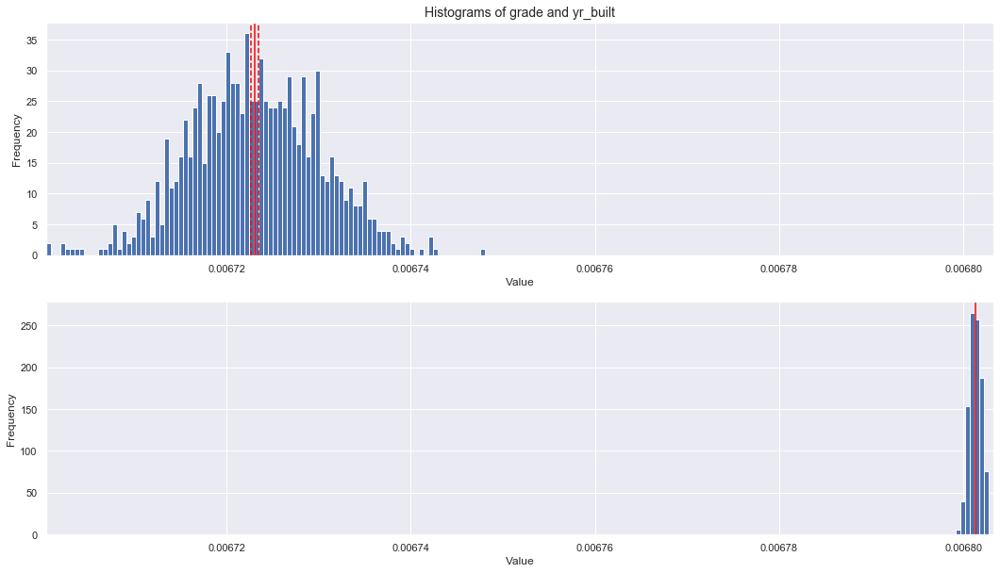


*** yr_renovated
DegFreedom     1044.856202
Difference        0.005325
t-Statistic    3593.629973
PValue            0.000000
Low95CI           0.005322
High95CI          0.005328
dtype: float64


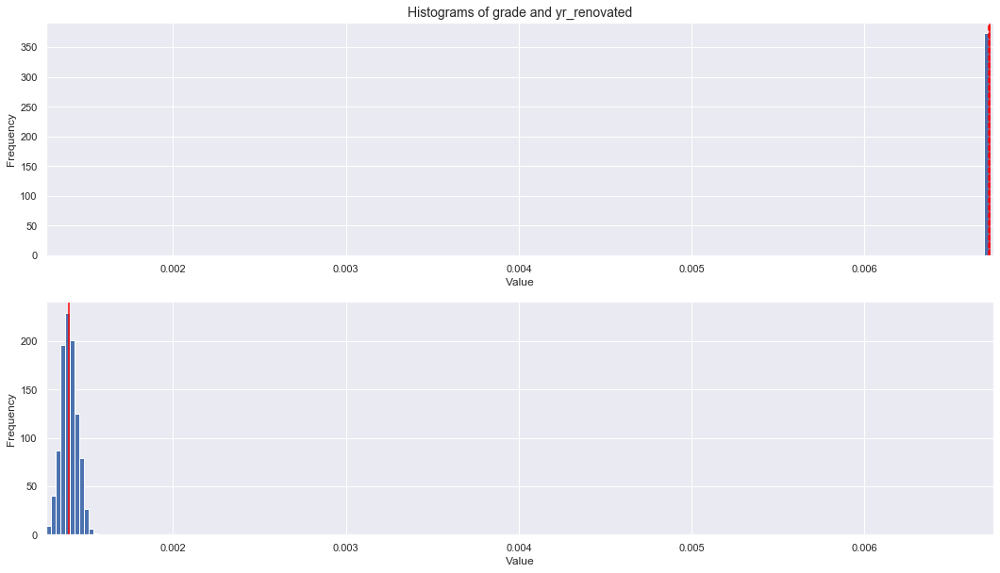


*** zipcode
DegFreedom     999.025291
Difference      -0.000079
t-Statistic   -355.851641
PValue           0.000000
Low95CI         -0.000079
High95CI        -0.000079
dtype: float64


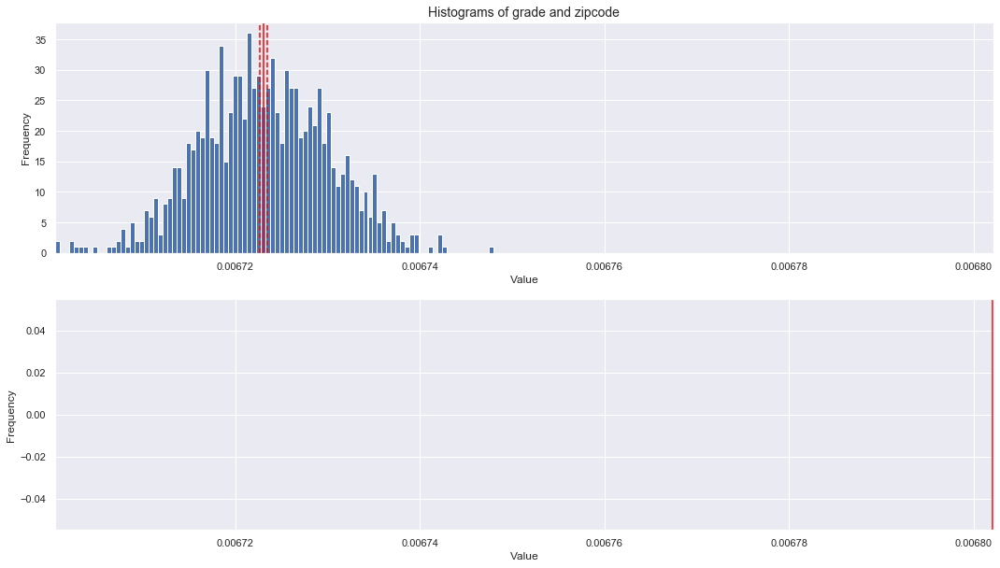


*** lat
DegFreedom     999.764343
Difference      -0.000079
t-Statistic   -355.645720
PValue           0.000000
Low95CI         -0.000079
High95CI        -0.000079
dtype: float64


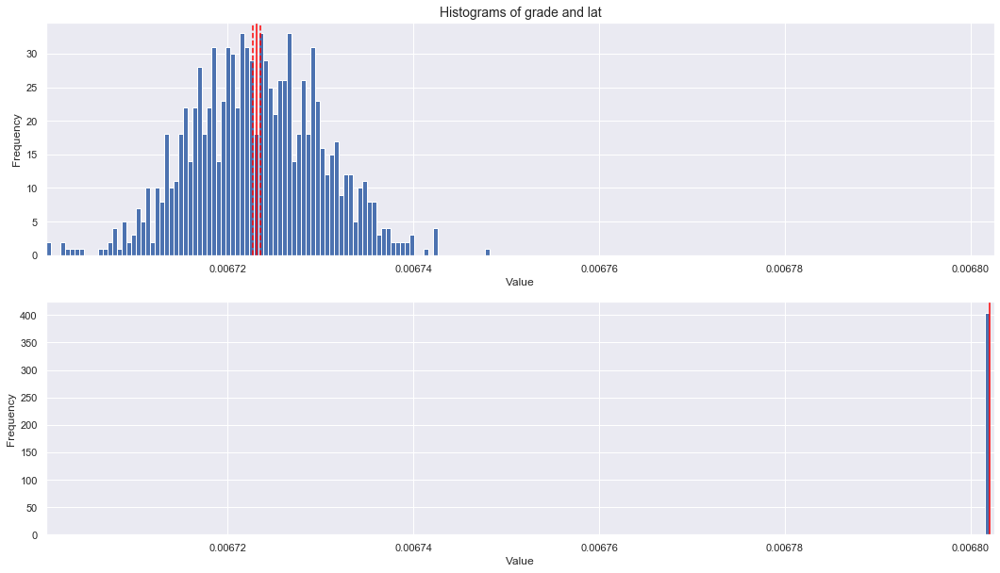


*** long
DegFreedom     999.126008
Difference      -0.000079
t-Statistic   -355.829779
PValue           0.000000
Low95CI         -0.000079
High95CI        -0.000079
dtype: float64


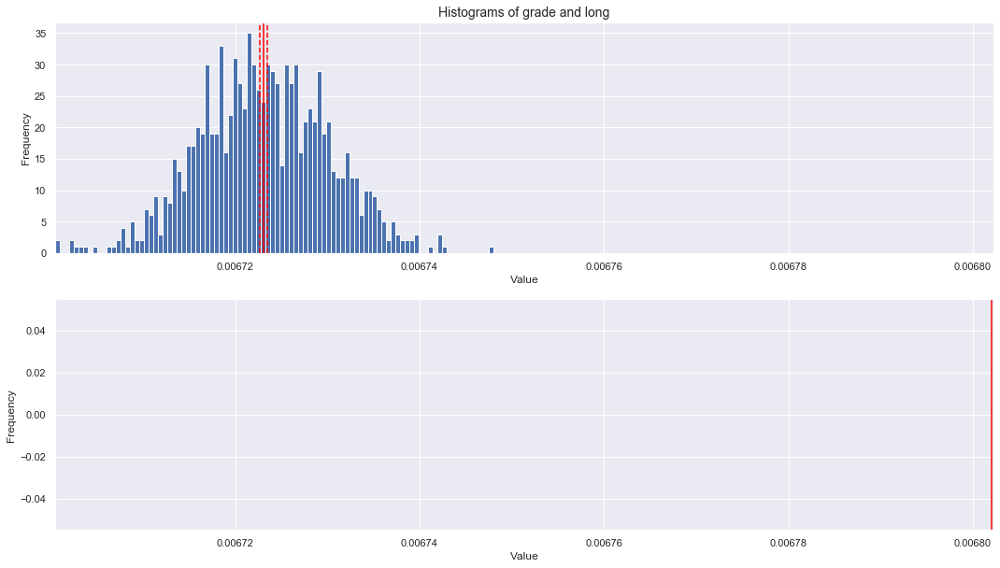


*** sqft_living15
DegFreedom     1431.483073
Difference        0.000294
t-Statistic     569.510125
PValue            0.000000
Low95CI           0.000293
High95CI          0.000295
dtype: float64


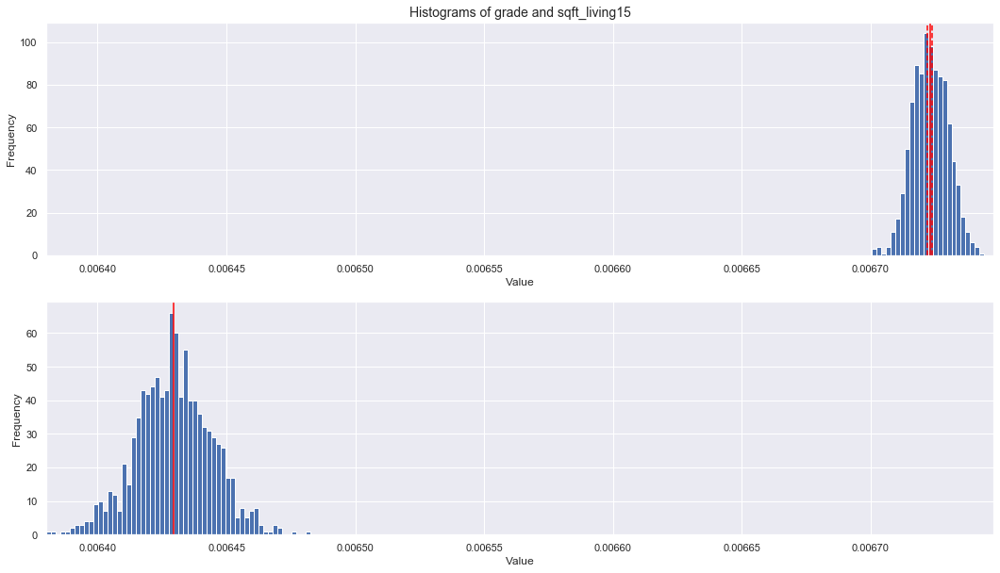


*** sqft_lot15
DegFreedom     1059.466958
Difference        0.003841
t-Statistic    2966.490650
PValue            0.000000
Low95CI           0.003839
High95CI          0.003844
dtype: float64


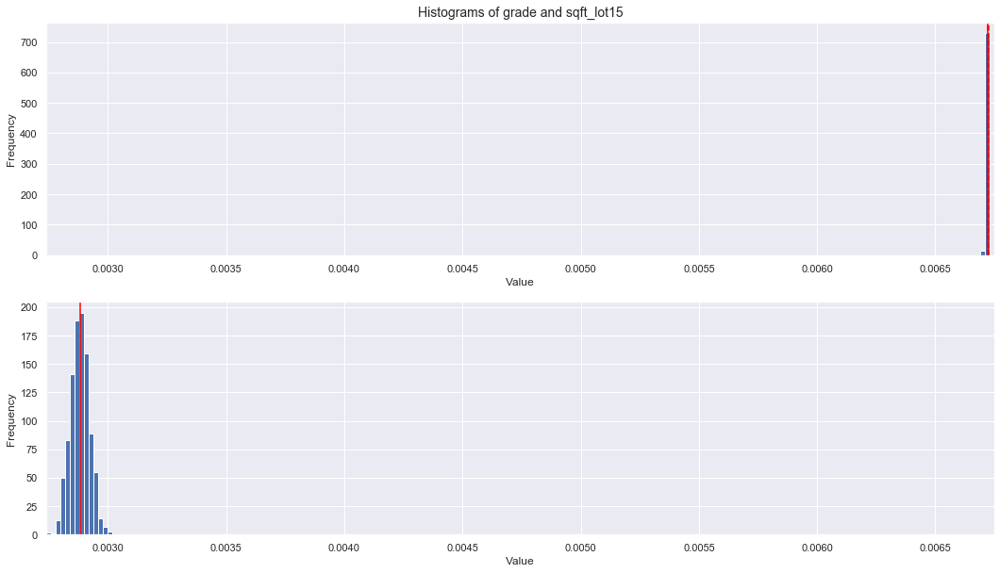

In [44]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['grade', item]
    helperBS_tTest(bs_means, features)

### Feature: sqft_above


*** price
DegFreedom     1832.923359
Difference        0.000548
t-Statistic     533.643538
PValue            0.000000
Low95CI           0.000546
High95CI          0.000550
dtype: float64


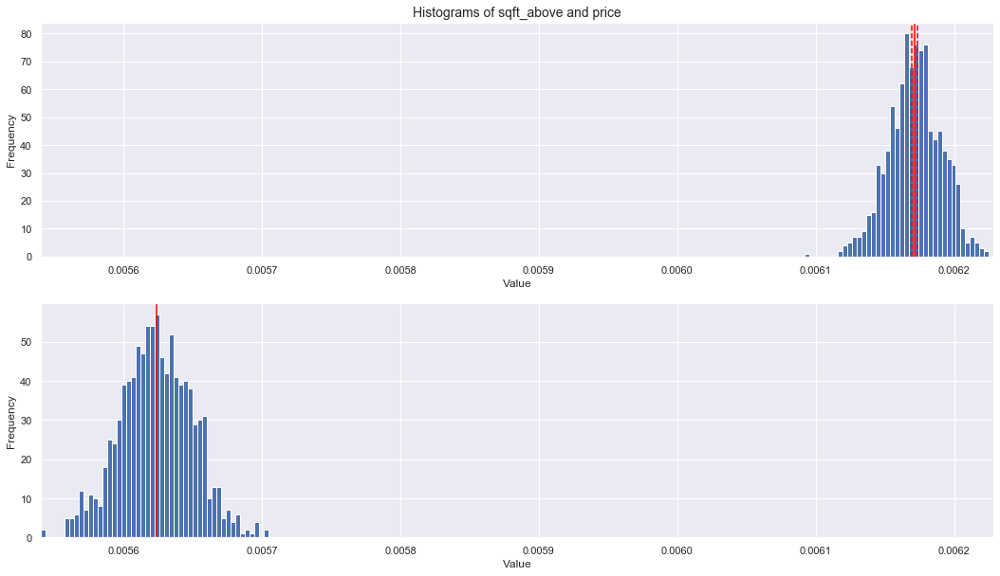


*** log_price
DegFreedom     1018.029426
Difference       -0.000625
t-Statistic   -1023.967471
PValue            0.000000
Low95CI          -0.000626
High95CI         -0.000624
dtype: float64


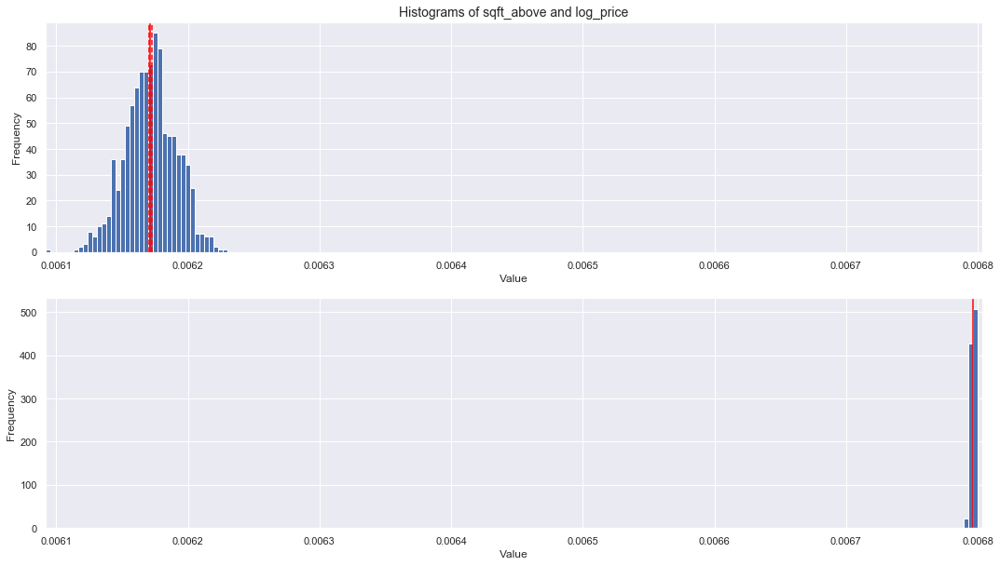


*** bedrooms
DegFreedom     1692.584941
Difference       -0.000385
t-Statistic    -534.825834
PValue            0.000000
Low95CI          -0.000386
High95CI         -0.000383
dtype: float64


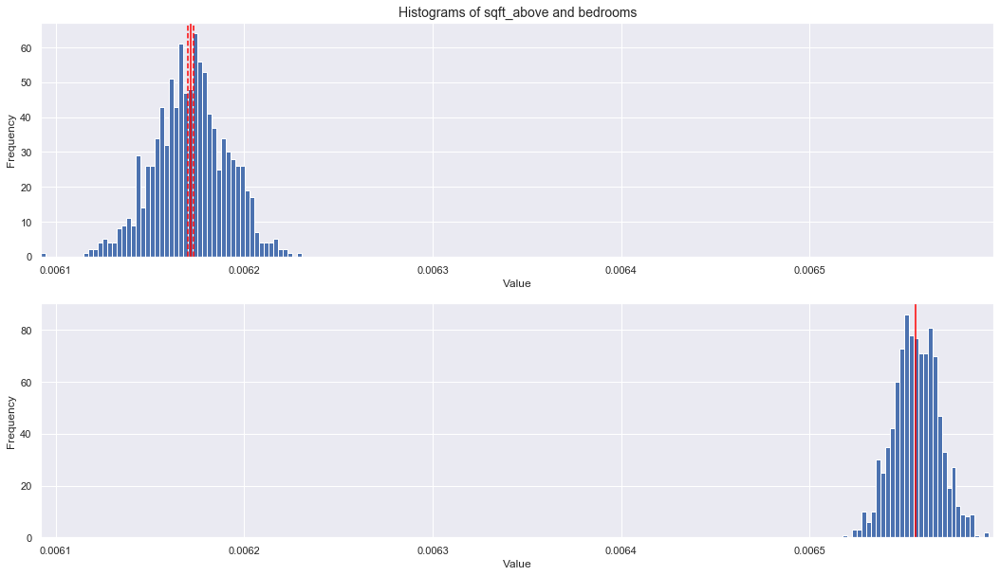


*** bathrooms
DegFreedom     1909.094773
Difference       -0.000219
t-Statistic    -281.165360
PValue            0.000000
Low95CI          -0.000221
High95CI         -0.000218
dtype: float64


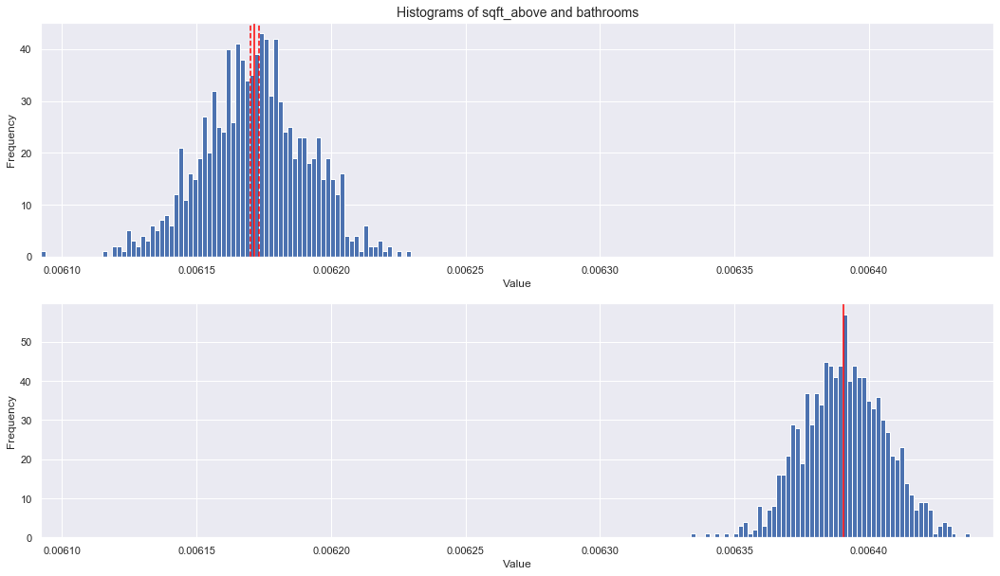


*** sqft_living
DegFreedom     1992.263291
Difference       -0.000050
t-Statistic     -59.896073
PValue            0.000000
Low95CI          -0.000052
High95CI         -0.000048
dtype: float64


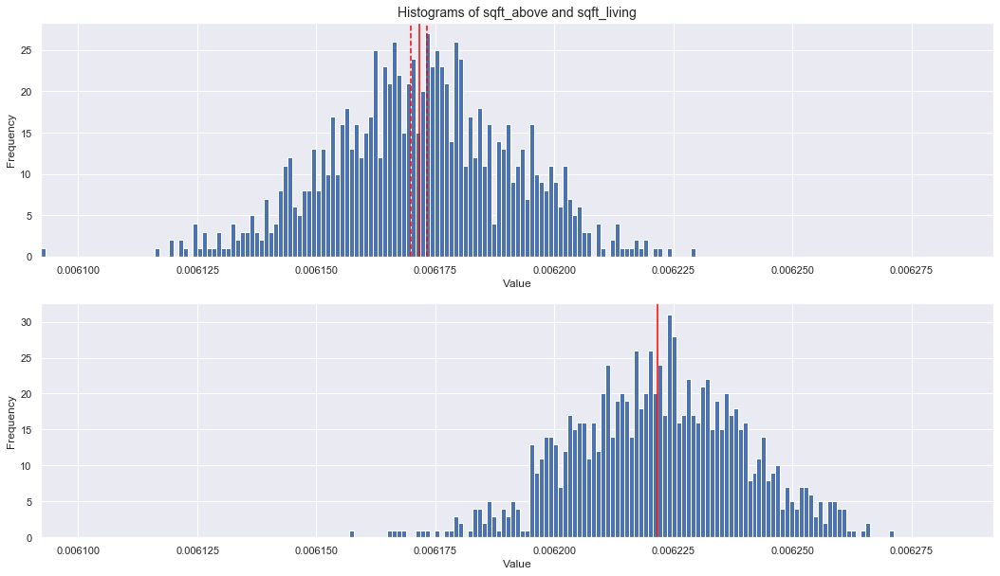


*** sqft_lot
DegFreedom     1382.205503
Difference        0.003839
t-Statistic    2577.310679
PValue            0.000000
Low95CI           0.003836
High95CI          0.003842
dtype: float64


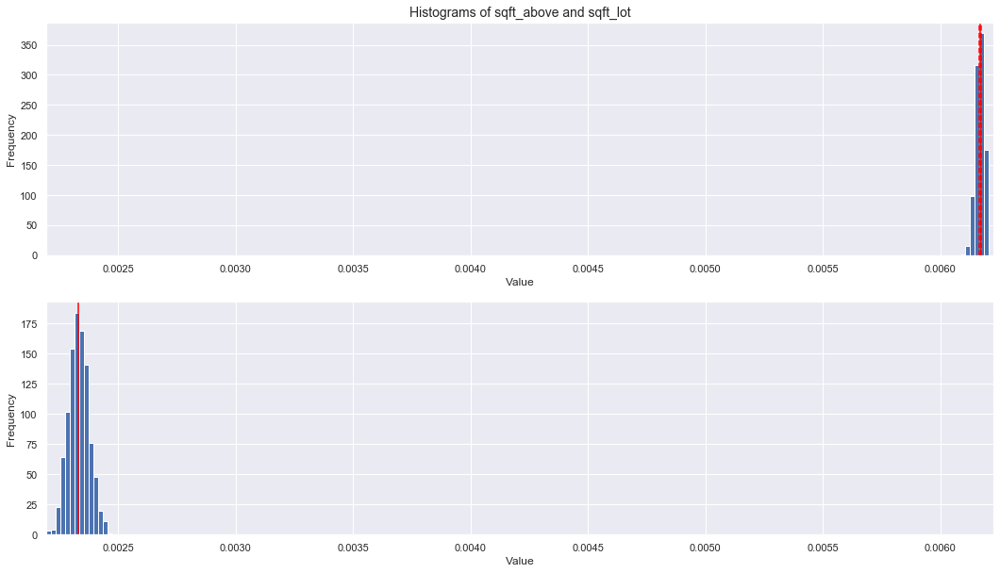


*** floors
DegFreedom     1913.010176
Difference       -0.000226
t-Statistic    -289.445226
PValue            0.000000
Low95CI          -0.000227
High95CI         -0.000224
dtype: float64


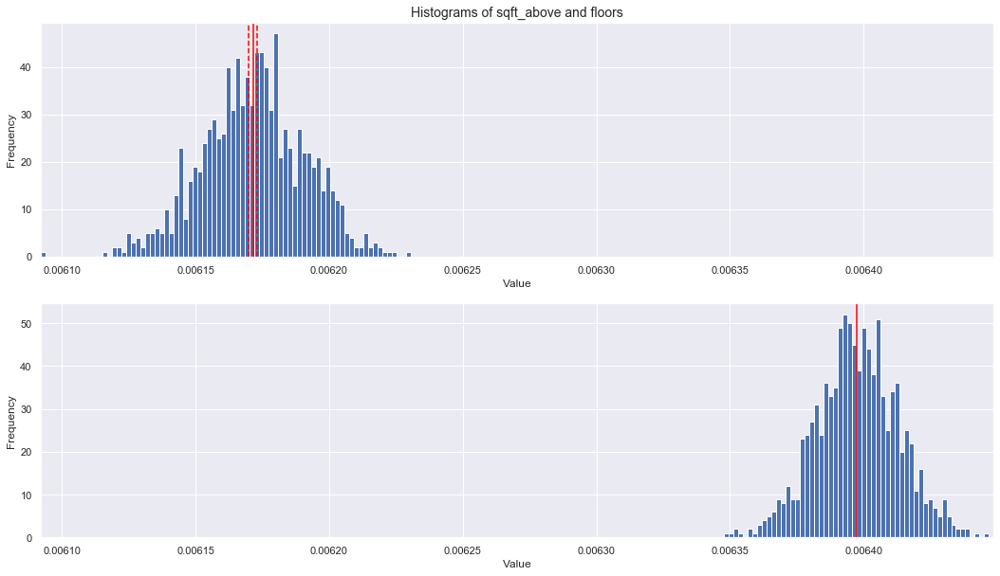


*** waterfront
DegFreedom     1334.675997
Difference        0.005581
t-Statistic    3529.290931
PValue            0.000000
Low95CI           0.005578
High95CI          0.005584
dtype: float64


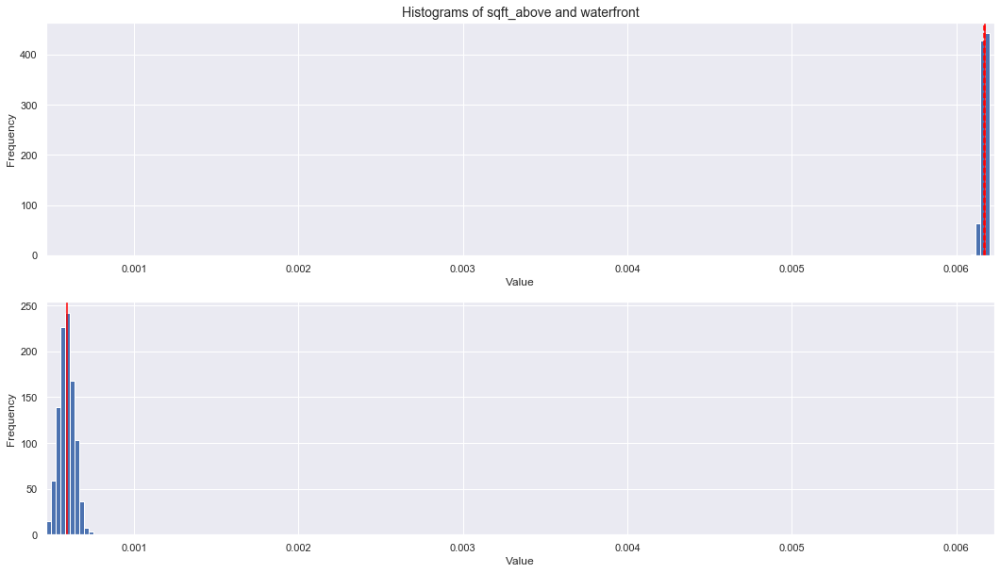


*** view
DegFreedom     1371.521912
Difference        0.004182
t-Statistic    2772.164229
PValue            0.000000
Low95CI           0.004179
High95CI          0.004185
dtype: float64


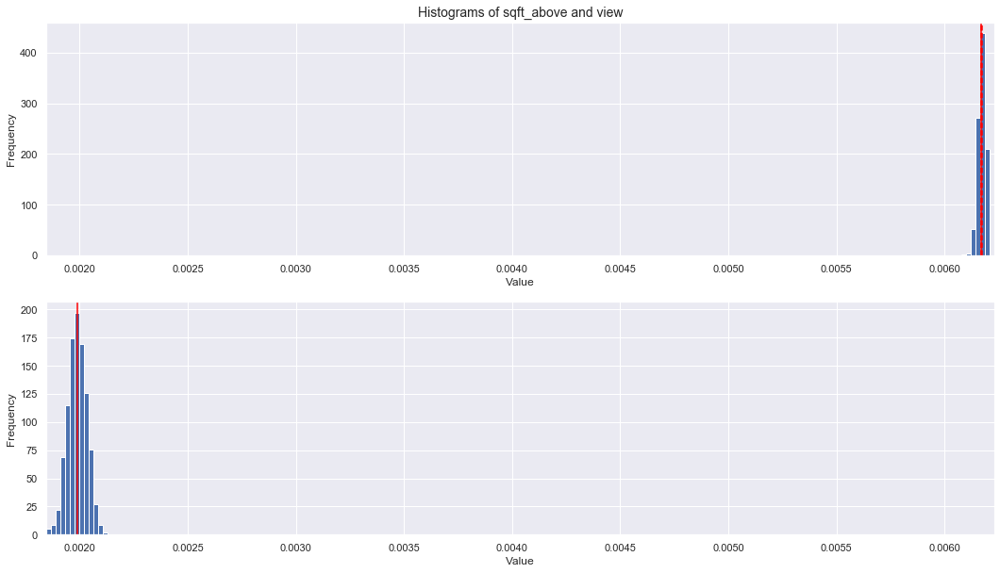


*** condition
DegFreedom     1376.859803
Difference       -0.000510
t-Statistic    -768.039272
PValue            0.000000
Low95CI          -0.000512
High95CI         -0.000509
dtype: float64


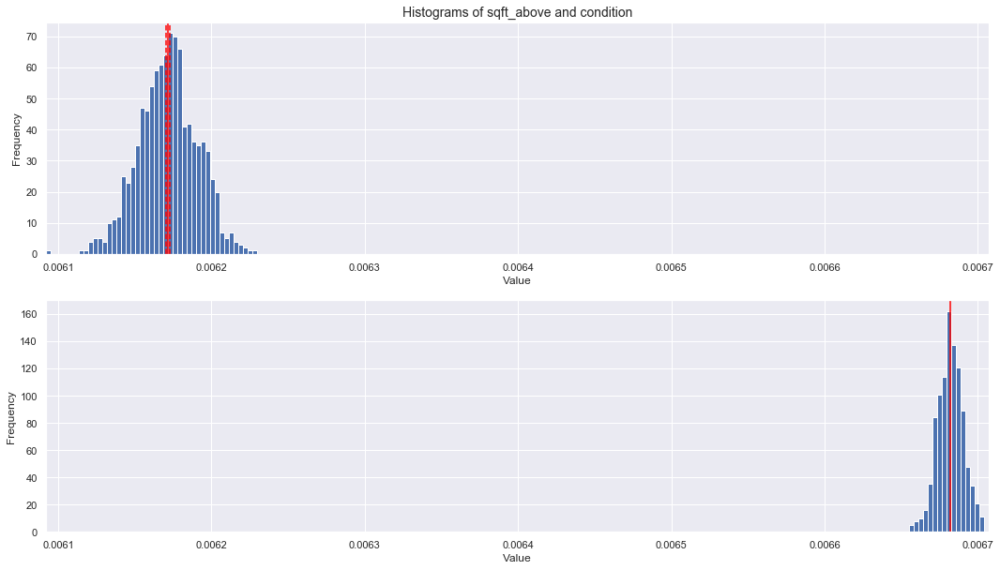


*** grade
DegFreedom     1261.275095
Difference       -0.000552
t-Statistic    -852.865148
PValue            0.000000
Low95CI          -0.000553
High95CI         -0.000550
dtype: float64


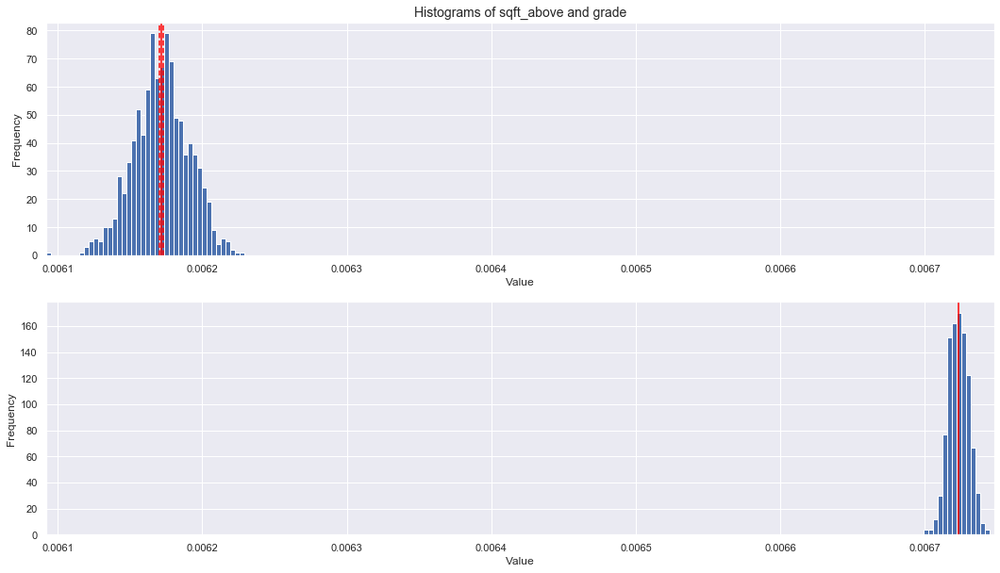


*** sqft_above

*** sqft_basement
DegFreedom     1479.396615
Difference        0.002430
t-Statistic    1806.542362
PValue            0.000000
Low95CI           0.002427
High95CI          0.002432
dtype: float64


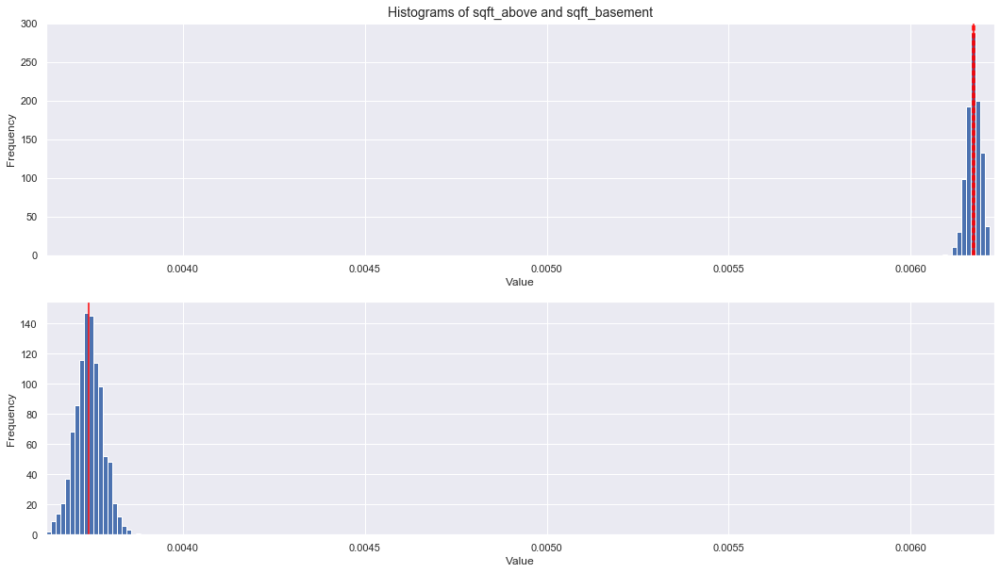


*** yr_built
DegFreedom     1001.545340
Difference       -0.000630
t-Statistic   -1036.209481
PValue            0.000000
Low95CI          -0.000631
High95CI         -0.000629
dtype: float64


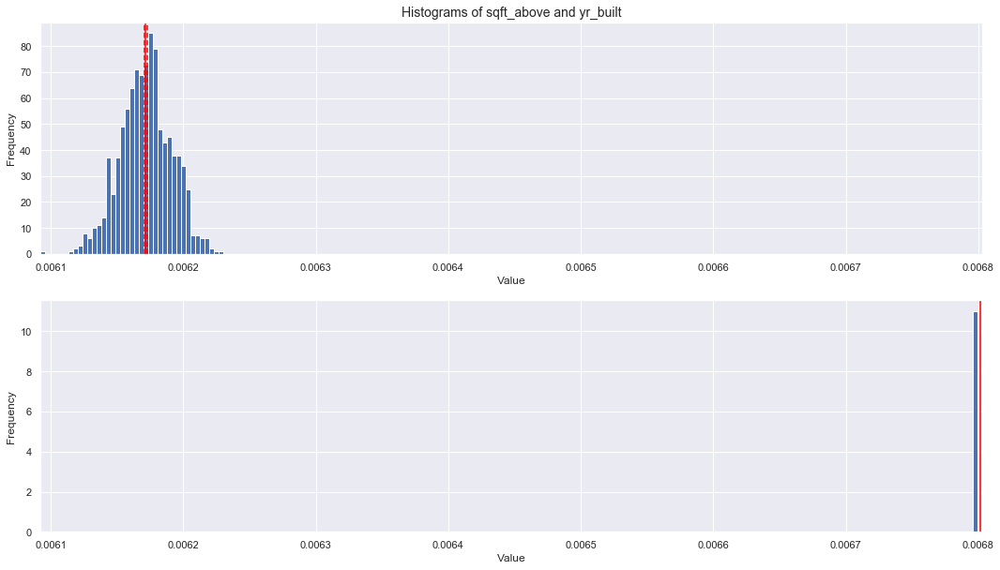


*** yr_renovated
DegFreedom     1332.532873
Difference        0.004774
t-Statistic    3009.817681
PValue            0.000000
Low95CI           0.004771
High95CI          0.004777
dtype: float64


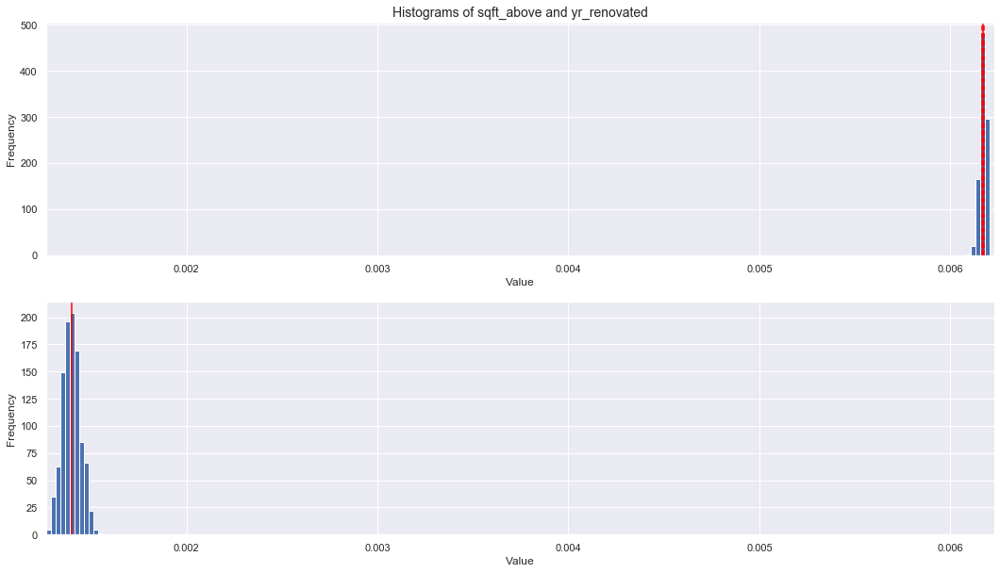


*** zipcode
DegFreedom      999.003379
Difference       -0.000631
t-Statistic   -1038.130438
PValue            0.000000
Low95CI          -0.000632
High95CI         -0.000629
dtype: float64


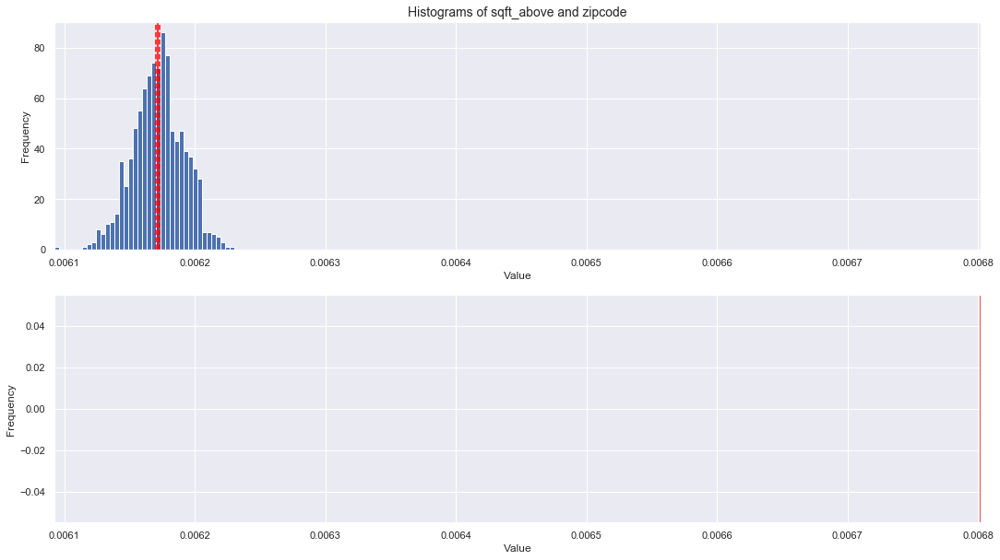


*** lat
DegFreedom      999.102126
Difference       -0.000631
t-Statistic   -1038.053556
PValue            0.000000
Low95CI          -0.000632
High95CI         -0.000629
dtype: float64


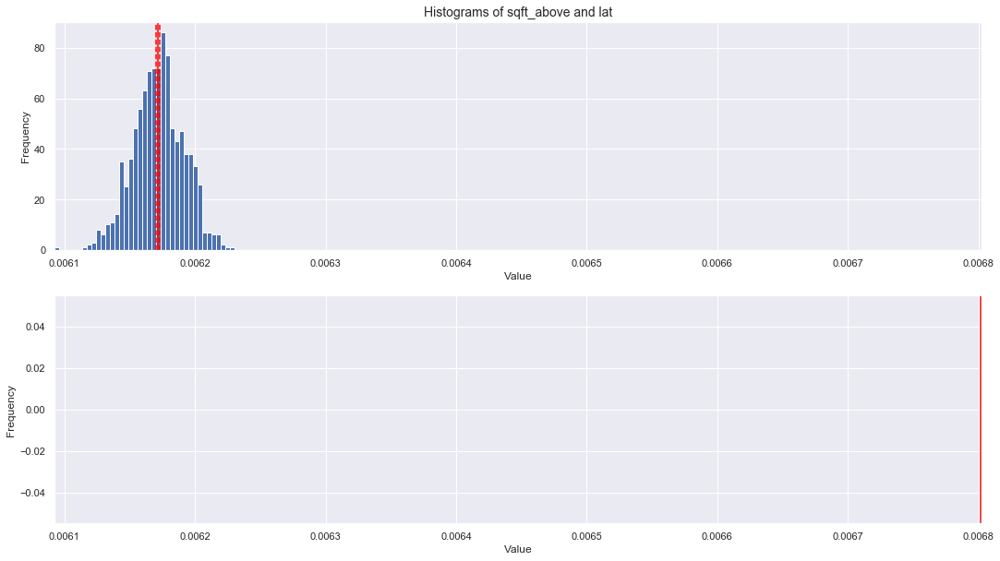


*** long
DegFreedom      999.016836
Difference       -0.000631
t-Statistic   -1038.122229
PValue            0.000000
Low95CI          -0.000632
High95CI         -0.000629
dtype: float64


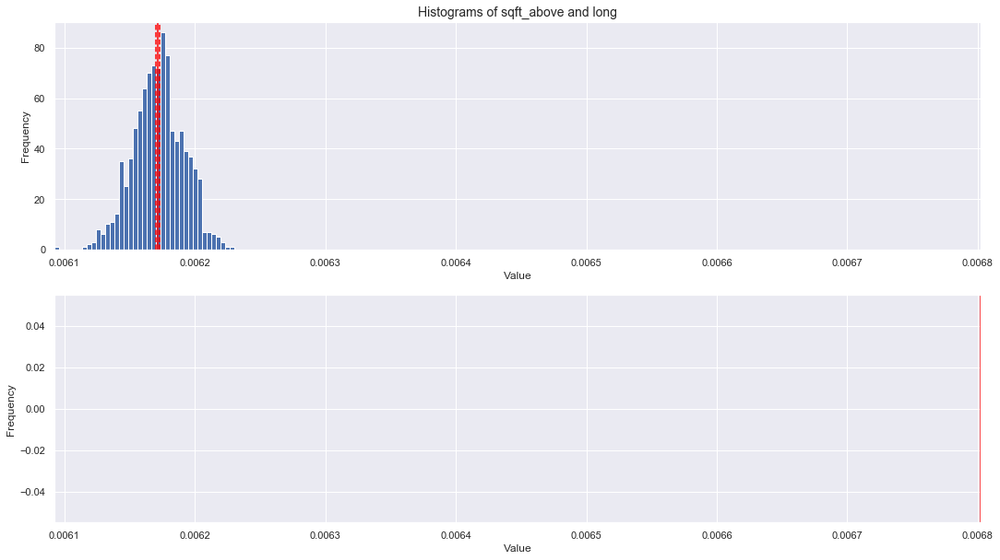


*** sqft_living15
DegFreedom     1871.157374
Difference       -0.000258
t-Statistic    -337.109406
PValue            0.000000
Low95CI          -0.000259
High95CI         -0.000256
dtype: float64


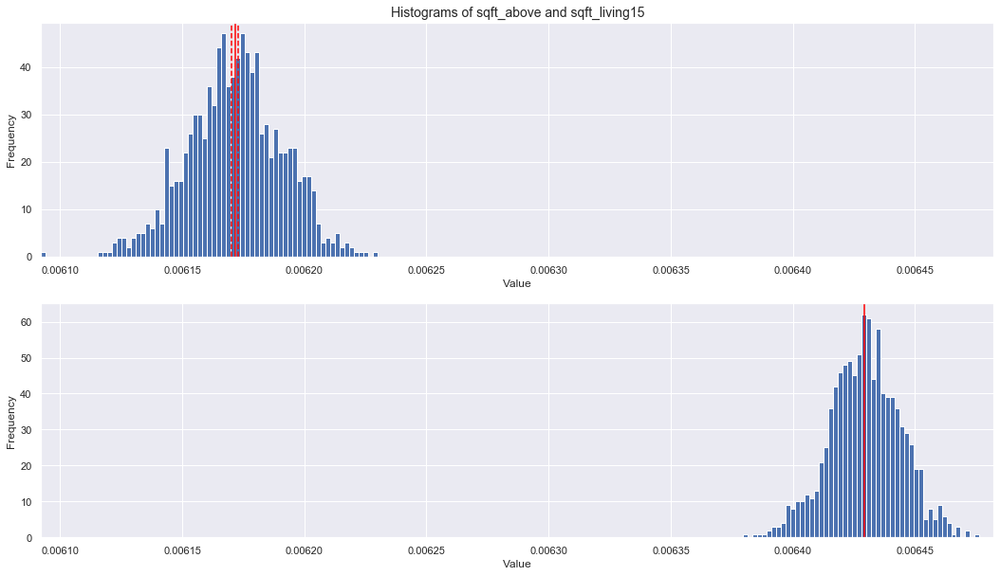


*** sqft_lot15
DegFreedom     1429.826922
Difference        0.003290
t-Statistic    2328.268161
PValue            0.000000
Low95CI           0.003287
High95CI          0.003292
dtype: float64


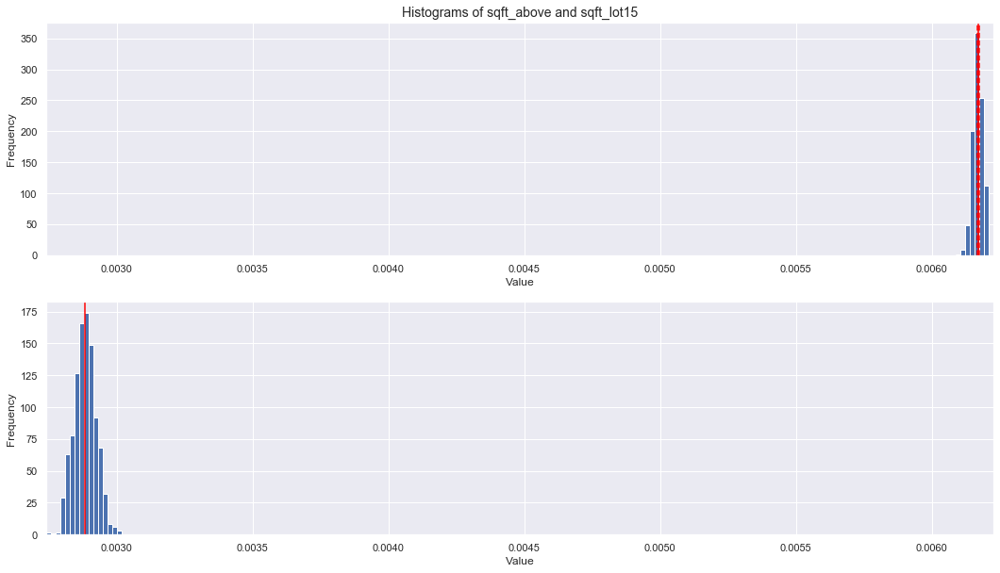

In [45]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_above', item]
    helperBS_tTest(bs_means, features)

### Feature: sqft_living


*** price
DegFreedom     1781.997611
Difference        0.000598
t-Statistic     593.126575
PValue            0.000000
Low95CI           0.000596
High95CI          0.000600
dtype: float64


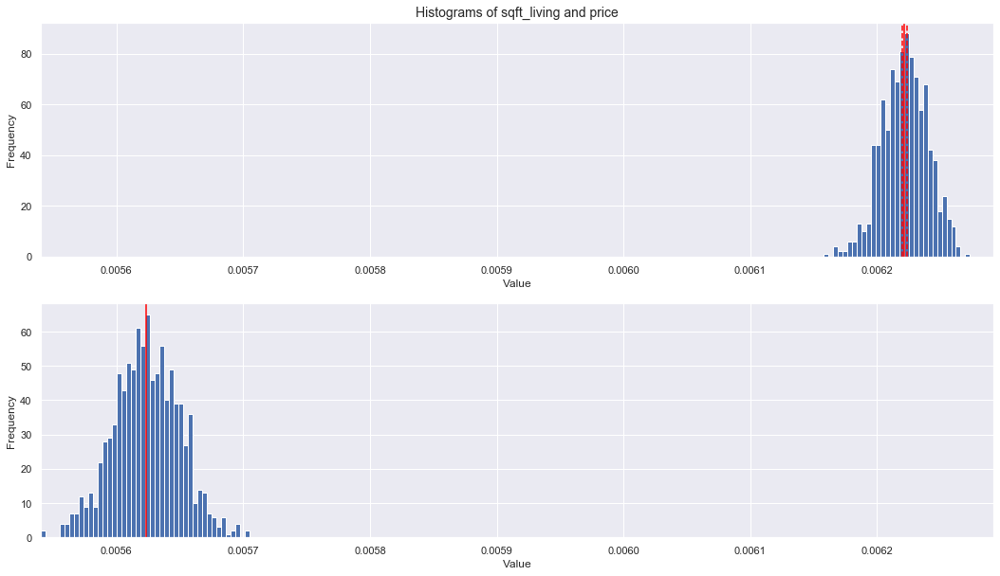


*** log_price
DegFreedom     1020.187043
Difference       -0.000575
t-Statistic    -993.277414
PValue            0.000000
Low95CI          -0.000576
High95CI         -0.000574
dtype: float64


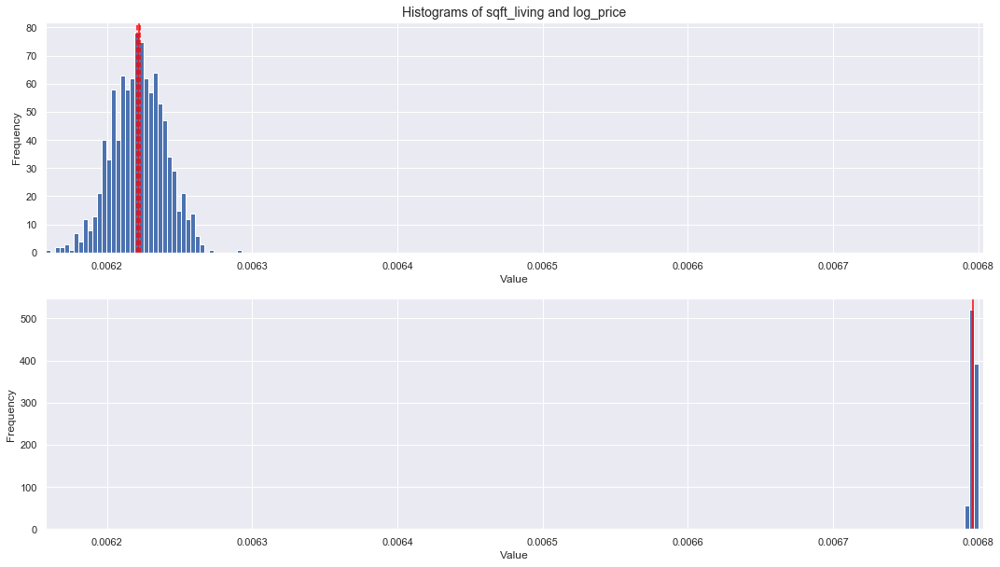


*** bedrooms
DegFreedom     1746.146023
Difference       -0.000335
t-Statistic    -483.030291
PValue            0.000000
Low95CI          -0.000336
High95CI         -0.000333
dtype: float64


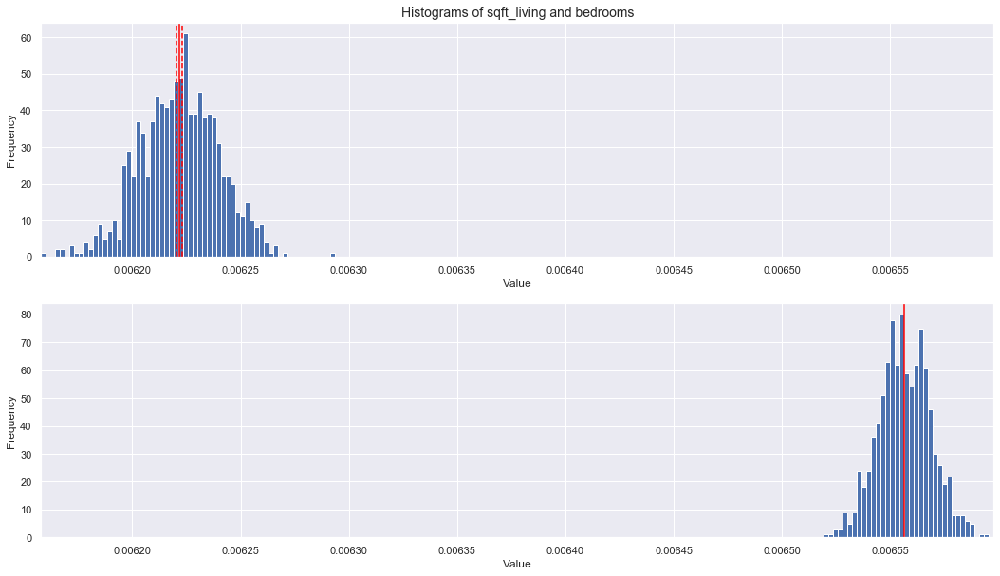


*** bathrooms
DegFreedom     1945.645735
Difference       -0.000169
t-Statistic    -223.867165
PValue            0.000000
Low95CI          -0.000170
High95CI         -0.000167
dtype: float64


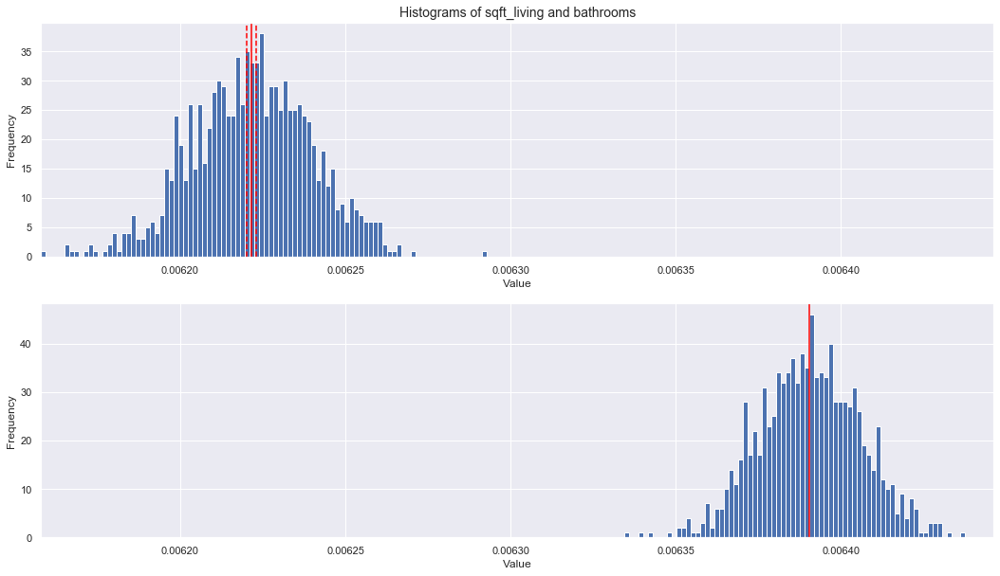


*** sqft_living

*** sqft_lot
DegFreedom     1345.737726
Difference        0.003889
t-Statistic    2633.352290
PValue            0.000000
Low95CI           0.003886
High95CI          0.003892
dtype: float64


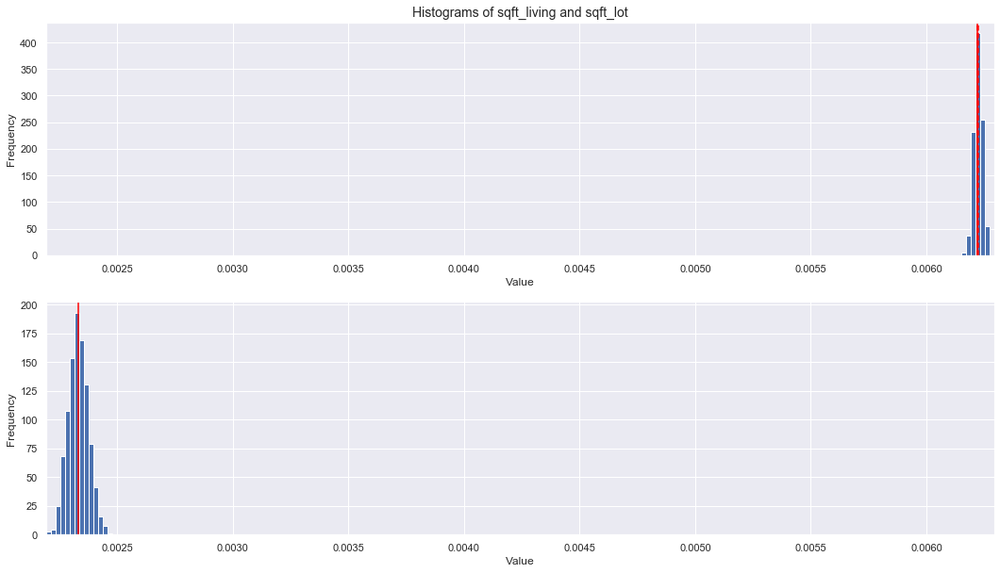


*** floors
DegFreedom     1948.785856
Difference       -0.000176
t-Statistic    -232.521554
PValue            0.000000
Low95CI          -0.000177
High95CI         -0.000174
dtype: float64


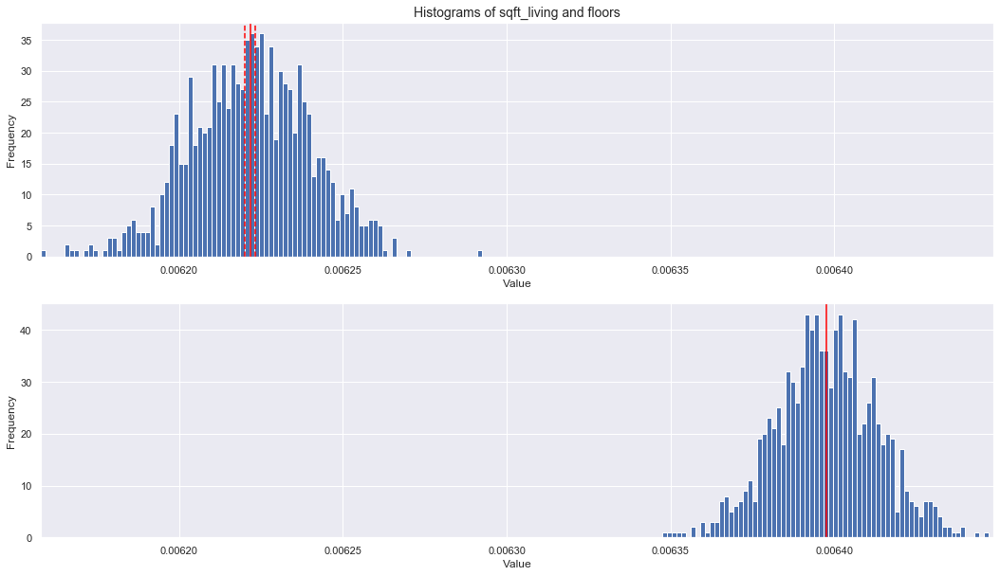


*** waterfront
DegFreedom     1302.189430
Difference        0.005631
t-Statistic    3588.041941
PValue            0.000000
Low95CI           0.005628
High95CI          0.005635
dtype: float64


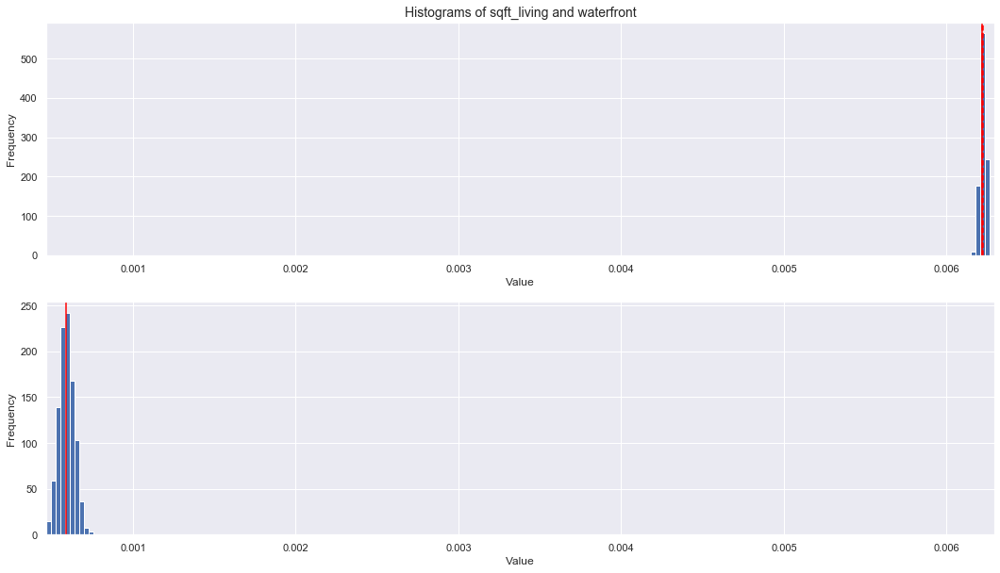


*** view
DegFreedom     1335.927455
Difference        0.004233
t-Statistic    2828.832440
PValue            0.000000
Low95CI           0.004230
High95CI          0.004235
dtype: float64


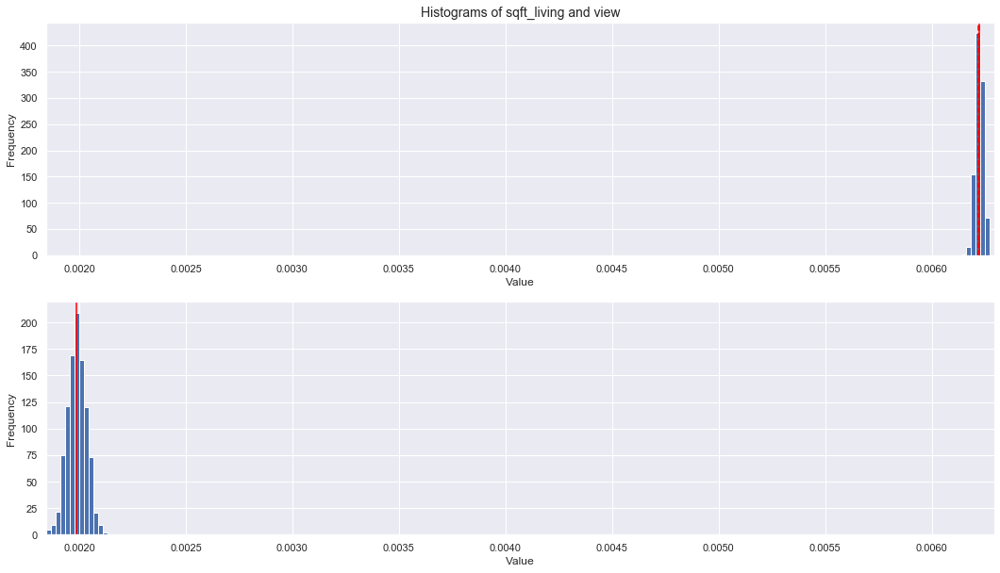


*** condition
DegFreedom     1415.999359
Difference       -0.000460
t-Statistic    -724.104390
PValue            0.000000
Low95CI          -0.000461
High95CI         -0.000459
dtype: float64


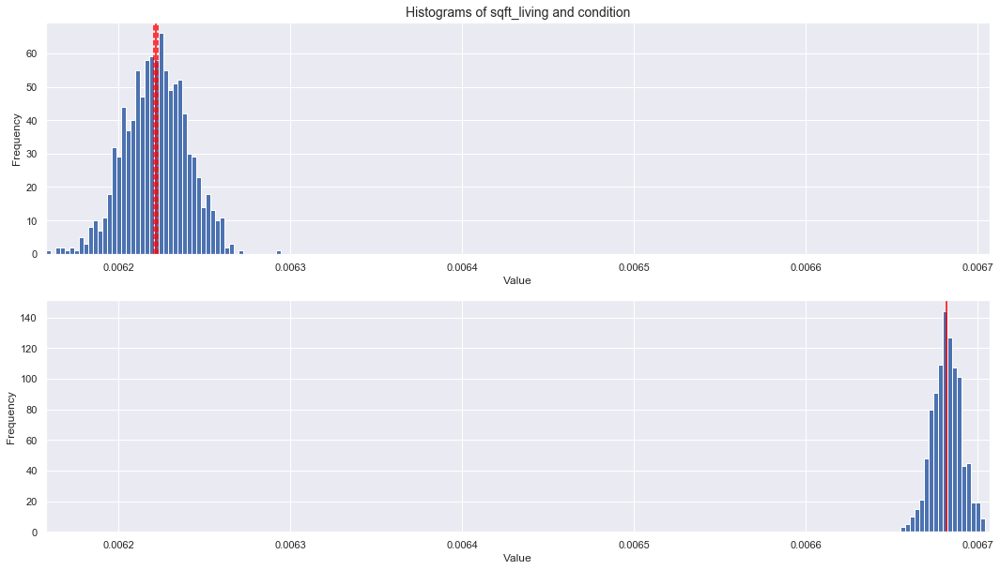


*** grade
DegFreedom     1289.796599
Difference       -0.000501
t-Statistic    -812.731553
PValue            0.000000
Low95CI          -0.000503
High95CI         -0.000500
dtype: float64


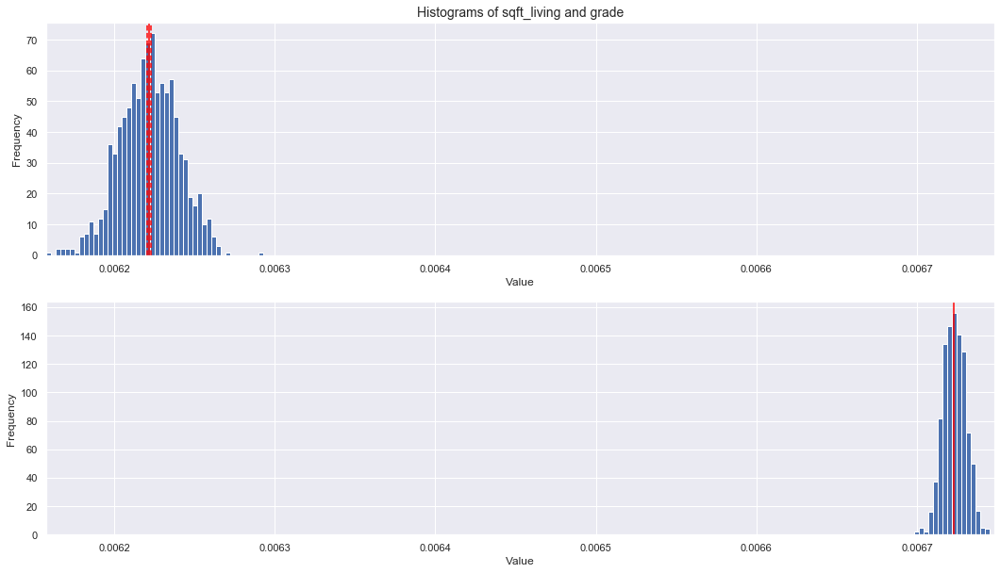


*** sqft_above
DegFreedom     1992.263291
Difference        0.000050
t-Statistic      59.896073
PValue            0.000000
Low95CI           0.000048
High95CI          0.000052
dtype: float64


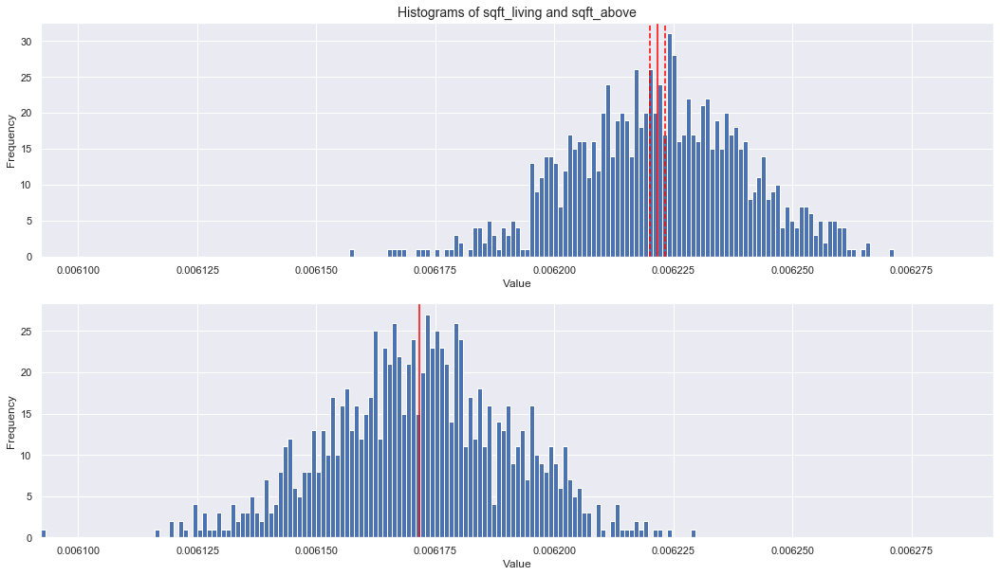


*** sqft_basement
DegFreedom     1435.666310
Difference        0.002480
t-Statistic    1863.266813
PValue            0.000000
Low95CI           0.002477
High95CI          0.002482
dtype: float64


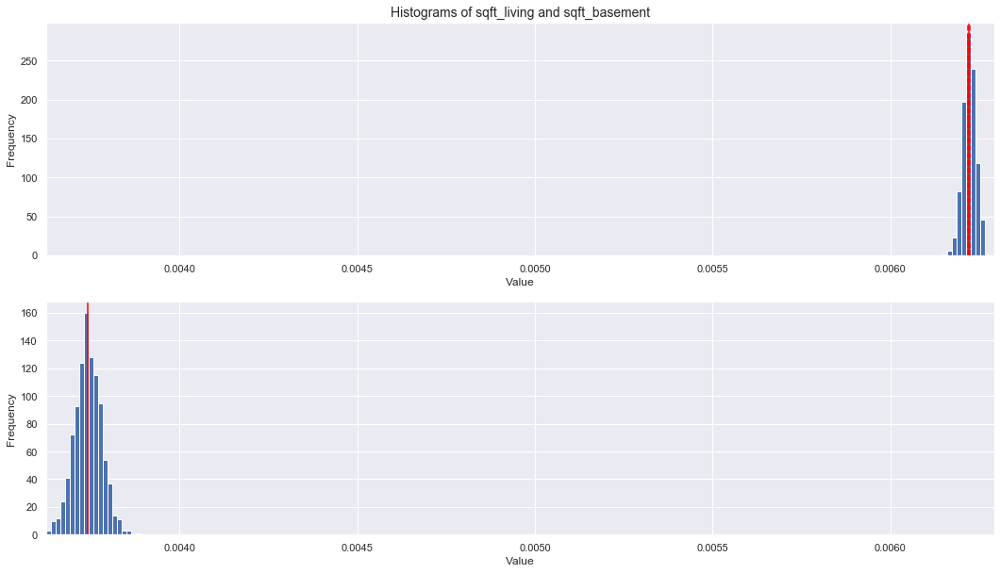


*** yr_built
DegFreedom     1001.833999
Difference       -0.000580
t-Statistic   -1006.297283
PValue            0.000000
Low95CI          -0.000581
High95CI         -0.000579
dtype: float64


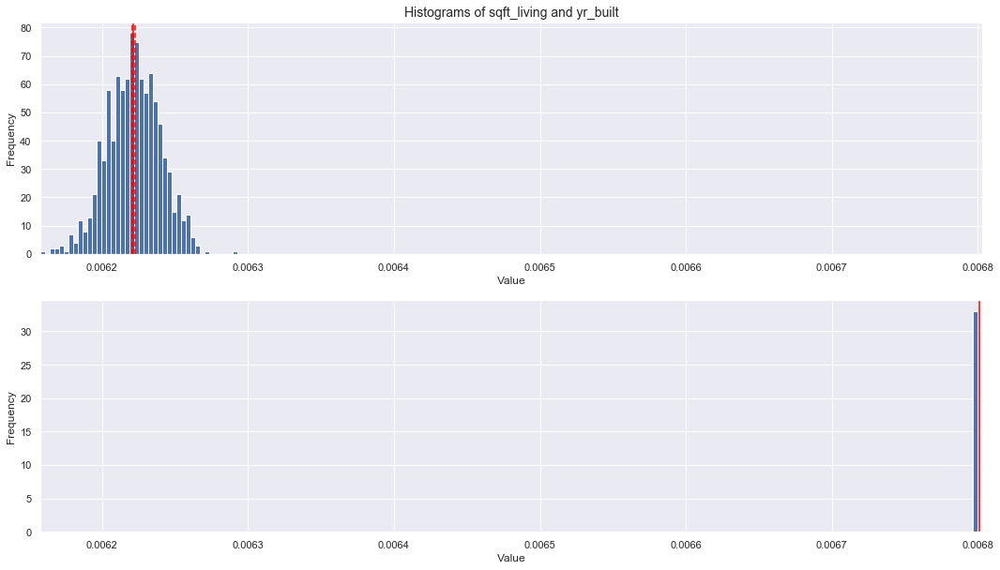


*** yr_renovated
DegFreedom     1300.231385
Difference        0.004824
t-Statistic    3064.394073
PValue            0.000000
Low95CI           0.004821
High95CI          0.004827
dtype: float64


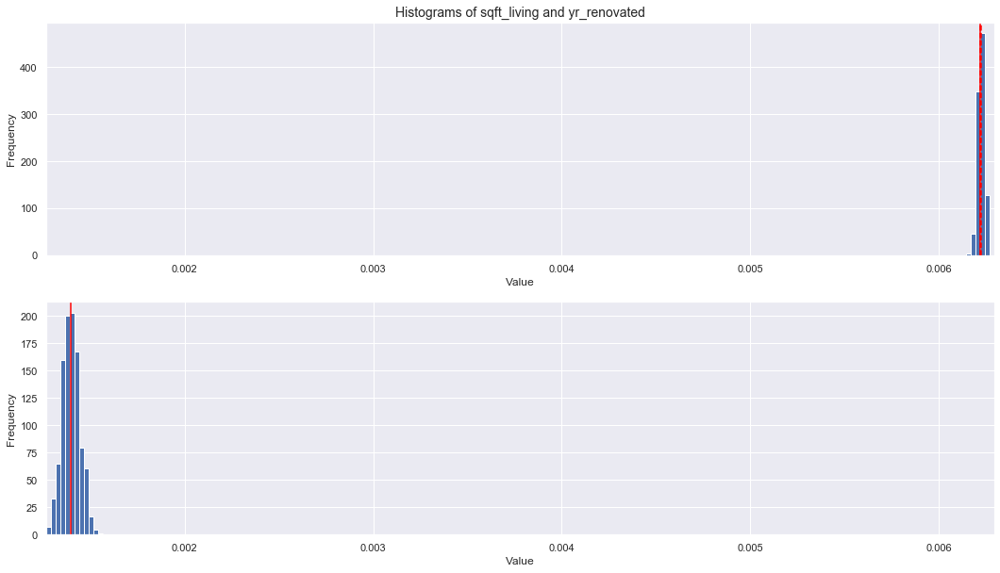


*** zipcode
DegFreedom      999.003762
Difference       -0.000580
t-Statistic   -1008.341404
PValue            0.000000
Low95CI          -0.000582
High95CI         -0.000579
dtype: float64


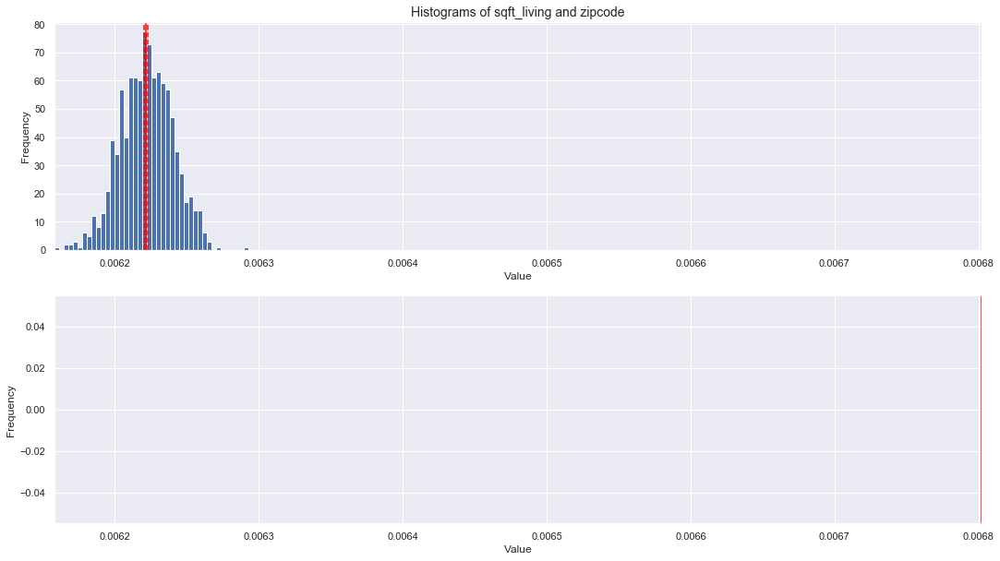


*** lat
DegFreedom      999.113707
Difference       -0.000580
t-Statistic   -1008.259606
PValue            0.000000
Low95CI          -0.000582
High95CI         -0.000579
dtype: float64


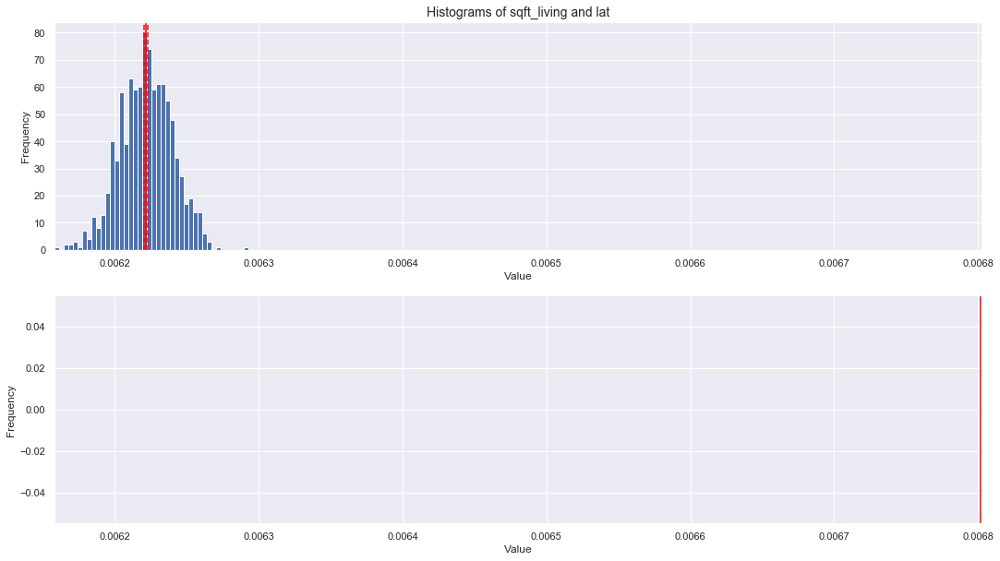


*** long
DegFreedom      999.018746
Difference       -0.000580
t-Statistic   -1008.332650
PValue            0.000000
Low95CI          -0.000582
High95CI         -0.000579
dtype: float64


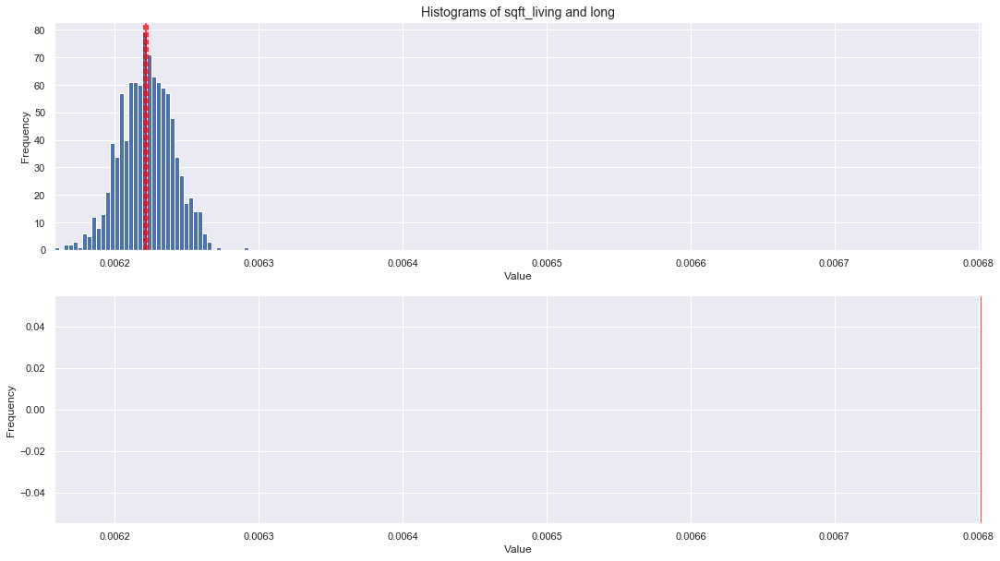


*** sqft_living15
DegFreedom     1913.894571
Difference       -0.000208
t-Statistic    -280.761380
PValue            0.000000
Low95CI          -0.000209
High95CI         -0.000206
dtype: float64


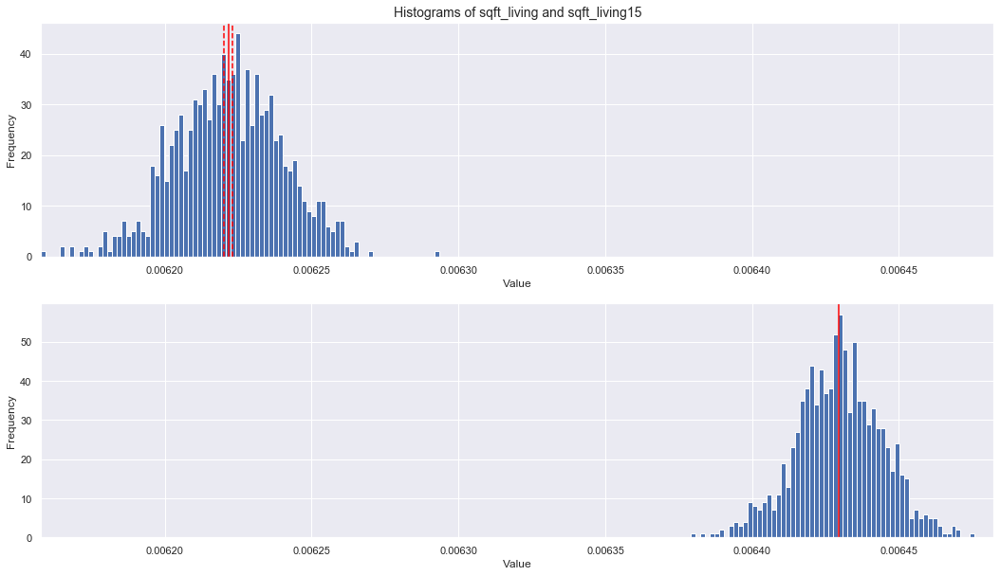


*** sqft_lot15
DegFreedom     1389.636642
Difference        0.003340
t-Statistic    2386.310731
PValue            0.000000
Low95CI           0.003337
High95CI          0.003342
dtype: float64


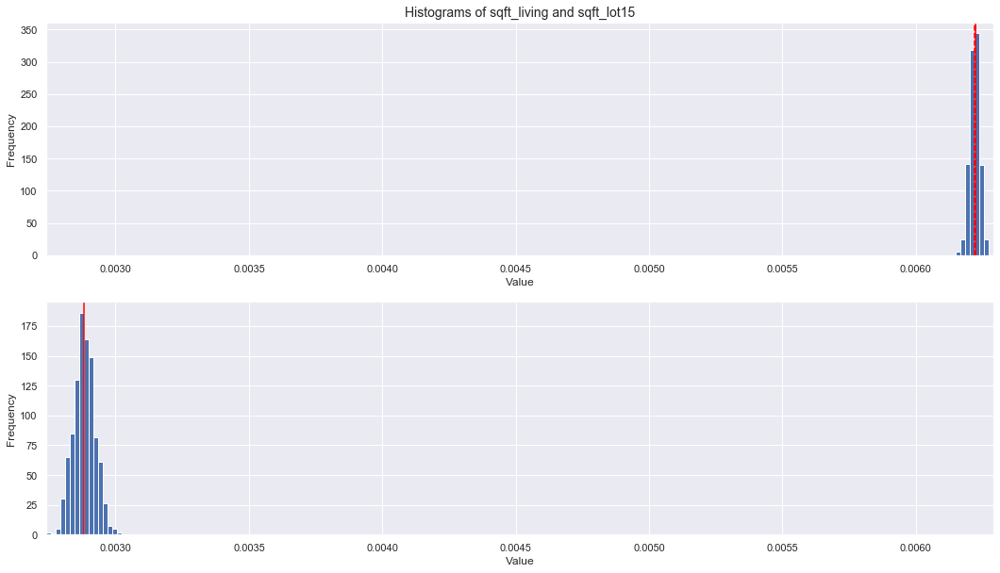

In [46]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_living', item]
    helperBS_tTest(bs_means, features)

### Feature: bathrooms


*** price
DegFreedom     1618.123990
Difference        0.000767
t-Statistic     798.194463
PValue            0.000000
Low95CI           0.000765
High95CI          0.000769
dtype: float64


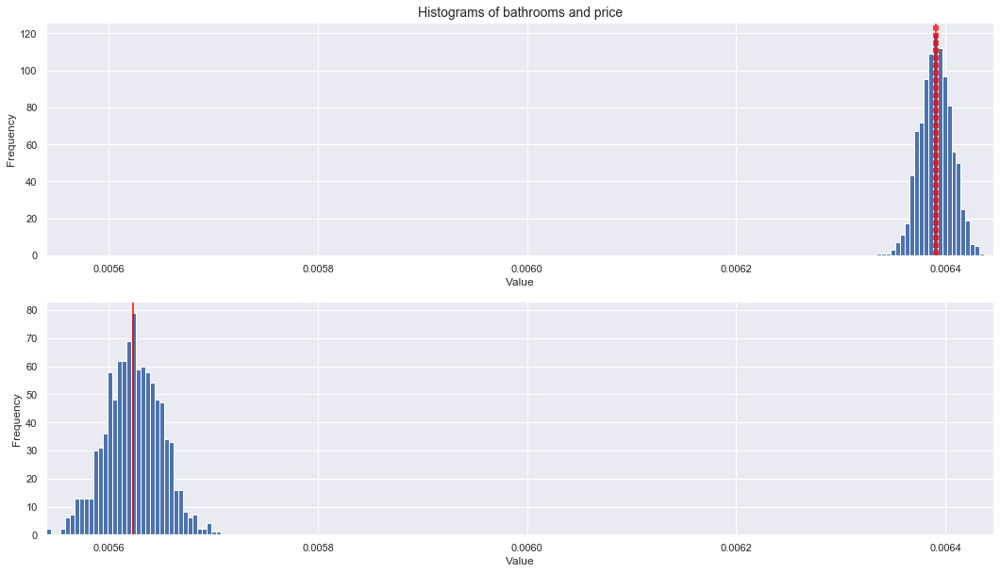


*** log_price
DegFreedom     1028.498844
Difference       -0.000406
t-Statistic    -825.944443
PValue            0.000000
Low95CI          -0.000407
High95CI         -0.000405
dtype: float64


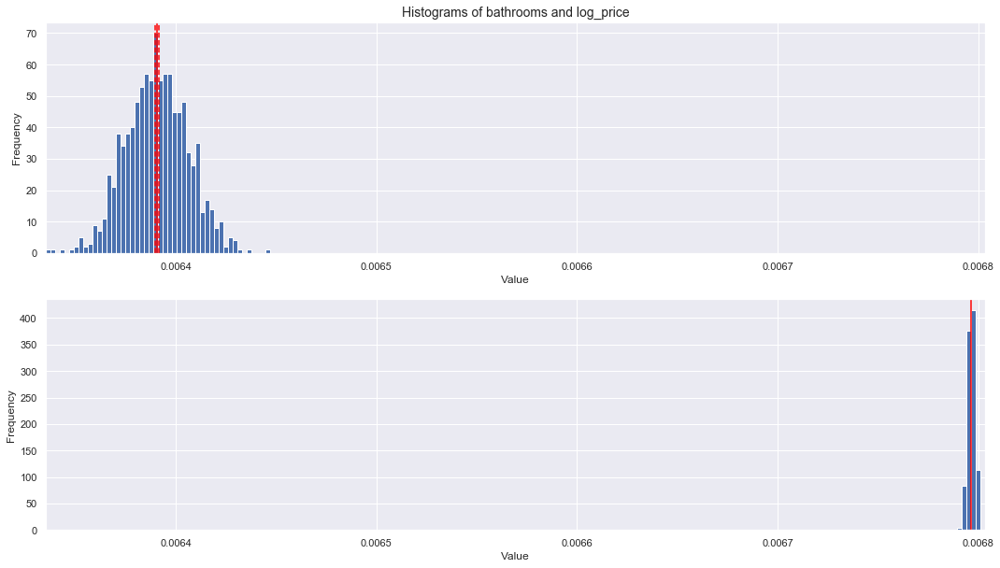


*** bedrooms
DegFreedom     1897.551931
Difference       -0.000166
t-Statistic    -266.619179
PValue            0.000000
Low95CI          -0.000167
High95CI         -0.000165
dtype: float64


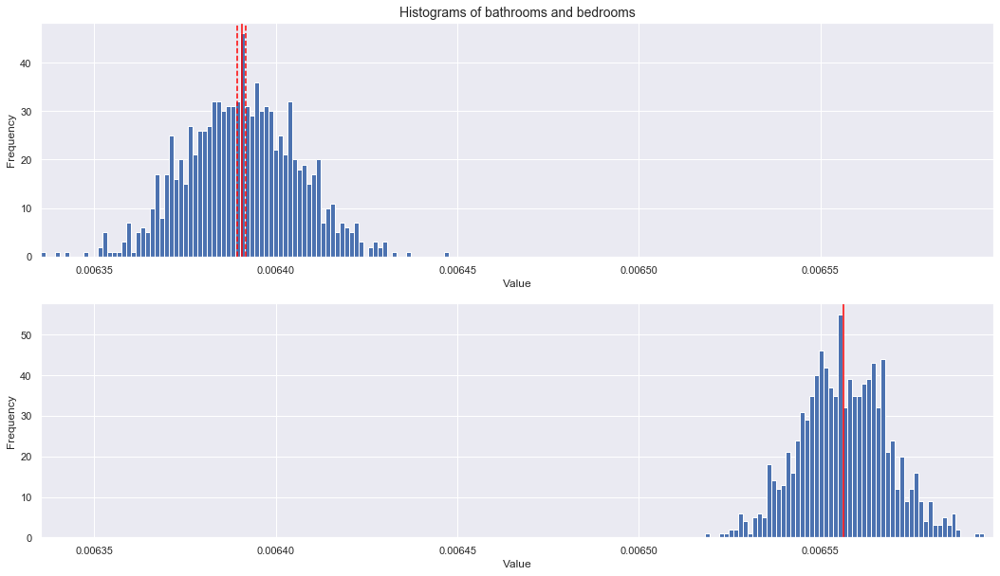


*** bathrooms

*** sqft_living
DegFreedom     1945.645735
Difference        0.000169
t-Statistic     223.867165
PValue            0.000000
Low95CI           0.000167
High95CI          0.000170
dtype: float64


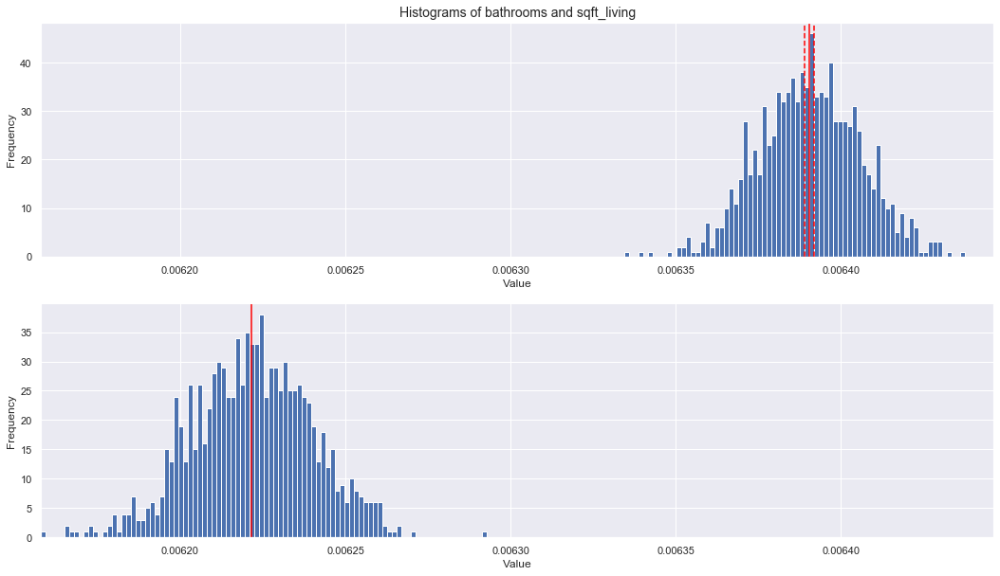


*** sqft_lot
DegFreedom     1251.817588
Difference        0.004058
t-Statistic    2808.497432
PValue            0.000000
Low95CI           0.004055
High95CI          0.004061
dtype: float64


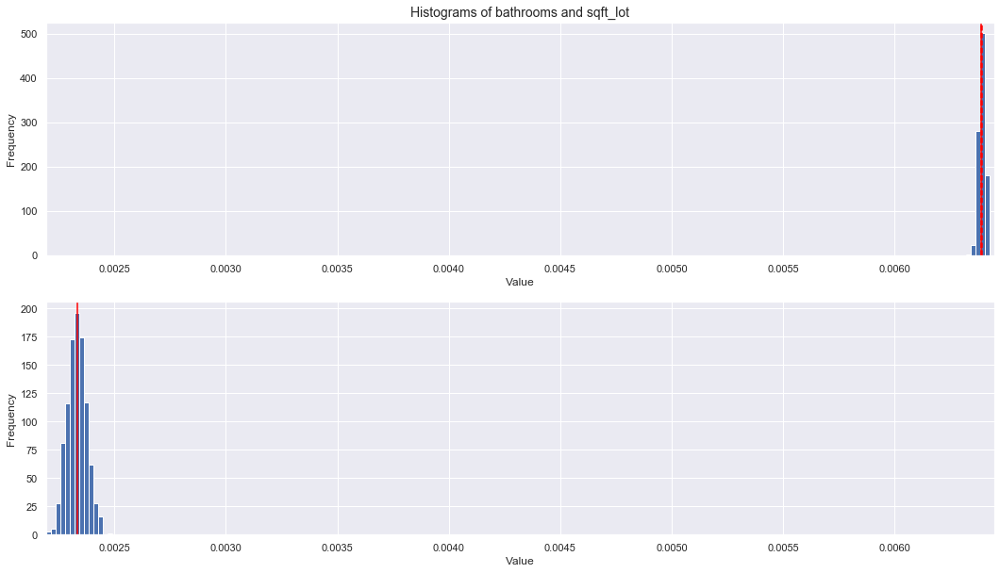


*** floors
DegFreedom     1.997945e+03
Difference    -6.917279e-06
t-Statistic   -1.000063e+01
PValue         5.210317e-23
Low95CI       -8.273777e-06
High95CI      -5.560780e-06
dtype: float64


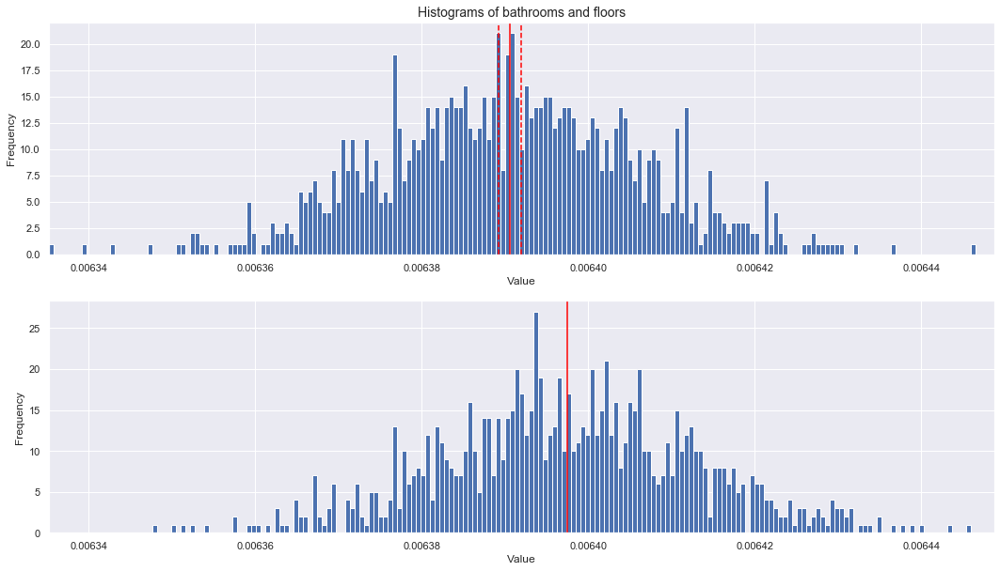


*** waterfront
DegFreedom     1219.252977
Difference        0.005800
t-Statistic    3767.770547
PValue            0.000000
Low95CI           0.005797
High95CI          0.005803
dtype: float64


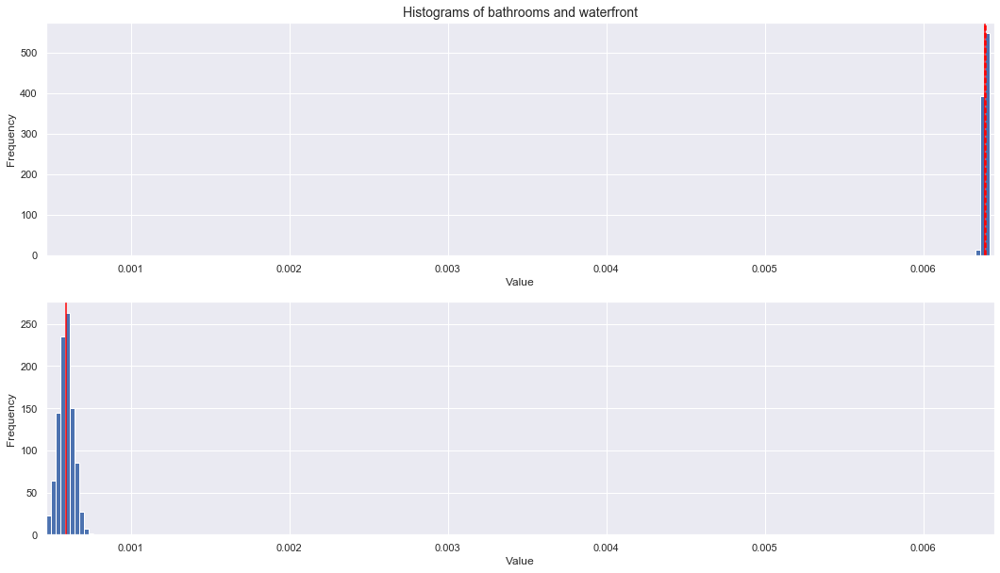


*** view
DegFreedom     1244.448832
Difference        0.004401
t-Statistic    3005.071652
PValue            0.000000
Low95CI           0.004399
High95CI          0.004404
dtype: float64


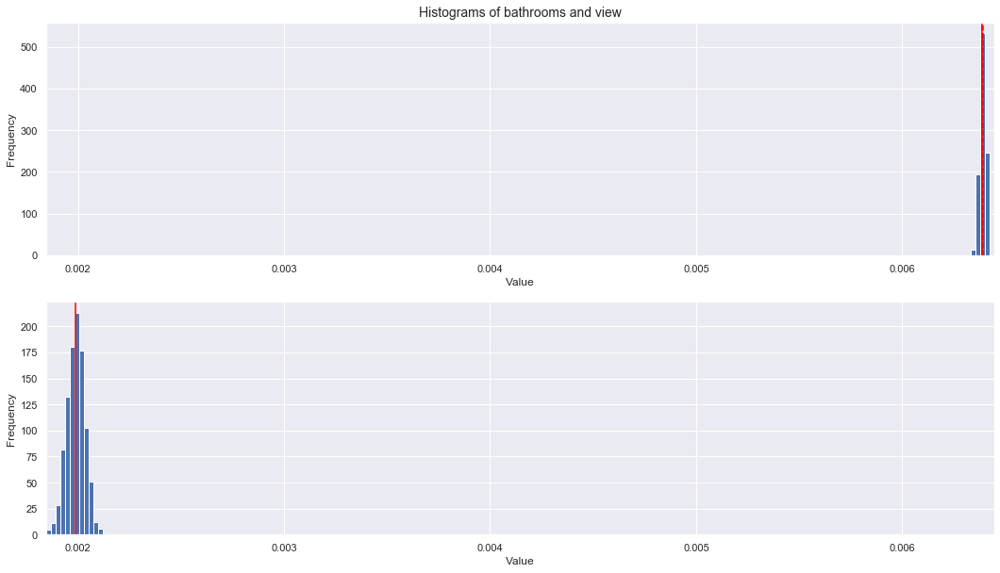


*** condition
DegFreedom     1555.790802
Difference       -0.000291
t-Statistic    -522.702443
PValue            0.000000
Low95CI          -0.000292
High95CI         -0.000290
dtype: float64


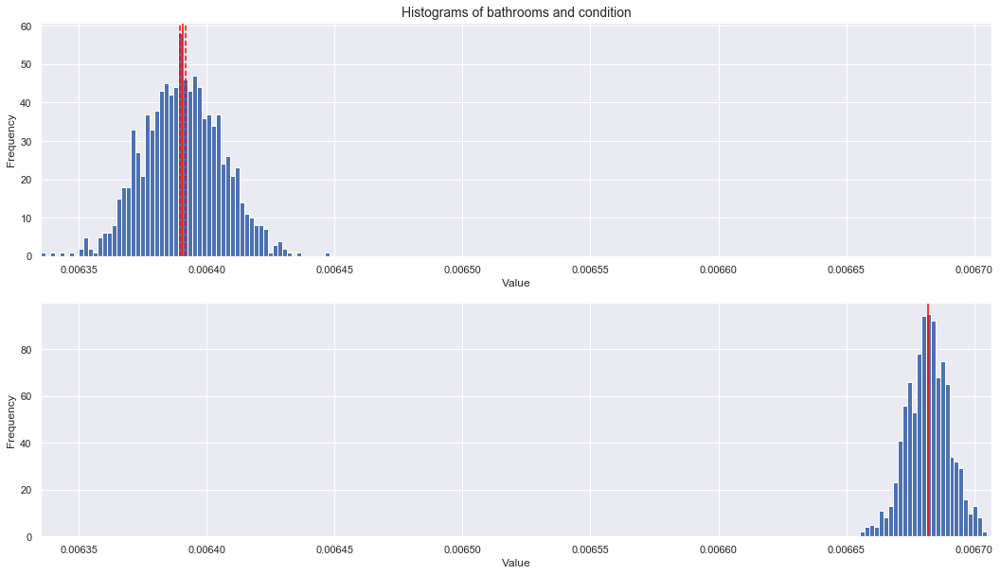


*** grade
DegFreedom     1395.852779
Difference       -0.000333
t-Statistic    -620.401693
PValue            0.000000
Low95CI          -0.000334
High95CI         -0.000331
dtype: float64


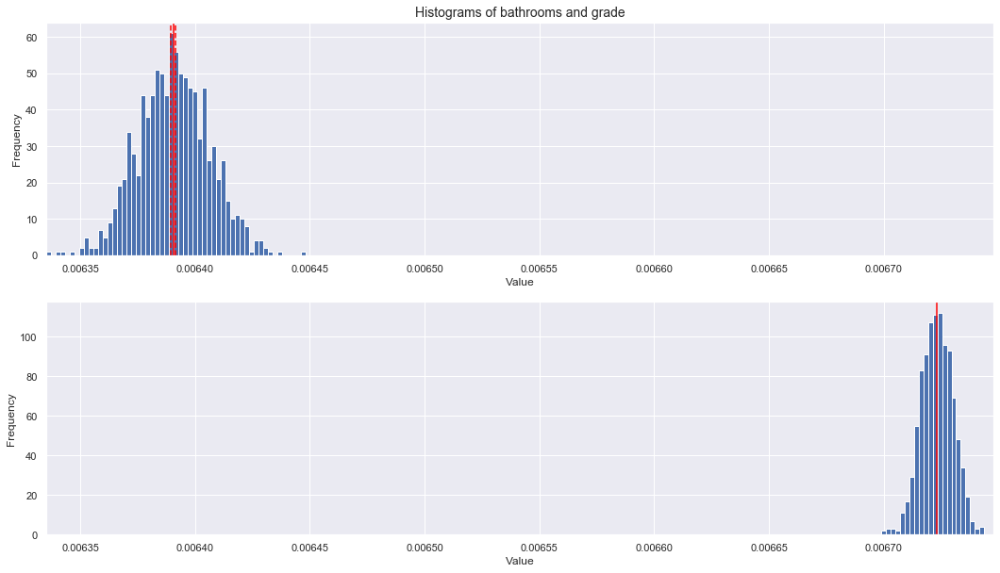


*** sqft_above
DegFreedom     1909.094773
Difference        0.000219
t-Statistic     281.165360
PValue            0.000000
Low95CI           0.000218
High95CI          0.000221
dtype: float64


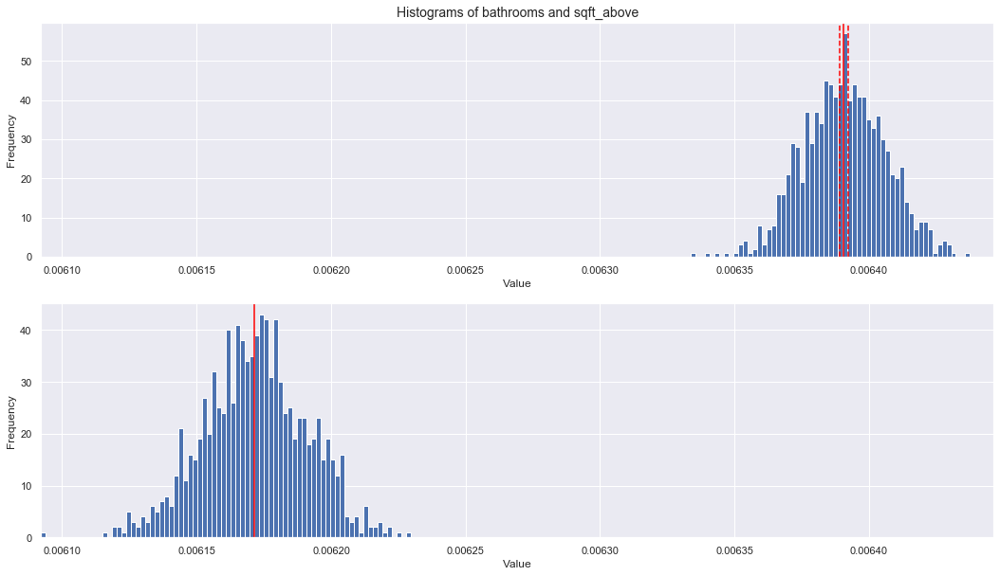


*** sqft_basement
DegFreedom     1320.423316
Difference        0.002649
t-Statistic    2044.824089
PValue            0.000000
Low95CI           0.002646
High95CI          0.002651
dtype: float64


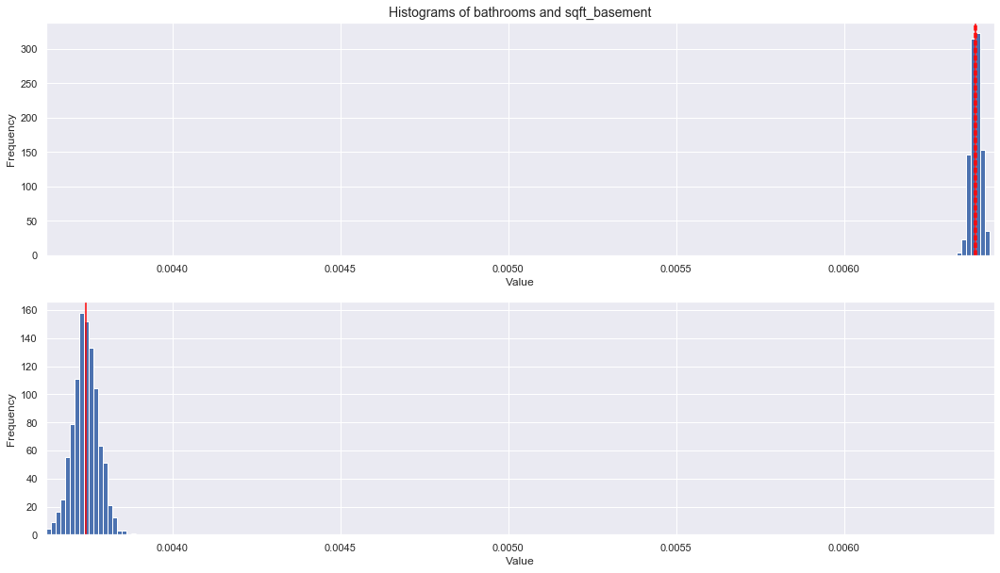


*** yr_built
DegFreedom     1002.946203
Difference       -0.000411
t-Statistic    -841.197107
PValue            0.000000
Low95CI          -0.000412
High95CI         -0.000410
dtype: float64


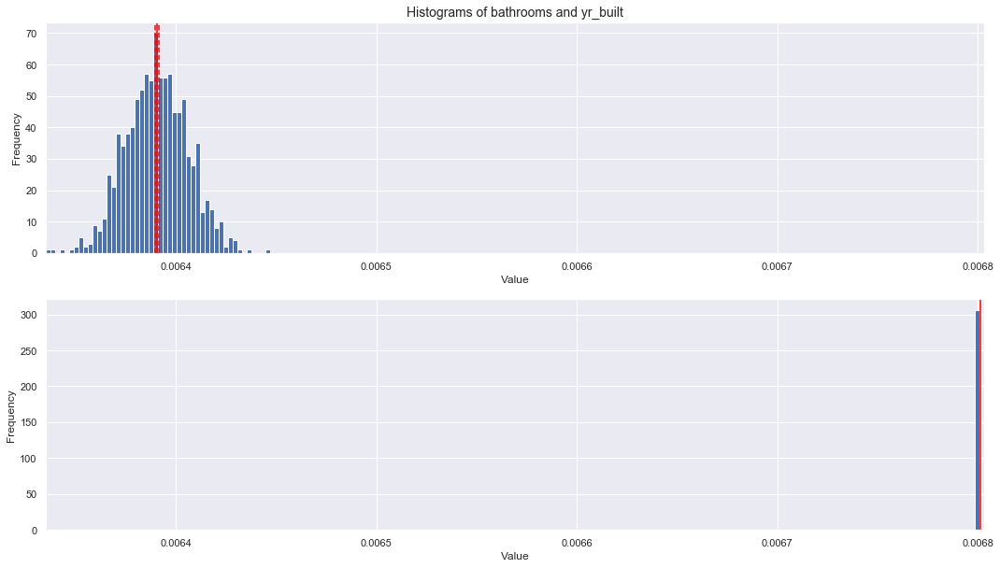


*** yr_renovated
DegFreedom     1217.797212
Difference        0.004993
t-Statistic    3233.209258
PValue            0.000000
Low95CI           0.004990
High95CI          0.004996
dtype: float64


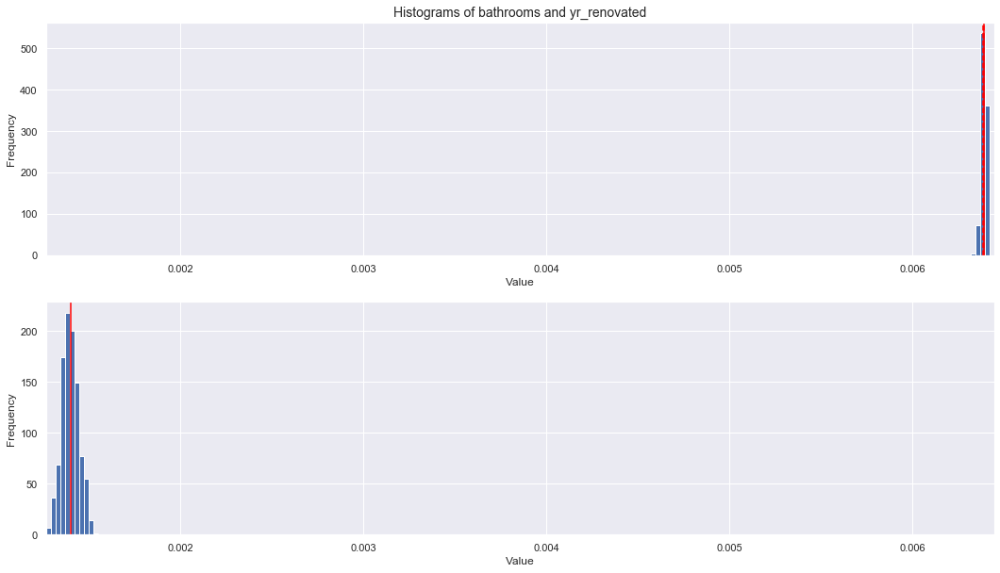


*** zipcode
DegFreedom     999.005239
Difference      -0.000412
t-Statistic   -843.597682
PValue           0.000000
Low95CI         -0.000412
High95CI        -0.000411
dtype: float64


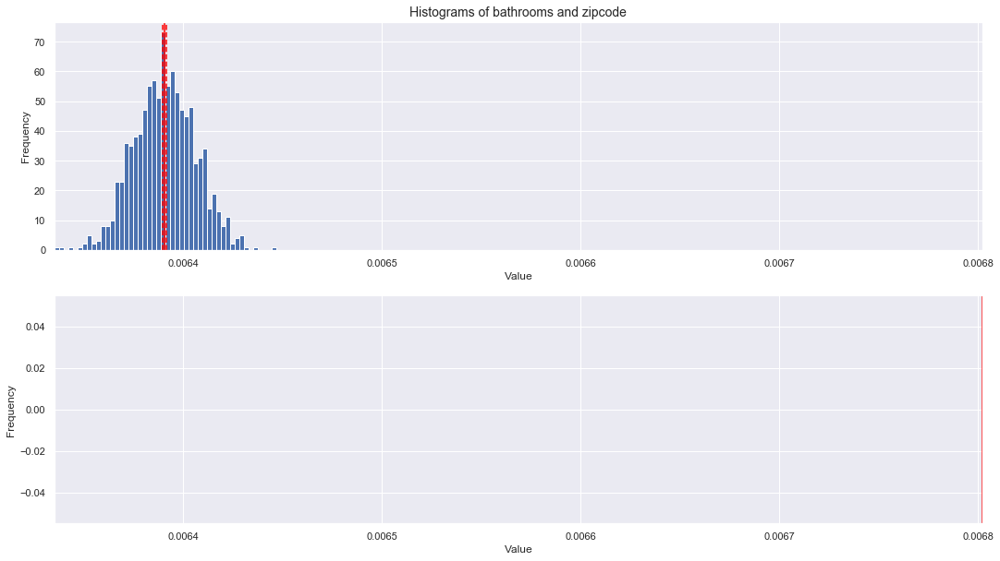


*** lat
DegFreedom     999.158332
Difference      -0.000411
t-Statistic   -843.501579
PValue           0.000000
Low95CI         -0.000412
High95CI        -0.000411
dtype: float64


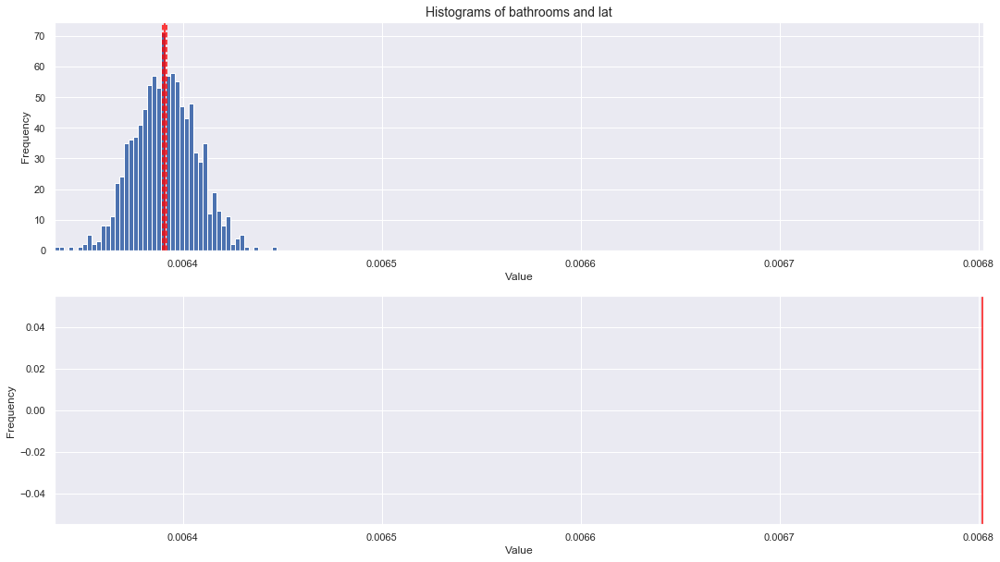


*** long
DegFreedom     999.026102
Difference      -0.000412
t-Statistic   -843.587410
PValue           0.000000
Low95CI         -0.000412
High95CI        -0.000411
dtype: float64


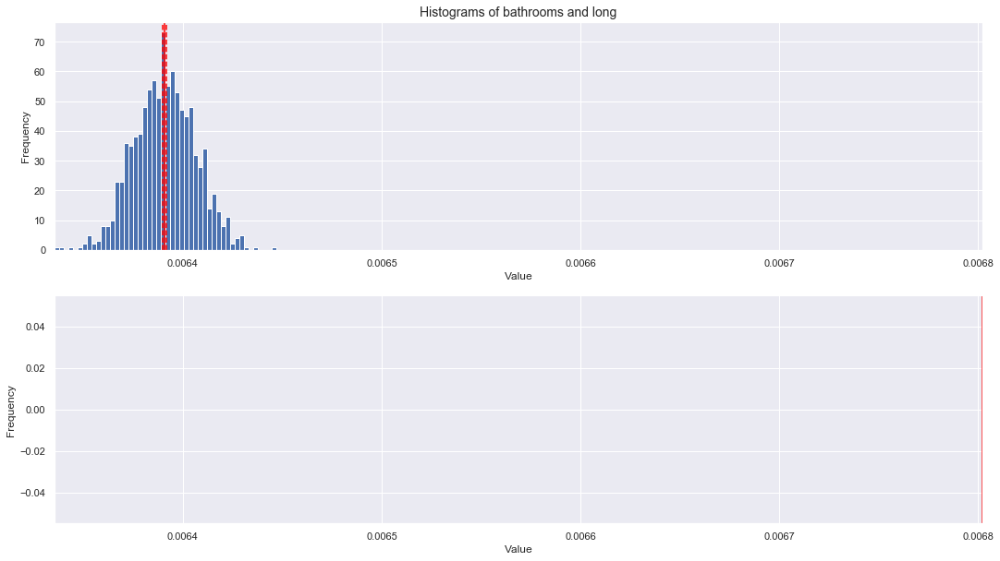


*** sqft_living15
DegFreedom     1993.555755
Difference       -0.000039
t-Statistic     -57.699638
PValue            0.000000
Low95CI          -0.000040
High95CI         -0.000038
dtype: float64


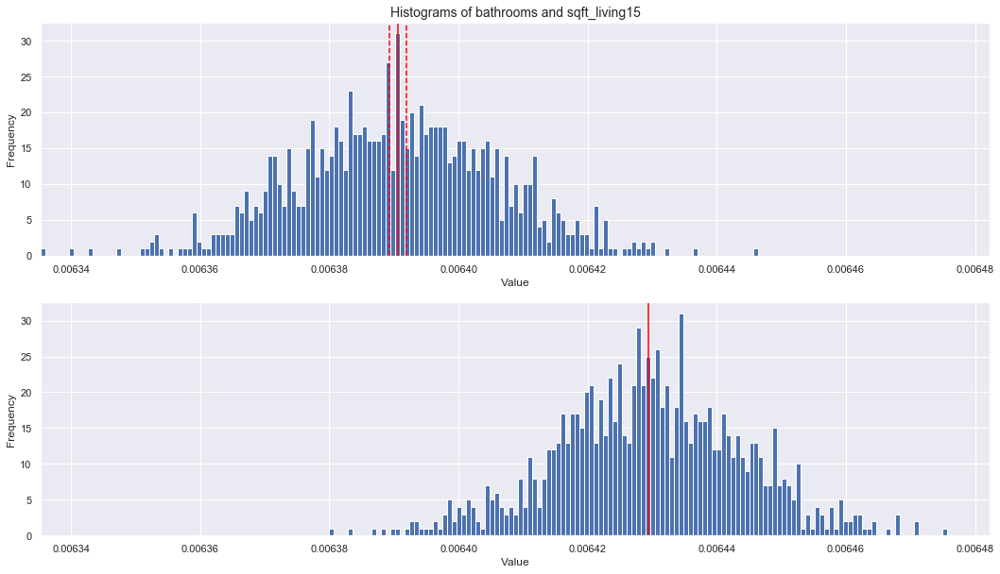


*** sqft_lot15
DegFreedom     1285.053102
Difference        0.003509
t-Statistic    2568.998393
PValue            0.000000
Low95CI           0.003506
High95CI          0.003511
dtype: float64


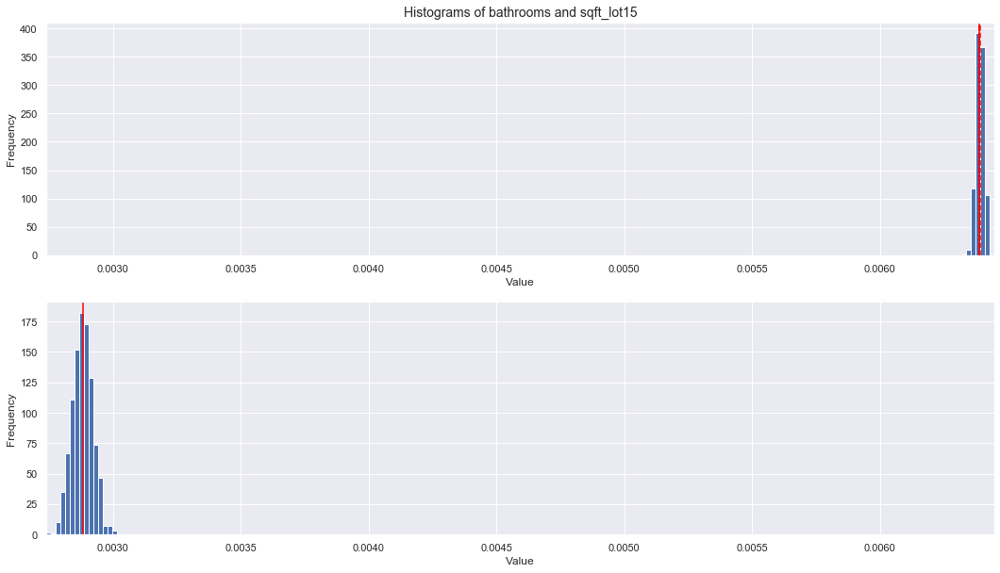

In [47]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['bathrooms', item]
    helperBS_tTest(bs_means, features)

## Bayesian Hypothesis Test -- LOG-NORMAL DISTRIBUTION (prior)

In [48]:
# get the log-normal distribution of the auto dataset features
bayesian_df = get_LogNormal(housingNorm_df, features_A)

### Feature: price  
> Based upon the results below, all of the following features reject the null hypothesis of feature 'price'.


*** price

*** log_price
DegFreedom     2.161625e+04
Difference     3.622990e-04
t-Statistic    1.391241e+01
PValue         8.228797e-44
Low95CI        3.112559e-04
High95CI       4.133421e-04
dtype: float64


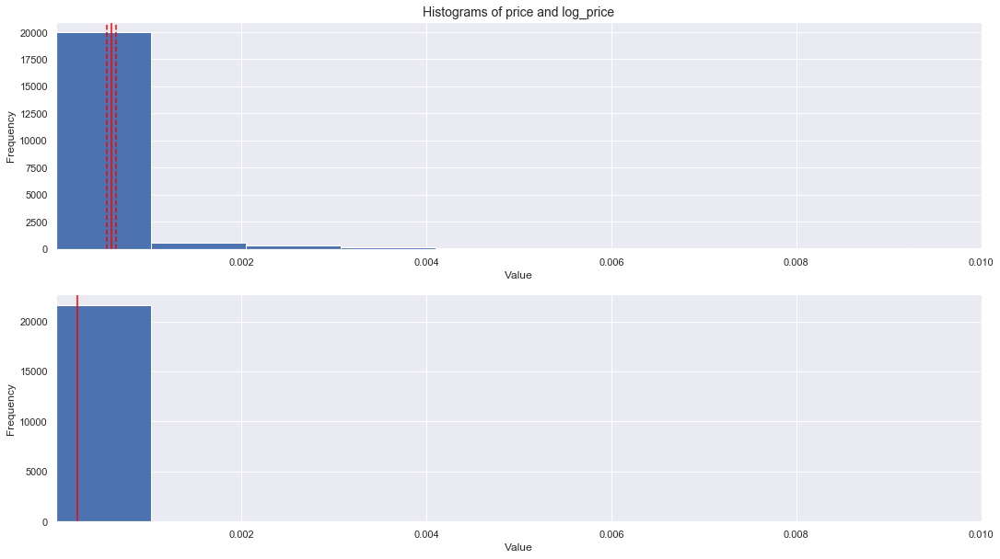


*** bedrooms
DegFreedom     2.475795e+04
Difference     3.048602e-04
t-Statistic    1.130115e+01
PValue         1.530051e-29
Low95CI        2.519856e-04
High95CI       3.577348e-04
dtype: float64


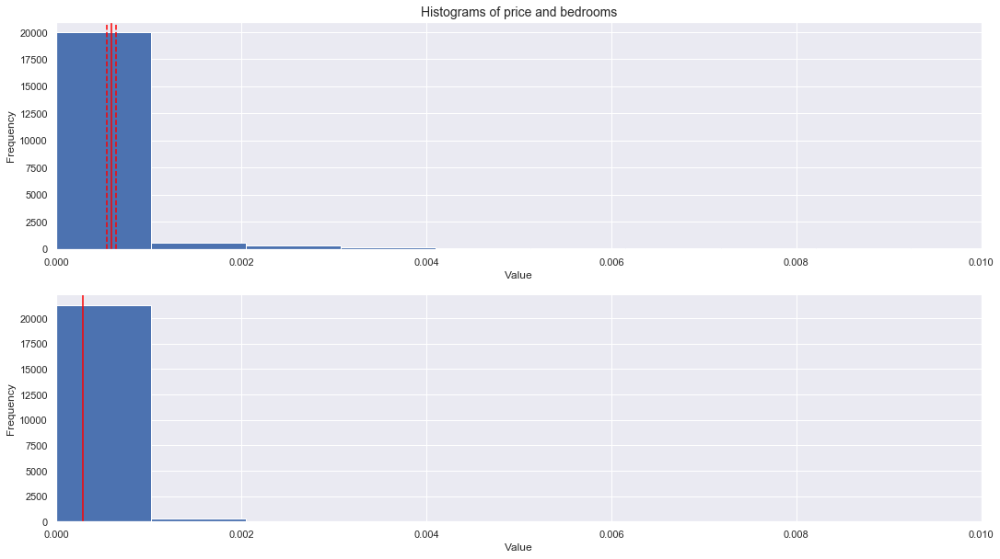


*** bathrooms
DegFreedom     2.243563e+04
Difference     2.725063e-04
t-Statistic    1.036652e+01
PValue         4.012808e-25
Low95CI        2.209816e-04
High95CI       3.240309e-04
dtype: float64


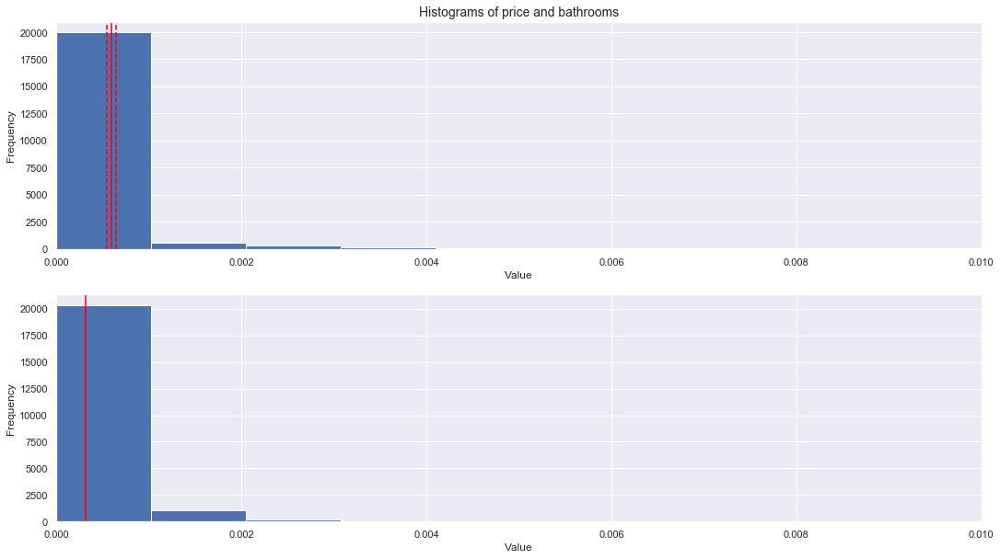


*** sqft_living
DegFreedom     2.477367e+04
Difference     2.137351e-04
t-Statistic    7.921782e+00
PValue         2.439125e-15
Low95CI        1.608513e-04
High95CI       2.666188e-04
dtype: float64


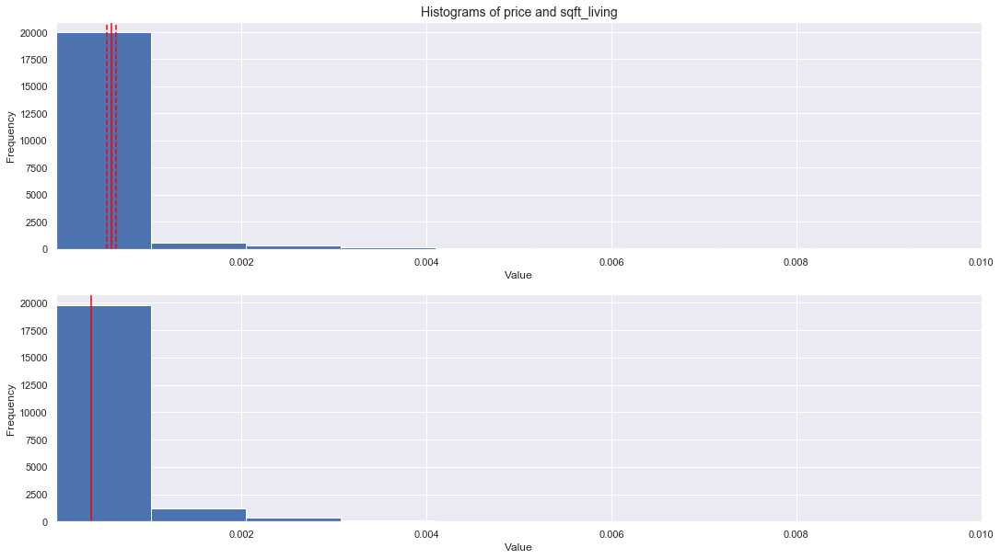


*** sqft_lot
DegFreedom     2.496883e+04
Difference    -5.614710e-04
t-Statistic   -5.804581e+00
PValue         6.530770e-09
Low95CI       -7.510654e-04
High95CI      -3.718766e-04
dtype: float64


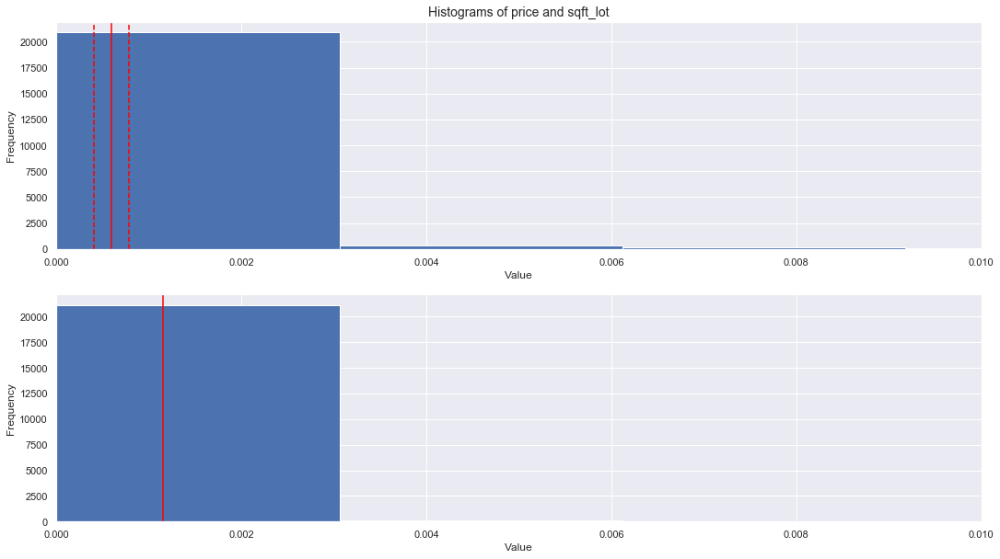


*** floors
DegFreedom     2.218531e+04
Difference     2.695566e-04
t-Statistic    1.028359e+01
PValue         9.496481e-25
Low95CI        2.181786e-04
High95CI       3.209345e-04
dtype: float64


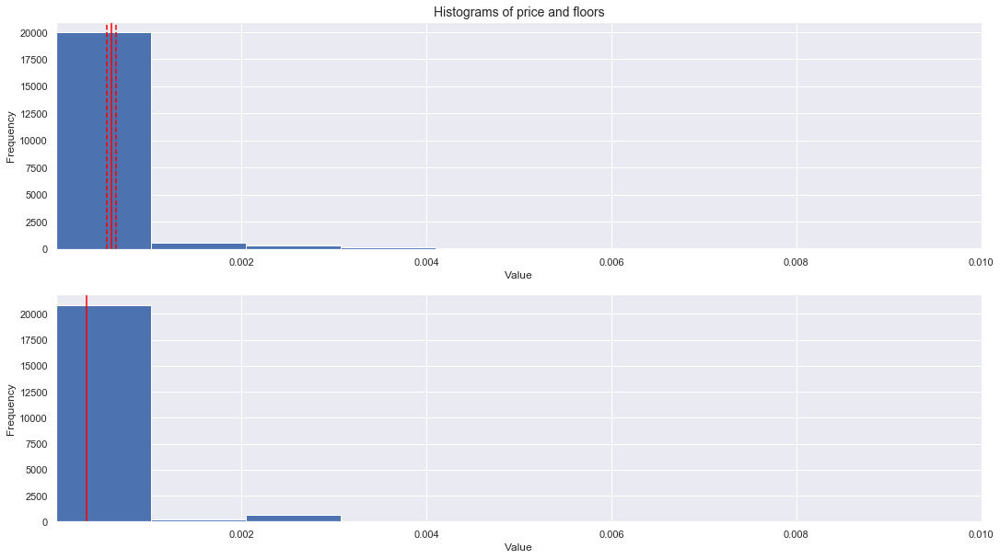


*** waterfront
DegFreedom     2.374766e+04
Difference    -9.066926e-04
t-Statistic   -7.564063e+00
PValue         4.048277e-14
Low95CI       -1.141642e-03
High95CI      -6.717428e-04
dtype: float64


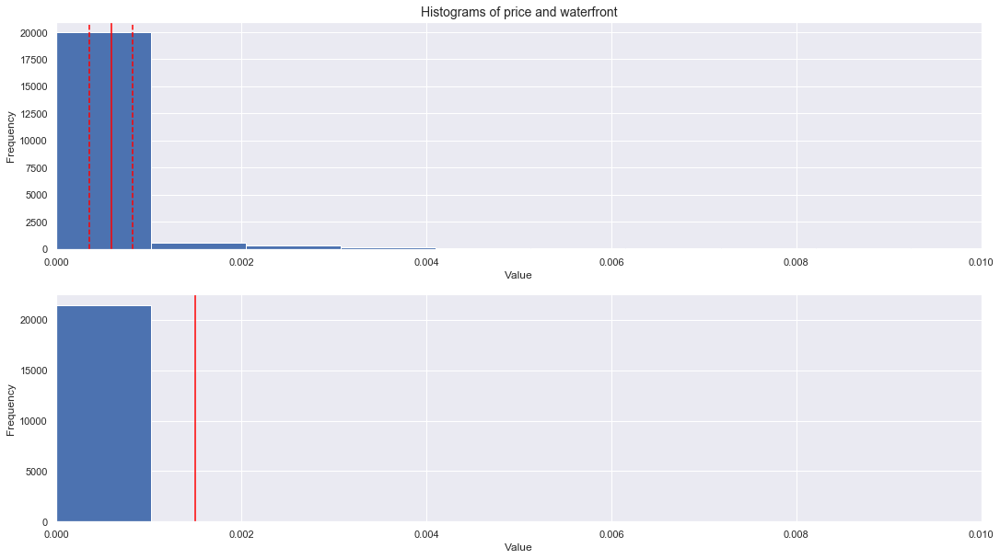


*** view
DegFreedom     3.869366e+04
Difference    -6.809565e-04
t-Statistic   -1.499743e+01
PValue         1.059942e-50
Low95CI       -7.699512e-04
High95CI      -5.919618e-04
dtype: float64


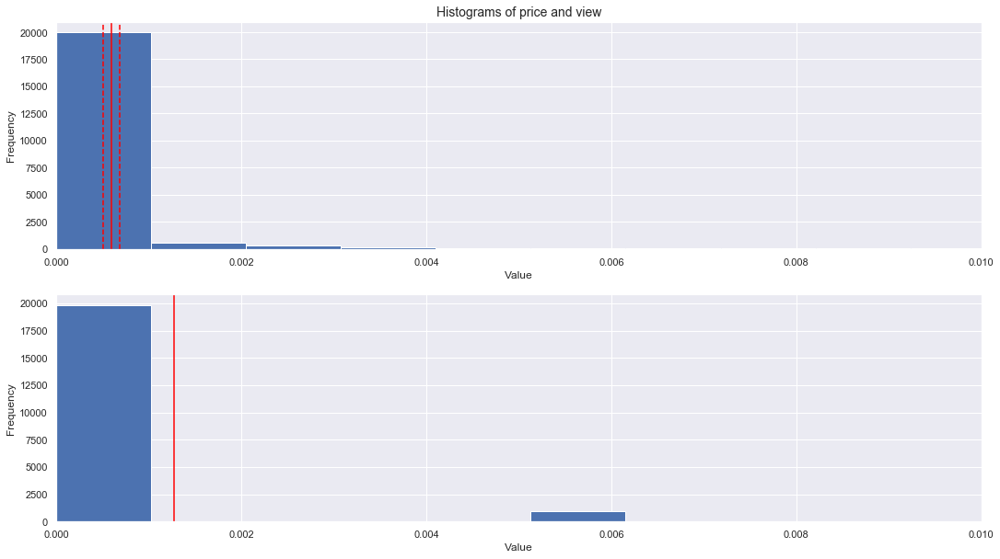


*** condition
DegFreedom     2.176384e+04
Difference     3.329319e-04
t-Statistic    1.276293e+01
PValue         3.589538e-37
Low95CI        2.818018e-04
High95CI       3.840621e-04
dtype: float64


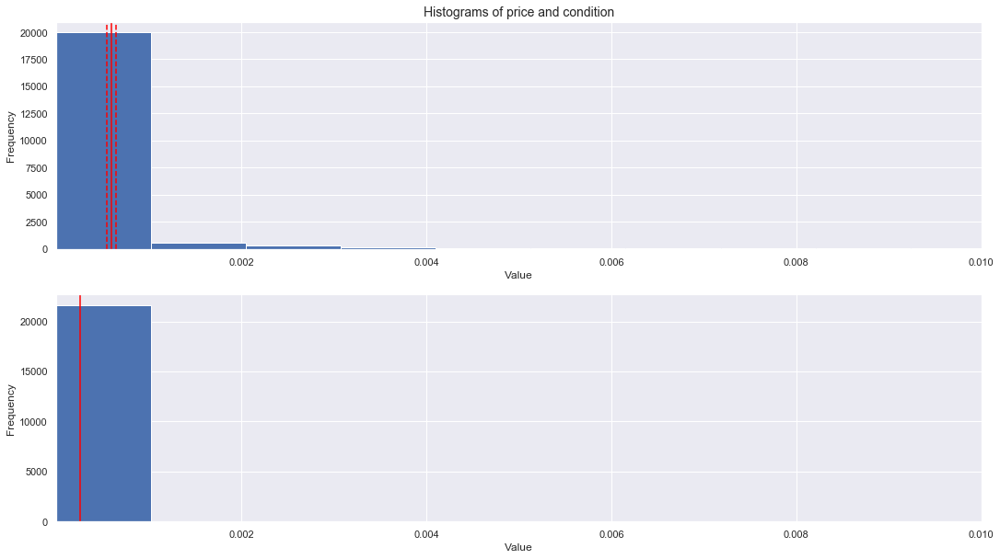


*** grade
DegFreedom     2.169881e+04
Difference     3.442876e-04
t-Statistic    1.320816e+01
PValue         1.120284e-39
Low95CI        2.931958e-04
High95CI       3.953794e-04
dtype: float64


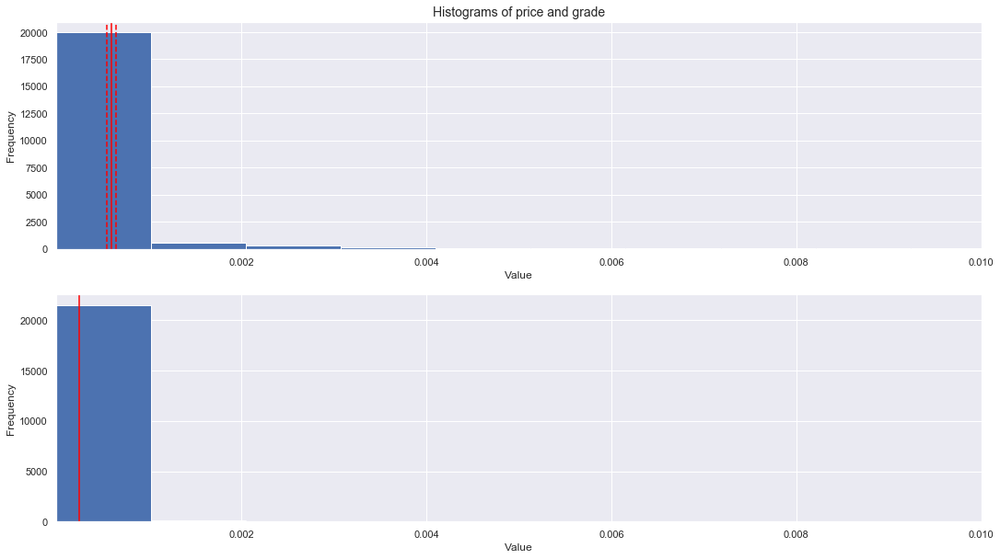


*** sqft_above
DegFreedom     2.443207e+04
Difference     1.988171e-04
t-Statistic    7.396545e+00
PValue         1.442743e-13
Low95CI        1.461312e-04
High95CI       2.515030e-04
dtype: float64


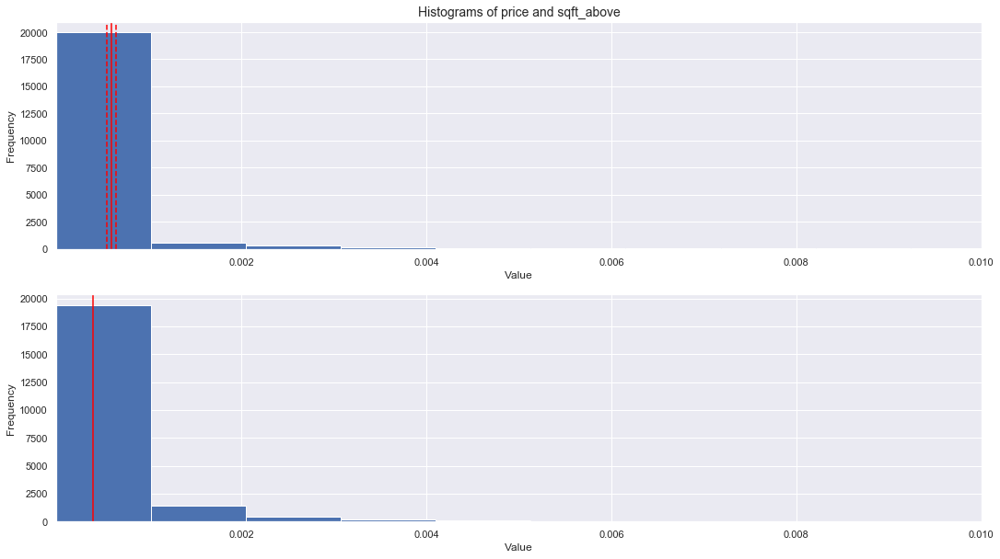


*** sqft_basement
DegFreedom     3.929025e+04
Difference    -1.689609e-04
t-Statistic   -5.264106e+00
PValue         1.416124e-07
Low95CI       -2.318713e-04
High95CI      -1.060504e-04
dtype: float64


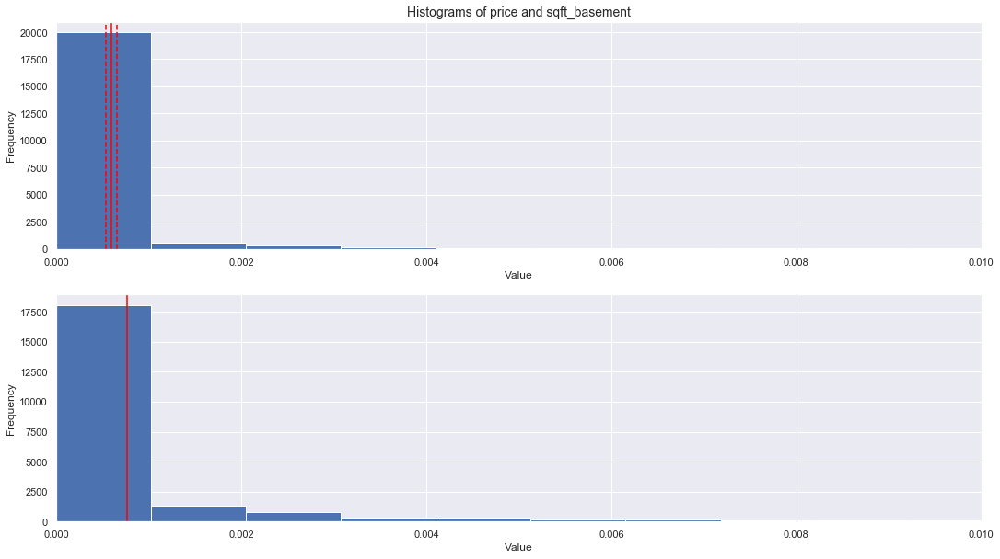


*** yr_built
DegFreedom     2.161254e+04
Difference     3.634308e-04
t-Statistic    1.395647e+01
PValue         4.464436e-44
Low95CI        3.123898e-04
High95CI       4.144717e-04
dtype: float64


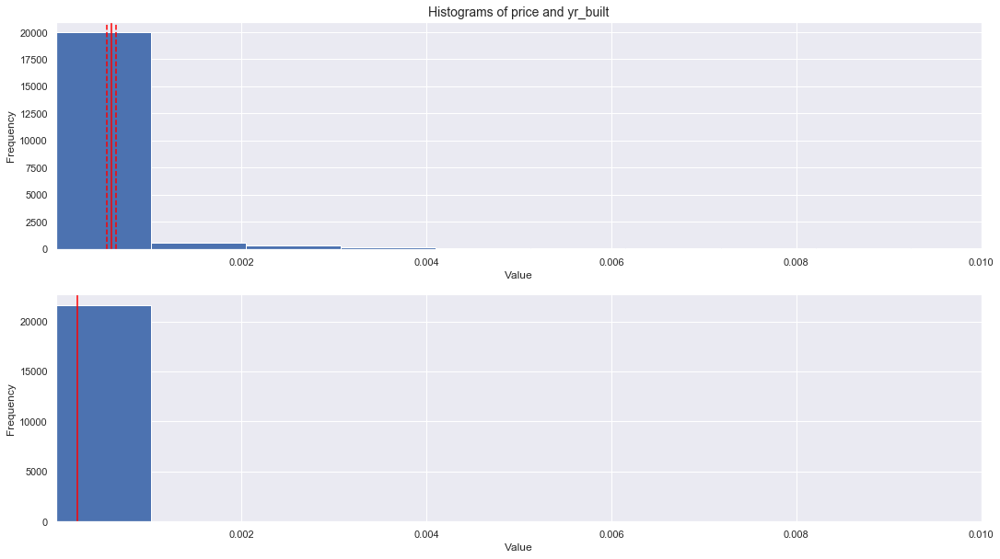


*** yr_renovated
DegFreedom     3.273008e+04
Difference    -9.355388e-04
t-Statistic   -1.673137e+01
PValue         1.410098e-62
Low95CI       -1.045135e-03
High95CI      -8.259429e-04
dtype: float64


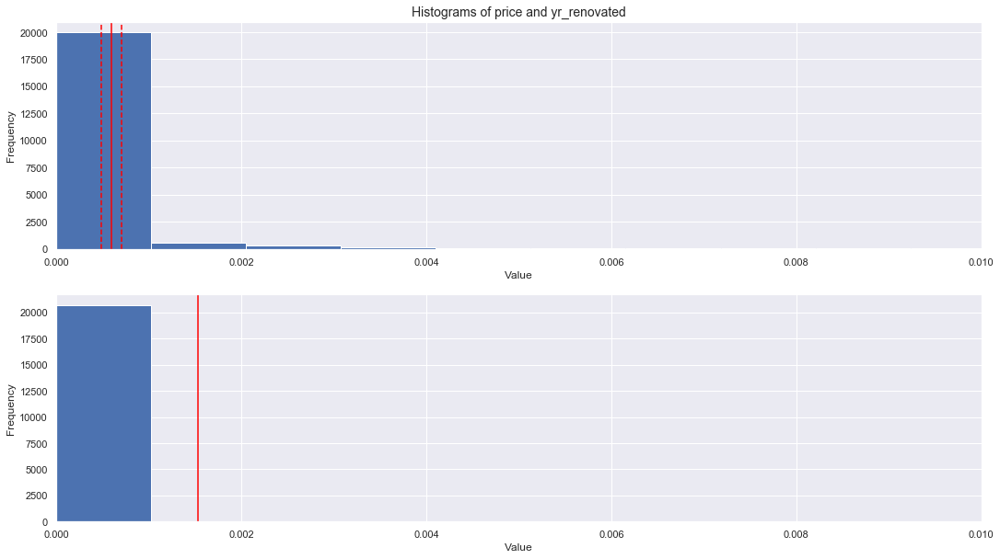


*** zipcode
DegFreedom     2.161200e+04
Difference     3.636063e-04
t-Statistic    1.396330e+01
PValue         4.060231e-44
Low95CI        3.125656e-04
High95CI       4.146469e-04
dtype: float64


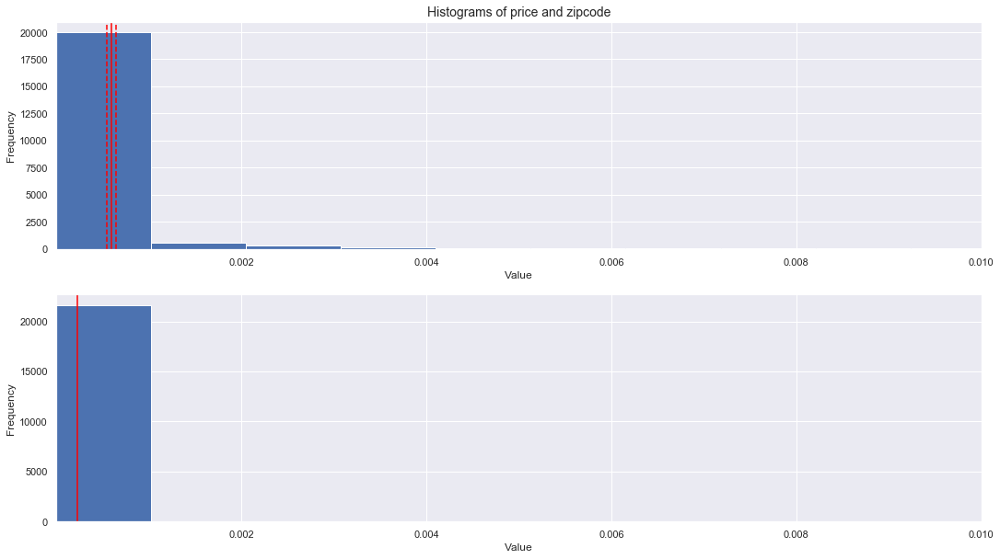


*** lat
DegFreedom     2.161202e+04
Difference     3.635997e-04
t-Statistic    1.396304e+01
PValue         4.074553e-44
Low95CI        3.125591e-04
High95CI       4.146404e-04
dtype: float64


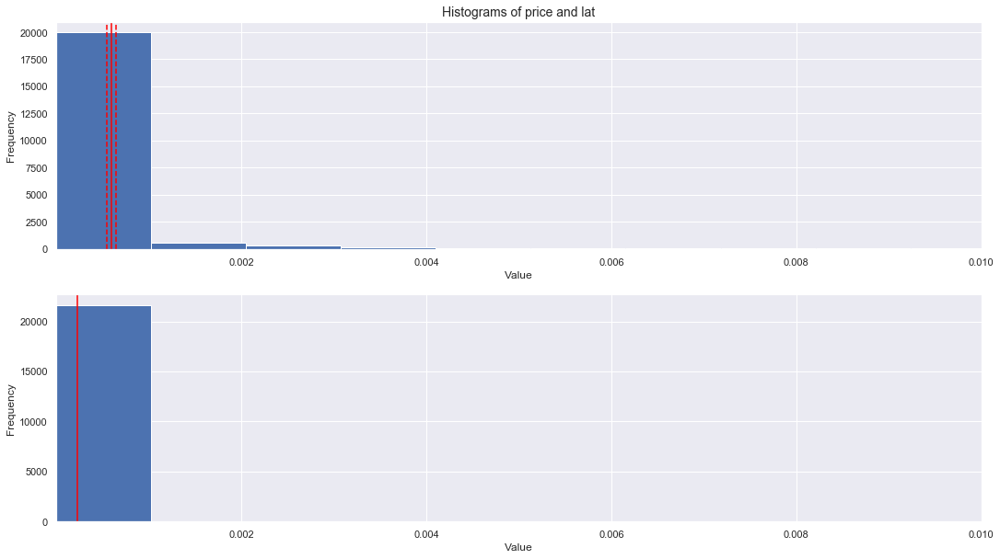


*** long
DegFreedom     2.161200e+04
Difference     3.636054e-04
t-Statistic    1.396326e+01
PValue         4.062030e-44
Low95CI        3.125648e-04
High95CI       4.146460e-04
dtype: float64


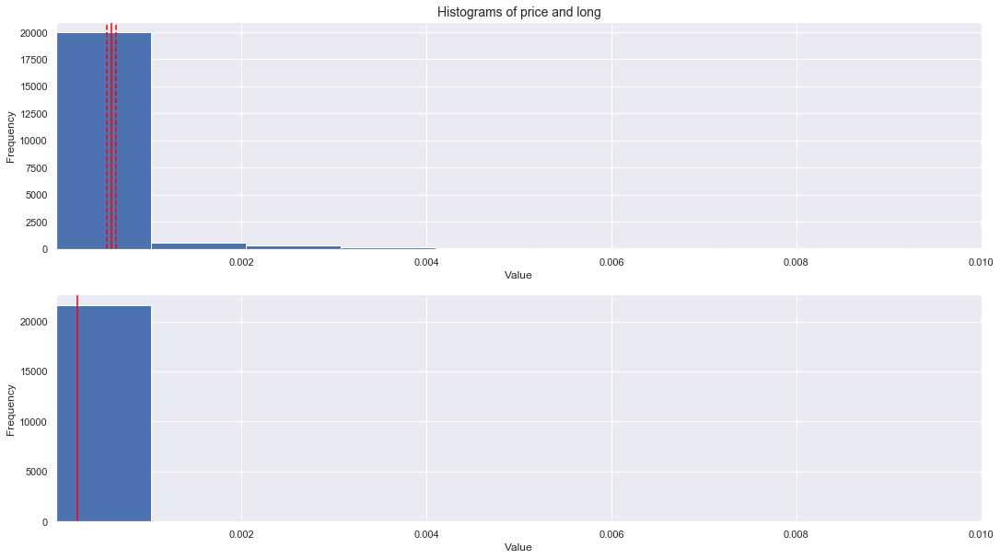


*** sqft_living15
DegFreedom     2.247022e+04
Difference     2.688551e-04
t-Statistic    1.022360e+01
PValue         1.758870e-24
Low95CI        2.173102e-04
High95CI       3.204000e-04
dtype: float64


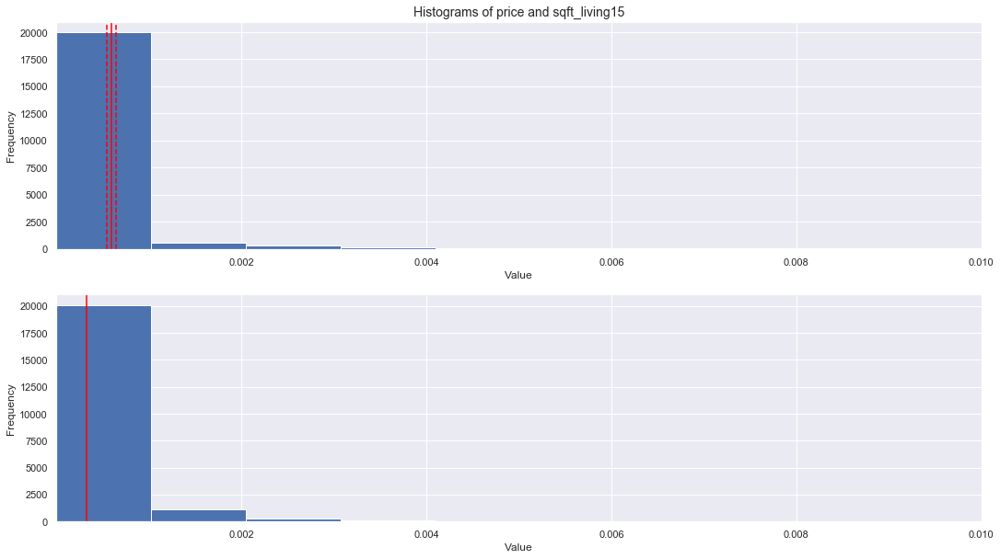


*** sqft_lot15
DegFreedom     2.593781e+04
Difference    -6.502001e-04
t-Statistic   -7.566055e+00
PValue         3.974924e-14
Low95CI       -8.186404e-04
High95CI      -4.817599e-04
dtype: float64


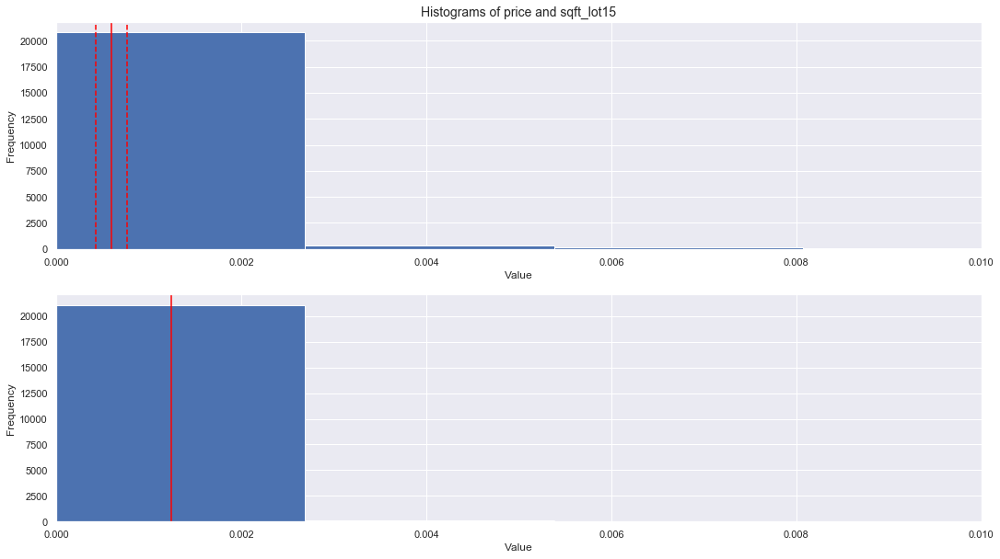

In [49]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['price', item]
    helperBay_tTest(bayesian_df, features)

### Feature: log_price  
> Based upon the results below, all of the following features reject the null hypothesis of feature 'log_price'.


*** price
DegFreedom     2.161625e+04
Difference    -3.622990e-04
t-Statistic   -1.391241e+01
PValue         8.228797e-44
Low95CI       -4.133421e-04
High95CI      -3.112559e-04
dtype: float64


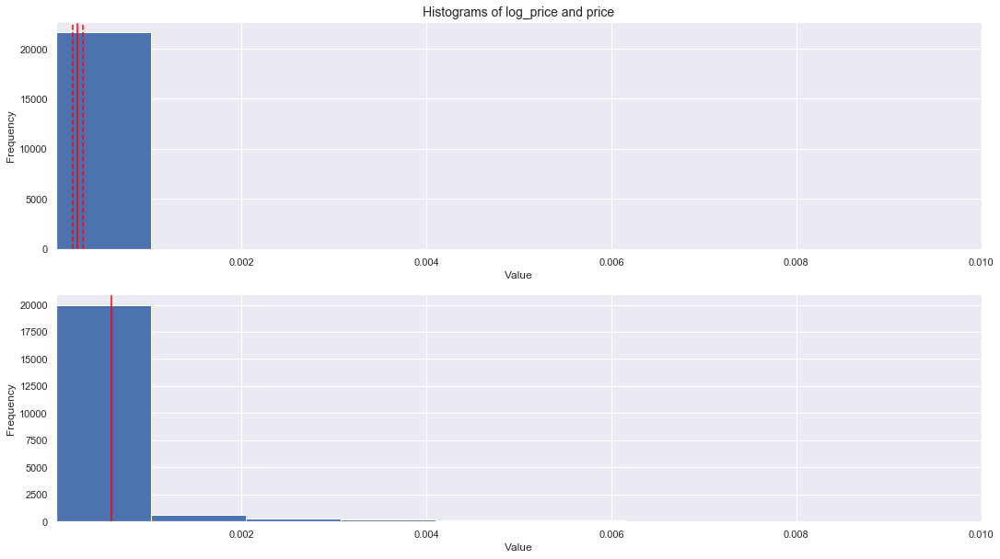


*** log_price

*** bedrooms
DegFreedom     2.167006e+04
Difference    -5.743881e-05
t-Statistic   -8.148879e+00
PValue         3.870292e-16
Low95CI       -7.125473e-05
High95CI      -4.362289e-05
dtype: float64


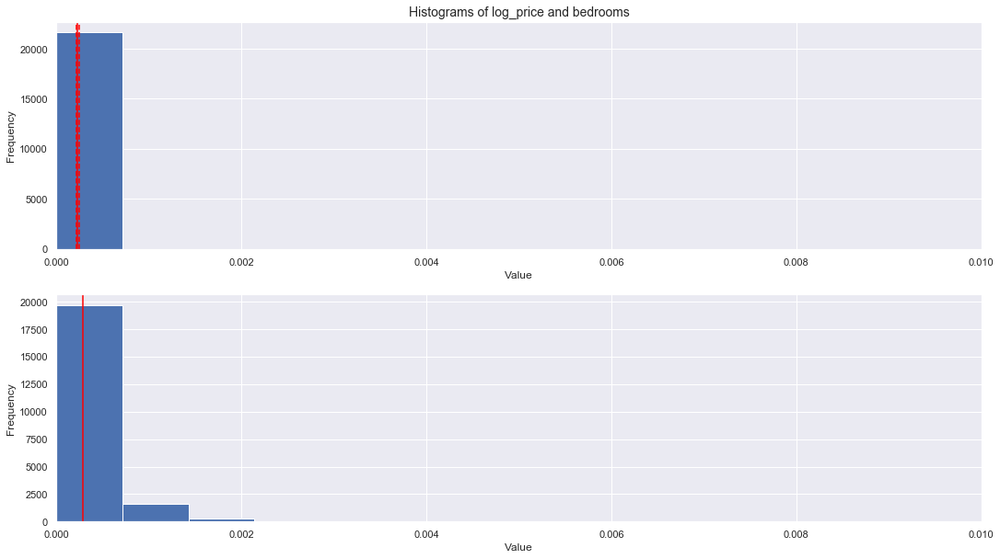


*** bathrooms
DegFreedom      2.183485e+04
Difference     -8.979275e-05
t-Statistic    -2.491141e+01
PValue         4.300333e-135
Low95CI        -9.685779e-05
High95CI       -8.272770e-05
dtype: float64


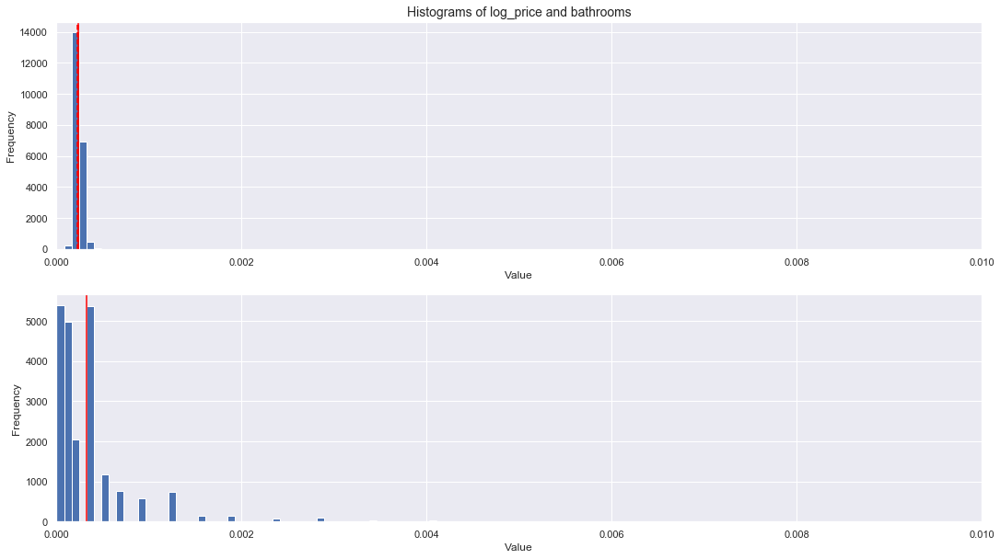


*** sqft_living
DegFreedom     2.166976e+04
Difference    -1.485639e-04
t-Statistic   -2.102388e+01
PValue         3.703025e-97
Low95CI       -1.624147e-04
High95CI      -1.347132e-04
dtype: float64


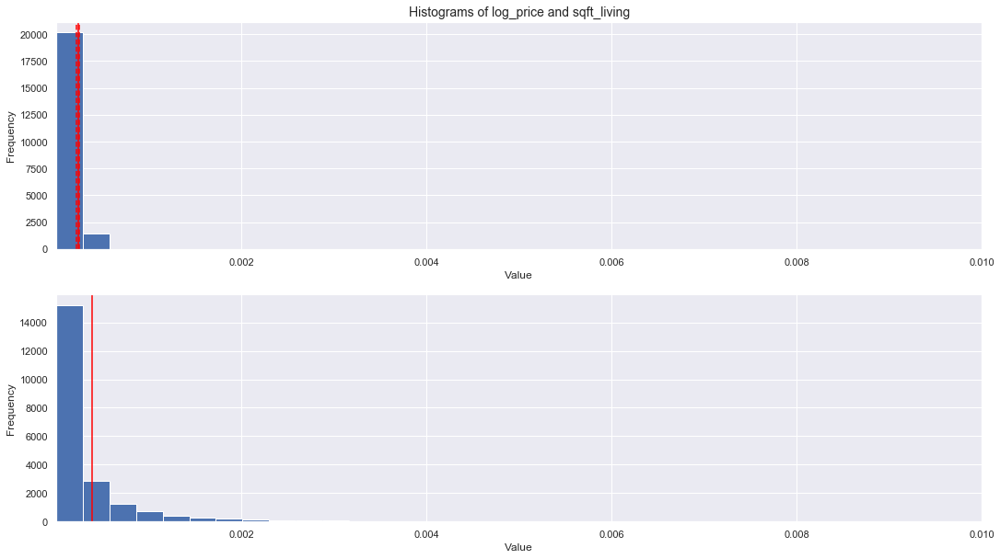


*** sqft_lot
DegFreedom     2.161233e+04
Difference    -9.237700e-04
t-Statistic   -9.916133e+00
PValue         3.968919e-23
Low95CI       -1.106367e-03
High95CI      -7.411729e-04
dtype: float64


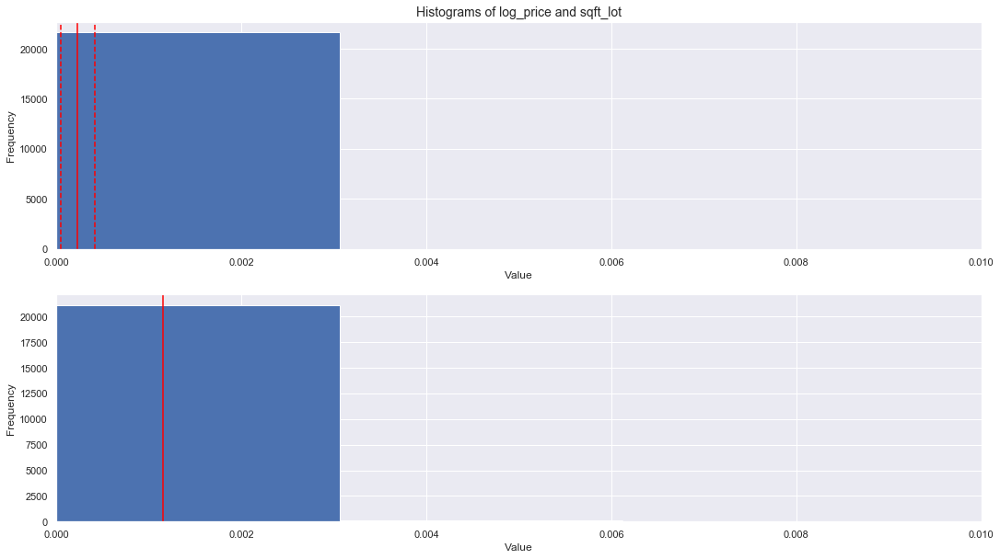


*** floors
DegFreedom      2.193220e+04
Difference     -9.274245e-05
t-Statistic    -3.080796e+01
PValue         4.527877e-204
Low95CI        -9.864293e-05
High95CI       -8.684197e-05
dtype: float64


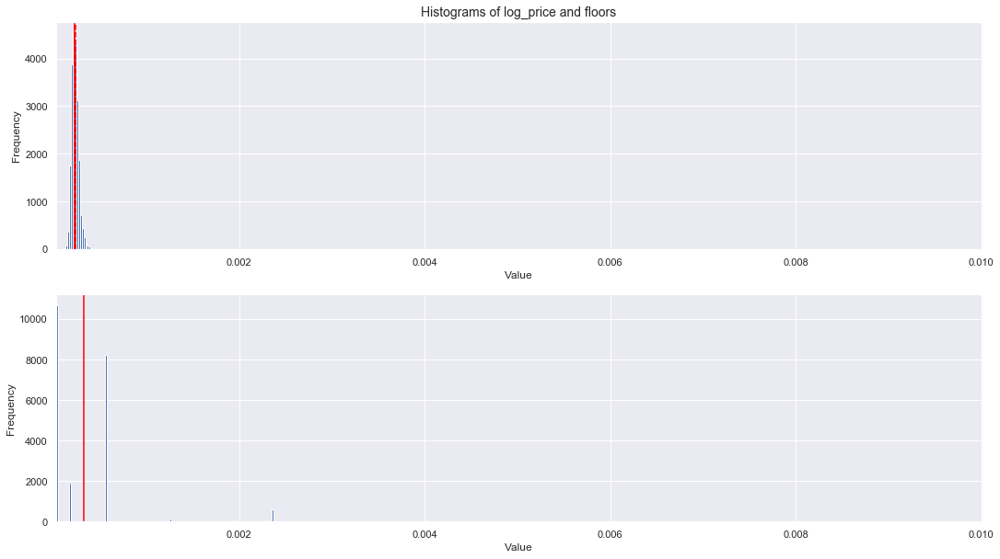


*** waterfront
DegFreedom     2.161221e+04
Difference    -1.268992e-03
t-Statistic   -1.084552e+01
PValue         2.463211e-27
Low95CI       -1.498332e-03
High95CI      -1.039651e-03
dtype: float64


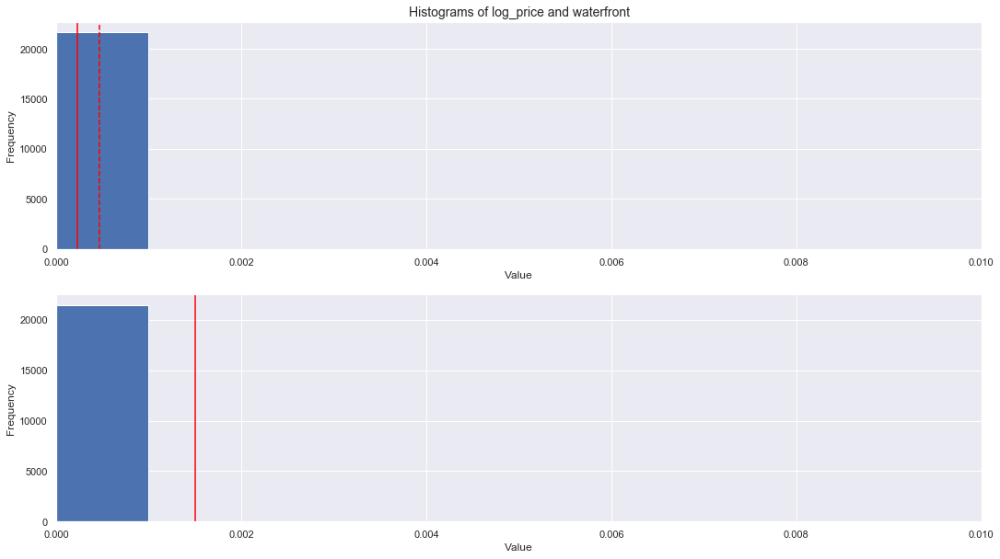


*** view
DegFreedom      2.161408e+04
Difference     -1.043256e-03
t-Statistic    -2.804714e+01
PValue         4.777163e-170
Low95CI        -1.116163e-03
High95CI       -9.703476e-04
dtype: float64


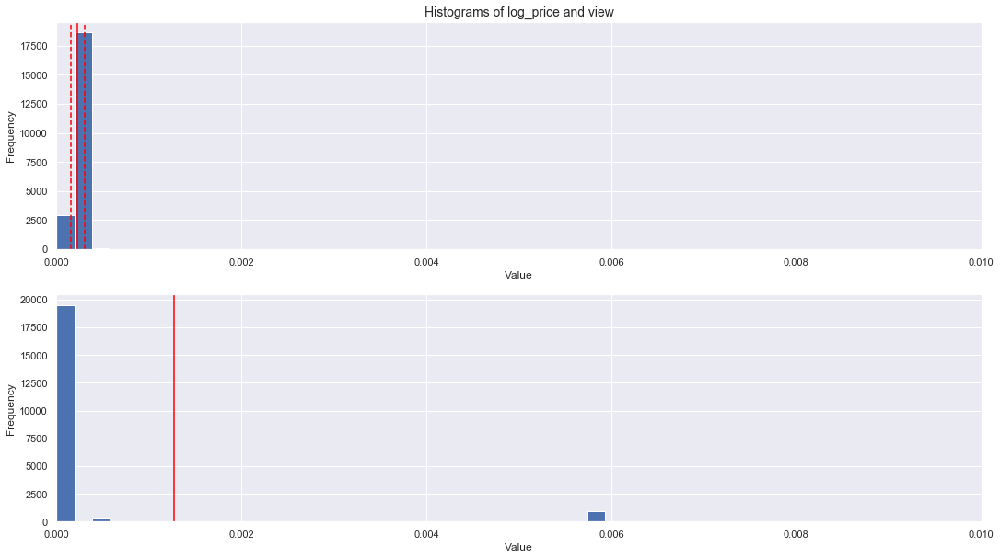


*** condition
DegFreedom     2.282031e+04
Difference    -2.936711e-05
t-Statistic   -1.876686e+01
PValue         5.452715e-78
Low95CI       -3.243429e-05
High95CI      -2.629992e-05
dtype: float64


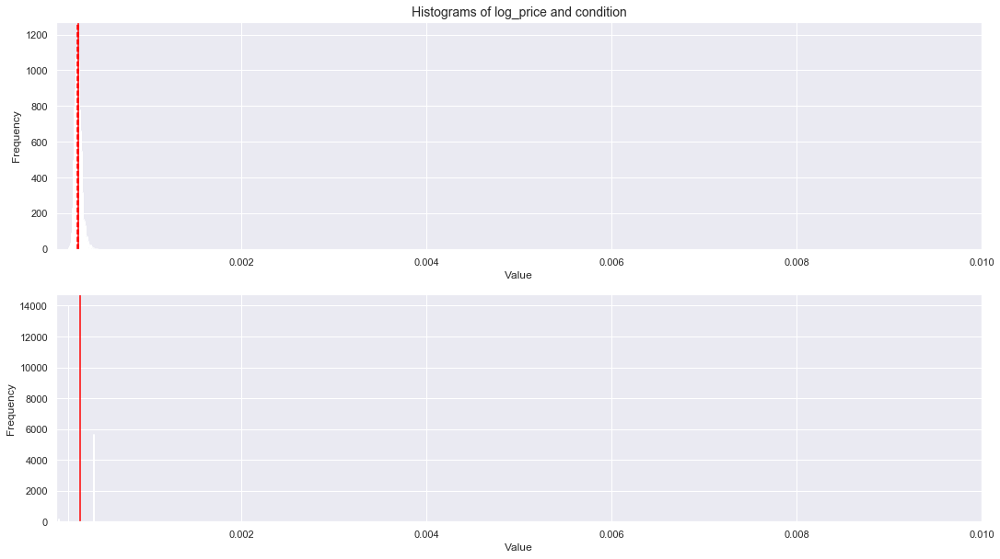


*** grade
DegFreedom     2.372204e+04
Difference    -1.801140e-05
t-Statistic   -1.506958e+01
PValue         4.427086e-51
Low95CI       -2.035410e-05
High95CI      -1.566870e-05
dtype: float64


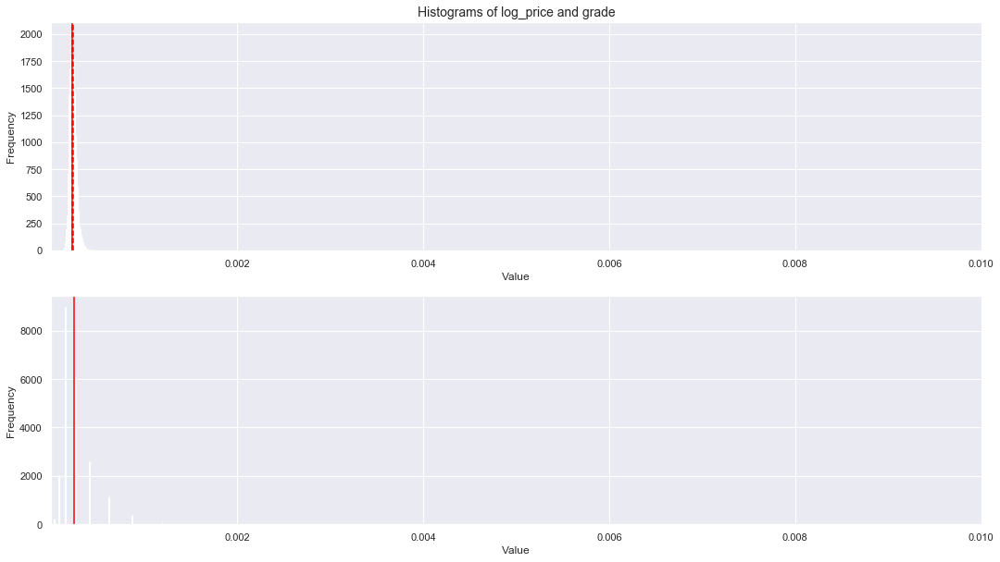


*** sqft_above
DegFreedom      2.167683e+04
Difference     -1.634819e-04
t-Statistic    -2.450773e+01
PValue         7.365773e-131
Low95CI        -1.765568e-04
High95CI       -1.504070e-04
dtype: float64


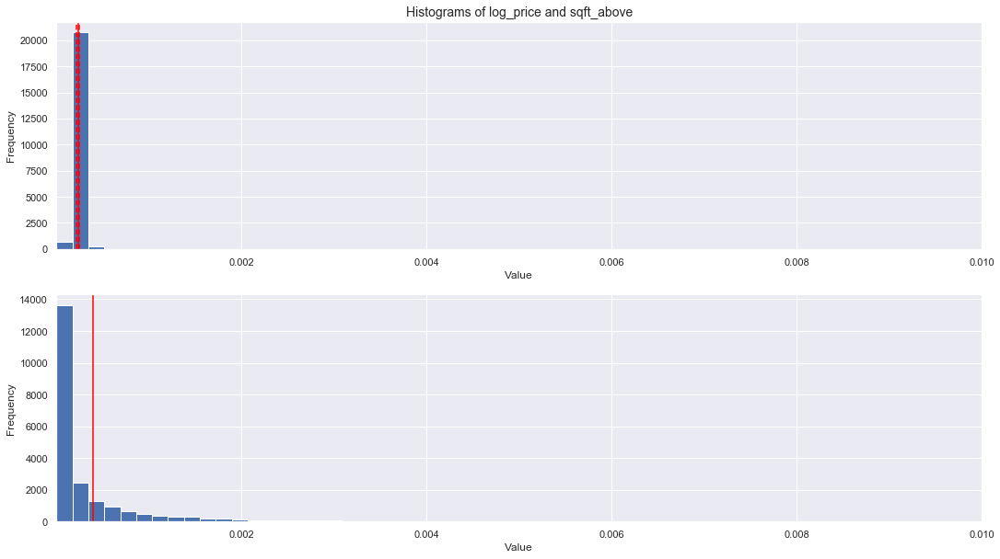


*** sqft_basement
DegFreedom      2.162018e+04
Difference     -5.312599e-04
t-Statistic    -2.830897e+01
PValue         3.834949e-173
Low95CI        -5.680436e-04
High95CI       -4.944762e-04
dtype: float64


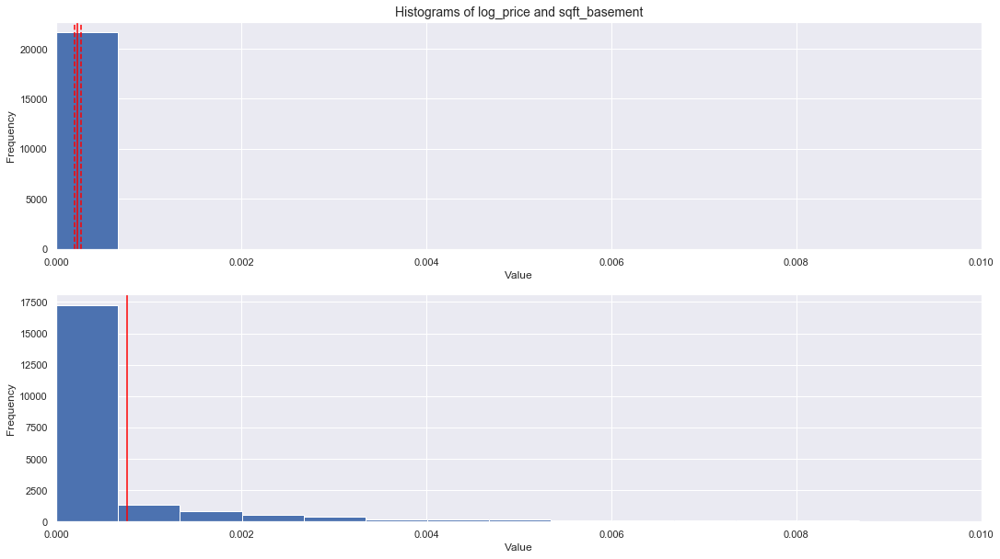


*** yr_built
DegFreedom     2.699462e+04
Difference     1.131757e-06
t-Statistic    4.130556e+00
PValue         3.629753e-05
Low95CI        5.947103e-07
High95CI       1.668804e-06
dtype: float64


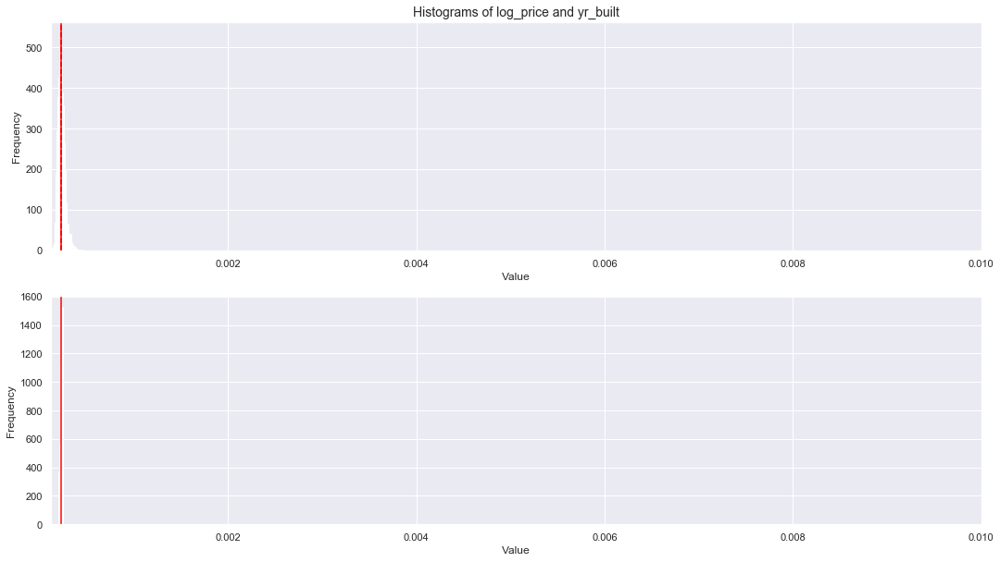


*** yr_renovated
DegFreedom      2.161318e+04
Difference     -1.297838e-03
t-Statistic    -2.622836e+01
PValue         2.728972e-149
Low95CI        -1.394827e-03
High95CI       -1.200849e-03
dtype: float64


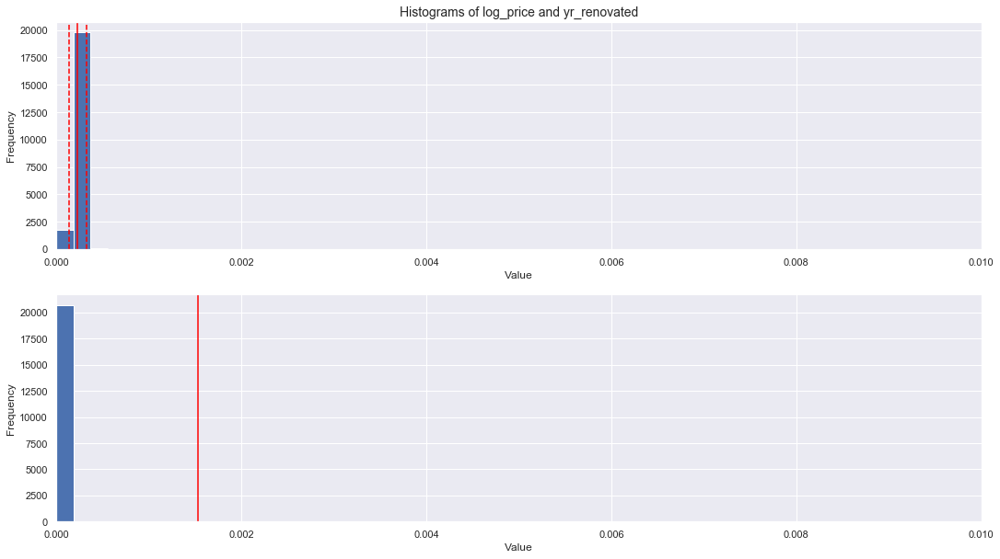


*** zipcode
DegFreedom     2.161947e+04
Difference     1.307243e-06
t-Statistic    5.063417e+00
PValue         4.151890e-07
Low95CI        8.012026e-07
High95CI       1.813283e-06
dtype: float64


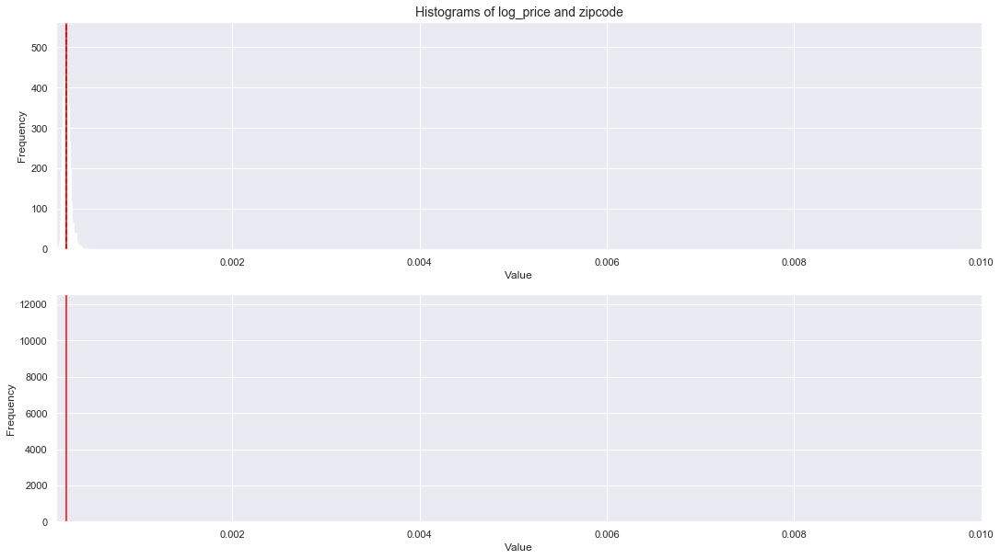


*** lat
DegFreedom     2.182419e+04
Difference     1.300734e-06
t-Statistic    5.026319e+00
PValue         5.039369e-07
Low95CI        7.934972e-07
High95CI       1.807970e-06
dtype: float64


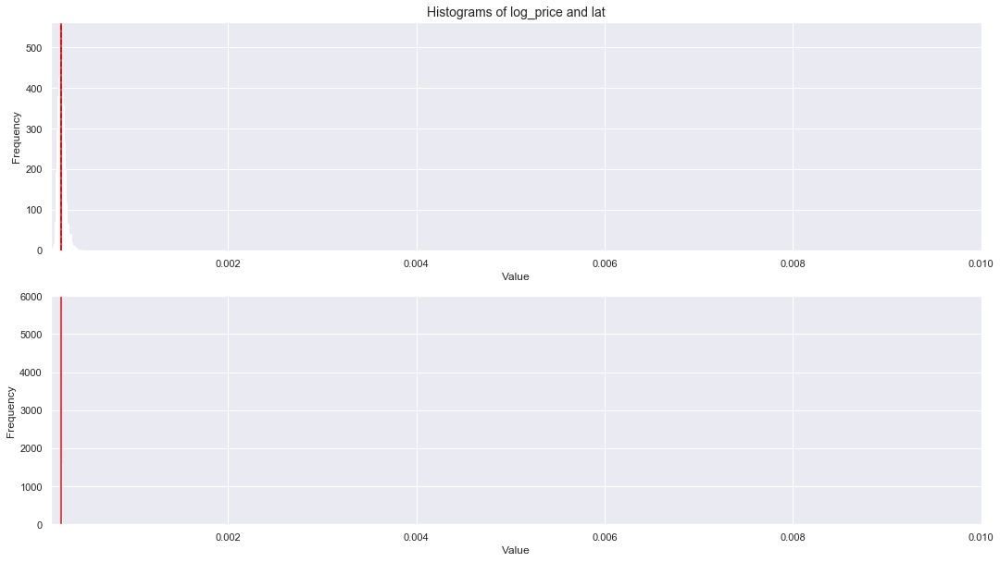


*** long
DegFreedom     2.164523e+04
Difference     1.306424e-06
t-Statistic    5.058739e+00
PValue         4.254869e-07
Low95CI        8.002332e-07
High95CI       1.812615e-06
dtype: float64


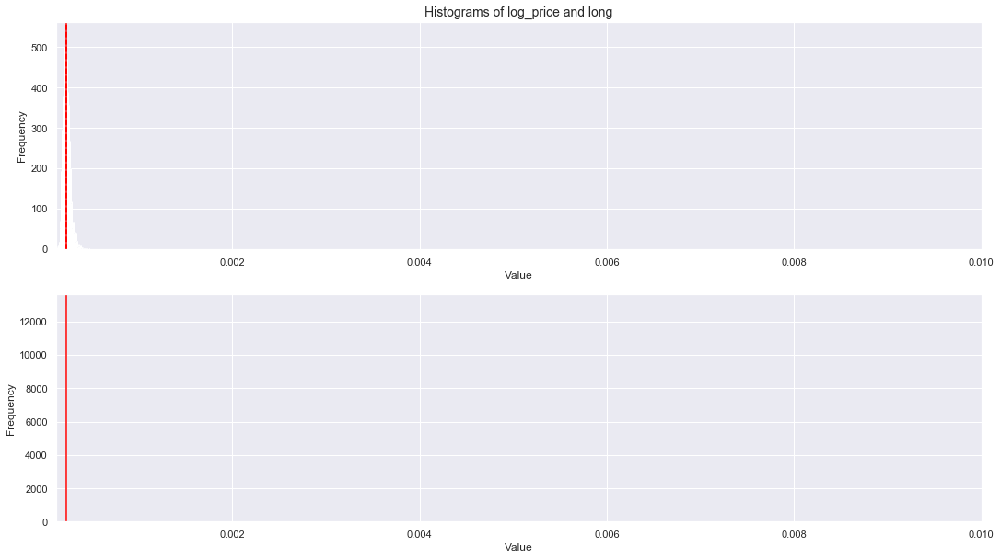


*** sqft_living15
DegFreedom      2.182586e+04
Difference     -9.344393e-05
t-Statistic    -2.539879e+01
PValue         2.829002e-140
Low95CI        -1.006552e-04
High95CI       -8.623268e-05
dtype: float64


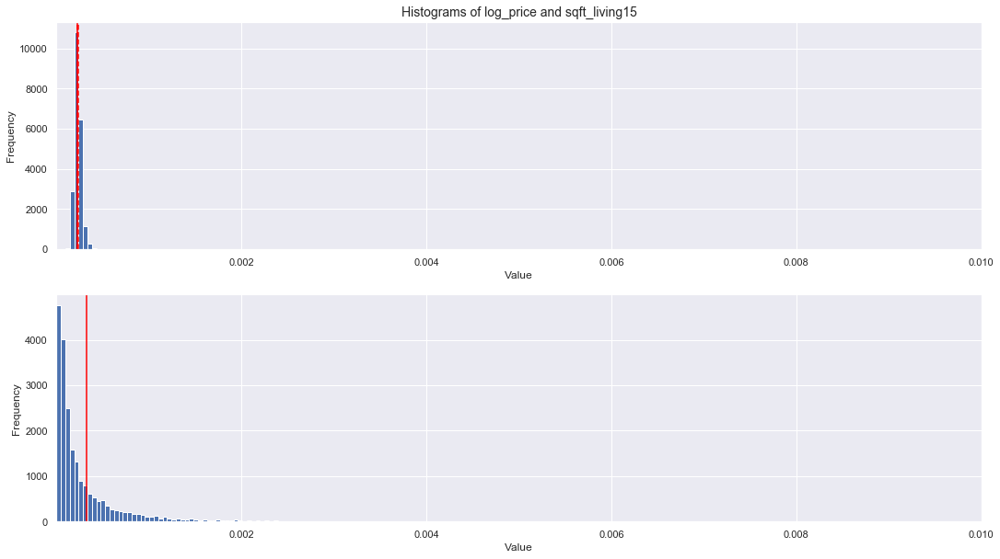


*** sqft_lot15
DegFreedom     2.161243e+04
Difference    -1.012499e-03
t-Statistic   -1.236314e+01
PValue         5.432722e-35
Low95CI       -1.173023e-03
High95CI      -8.519757e-04
dtype: float64


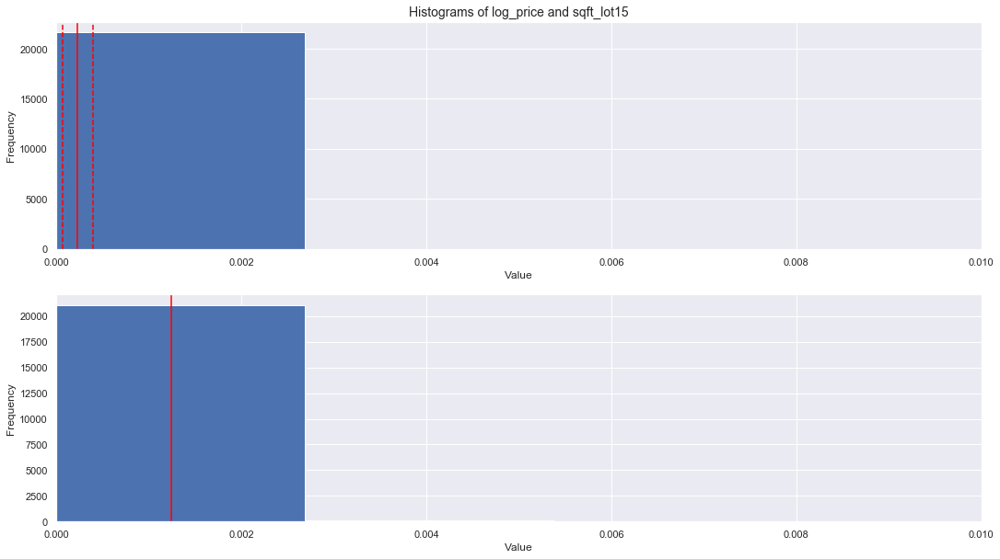

In [50]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['log_price', item]
    helperBay_tTest(bayesian_df, features)

### Feature: grade  
> Based upon the results below, all of the null hypothesis were rejected for feature 'grade'.


*** price
DegFreedom     2.169881e+04
Difference    -3.442876e-04
t-Statistic   -1.320816e+01
PValue         1.120284e-39
Low95CI       -3.953794e-04
High95CI      -2.931958e-04
dtype: float64


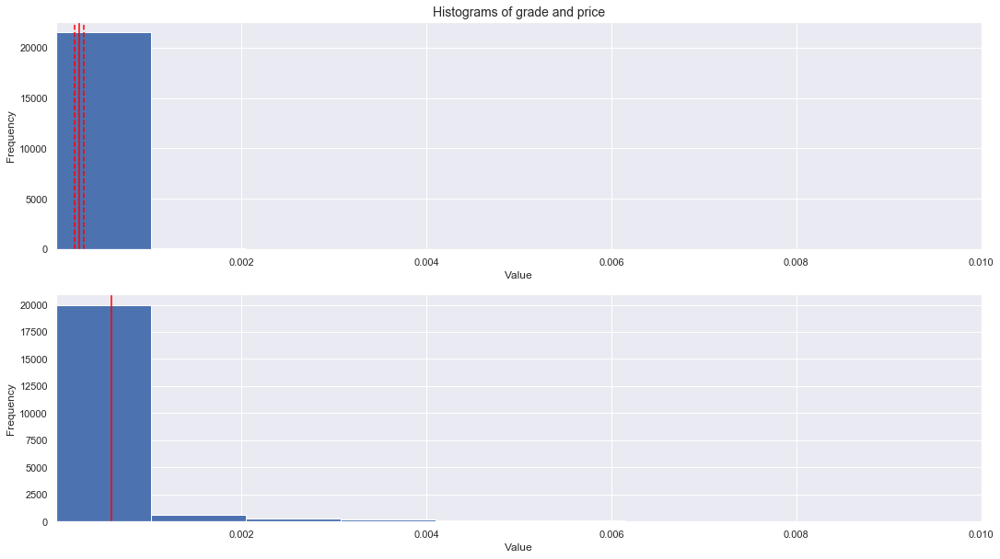


*** log_price
DegFreedom     2.372204e+04
Difference     1.801140e-05
t-Statistic    1.506958e+01
PValue         4.427086e-51
Low95CI        1.566870e-05
High95CI       2.035410e-05
dtype: float64


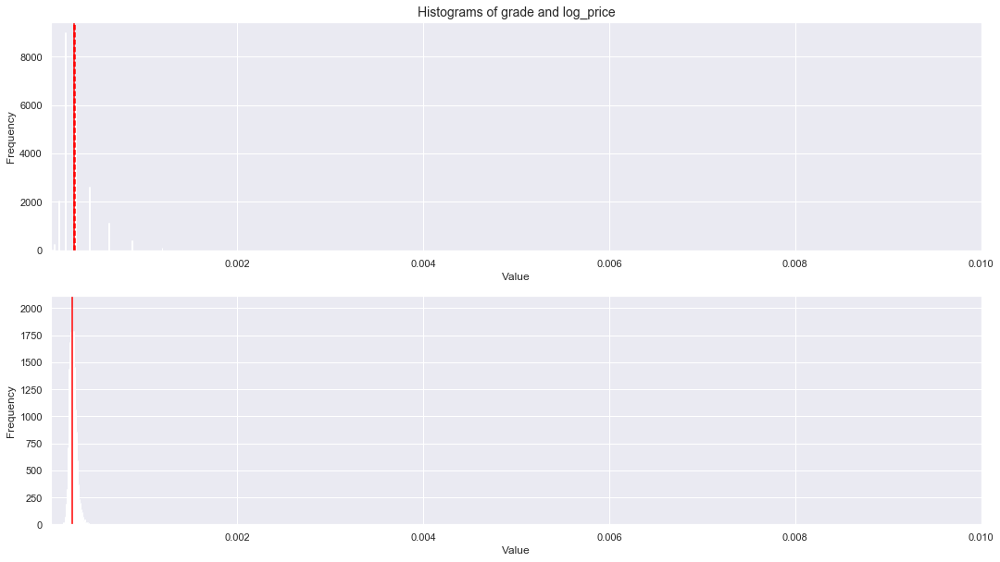


*** bedrooms
DegFreedom     2.279753e+04
Difference    -3.942741e-05
t-Statistic   -5.522073e+00
PValue         3.386766e-08
Low95CI       -5.342222e-05
High95CI      -2.543259e-05
dtype: float64


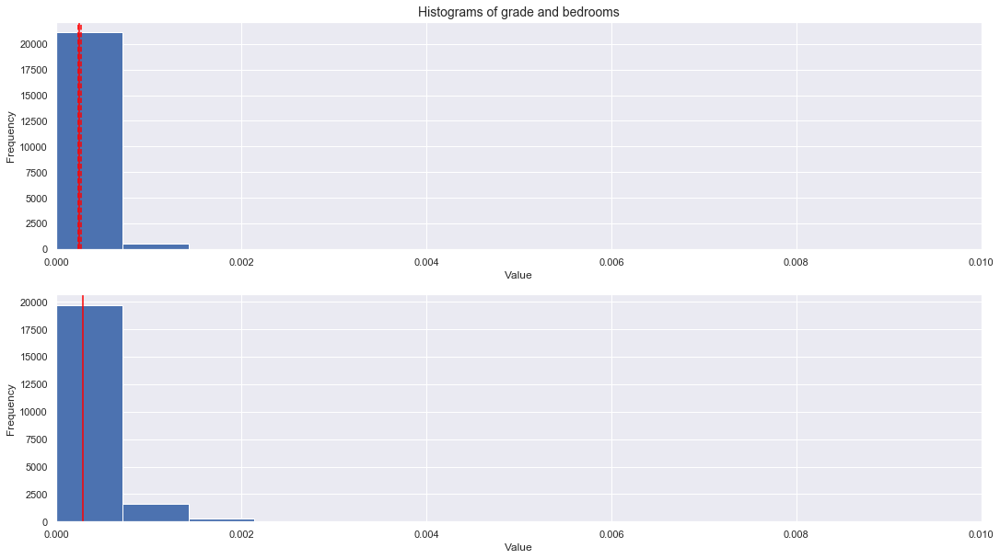


*** bathrooms
DegFreedom     2.611625e+04
Difference    -7.178134e-05
t-Statistic   -1.899034e+01
PValue         7.087660e-80
Low95CI       -7.919013e-05
High95CI      -6.437256e-05
dtype: float64


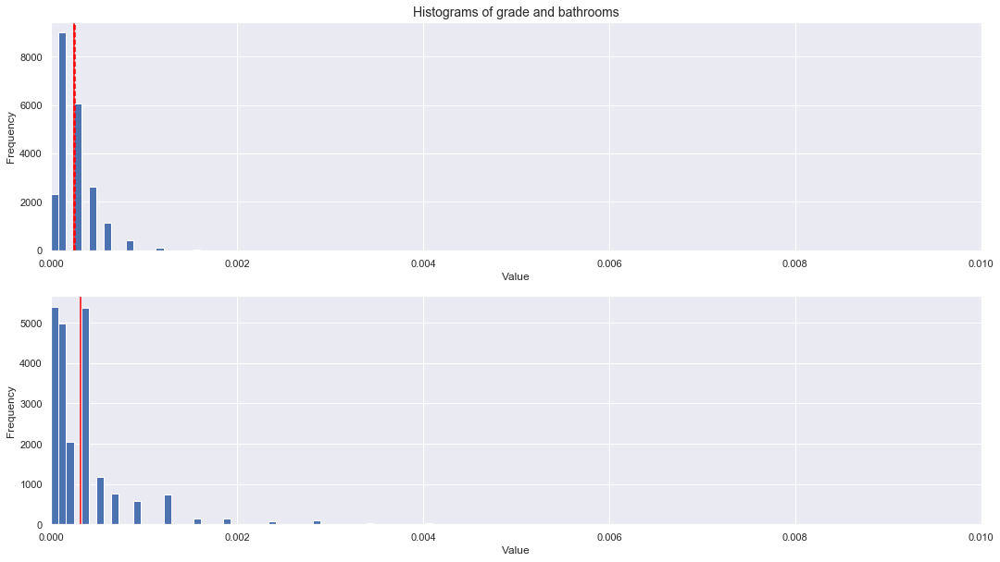


*** sqft_living
DegFreedom     2.279157e+04
Difference    -1.305525e-04
t-Statistic   -1.823996e+01
PValue         8.334978e-74
Low95CI       -1.445817e-04
High95CI      -1.165234e-04
dtype: float64


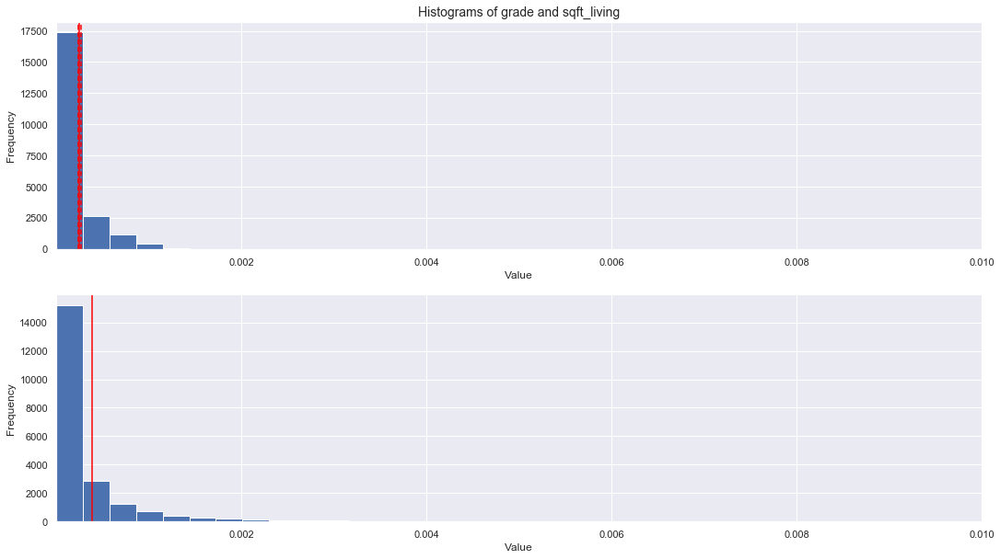


*** sqft_lot
DegFreedom     2.161878e+04
Difference    -9.057586e-04
t-Statistic   -9.722066e+00
PValue         2.697344e-22
Low95CI       -1.088369e-03
High95CI      -7.231479e-04
dtype: float64


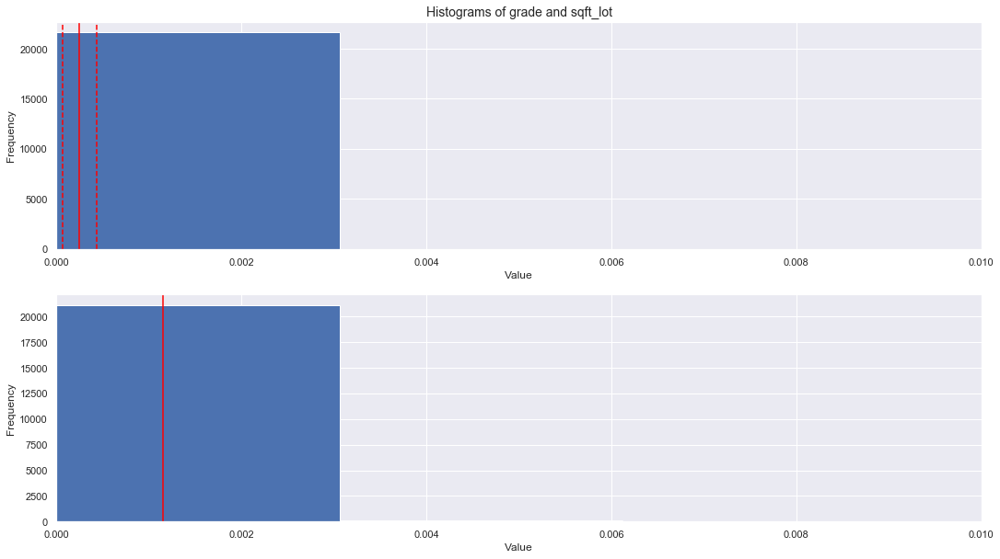


*** floors
DegFreedom      2.800938e+04
Difference     -7.473105e-05
t-Statistic    -2.322071e+01
PValue         3.681380e-118
Low95CI        -8.103906e-05
High95CI       -6.842304e-05
dtype: float64


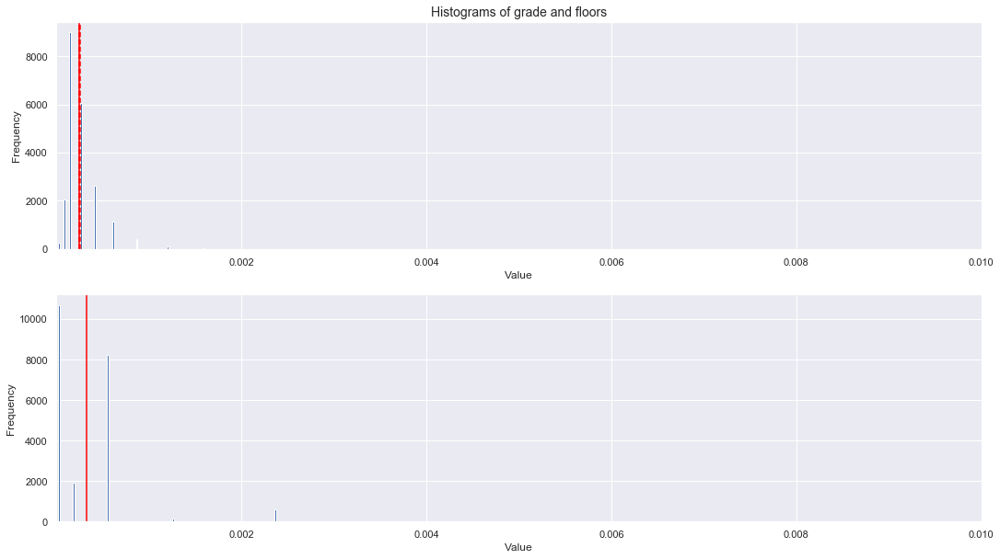


*** waterfront
DegFreedom     2.161630e+04
Difference    -1.250980e-03
t-Statistic   -1.069108e+01
PValue         1.306138e-26
Low95CI       -1.480332e-03
High95CI      -1.021629e-03
dtype: float64


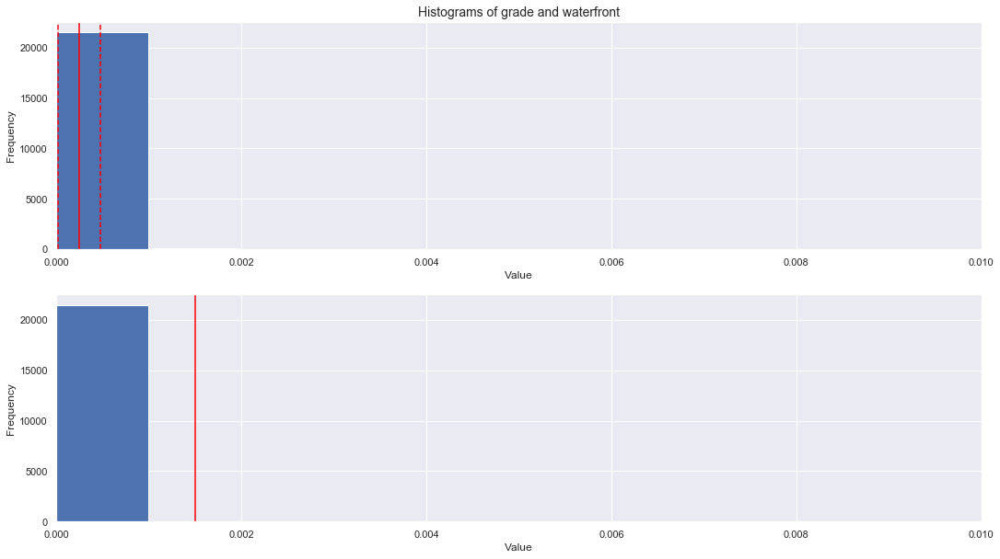


*** view
DegFreedom      2.165455e+04
Difference     -1.025244e-03
t-Statistic    -2.755002e+01
PValue         2.991244e-164
Low95CI        -1.098186e-03
High95CI       -9.523021e-04
dtype: float64


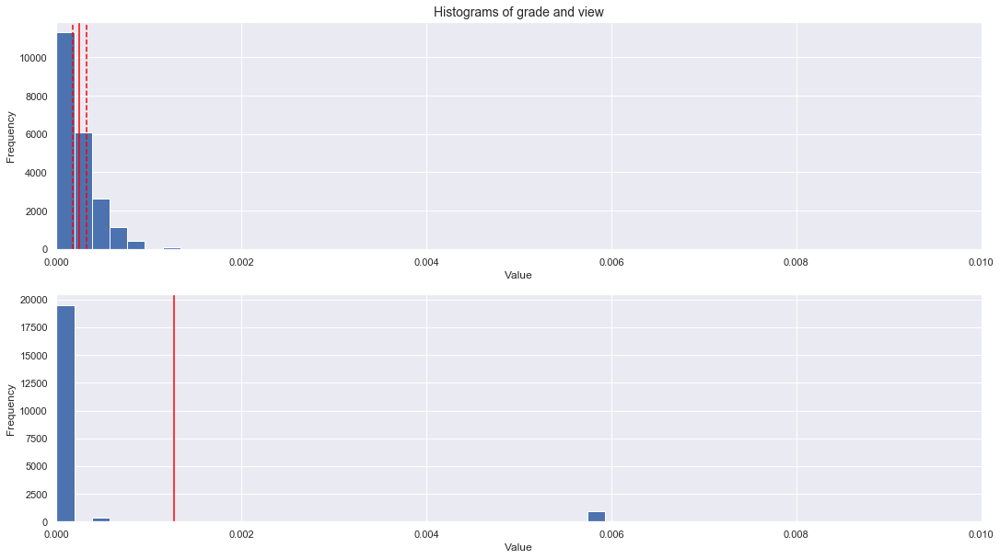


*** condition
DegFreedom     4.023652e+04
Difference    -1.135570e-05
t-Statistic   -5.868775e+00
PValue         4.424610e-09
Low95CI       -1.514822e-05
High95CI      -7.563183e-06
dtype: float64


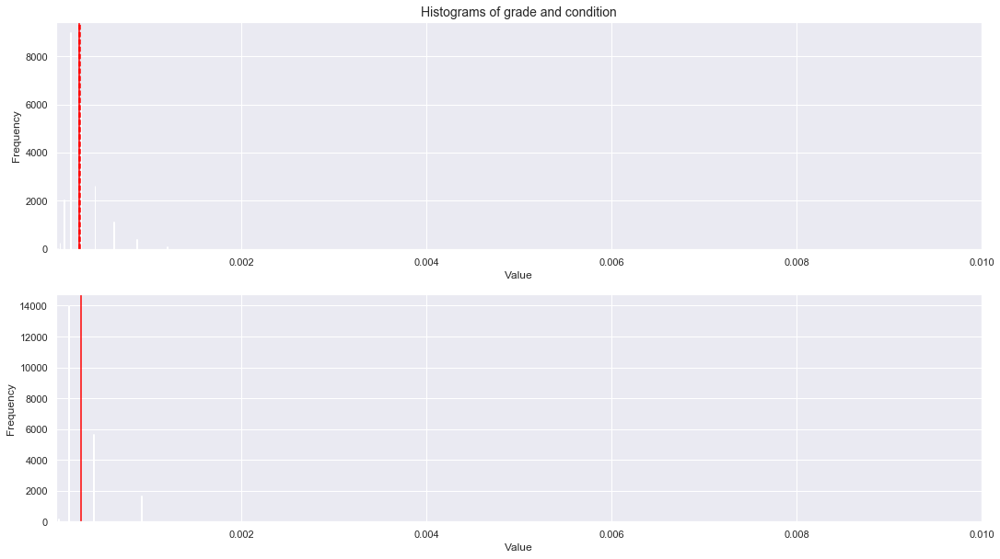


*** grade

*** sqft_above
DegFreedom      2.293567e+04
Difference     -1.454705e-04
t-Statistic    -2.149699e+01
PValue         1.668427e-101
Low95CI        -1.587343e-04
High95CI       -1.322067e-04
dtype: float64


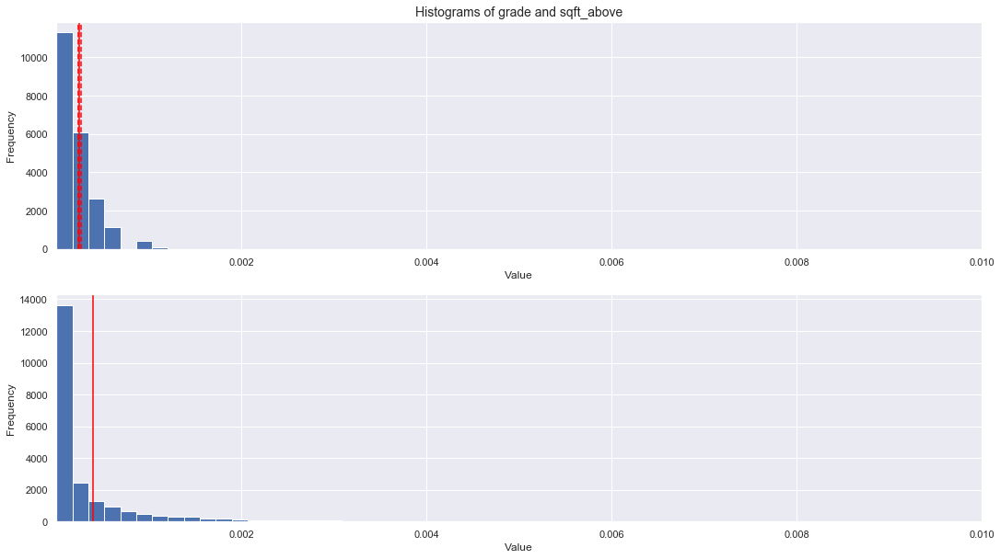


*** sqft_basement
DegFreedom      2.177918e+04
Difference     -5.132485e-04
t-Statistic    -2.729905e+01
PValue         2.255326e-161
Low95CI        -5.500997e-04
High95CI       -4.763972e-04
dtype: float64


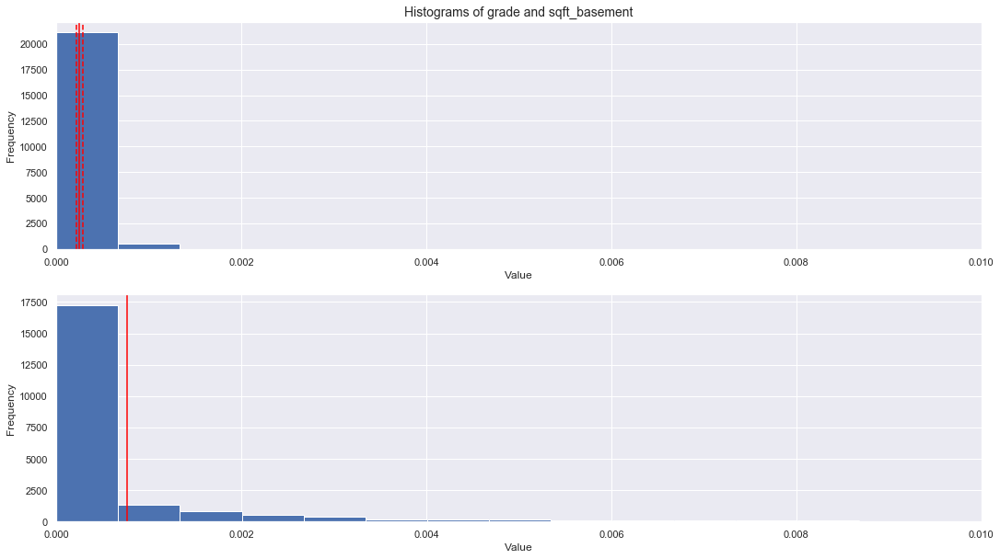


*** yr_built
DegFreedom     2.187960e+04
Difference     1.914316e-05
t-Statistic    1.635313e+01
PValue         9.350245e-60
Low95CI        1.684868e-05
High95CI       2.143764e-05
dtype: float64


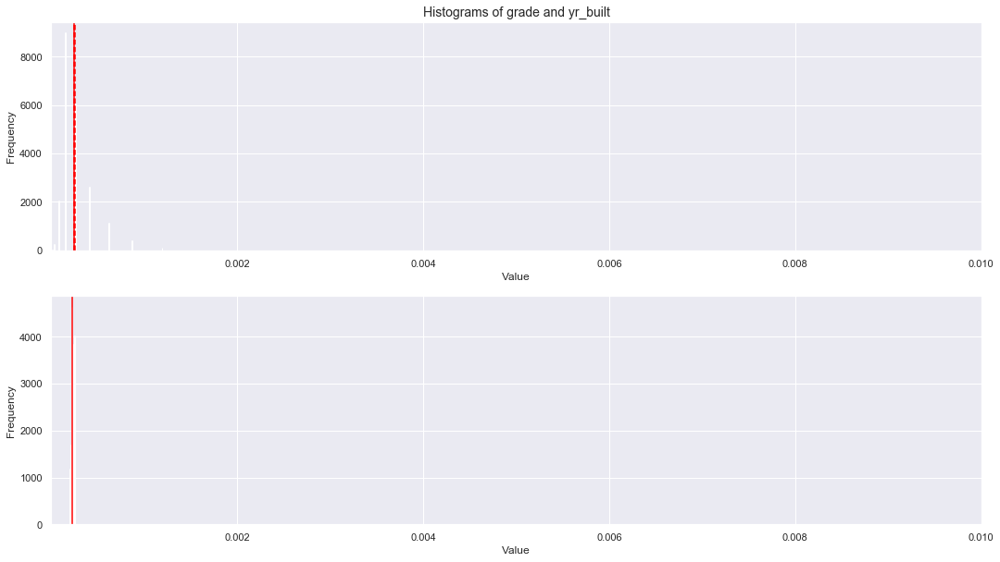


*** yr_renovated
DegFreedom      2.163604e+04
Difference     -1.279826e-03
t-Statistic    -2.585752e+01
PValue         3.208760e-145
Low95CI        -1.376841e-03
High95CI       -1.182812e-03
dtype: float64


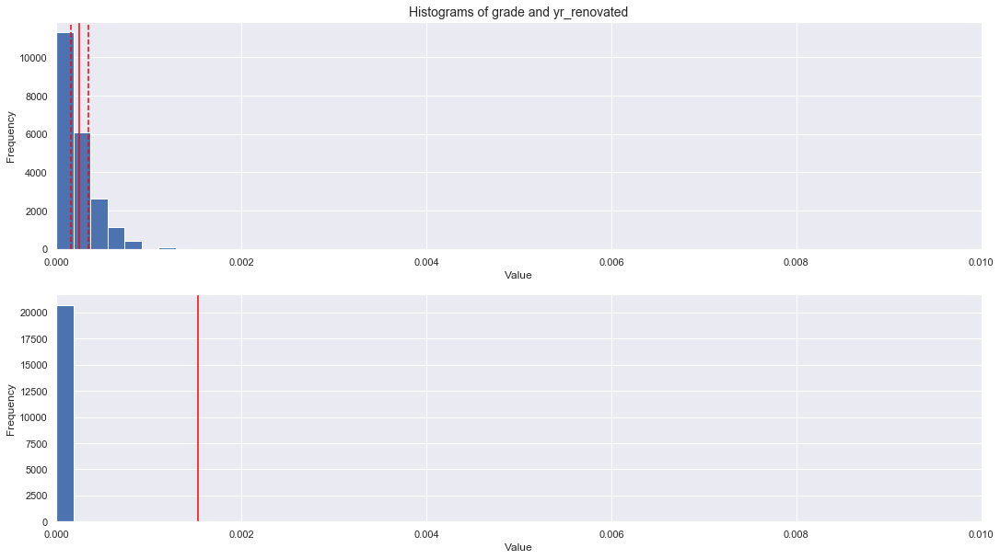


*** zipcode
DegFreedom     2.161237e+04
Difference     1.931865e-05
t-Statistic    1.655398e+01
PValue         3.568980e-61
Low95CI        1.703122e-05
High95CI       2.160607e-05
dtype: float64


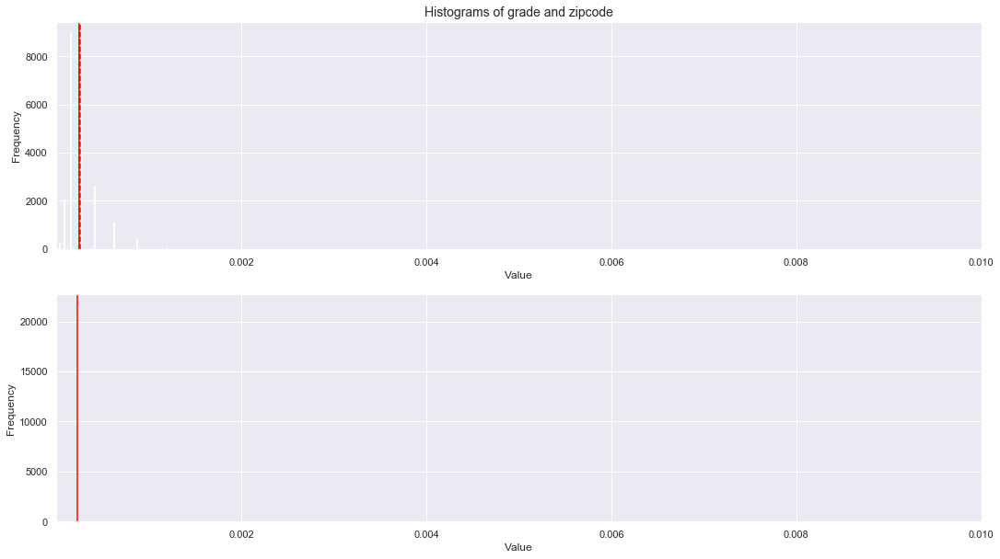


*** lat
DegFreedom     2.162238e+04
Difference     1.931214e-05
t-Statistic    1.654648e+01
PValue         4.034218e-61
Low95CI        1.702445e-05
High95CI       2.159983e-05
dtype: float64


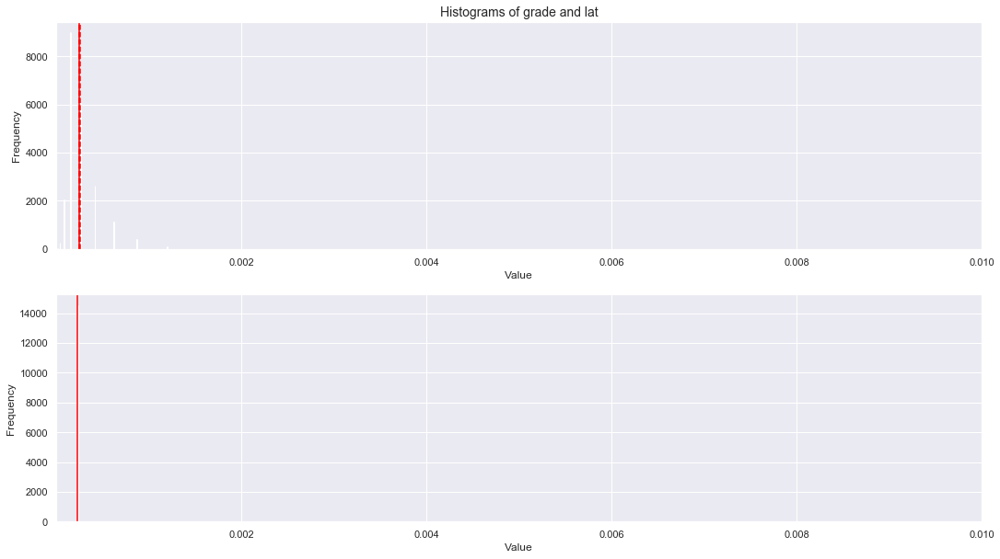


*** long
DegFreedom     2.161363e+04
Difference     1.931783e-05
t-Statistic    1.655303e+01
PValue         3.624435e-61
Low95CI        1.703037e-05
High95CI       2.160528e-05
dtype: float64


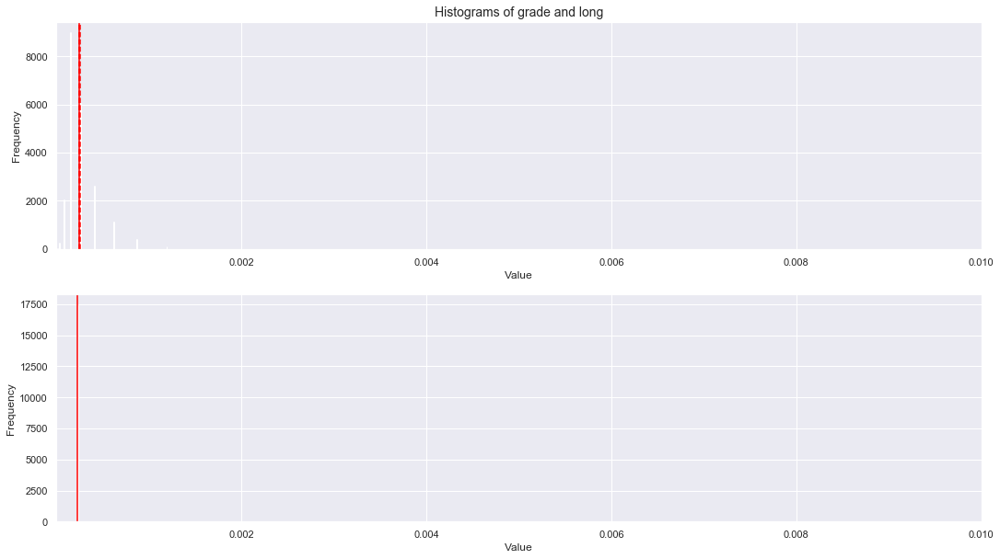


*** sqft_living15
DegFreedom     2.593833e+04
Difference    -7.543252e-05
t-Statistic   -1.958737e+01
PValue         8.134426e-85
Low95CI       -8.298085e-05
High95CI      -6.788420e-05
dtype: float64


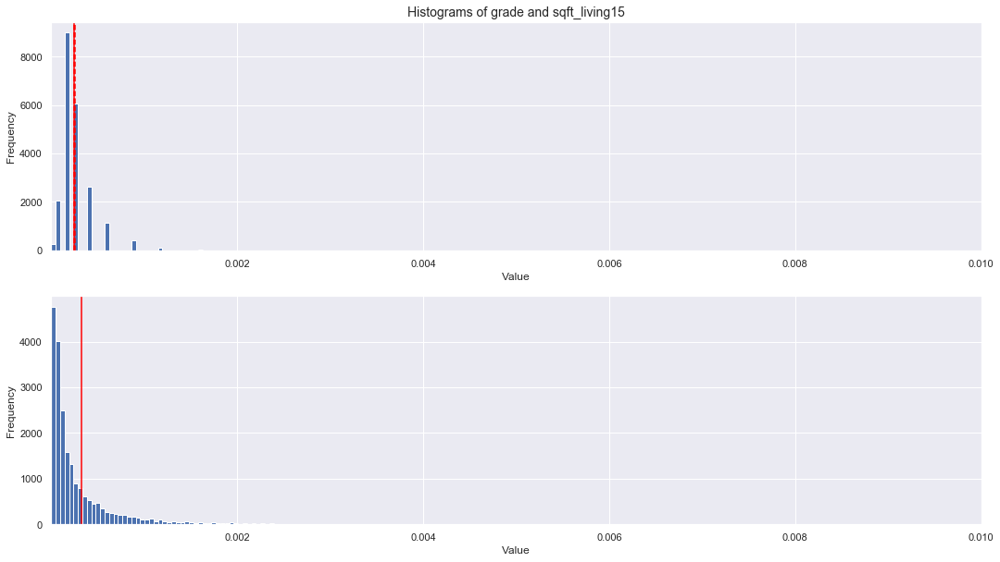


*** sqft_lot15
DegFreedom     2.162078e+04
Difference    -9.944877e-04
t-Statistic   -1.214204e+01
PValue         8.148340e-34
Low95CI       -1.155027e-03
High95CI      -8.339488e-04
dtype: float64


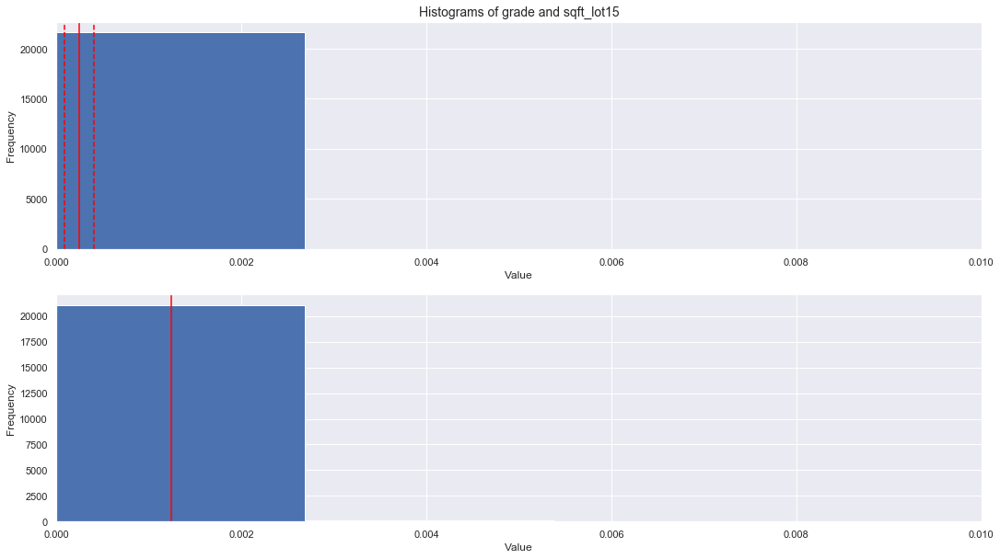

In [51]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['grade', item]
    helperBay_tTest(bayesian_df, features)

### Feature: sqft_above  
> Based upon the results below, the following features reject the null hypothesis of feature 'sqft_above':
>       - sqft_living


*** price
DegFreedom     2.443207e+04
Difference    -1.988171e-04
t-Statistic   -7.396545e+00
PValue         1.442743e-13
Low95CI       -2.515030e-04
High95CI      -1.461312e-04
dtype: float64


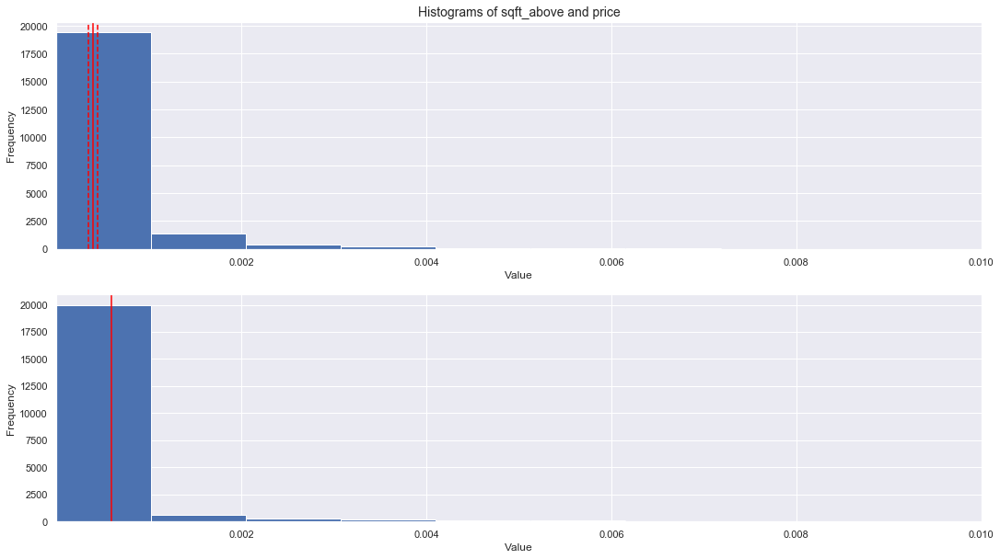


*** log_price
DegFreedom      2.167683e+04
Difference      1.634819e-04
t-Statistic     2.450773e+01
PValue         7.365773e-131
Low95CI         1.504070e-04
High95CI        1.765568e-04
dtype: float64


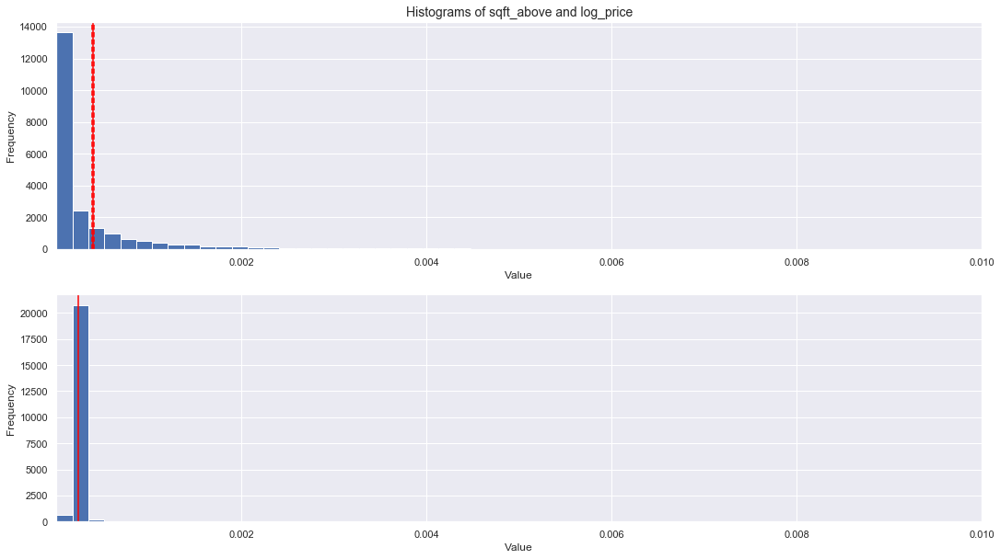


*** bedrooms
DegFreedom     4.309294e+04
Difference     1.060431e-04
t-Statistic    1.093473e+01
PValue         8.554567e-28
Low95CI        8.703517e-05
High95CI       1.250510e-04
dtype: float64


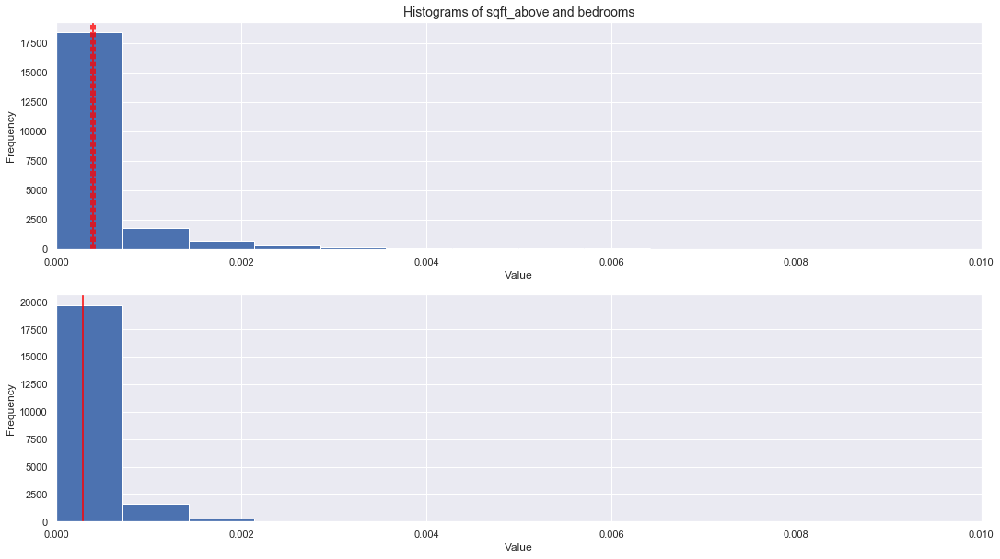


*** bathrooms
DegFreedom     3.320544e+04
Difference     7.368915e-05
t-Statistic    9.730006e+00
PValue         2.405675e-22
Low95CI        5.884504e-05
High95CI       8.853327e-05
dtype: float64


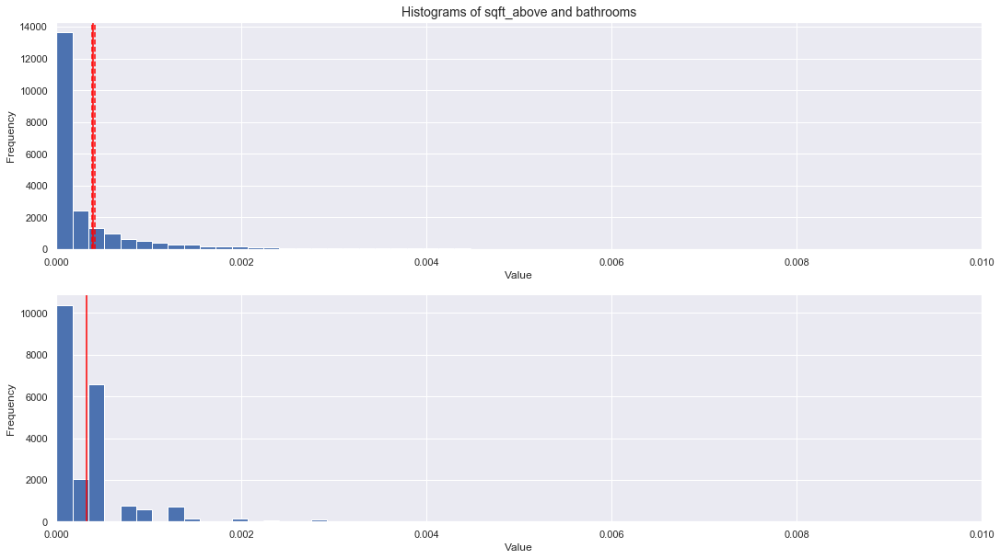


*** sqft_living
DegFreedom     43080.768262
Difference         0.000015
t-Statistic        1.536232
PValue             0.124489
Low95CI           -0.000004
High95CI           0.000034
dtype: float64


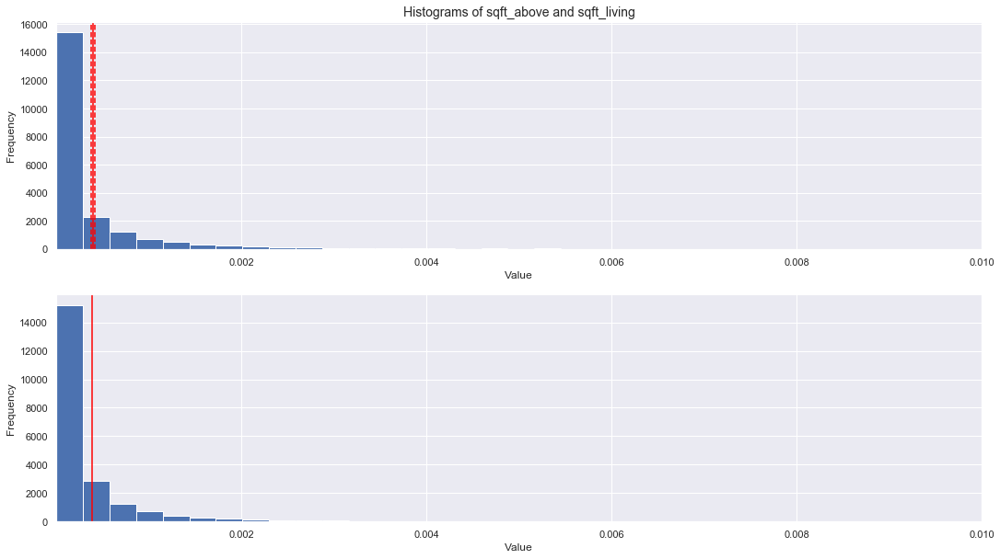


*** sqft_lot
DegFreedom     2.183329e+04
Difference    -7.602881e-04
t-Statistic   -8.140470e+00
PValue         4.146333e-16
Low95CI       -9.433512e-04
High95CI      -5.772250e-04
dtype: float64


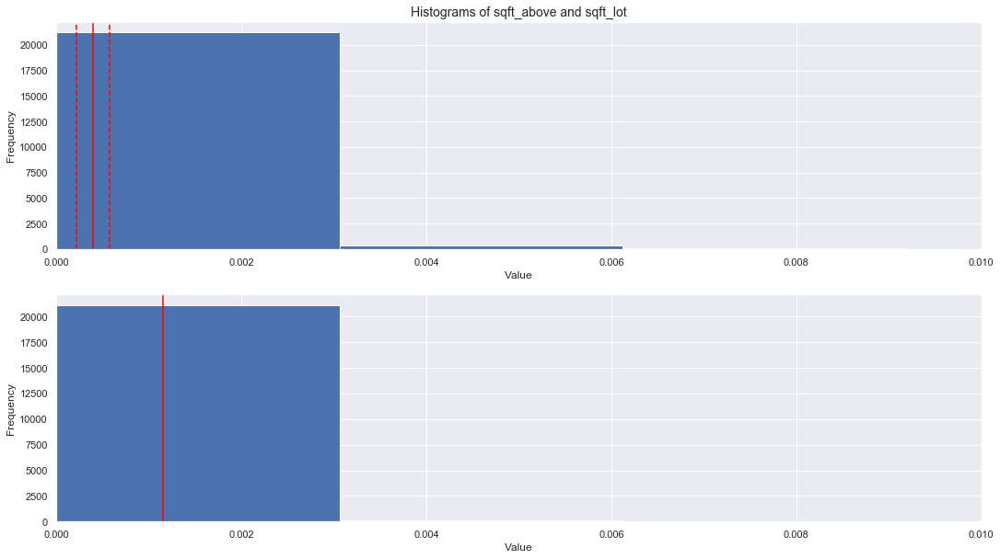


*** floors
DegFreedom     3.001862e+04
Difference     7.073945e-05
t-Statistic    9.677983e+00
PValue         4.029362e-22
Low95CI        5.641287e-05
High95CI       8.506603e-05
dtype: float64


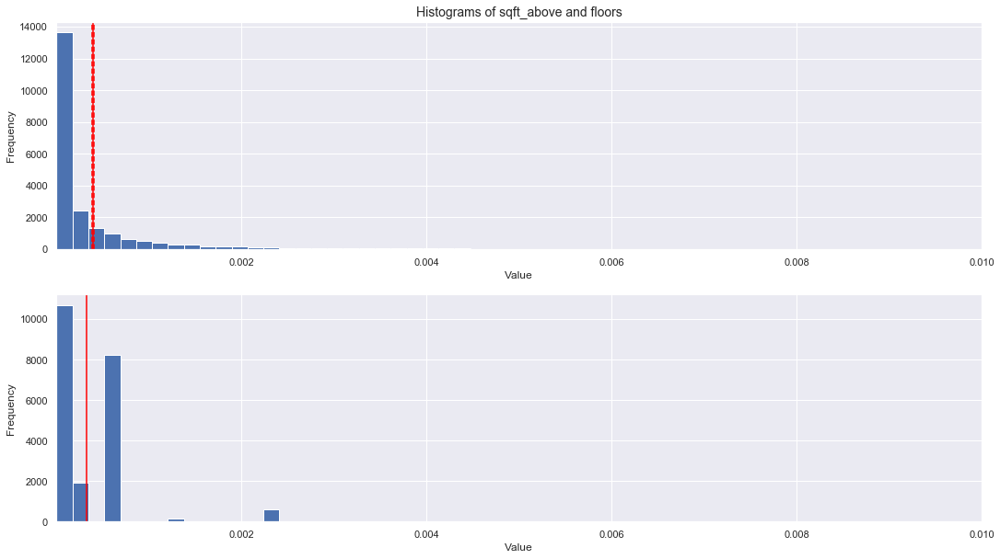


*** waterfront
DegFreedom     2.175228e+04
Difference    -1.105510e-03
t-Statistic   -9.433038e+00
PValue         4.371123e-21
Low95CI       -1.335222e-03
High95CI      -8.757980e-04
dtype: float64


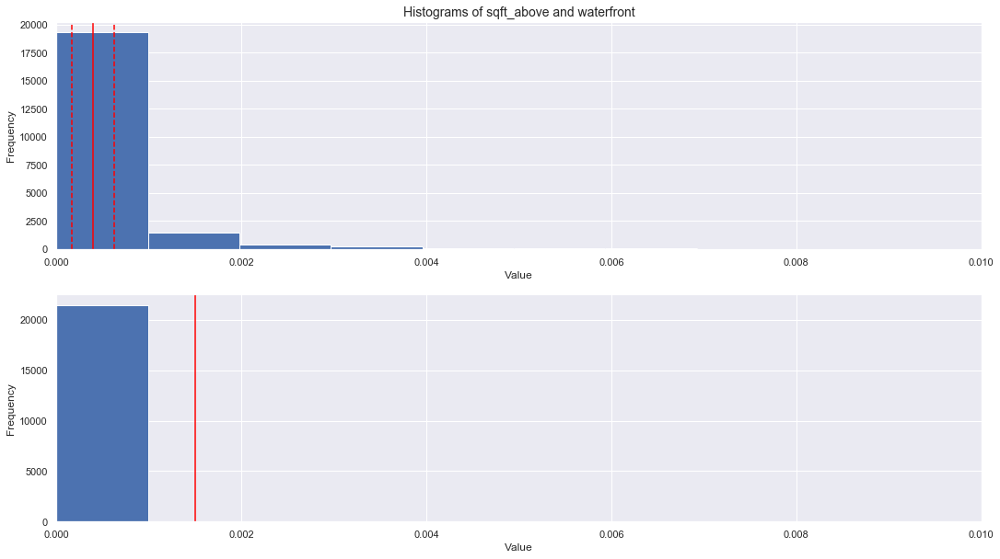


*** view
DegFreedom      2.299868e+04
Difference     -8.797736e-04
t-Statistic    -2.328173e+01
PValue         1.593995e-118
Low95CI        -9.538409e-04
High95CI       -8.057063e-04
dtype: float64


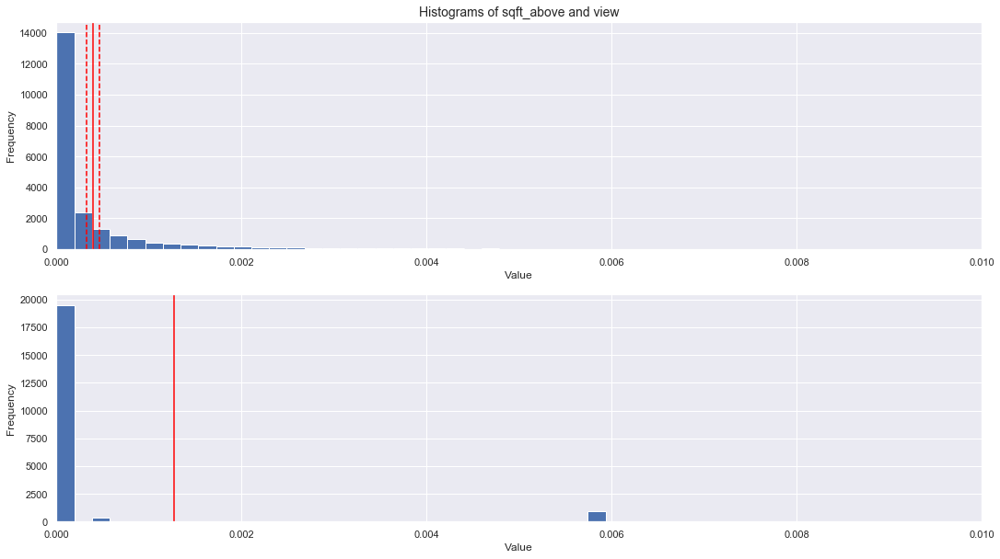


*** condition
DegFreedom     2.392274e+04
Difference     1.341148e-04
t-Statistic    1.960175e+01
PValue         6.929981e-85
Low95CI        1.207041e-04
High95CI       1.475255e-04
dtype: float64


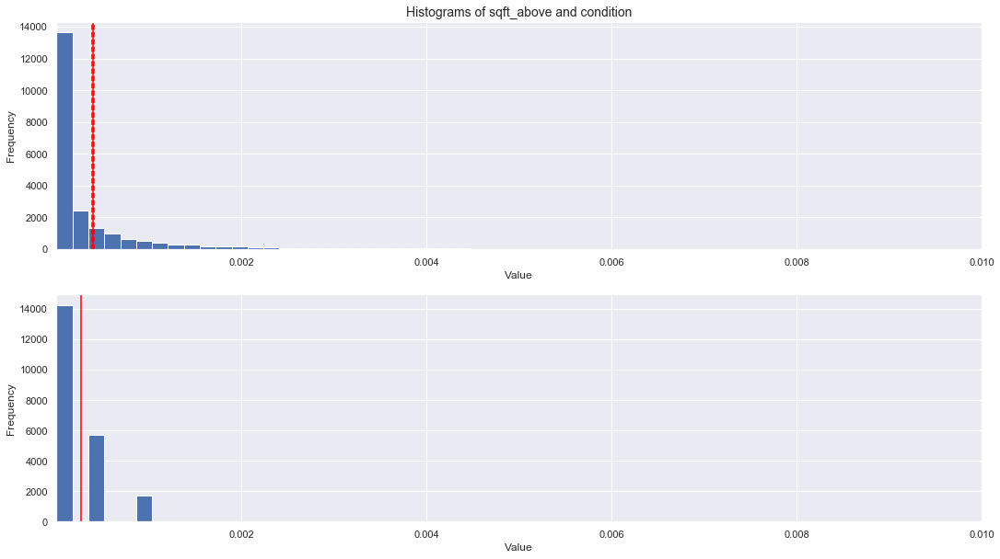


*** grade
DegFreedom      2.293567e+04
Difference      1.454705e-04
t-Statistic     2.149699e+01
PValue         1.668427e-101
Low95CI         1.322067e-04
High95CI        1.587343e-04
dtype: float64


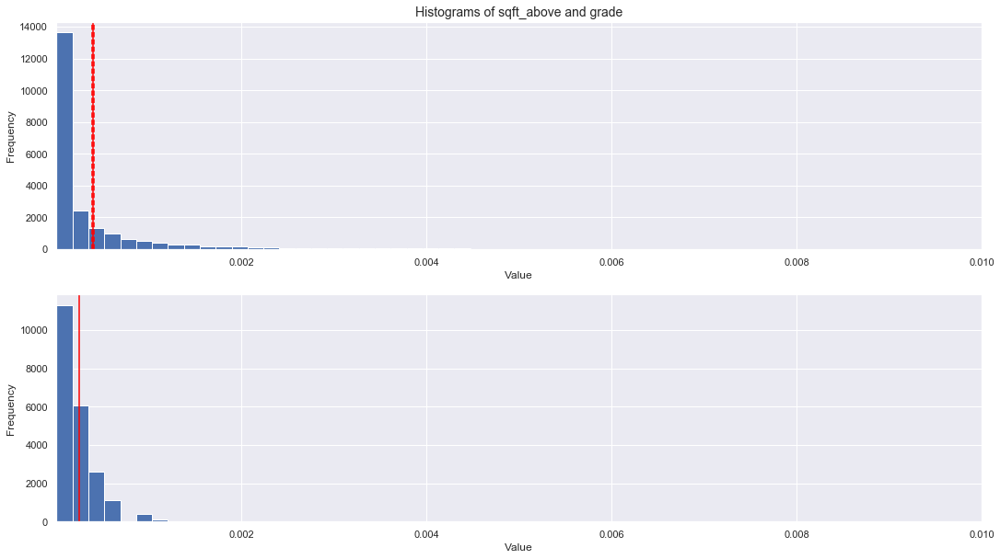


*** sqft_above

*** sqft_basement
DegFreedom     2.698063e+04
Difference    -3.677780e-04
t-Statistic   -1.846883e+01
PValue         1.078440e-75
Low95CI       -4.068093e-04
High95CI      -3.287466e-04
dtype: float64


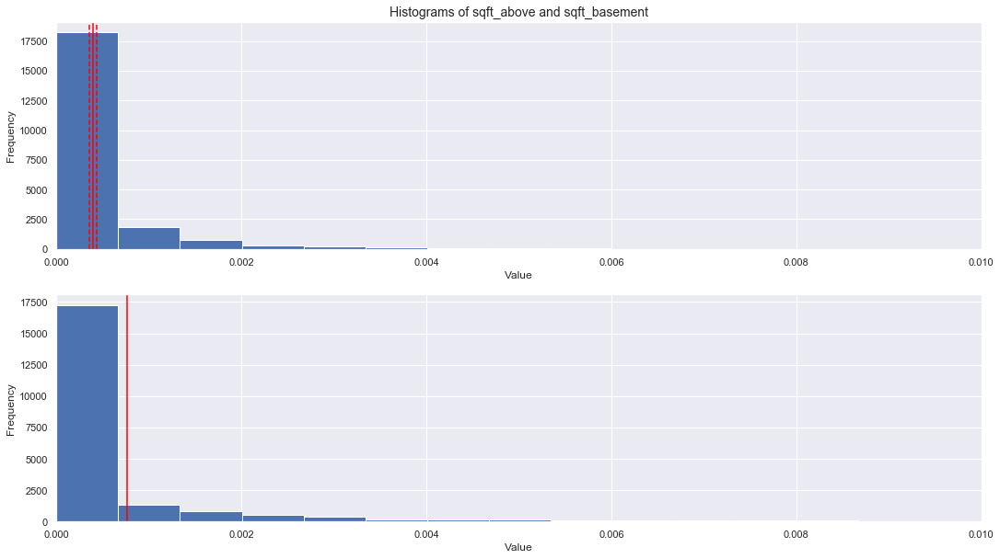


*** yr_built
DegFreedom      2.162020e+04
Difference      1.646137e-04
t-Statistic     2.469355e+01
PValue         8.657456e-133
Low95CI         1.515473e-04
High95CI        1.776800e-04
dtype: float64


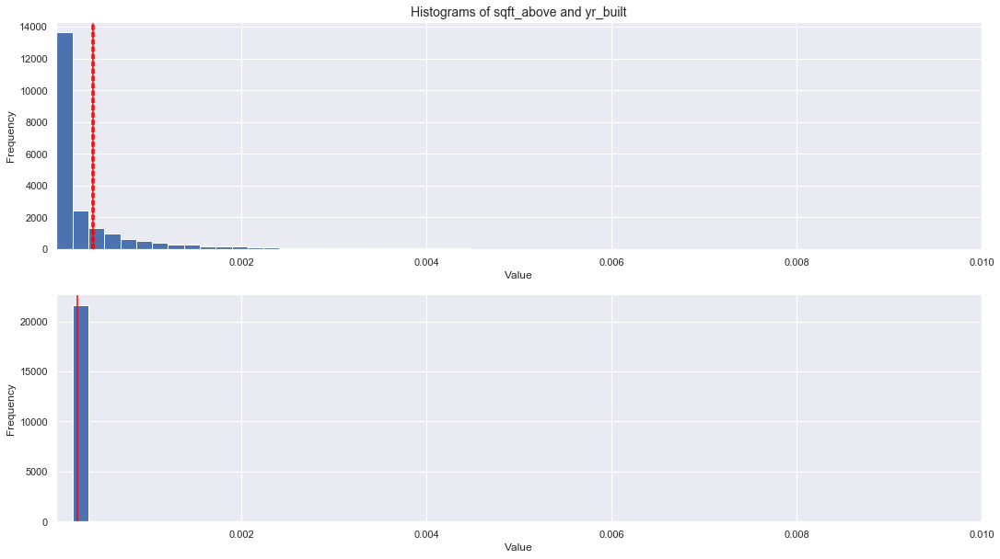


*** yr_renovated
DegFreedom      2.239611e+04
Difference     -1.134356e-03
t-Statistic    -2.271960e+01
PValue         5.428186e-113
Low95CI        -1.232219e-03
High95CI       -1.036493e-03
dtype: float64


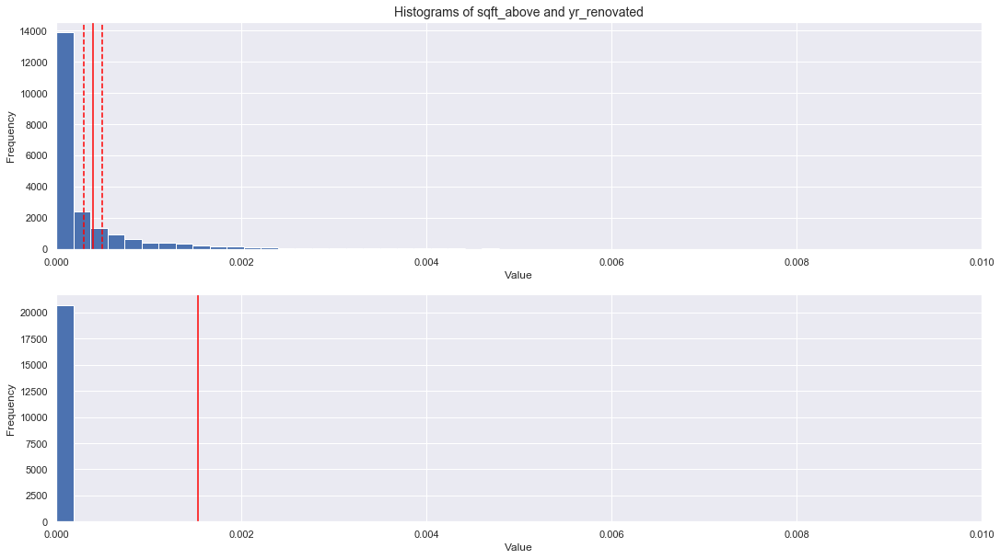


*** zipcode
DegFreedom      2.161201e+04
Difference      1.647891e-04
t-Statistic     2.472221e+01
PValue         4.349397e-133
Low95CI         1.517240e-04
High95CI        1.778543e-04
dtype: float64


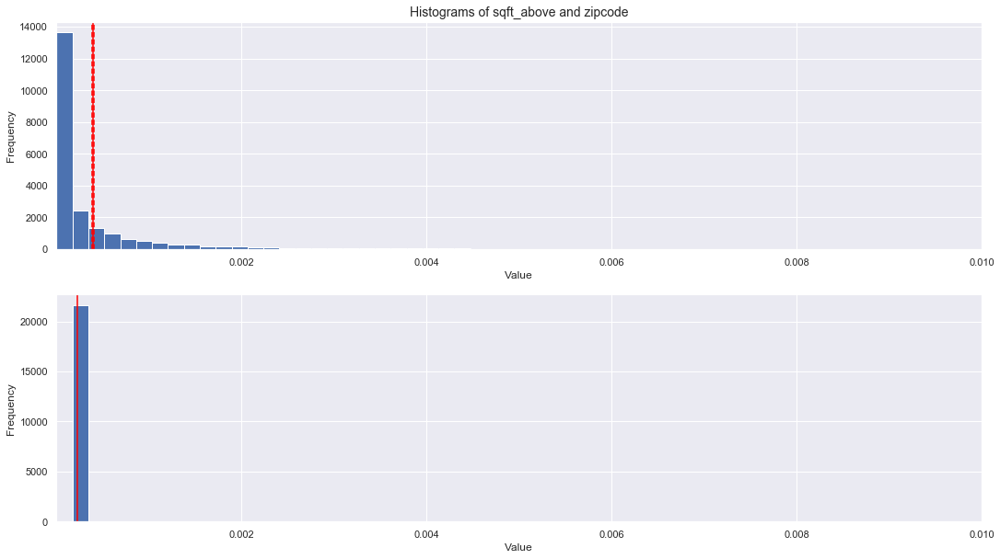


*** lat
DegFreedom      2.161232e+04
Difference      1.647826e-04
t-Statistic     2.472115e+01
PValue         4.462045e-133
Low95CI         1.517175e-04
High95CI        1.778478e-04
dtype: float64


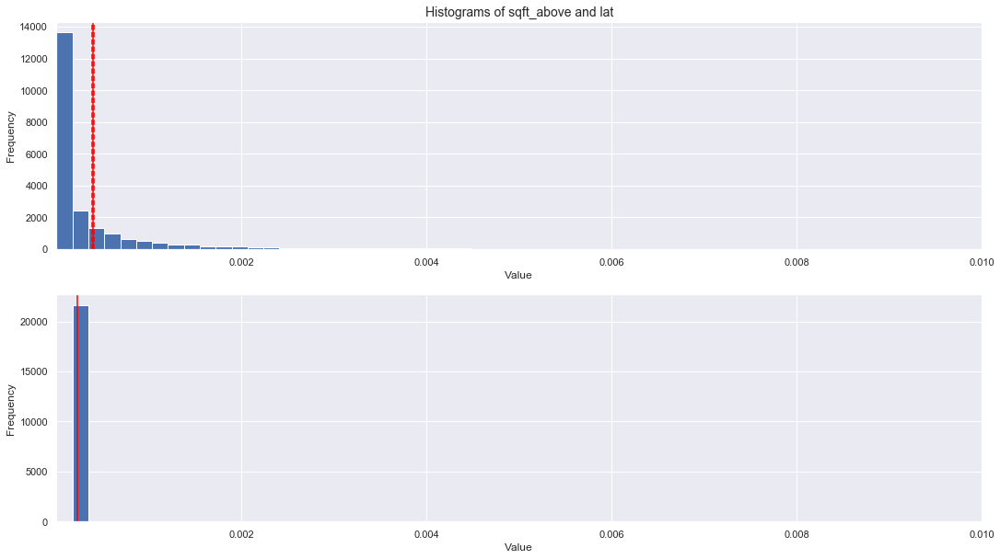


*** long
DegFreedom      2.161205e+04
Difference      1.647883e-04
t-Statistic     2.472208e+01
PValue         4.363410e-133
Low95CI         1.517232e-04
High95CI        1.778535e-04
dtype: float64


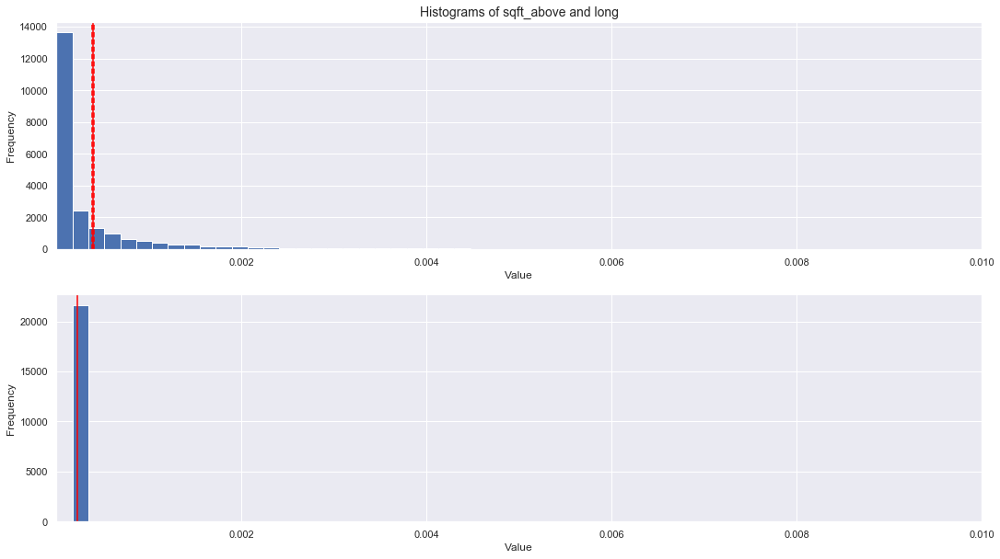


*** sqft_living15
DegFreedom     3.361234e+04
Difference     7.003797e-05
t-Statistic    9.204412e+00
PValue         3.628074e-20
Low95CI        5.512373e-05
High95CI       8.495222e-05
dtype: float64


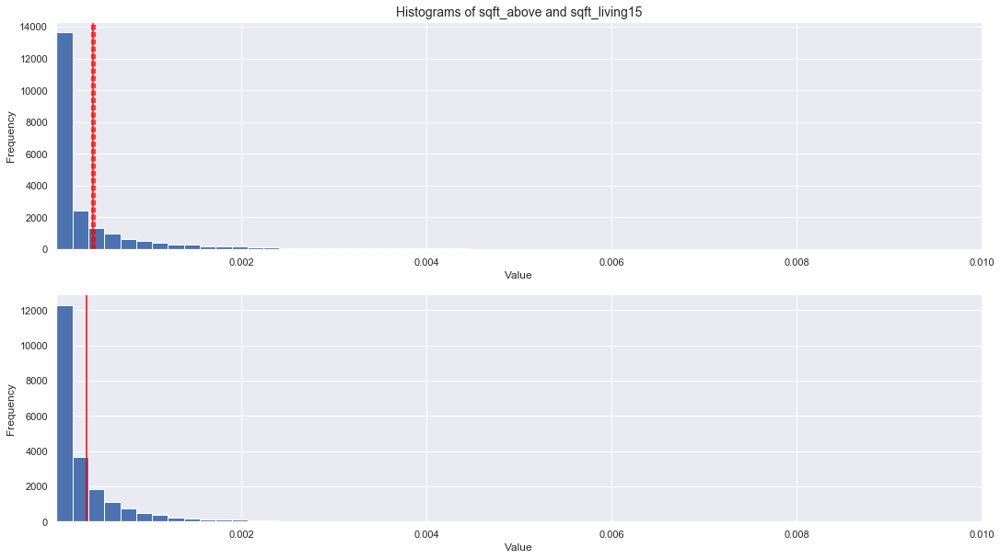


*** sqft_lot15
DegFreedom     2.189833e+04
Difference    -8.490172e-04
t-Statistic   -1.033282e+01
PValue         5.713850e-25
Low95CI       -1.010071e-03
High95CI      -6.879639e-04
dtype: float64


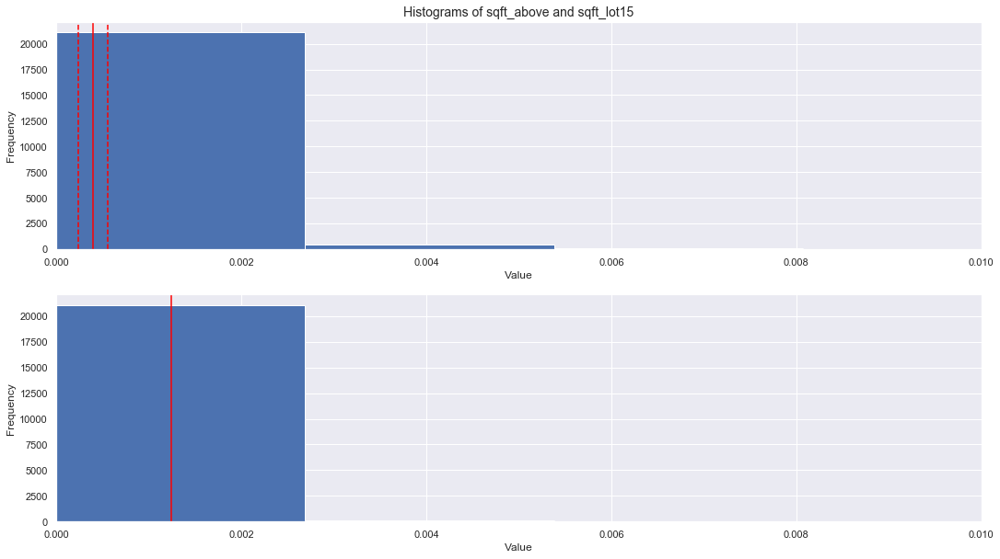

In [52]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_above', item]
    helperBay_tTest(bayesian_df, features)

### Feature: sqft_living  
> Based upon the results below, the following feature accepts the null hypothesis of feature 'sqft_living':
>       - sqft_above


*** price
DegFreedom     2.477367e+04
Difference    -2.137351e-04
t-Statistic   -7.921782e+00
PValue         2.439125e-15
Low95CI       -2.666188e-04
High95CI      -1.608513e-04
dtype: float64


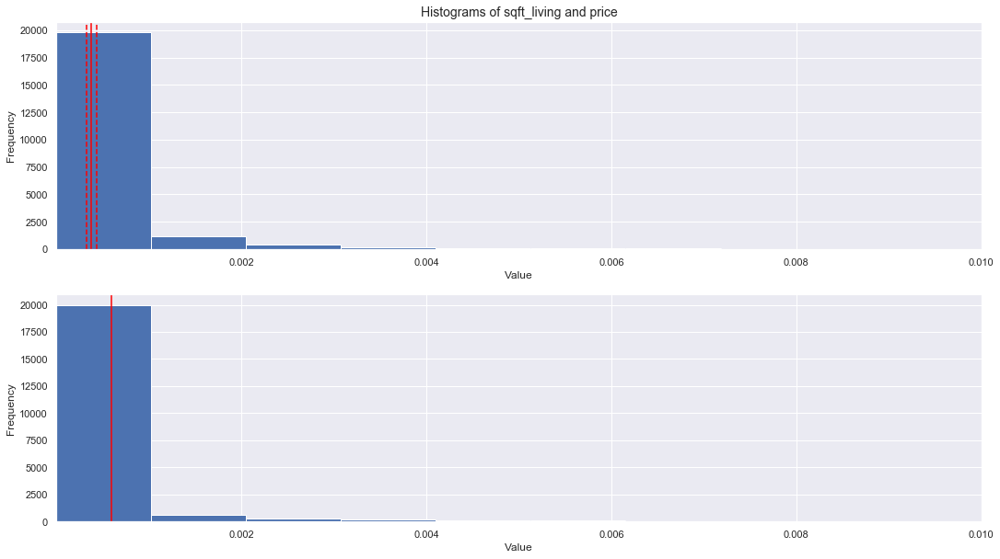


*** log_price
DegFreedom     2.166976e+04
Difference     1.485639e-04
t-Statistic    2.102388e+01
PValue         3.703025e-97
Low95CI        1.347132e-04
High95CI       1.624147e-04
dtype: float64


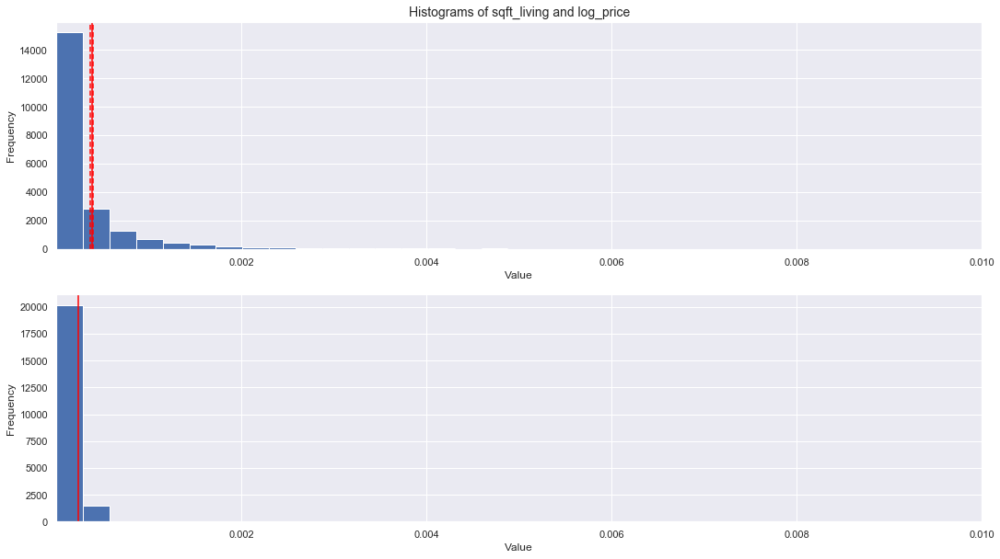


*** bedrooms
DegFreedom     4.322373e+04
Difference     9.112514e-05
t-Statistic    9.136065e+00
PValue         6.749059e-20
Low95CI        7.157547e-05
High95CI       1.106748e-04
dtype: float64


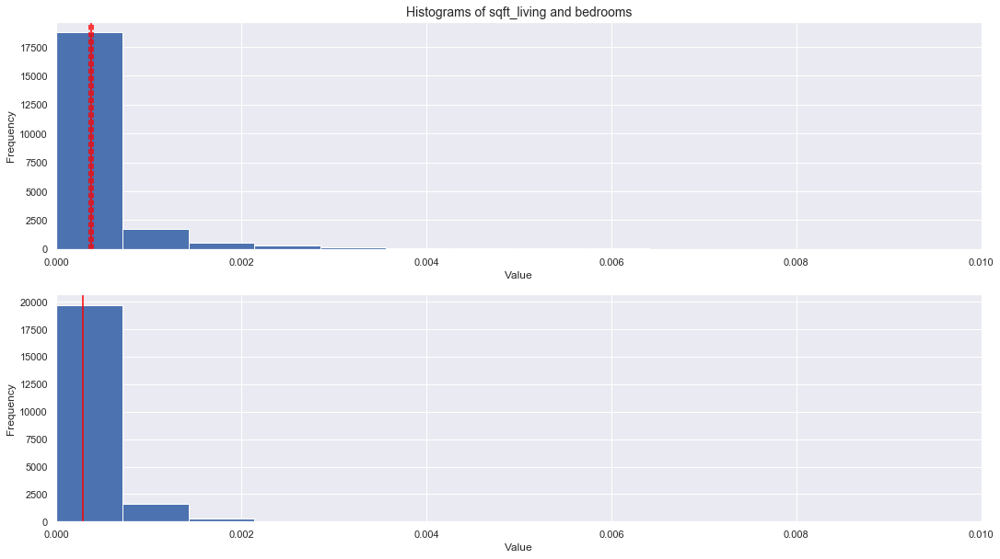


*** bathrooms
DegFreedom     3.211025e+04
Difference     5.877120e-05
t-Statistic    7.416636e+00
PValue         1.230972e-13
Low95CI        4.323939e-05
High95CI       7.430301e-05
dtype: float64


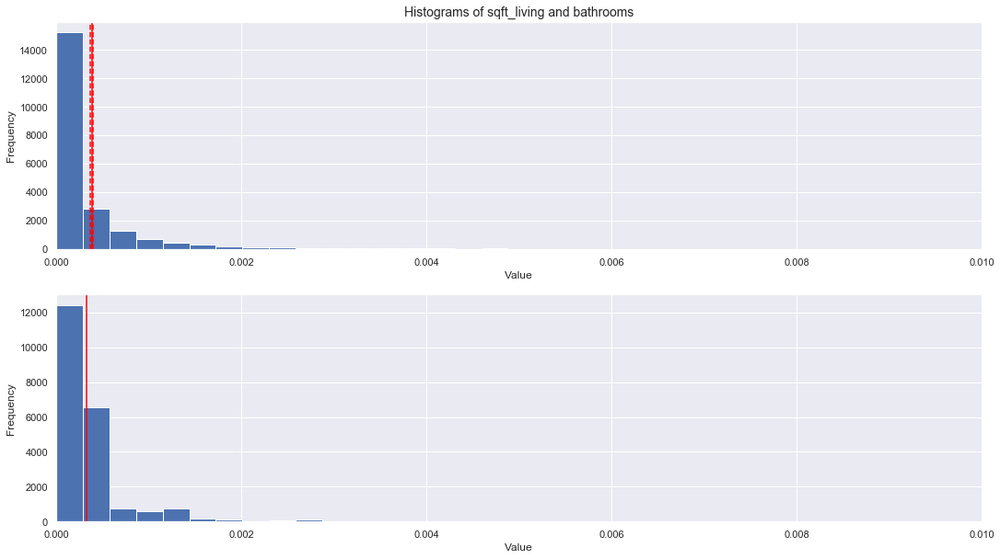


*** sqft_living

*** sqft_lot
DegFreedom     2.186037e+04
Difference    -7.752061e-04
t-Statistic   -8.297612e+00
PValue         1.123051e-16
Low95CI       -9.583262e-04
High95CI      -5.920859e-04
dtype: float64


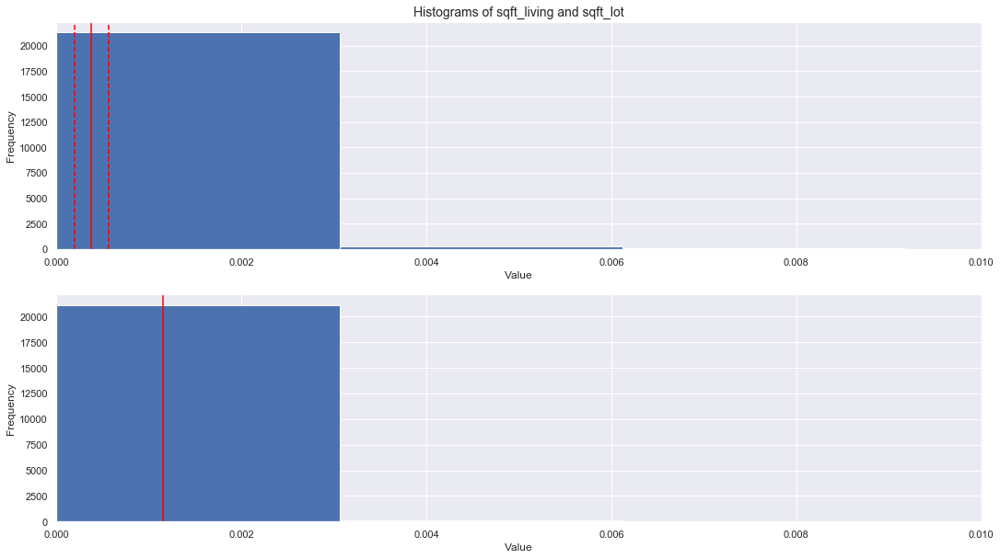


*** floors
DegFreedom     2.916332e+04
Difference     5.582150e-05
t-Statistic    7.275766e+00
PValue         3.531427e-13
Low95CI        4.078354e-05
High95CI       7.085945e-05
dtype: float64


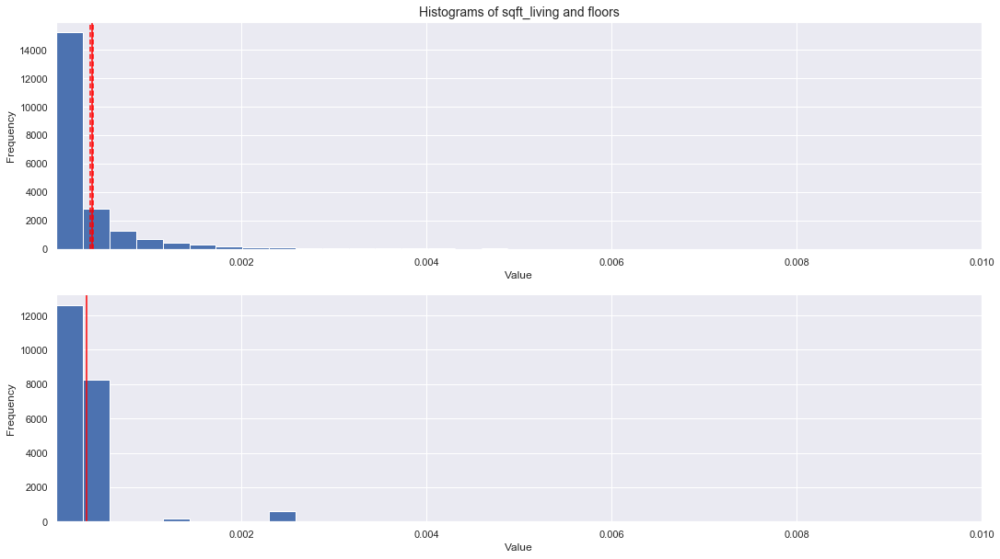


*** waterfront
DegFreedom     2.176944e+04
Difference    -1.120428e-03
t-Statistic   -9.558437e+00
PValue         1.318145e-21
Low95CI       -1.350185e-03
High95CI      -8.906705e-04
dtype: float64


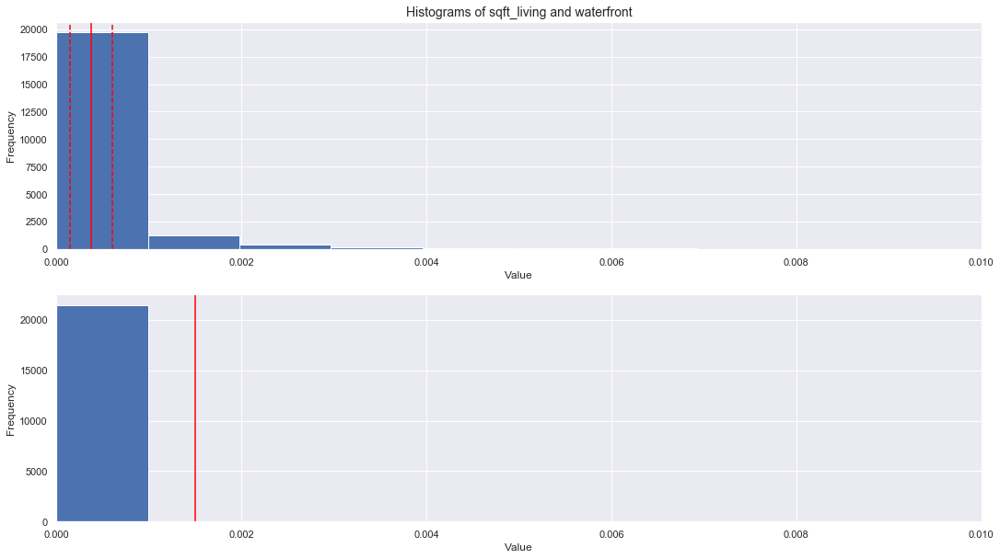


*** view
DegFreedom      2.316796e+04
Difference     -8.946916e-04
t-Statistic    -2.363156e+01
PValue         5.072846e-122
Low95CI        -9.688997e-04
High95CI       -8.204834e-04
dtype: float64


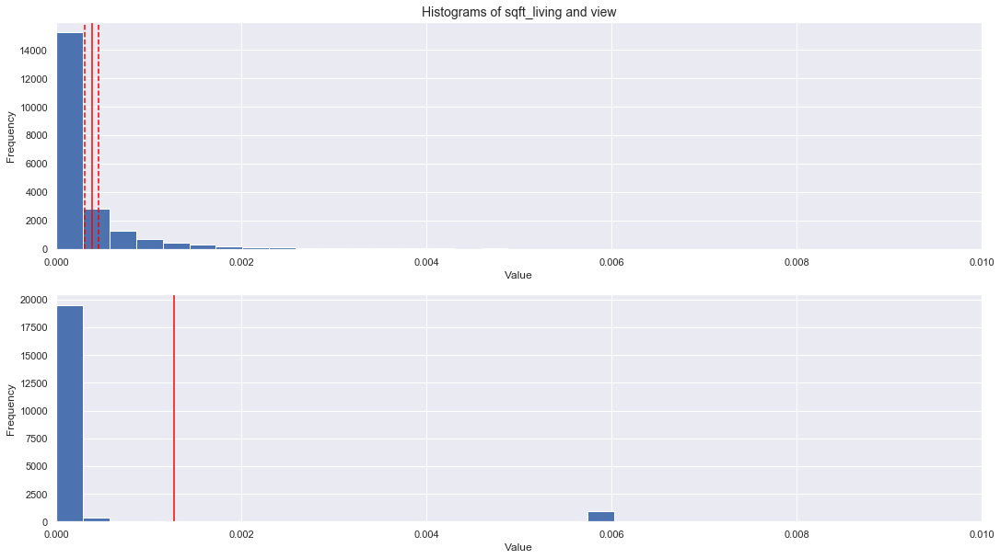


*** condition
DegFreedom     2.367201e+04
Difference     1.191968e-04
t-Statistic    1.649004e+01
PValue         9.445186e-61
Low95CI        1.050287e-04
High95CI       1.333650e-04
dtype: float64


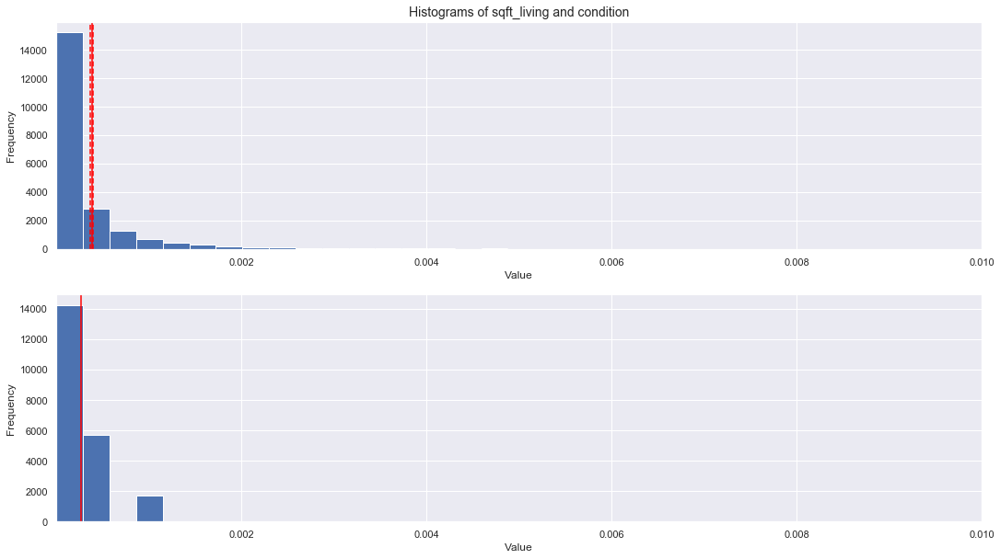


*** grade
DegFreedom     2.279157e+04
Difference     1.305525e-04
t-Statistic    1.823996e+01
PValue         8.334978e-74
Low95CI        1.165234e-04
High95CI       1.445817e-04
dtype: float64


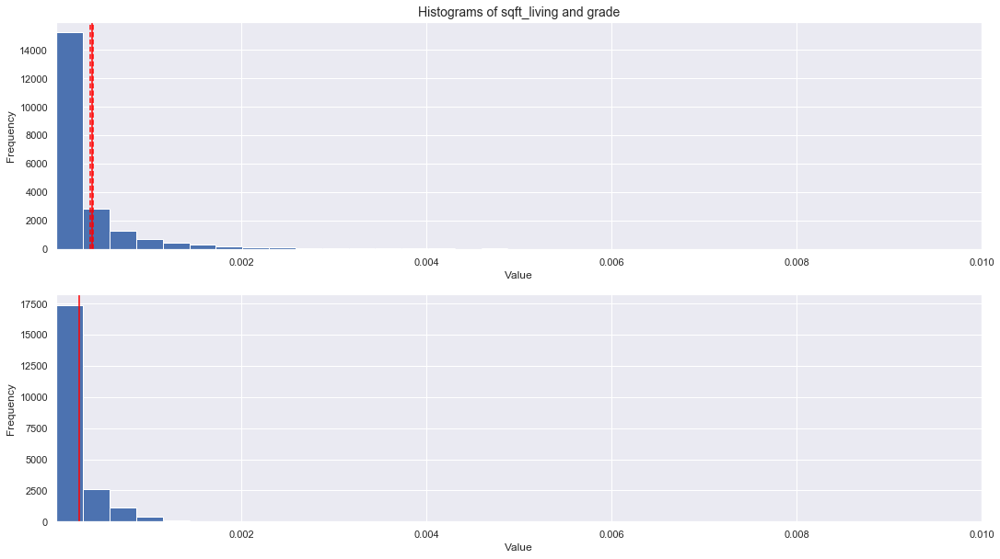


*** sqft_above
DegFreedom     43080.768262
Difference        -0.000015
t-Statistic       -1.536232
PValue             0.124489
Low95CI           -0.000034
High95CI           0.000004
dtype: float64


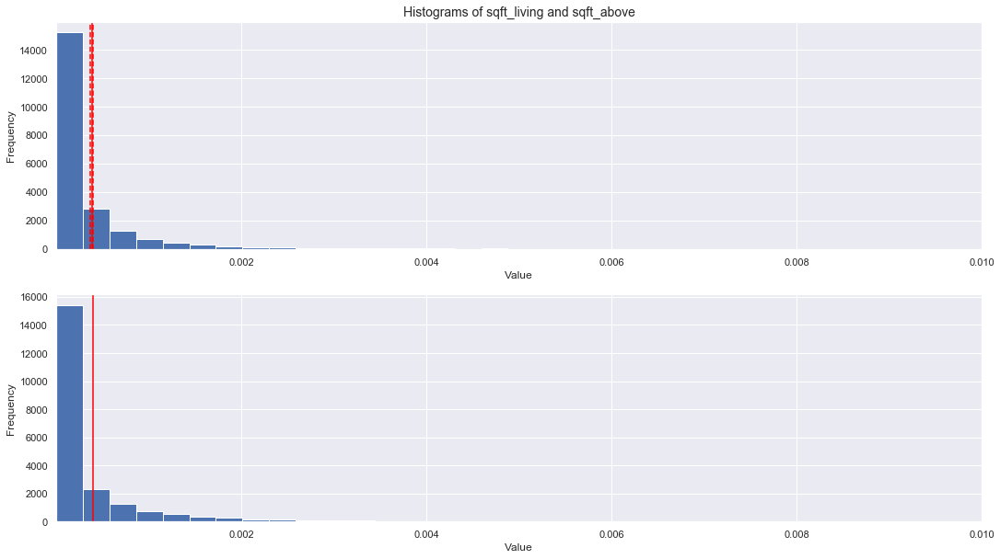


*** sqft_basement
DegFreedom     2.761320e+04
Difference    -3.826959e-04
t-Statistic   -1.908756e+01
PValue         1.061477e-80
Low95CI       -4.219939e-04
High95CI      -3.433979e-04
dtype: float64


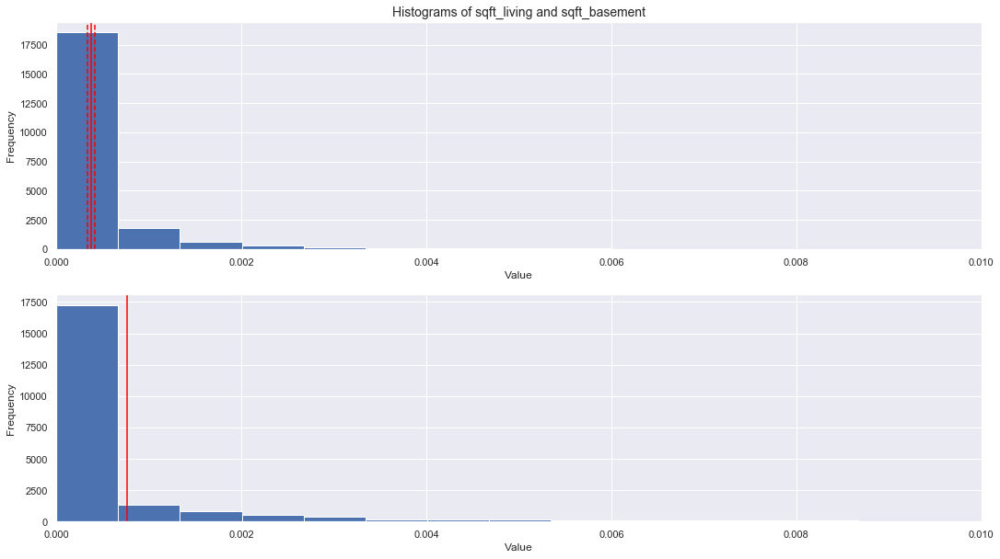


*** yr_built
DegFreedom     2.161931e+04
Difference     1.496957e-04
t-Statistic    2.119640e+01
PValue         1.041422e-98
Low95CI        1.358530e-04
High95CI       1.635384e-04
dtype: float64


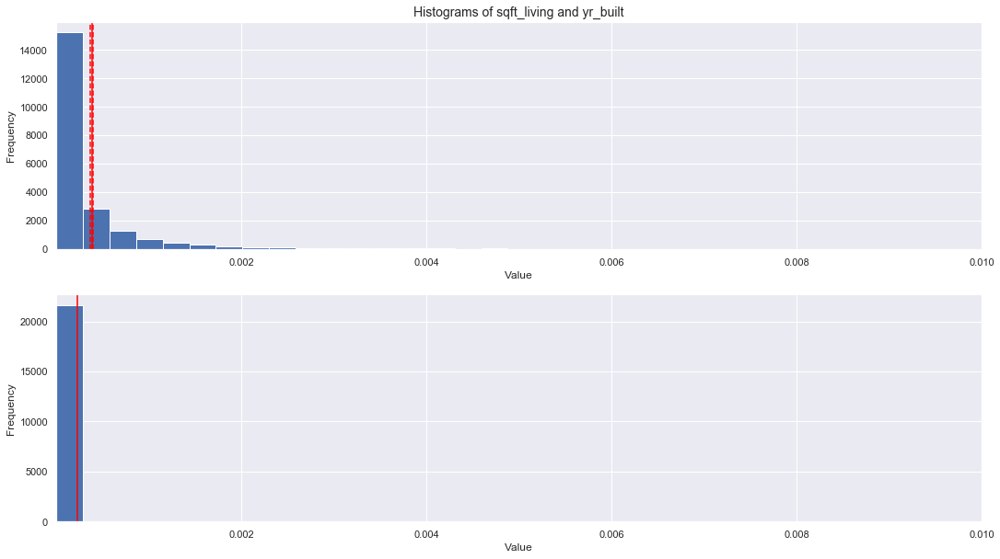


*** yr_renovated
DegFreedom      2.249199e+04
Difference     -1.149274e-03
t-Statistic    -2.299333e+01
PValue         1.171666e-115
Low95CI        -1.247244e-03
High95CI       -1.051304e-03
dtype: float64


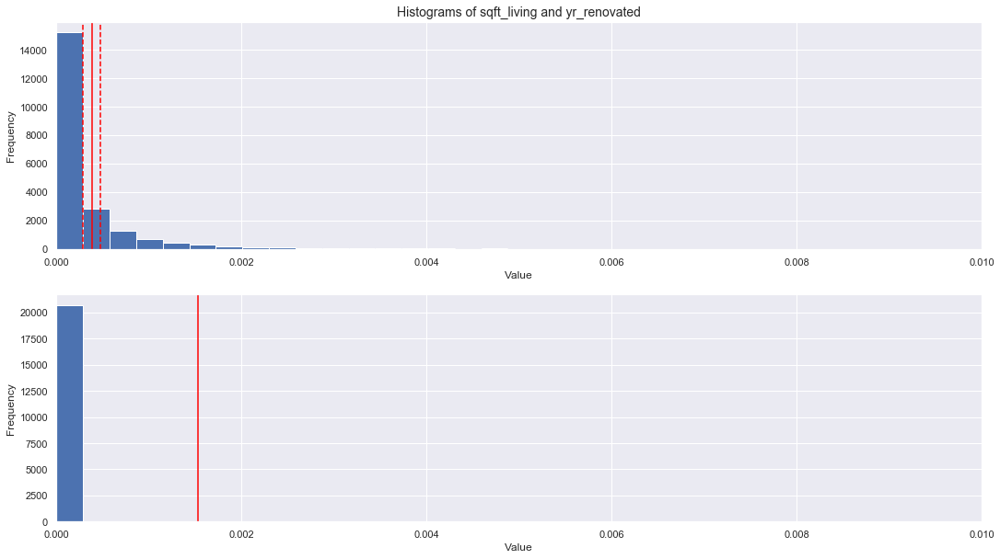


*** zipcode
DegFreedom     2.161201e+04
Difference     1.498712e-04
t-Statistic    2.122304e+01
PValue         5.984782e-99
Low95CI        1.360297e-04
High95CI       1.637127e-04
dtype: float64


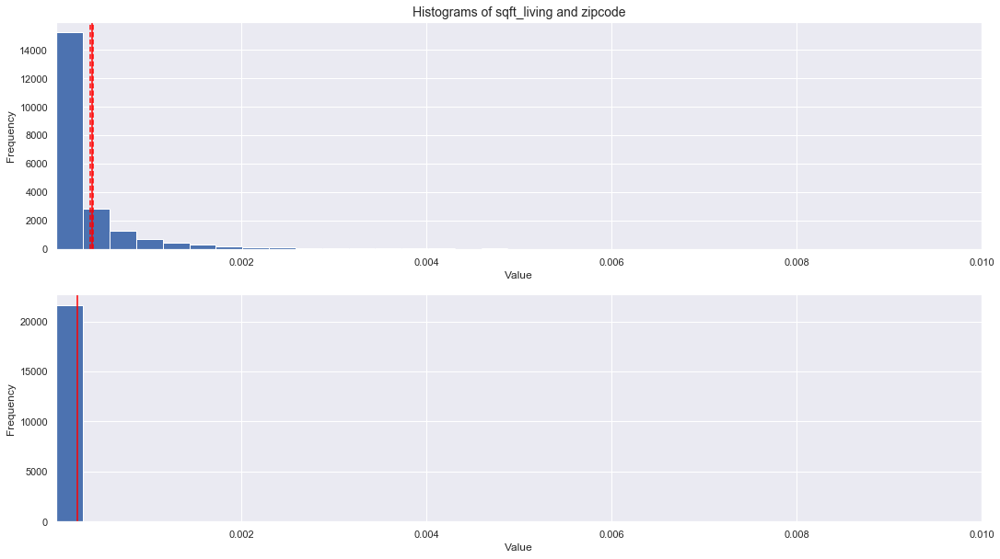


*** lat
DegFreedom     2.161228e+04
Difference     1.498647e-04
t-Statistic    2.122205e+01
PValue         6.109191e-99
Low95CI        1.360231e-04
High95CI       1.637062e-04
dtype: float64


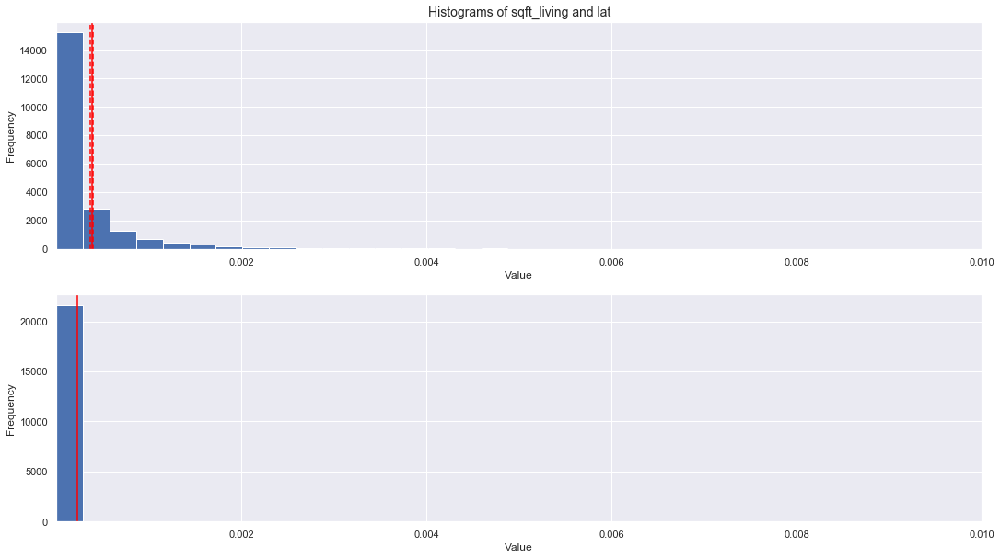


*** long
DegFreedom     2.161204e+04
Difference     1.498704e-04
t-Statistic    2.122291e+01
PValue         6.000292e-99
Low95CI        1.360289e-04
High95CI       1.637119e-04
dtype: float64


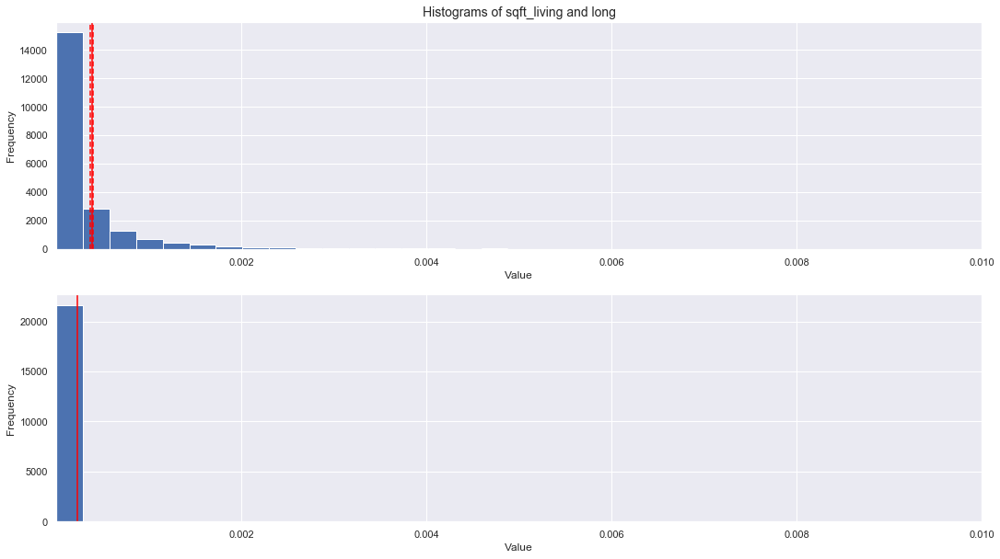


*** sqft_living15
DegFreedom     3.249270e+04
Difference     5.512002e-05
t-Statistic    6.925980e+00
PValue         4.410171e-12
Low95CI        3.952117e-05
High95CI       7.071886e-05
dtype: float64


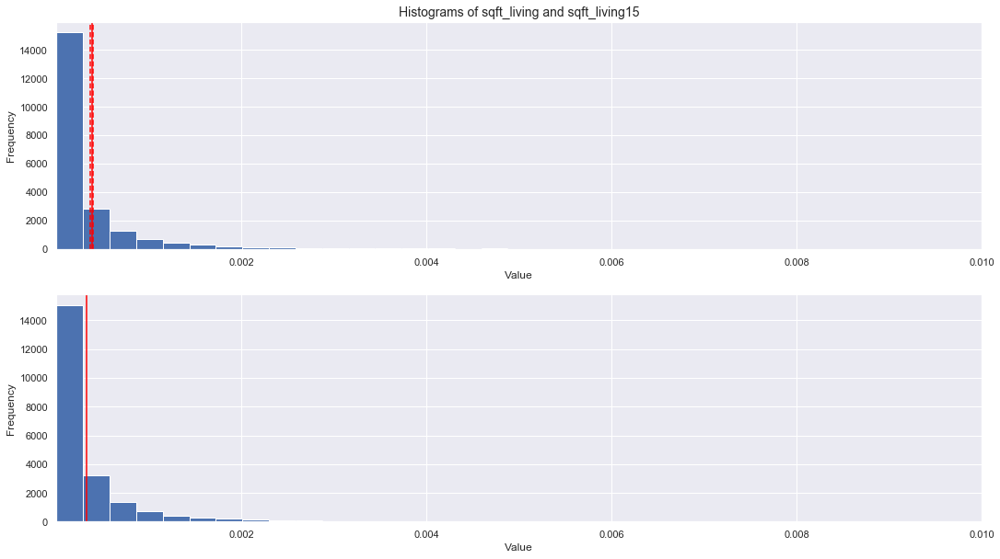


*** sqft_lot15
DegFreedom     2.193336e+04
Difference    -8.639352e-04
t-Statistic   -1.051015e+01
PValue         8.932991e-26
Low95CI       -1.025053e-03
High95CI      -7.028171e-04
dtype: float64


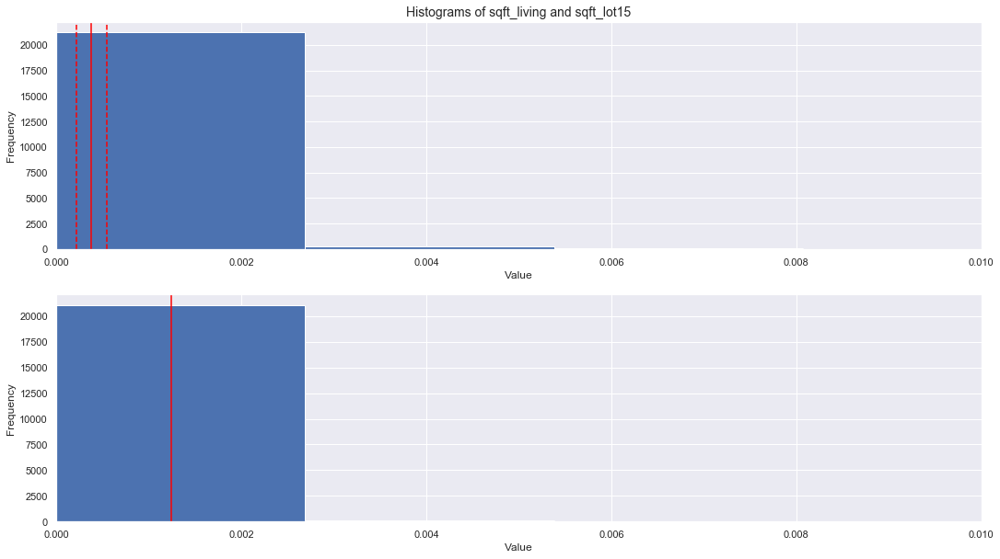

In [53]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['sqft_living', item]
    helperBay_tTest(bayesian_df, features)

### Feature: bathrooms  
> Based upon the results below, the following features accept the null hypothesis of feature 'bathrooms':
>       - floors
>       - sqft_living15


*** price
DegFreedom     2.243563e+04
Difference    -2.725063e-04
t-Statistic   -1.036652e+01
PValue         4.012808e-25
Low95CI       -3.240309e-04
High95CI      -2.209816e-04
dtype: float64


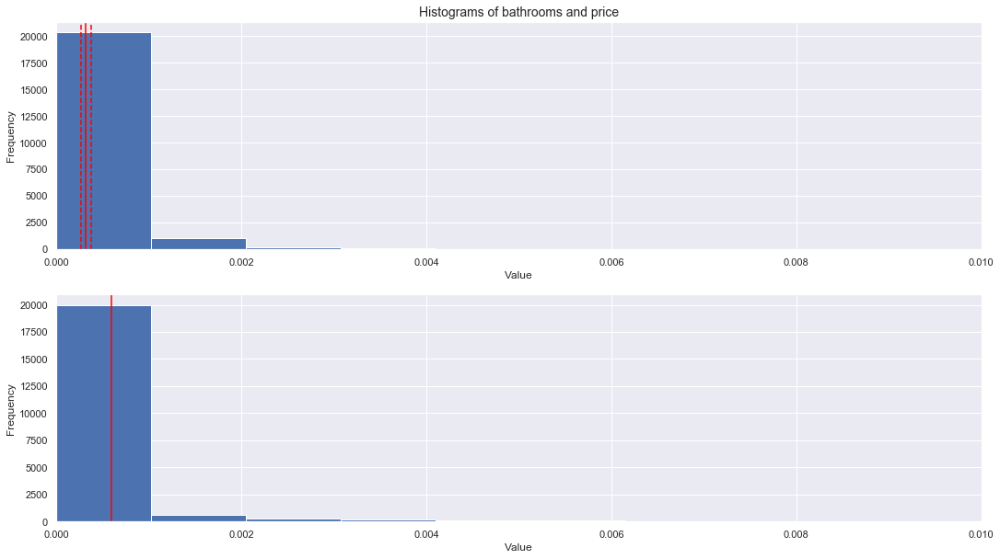


*** log_price
DegFreedom      2.183485e+04
Difference      8.979275e-05
t-Statistic     2.491141e+01
PValue         4.300333e-135
Low95CI         8.272770e-05
High95CI        9.685779e-05
dtype: float64


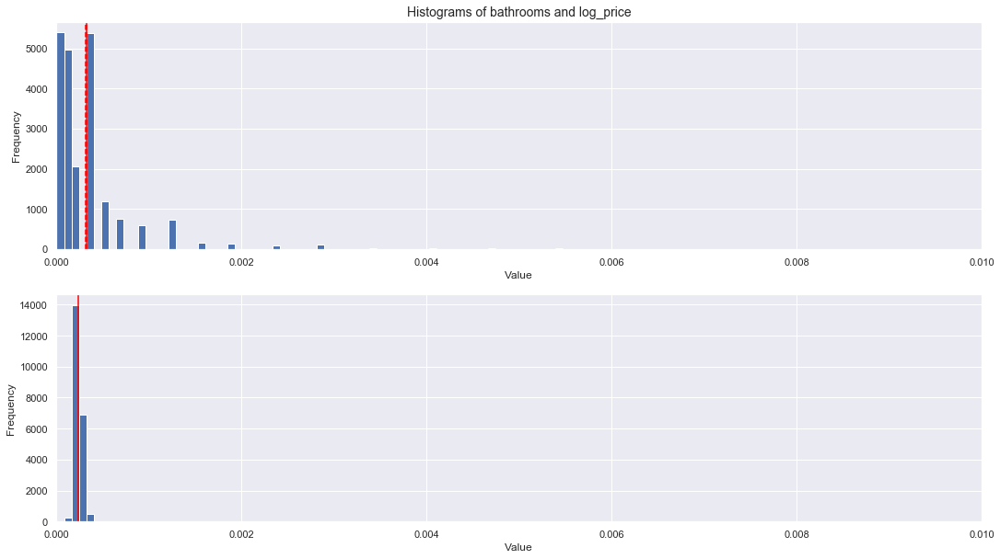


*** bedrooms
DegFreedom     32156.578982
Difference         0.000032
t-Statistic        4.091084
PValue             0.000043
Low95CI            0.000017
High95CI           0.000048
dtype: float64


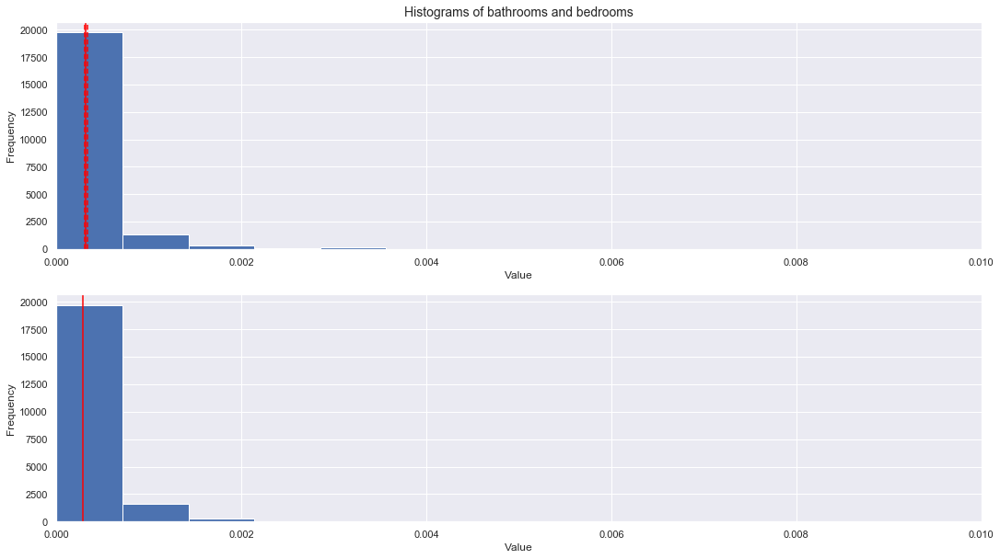


*** bathrooms

*** sqft_living
DegFreedom     3.211025e+04
Difference    -5.877120e-05
t-Statistic   -7.416636e+00
PValue         1.230972e-13
Low95CI       -7.430301e-05
High95CI      -4.323939e-05
dtype: float64


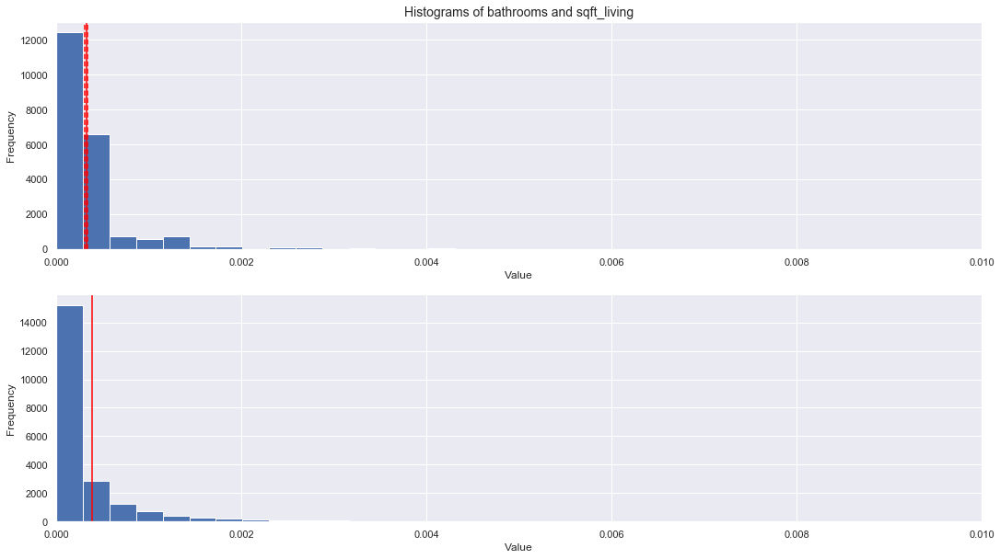


*** sqft_lot
DegFreedom     2.167638e+04
Difference    -8.339773e-04
t-Statistic   -8.945635e+00
PValue         3.988217e-19
Low95CI       -1.016710e-03
High95CI      -6.512449e-04
dtype: float64


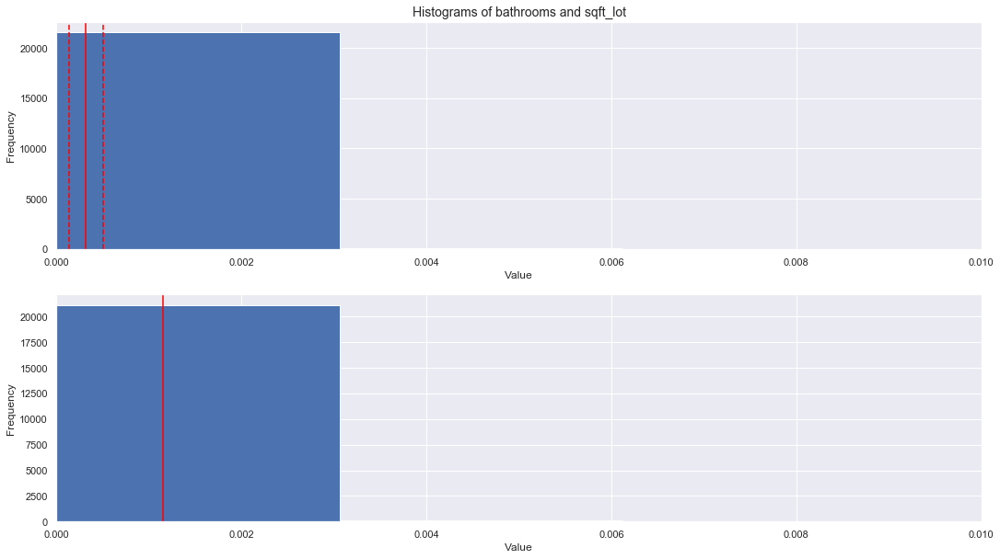


*** floors
DegFreedom     41877.906375
Difference        -0.000003
t-Statistic       -0.630009
PValue             0.528692
Low95CI           -0.000012
High95CI           0.000006
dtype: float64


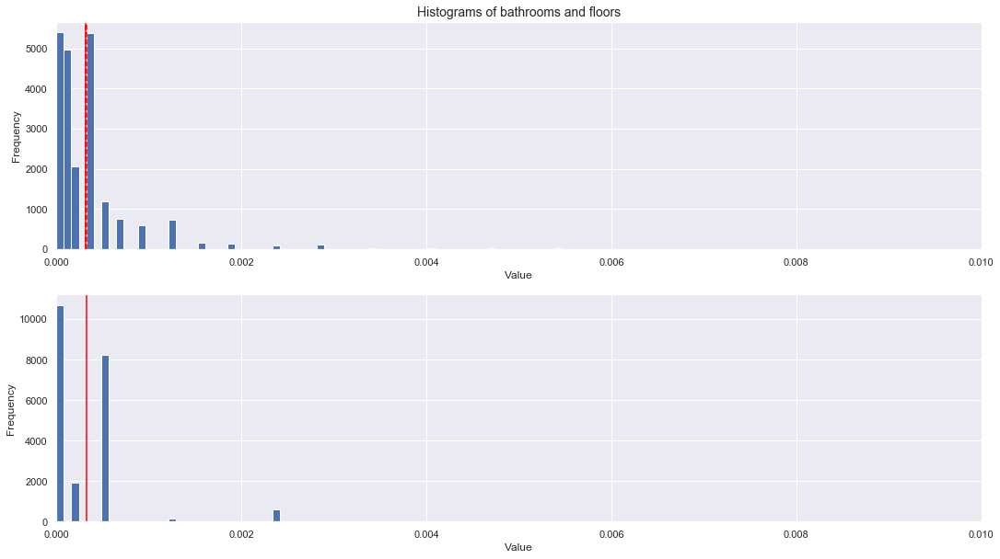


*** waterfront
DegFreedom     2.165281e+04
Difference    -1.179199e-03
t-Statistic   -1.007337e+01
PValue         8.175926e-24
Low95CI       -1.408647e-03
High95CI      -9.497507e-04
dtype: float64


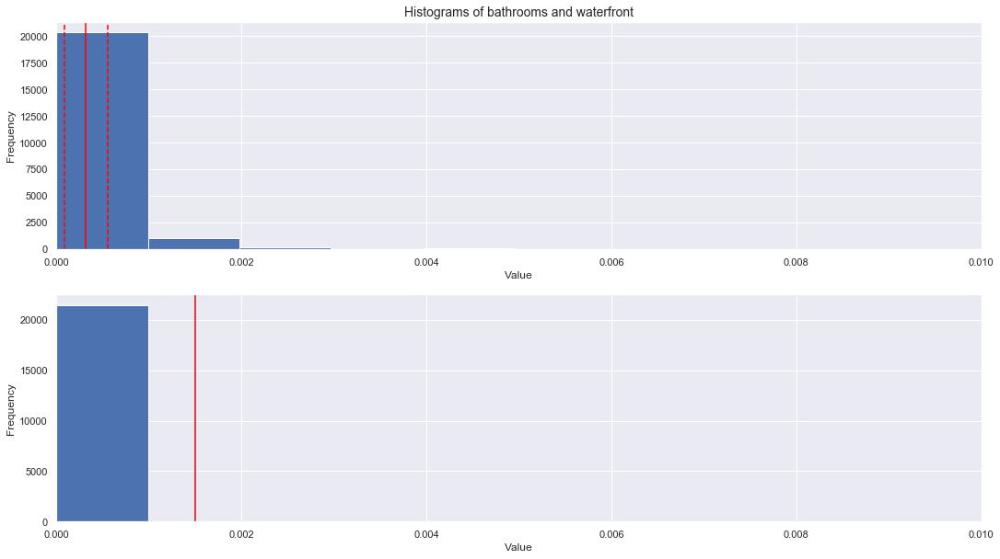


*** view
DegFreedom      2.201579e+04
Difference     -9.534628e-04
t-Statistic    -2.551483e+01
PValue         1.535552e-141
Low95CI        -1.026709e-03
High95CI       -8.802169e-04
dtype: float64


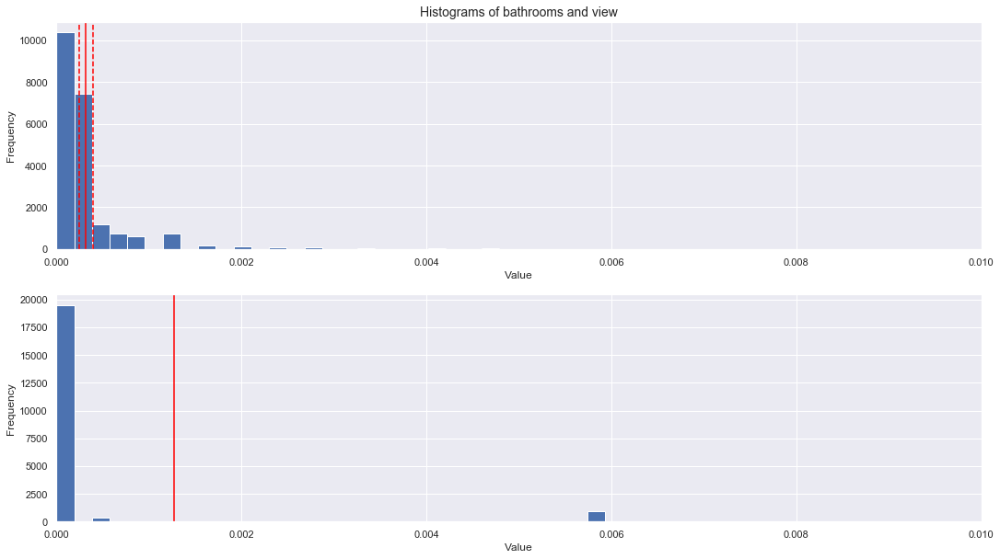


*** condition
DegFreedom     2.931612e+04
Difference     6.042564e-05
t-Statistic    1.544422e+01
PValue         1.342482e-53
Low95CI        5.275695e-05
High95CI       6.809434e-05
dtype: float64


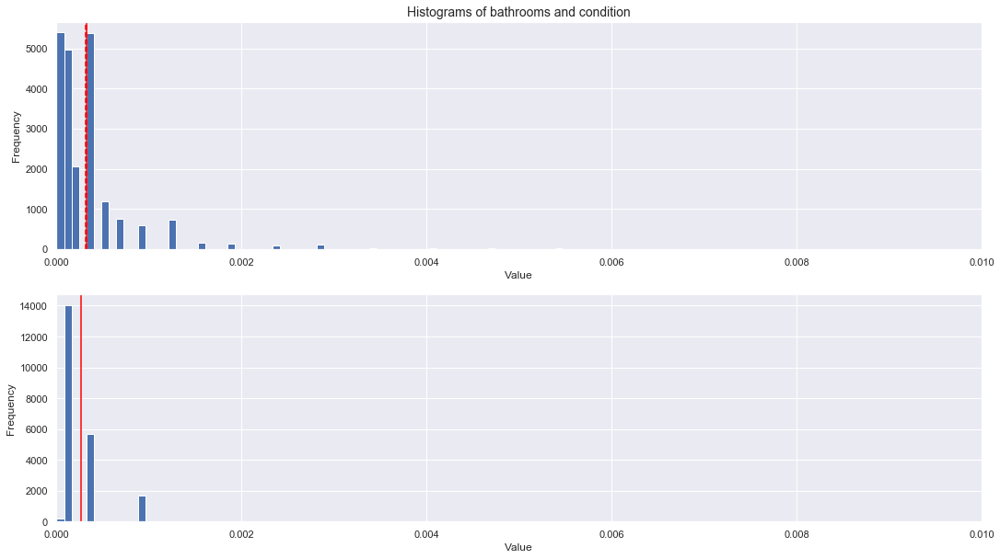


*** grade
DegFreedom     2.611625e+04
Difference     7.178134e-05
t-Statistic    1.899034e+01
PValue         7.087660e-80
Low95CI        6.437256e-05
High95CI       7.919013e-05
dtype: float64


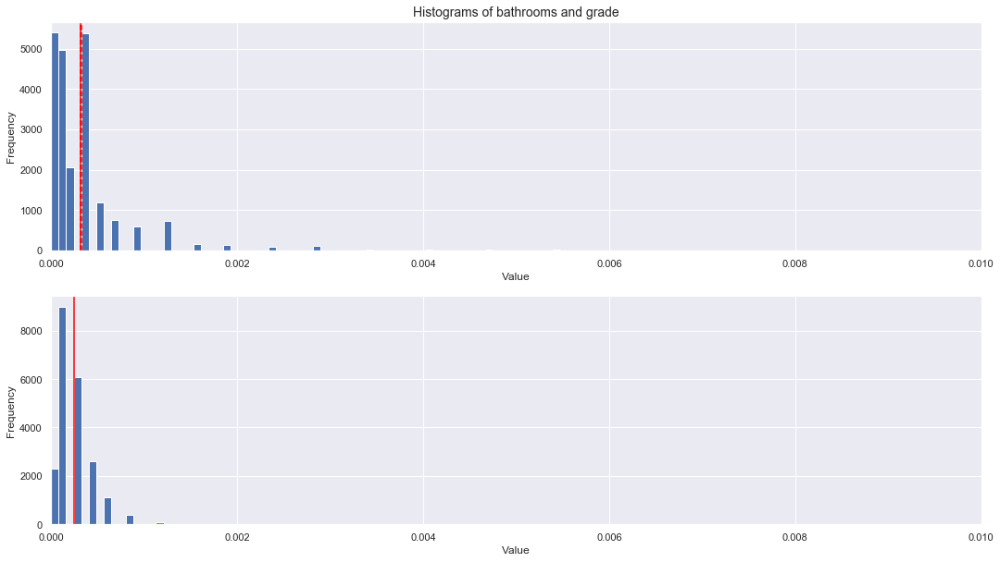


*** sqft_above
DegFreedom     3.320544e+04
Difference    -7.368915e-05
t-Statistic   -9.730006e+00
PValue         2.405675e-22
Low95CI       -8.853327e-05
High95CI      -5.884504e-05
dtype: float64


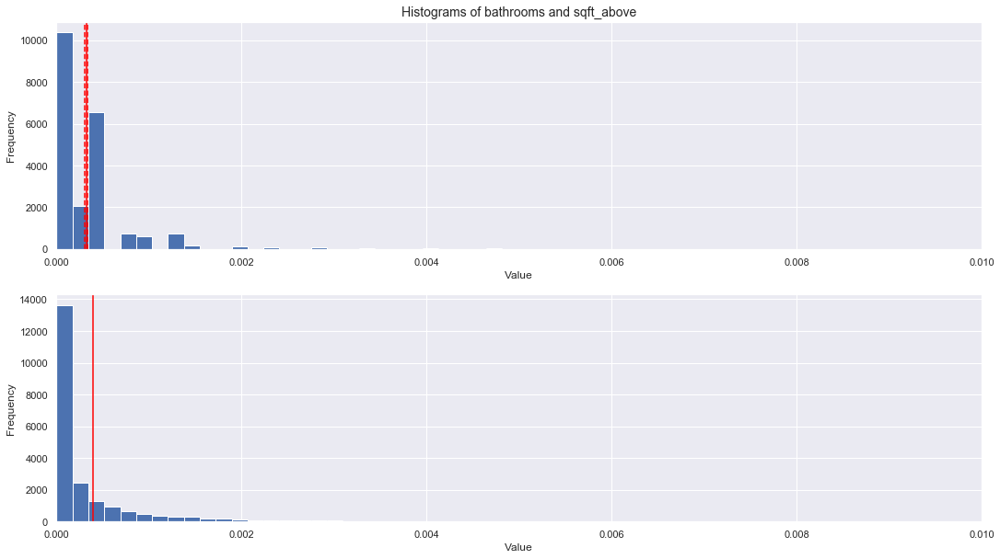


*** sqft_basement
DegFreedom      2.319656e+04
Difference     -4.414671e-04
t-Statistic    -2.310618e+01
PValue         8.364795e-117
Low95CI        -4.789162e-04
High95CI       -4.040181e-04
dtype: float64


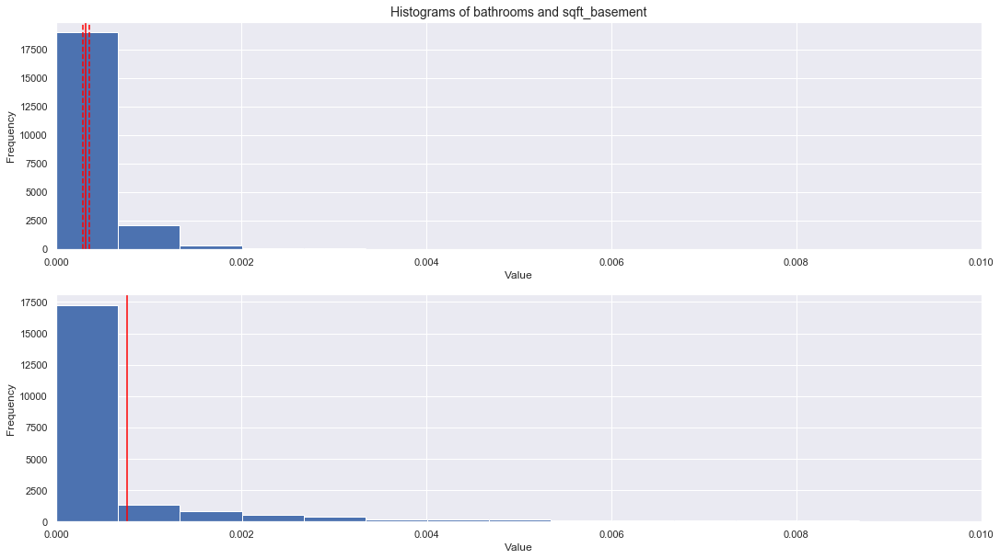


*** yr_built
DegFreedom      2.164020e+04
Difference      9.092450e-05
t-Statistic     2.528210e+01
PValue         5.223387e-139
Low95CI         8.387530e-05
High95CI        9.797371e-05
dtype: float64


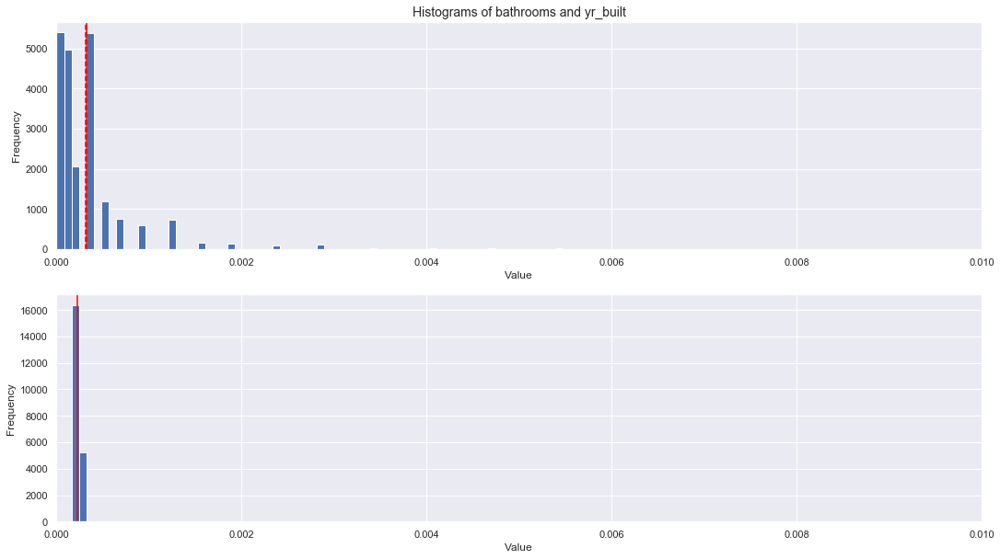


*** yr_renovated
DegFreedom      2.184018e+04
Difference     -1.208045e-03
t-Statistic    -2.434986e+01
PValue         3.070543e-129
Low95CI        -1.305288e-03
High95CI       -1.110802e-03
dtype: float64


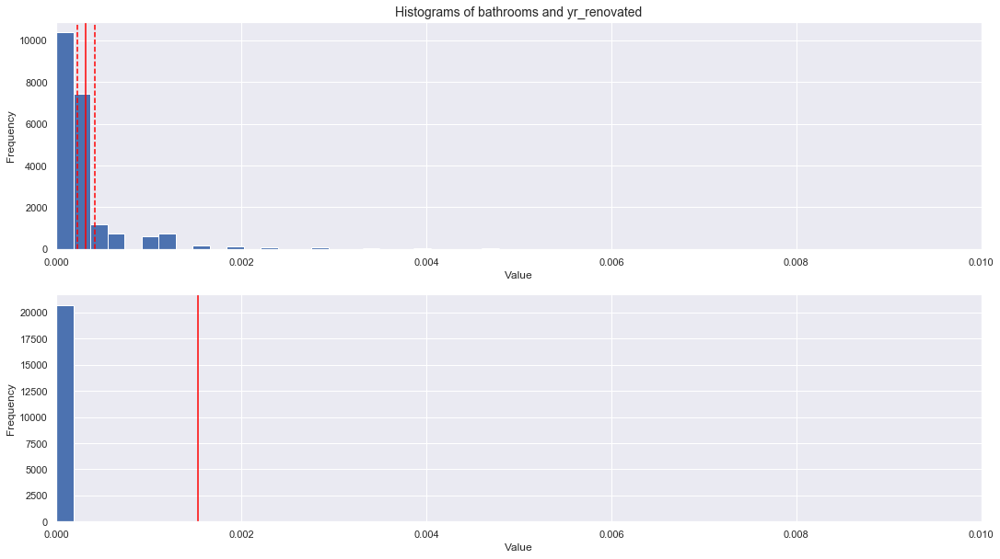


*** zipcode
DegFreedom      2.161204e+04
Difference      9.109999e-05
t-Statistic     2.533914e+01
PValue         1.290001e-139
Low95CI         8.405308e-05
High95CI        9.814690e-05
dtype: float64


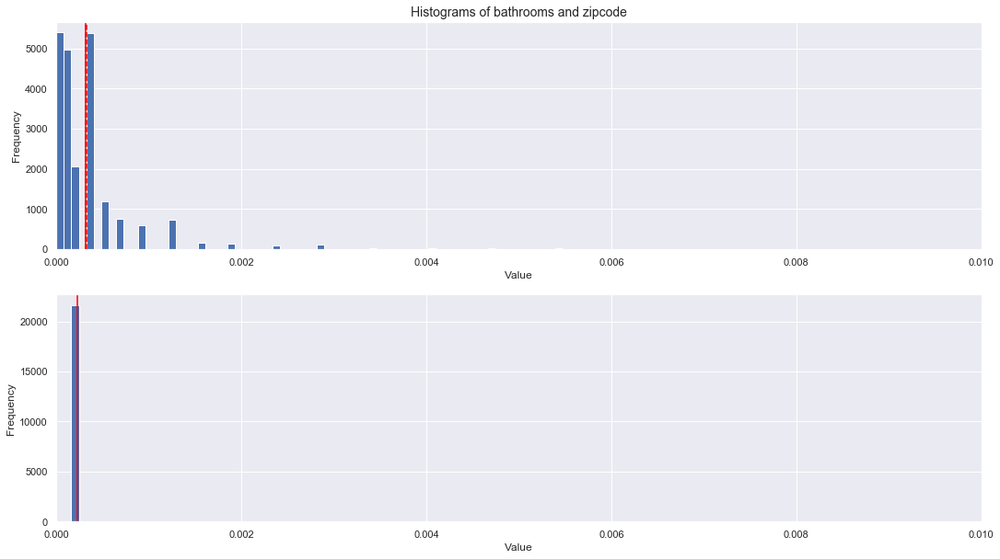


*** lat
DegFreedom      2.161309e+04
Difference      9.109348e-05
t-Statistic     2.533702e+01
PValue         1.358880e-139
Low95CI         8.404648e-05
High95CI        9.814048e-05
dtype: float64


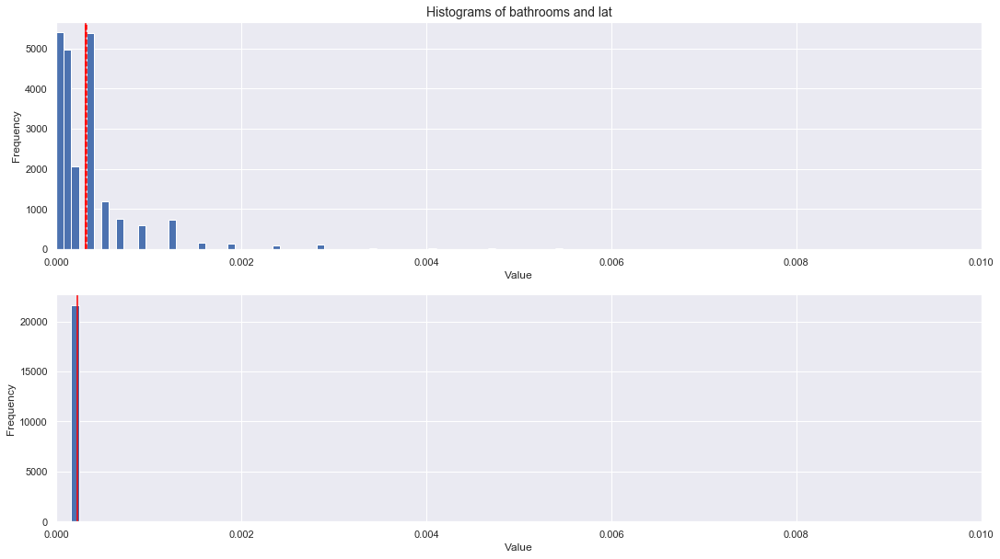


*** long
DegFreedom      2.161217e+04
Difference      9.109917e-05
t-Statistic     2.533888e+01
PValue         1.298470e-139
Low95CI         8.405225e-05
High95CI        9.814609e-05
dtype: float64


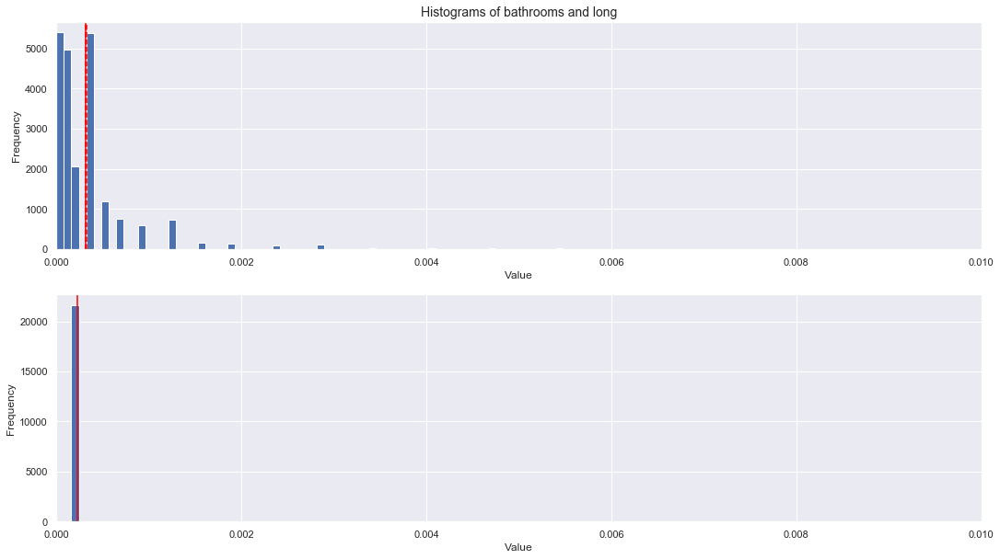


*** sqft_living15
DegFreedom     43205.696885
Difference        -0.000004
t-Statistic       -0.710683
PValue             0.477284
Low95CI           -0.000014
High95CI           0.000006
dtype: float64


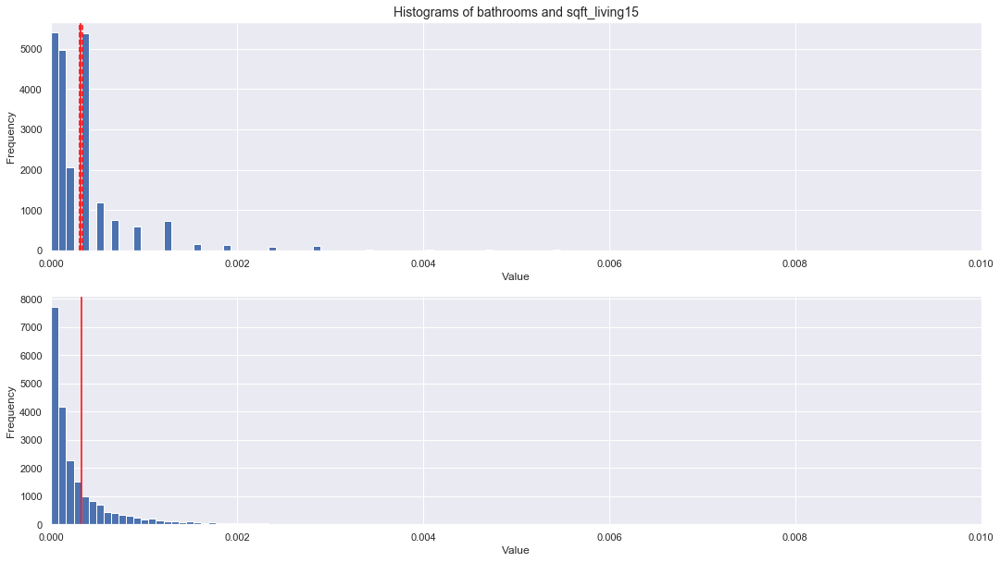


*** sqft_lot15
DegFreedom     2.169530e+04
Difference    -9.227064e-04
t-Statistic   -1.125594e+01
PValue         2.610765e-29
Low95CI       -1.083384e-03
High95CI      -7.620292e-04
dtype: float64


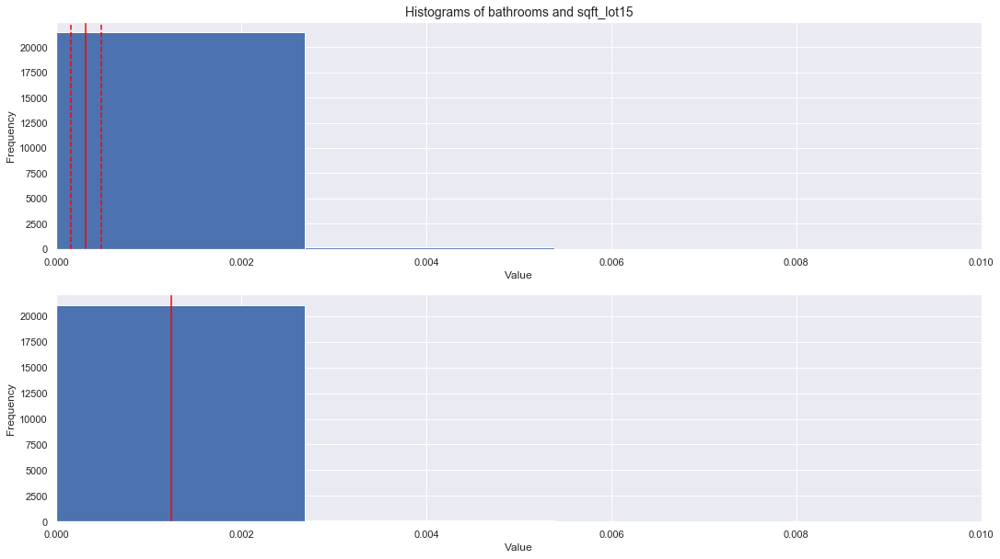

In [54]:
for item in features_A:
    print('\n*** ' + str(item))
    features = ['bathrooms', item]
    helperBay_tTest(bayesian_df, features)